In [1]:
from nltk.corpus import semcor
import pandas as pd
import numpy as np
from core.semcor_bert_pipeline import *

We look at types' frequency in SEMCOR and compute their entropy

## Creating a Dataframe of all the tags in SEMCOR

In [8]:
tagged_sents = nltk.corpus.semcor.tagged_sents(tag = 'sem')

In [9]:
sel = SemCorSelector()

In [49]:
for t in tagged_sents[0]:
    if type(t) == nltk.tree.Tree:
            print(str(t))

(Lemma('group.n.01.group') (NE Fulton County Grand Jury))
(Lemma('state.v.01.say') said)
(Lemma('friday.n.01.Friday') Friday)
(Lemma('probe.n.01.investigation') investigation)
(Lemma('atlanta.n.01.Atlanta') Atlanta)
(Lemma('late.s.03.recent') recent)
(Lemma('primary.n.01.primary_election') primary election)
(Lemma('produce.v.04.produce') produced)
(Lemma('evidence.n.01.evidence') evidence)
(Lemma('abnormality.n.04.irregularity') irregularities)
(Lemma('happen.v.01.take_place') took place)


In [50]:
tag_freqs = {}
for s in tagged_sents:
    for tok in s:
        if type(tok) == nltk.tree.Tree:
            if " (NE " not in str(tok): #Excluding named entities
                if tok.label() in tag_freqs.keys():
                    tag_freqs[tok.label()] += 1
                else:
                    tag_freqs[tok.label()] = 1

(Lemma('state.v.01.say') said)
(Lemma('friday.n.01.Friday') Friday)
(Lemma('probe.n.01.investigation') investigation)
(Lemma('atlanta.n.01.Atlanta') Atlanta)
(Lemma('late.s.03.recent') recent)
(Lemma('primary.n.01.primary_election') primary election)
(Lemma('produce.v.04.produce') produced)
(Lemma('evidence.n.01.evidence') evidence)
(Lemma('abnormality.n.04.irregularity') irregularities)
(Lemma('happen.v.01.take_place') took place)
(Lemma('jury.n.01.jury') jury)
(Lemma('far.r.02.far') further)
(Lemma('state.v.01.say') said)
(Lemma('term.n.02.term') term)
(Lemma('end.n.02.end') end)
(Lemma('presentment.n.01.presentment') presentments)
(Lemma('own.v.01.have') had)
(Lemma('overall.s.02.overall') over-all)
(Lemma('mission.n.03.charge') charge)
(Lemma('election.n.01.election') election)
(Lemma('deserve.v.01.deserve') deserves)
(Lemma('praise.n.01.praise') praise)
(Lemma('thanks.n.01.thanks') thanks)
(Lemma('manner.n.01.manner') manner)
(Lemma('election.n.01.election') election)
(Lemma('cond

(Lemma('state.n.03.state') state)
(Lemma('republican_party.n.01.GOP') GOP)
(Lemma('president.n.04.chairman') chairman)
(Lemma('state.v.01.say') said)
(Lemma('meeting.n.01.meeting') meeting)
(Lemma('hold.v.03.hold') held)
(Lemma('tuesday.n.01.Tuesday') Tuesday)
(Lemma('night.n.01.night') night)
(Lemma('bring.v.03.bring') brought)
(Lemma('enthusiastic.a.01.enthusiastic') enthusiastic)
(Lemma('reception.n.01.response') responses)
(Lemma('audience.n.01.audience') audience)
(Lemma('add.v.02.add') added)
(Lemma('enthusiasm.n.03.enthusiasm') enthusiasm)
(Lemma('turn_around.v.03.pick_up') picking up)
(Lemma('state.n.01.state') state)
(Lemma('rally.n.01.rally') rally)
(Lemma('hold.v.03.hold') held)
(Lemma('september.n.01.Sept') Sept.)
(Lemma('savannah.n.01.Savannah') Savannah)
(Lemma('newly.r.01.newly') newly)
(Lemma('elective.a.01.elected') elected)
(Lemma('texas.n.01.Texas') Texas)
(Lemma('be.v.02.be') be)
(Lemma('featured.s.01.featured') featured)
(Lemma('speaker.n.01.speaker') speaker)
(Lem

(Lemma('resolution.n.01.resolution') resolution)
(Lemma('resolution.n.01.resolution') resolution)
(Lemma('chuck.v.01.toss') tossed)
(Lemma('hopper.n.01.hopper') hopper)
(Lemma('friday.n.01.Friday') Friday)
(Lemma('formally.r.01.formally') formally)
(Lemma('read.v.03.read') read)
(Lemma('monday.n.01.Monday') Monday)
(Lemma('allege.v.01.say') says)
(Lemma('event.n.02.event') event)
(Lemma('supply.v.01.provide') provide)
(Lemma('increase.n.02.increase') increase)
(Lemma('federal.s.01.federal') federal)
(Lemma('fund.n.01.fund') funds)
(Lemma('direct.v.01.direct') directed)
(Lemma('give.v.10.give') give)
(Lemma('precedence.n.01.priority') priority)
(Lemma('teacher.n.01.teacher') teacher)
(Lemma('wage.n.01.pay') pay)
(Lemma('raise.n.01.raise') raises)
(Lemma('long.a.01.long') long)
(Lemma('hot.a.03.hot') hot)
(Lemma('controversy.n.01.controversy') controversy)
(Lemma('own.v.01.have') has)
(Lemma('new.a.01.new') new)
(Lemma('school_superintendent.n.01.school_superintendent')
  school
  superi

(Lemma('authorize.v.01.authorize') authorize)
(Lemma('establish.v.01.establish') establish)
(countywide.s.00 county-wide)
(Lemma('day_school.n.01.day_school') day schools)
(Lemma('deaf.n.01.deaf') deaf)
(Lemma('county.n.01.county') counties)
(Lemma('more.a.02.more') more)
(Lemma('population.n.03.population') population)
(Lemma('command.v.02.require') require)
(Lemma('deaf.a.01.deaf') deaf)
(Lemma('child.n.01.child') children)
(Lemma('six.s.01.6') 6)
(Lemma('thirteen.s.01.13') 13)
(Lemma('year.n.01.year') years)
(Lemma('aged.s.03.of_age') of age)
(Lemma('attend.v.01.attend') attend)
(Lemma('day_school.n.01.day_school') day schools)
(Lemma('permit.v.01.permit') permitting)
(older.a.00 older)
(Lemma('attend.v.01.attend') attend)
(Lemma('residential.a.02.residential') residential)
(Lemma('here.r.01.here') here)
(Lemma('operating_budget.n.01.operating_budget') Operating budget)
(Lemma('day_school.n.01.day_school') day schools)
(Lemma('five.s.01.five') five)
(Lemma('county.n.01.county') coun

(Lemma('statement.n.01.statement') Statements)
(Lemma('other.a.01.other') other)
(Lemma('legislator.n.01.legislator') legislators)
(Lemma('dallas.n.01.Dallas') Dallas)
(Lemma('pay.v.01.pay') paying)
(Lemma('water_development.n.01.water_program') water program)
(local.s.00 local)
(Lemma('bond.n.02.bond') bonds)
(Lemma('less.a.01.less') less)
(Lemma('populous.s.01.populous') populous)
(Lemma('place.n.04.place') places)
(Lemma('profit.v.01.benefit') benefit)
(Lemma('most.r.01.most') most)
(Lemma('pending.s.01.pending') pending)
(Lemma('bill.n.01.bill') bill)
(Lemma('not.r.01.not') not)
(Lemma('carry.v.23.sway') sway)
(Lemma('fire.n.09.attack') attack)
(Lemma('bill.n.01.bill') bill)
(Lemma('defender.n.01.defender') defenders)
(Lemma('be.v.02.be') were)
(Lemma('largely.r.01.mostly') mostly)
(Lemma('village.n.01.small_town') small-town)
(Lemma('legislator.n.01.legislator') legislators)
(Lemma('be.v.01.be') is)
(Lemma('poor.a.03.poor') poor)
(Lemma('boy.n.02.boy') boy)
(Lemma('bill.n.01.bill'

(Lemma('have.v.17.get') got)
(Lemma('five.s.01.five') five)
(Lemma('hit.n.01.hit') hits)
(Lemma('three.s.01.three') three)
(Lemma('run.n.01.run') runs)
(Lemma('take_over.v.03.take_over') took over)
(Lemma('top.n.04.top') top)
(Lemma('fourth.s.01.fourth') fourth)
(Lemma('buy.v.01.purchase') purchased)
(Lemma('last.s.01.last') last)
(Lemma('fall.n.01.fall') fall)
(Lemma('permit.v.01.allow') allowed)
(Lemma('hit.n.01.hit') hits)
(Lemma('scoreless.s.01.scoreless') scoreless)
(Lemma('three.n.01.three') three)
(Lemma('inning.n.01.inning') inning)
(Lemma('appearance.n.03.appearance') appearance)
(Lemma('deserve.v.01.merit') merited)
(Lemma('victory.n.01.triumph') triumph)
(Lemma('six.s.01.6') 6)
(Lemma('foot.n.02.foot') foot)
(Lemma('three.s.01.3') 3)
(Lemma('inch.n.01.inch') inch)
(pounder.n.00 pounder)
(Lemma('forfeit.v.01.give_up') gave up)
(Lemma('last.s.01.last') last)
(Lemma('two.s.01.two') two)
(Lemma('base_hit.n.01.safety') safeties)
(Lemma('concluding.s.01.final') final)
(Lemma('thre

(Lemma('successor.n.01.successor') successor)
(Lemma('helm.n.01.helm') helm)
(Lemma('plan.v.01.plan') plans)
(Lemma('bring.v.01.bring') bring)
(Lemma('entire.s.01.entire') entire)
(Lemma('new_york.n.01.New_York') New York)
(Lemma('team.n.01.squad') squad)
(Lemma('here.r.01.here') here)
(Lemma('st._petersburg.n.01.St._Petersburg') St. Petersburg)
(Lemma('include.v.01.include') including)
(Lemma('large.a.01.large') large)
(Lemma('crowd.n.01.crowd') crowds)
(Lemma('expect.v.01.anticipate') anticipated)
(Lemma('weekend.n.01.weekend') weekend)
(Lemma('game.n.03.game') games)
(Lemma('celebrated.s.01.famed') famed)
(NE Yankee Clipper)
(Lemma('nowadays.r.01.now') now)
(Lemma('retired.s.01.retired') retired)
(Lemma('assist.v.02.assist') assisting)
(Lemma('batting_coach.n.01.batting_coach') batting coach)
(Lemma('pitcher.n.01.pitcher') Pitcher)
(Lemma('join.v.01.join') joined)
(Lemma('baseball_club.n.01.club') club)
(Lemma('one.s.01.one') one)
(Lemma('week.n.01.week') week)
(Lemma('ago.r.01.ago'

(Lemma('list.v.02.list') listed)
(Lemma('roll.n.02.roster') roster)
(Lemma('right.a.01.right') right)
(Lemma('halfback.n.01.halfback') halfback)
(Lemma('position.n.09.position') position)
(Lemma('letter.v.01.letter') lettered)
(Lemma('team.n.01.team') team)
(Lemma('ask.v.01.ask') ask)
(Lemma('coach.n.01.coach') coach)
(Lemma('position.n.09.position') position)
(Lemma('play.v.01.play') plays)
(Lemma('receive.v.02.get') get)
(Lemma('quick.s.01.quick') quick)
(Lemma('answer.n.01.response') response)
(Lemma('place-kicker.n.01.place-kicker') place kicker)
(Lemma('pound.n.01.pound') pound)
(Lemma('six.s.01.6') 6)
(Lemma('foot.n.02.foot') foot)
(Lemma('one.s.01.1') 1)
(Lemma('inch.n.01.inch') inch)
(Lemma('senior.n.01.senior') senior)
(Lemma('drill.v.03.practice') practices)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('place_kick.n.01.place-kicking') place-kicking)
(Lemma('last.s.01.last') Last)
(Lemma('year.n.01.year') year)
(Lemma('exercise.v.04.work_out') worked out)
(Lemma('halfback.n.

(Lemma('game.n.02.game') game)
(Lemma('concluding.s.01.final') final)
(Lemma('play.n.03.play') play)
(Lemma('be.v.02.be') was)
(Lemma('long.a.02.long') long)
(Lemma('pass.n.03.pass') pass)
(Lemma('quarterback.n.01.quarterback') quarterback)
(Lemma('intercept.v.01.intercept') intercepted)
(Lemma('own.s.01.own') own)
(Lemma('return.v.07.return') returned)
(Lemma('twenty-two.s.01.22') 22)
(Lemma('yard.n.01.yard') yards)
(Lemma('merely.r.01.just') just)
(Lemma('lie.v.02.lie') lay)
(Lemma('there.r.01.there') there)
(Lemma('wait.v.01.wait') waited)
(Lemma('state.v.01.say') said)
(Lemma('about.r.07.almost') almost)
(Lemma('bring.v.01.bring') brought)
(Lemma('back.r.01.back') back)
(Lemma('all_the_way.r.01.all_the_way') all the way)
(Lemma('sophomore.n.01.sophomore') sophomore)
(Lemma('center.n.10.center') center)
(Lemma('fullback.n.01.fullback') fullback)
(Lemma('expect.v.01.expect') expects)
(Lemma('team.n.01.squad') squad)
(Lemma('be.v.01.be') be)
(Lemma('physically.r.01.physically') physic

(Lemma('complete.v.04.complete') Completing)
(Lemma('twelve.s.01.12') 12)
(Lemma('fifteen.s.01.15') 15)
(Lemma('base_on_balls.n.01.pass') passes)
(Lemma('yard.n.01.yard') yards)
(Lemma('own.v.01.have') had)
(Lemma('sum.n.05.total') total)
(Lemma('discourtesy.n.03.offense') offense)
(Lemma('yard.n.01.yard') yards)
(Lemma('lead.v.04.lead') leads)
(Lemma('game.n.02.game') game)
(Lemma('rush.n.07.rushing') rushing)
(Lemma('average.n.01.average') averages)
(Lemma('yard.n.01.yard') yards)
(Lemma('pass.n.03.passing') passing)
(Lemma('idle.a.01.idle') idle)
(Lemma('own.v.01.have') has)
(Lemma('best.a.01.best') best)
(Lemma('defensive.a.01.defensive') defensive)
(Lemma('record.n.03.record') record)
(Lemma('yard.n.01.yard') yards)
(Lemma('game.n.02.game') game)
(Lemma('own.v.01.have') has)
(Lemma('best.a.01.best') best)
(Lemma('defense.n.03.defense') defense)
(Lemma('base_on_balls.n.01.pass') passes)
(Lemma('yard.n.01.yard') yards)
(Lemma('game.n.02.game') game)
(Lemma('not.r.01.not') Not)
(Lemm

(Lemma('know.v.01.know') know)
(Lemma('reflex.n.01.reflex') reflexes)
(Lemma('be.v.01.be') are)
(Lemma('done_for.s.01.gone') gone)
(Lemma('not.r.01.not') not)
(Lemma('be.v.01.be') be)
(Lemma('twenty-fifth.s.01.25th') 25th)
(Lemma('man.n.01.man') man)
(Lemma('baseball_club.n.01.ball_club') ball club)
(Lemma('first.a.01.first') first)
(Lemma('word.n.02.word') word)
(Lemma('sudden.a.01.sudden') sudden)
(Lemma('walkout.n.01.walkout') walkout)
(Lemma('have.v.17.get') got)
(Lemma('merely.r.01.only') only)
(Lemma('six.s.01.six') six)
(Lemma('hit.n.01.hit') hits)
(Lemma('bat.n.02.at-bat') at-bats)
(Lemma('batting.n.01.batting') batting)
(Lemma('average.n.01.average') average)
(Lemma('first.a.01.first') first)
(Lemma('twelve.s.01.12') 12)
(Lemma('game.n.01.game') games)
(Lemma('take.v.09.take') took)
(Lemma('midnight.n.01.midnight') midnight)
(Lemma('train.n.01.train') train)
(Lemma('cleveland.n.01.Cleveland') Cleveland)
(Lemma('saturday.n.01.Saturday') Saturday)
(Lemma('official.a.01.official'

(out_of_action.s.00 out of action)
(due_to.s.00 due to)
(Lemma('injury.n.01.injury') injuries)
(Lemma('champion.n.01.champ') champs)
(Lemma('however.r.01.still') still)
(Lemma('mount.v.04.mount') mounted)
(Lemma('fifteen.s.01.15') 15)
(Lemma('hit.n.01.hit') hit)
(Lemma('attack.n.02.attack') attack)
(Lemma('parade.n.02.parade') parade)
(Lemma('eight.s.01.eight') eight)
(Lemma('pitcher.n.01.pitcher') pitchers)
(Lemma('most.a.02.most') most)
(Lemma('ever.r.01.ever') ever)
(Lemma('use.v.01.use') used)
(Lemma('one.s.01.one') one)
(Lemma('team.n.01.team') team)
(Lemma('series.n.04.series') series)
(Lemma('game.n.01.game') game)
(Lemma('surrogate.n.01.replacement') replacement)
(Lemma('slam.v.02.slam') slammed)
(Lemma('two.s.01.2') 2)
(Lemma('run.n.01.run') run)
(Lemma('homer.n.01.homer') homer)
(Lemma('rout.v.01.rout') routed)
(Lemma('loser.n.01.loser') loser)
(Lemma('five.s.01.5') 5)
(Lemma('run.n.01.run') run)
(Lemma('first.a.01.first') first)
(Lemma('inning.n.01.inning') inning)
(Lemma('s

(Lemma('attempt.n.01.effort') efforts)
(Lemma('figure.v.02.figure') figure)
(Lemma('prominently.r.01.prominently') prominently)
(Lemma('new.a.01.new') new)
(Lemma('stadium.n.01.stadium') stadium)
(Lemma('wife.n.01.wife') wife)
(Lemma('make.v.03.make') make)
(Lemma('home.n.01.home') home)
(Lemma('twenty.s.01.20') 20)
(Lemma('fifteen.s.01.15') 15)
(Lemma('nine.s.01.9') 9)
(Lemma('round_out.v.02.round_out') round out)
(Lemma('family.n.01.family') family)
(Lemma('be_born.v.01.be_born') was born)
(Lemma('manhattan.n.01.Manhattan') Manhattan)
(Lemma('attend.v.01.attend') attended)
(Lemma('trade.v.04.switch') switching)
(Lemma('washington.n.01.Washington') Washington)
(Lemma('play.v.01.play') played)
(Lemma('basketball.n.01.basketball') basketball)
(Lemma('there.r.01.there') there)
(Lemma('work.v.01.work') working)
(Lemma('law_degree.n.01.law_degree') law degree)
(Lemma('subsequently.r.01.later') Later)
(Lemma('own.v.01.own') owned)
(Lemma('operate.v.01.operate') operated)
(Lemma('long_island

(Lemma('iron.n.02.iron') iron)
(Lemma('stroke.n.01.shot') shot)
(Lemma('tee.n.01.tee') tee)
(Lemma('burrow.v.01.burrow') burrowed)
(Lemma('bunker.n.01.bunker') bunker)
(Lemma('guard.v.02.guard') guarding)
(Lemma('park.n.02.green') green)
(Lemma('embankment.n.01.embankment') embankment)
(Lemma('become.v.01.become') become)
(Lemma('soft.a.01.soft') soft)
(Lemma('spongy.s.01.spongy') spongy)
(Lemma('rain.n.01.rain') rains)
(Lemma('thereby.r.01.thereby') thereby)
(Lemma('bring.v.02.bring') bringing)
(local.s.00 local)
(Lemma('rule.n.01.rule') rules)
(Lemma('force.n.01.force') force)
(Lemma('remove.v.01.remove') remove)
(Lemma('ball.n.01.ball') ball)
(Lemma('ask.v.01.ask') asked)
(Lemma('official.n.02.official') official)
(Lemma('no.n.01.no') No)
(Lemma('state.v.01.say') said)
(Lemma('official.n.02.official') official)
(Lemma('play.v.01.play') play)
(Lemma('lie.v.01.lie') lies)
(Lemma('incorrect.a.01.wrong') wrong)
(Lemma('state.v.01.say') said)
(Lemma('man.n.01.man') man)
(Lemma('know.v.01

(Lemma('saint_louis.n.02.St._Louis') St. Louis)
(Lemma('baseball_club.n.01.club') club)
(Lemma('be.v.01.be') been)
(Lemma('may.n.01.May') May)
(Lemma('merely.r.01.just') just)
(Lemma('four.s.01.four') four)
(Lemma('time.n.01.time') times)
(Lemma('team.n.01.team') team)
(Lemma('be.v.01.be') was)
(Lemma('indifferent.s.09.so-so') so-so)
(Lemma('beginning.n.01.beginning') beginning)
(Lemma('then.r.01.then') then)
(Lemma('fall.v.03.fall') fell)
(Lemma('low.a.01.low') low)
(Lemma('may.n.01.May') May)
(Lemma('finish_up.v.02.finish') finishing)
(Lemma('victory.n.01.victory') victories)
(Lemma('be.v.01.be') were)
(Lemma('may.n.01.May') May)
(Lemma('end.v.03.end') ended)
(Lemma('victory.n.01.triumph') triumphs)
(Lemma('baseball_club.n.01.club') club)
(Lemma('acme.n.01.top') top)
(Lemma('then.r.01.then') Then)
(Lemma('last.s.01.last') last)
(Lemma('season.n.01.season') season)
(Lemma('tumble.v.01.tumble') tumbled)
(Lemma('low.a.01.low') low)
(Lemma('may.n.01.May') May)
(Lemma('recover.v.01.recove

(Lemma('bullnecked.s.01.bullnecked') bull-necked)
(Lemma('blond.a.01.blond') blond)
(Lemma('switch-hitter.n.01.switch-hitter') switch-hitter)
(Lemma('experience.v.03.have') had)
(one.s.00 one)
(Lemma('arresting.s.01.sensational') sensational)
(Lemma('triple-crown_season.n.01.triple-crown_season')
  triple-crown
  season)
(Lemma('bat.v.01.bat') batted)
(Lemma('besides.r.02.also') also)
(Lemma('precede.v.04.lead') led)
(Lemma('homer.n.01.home_run') home runs)
(Lemma('run_batted_in.n.01.rbi') RBIs)
(Lemma('batter.n.01.slugger') slugger)
(Lemma('terror.n.02.terror') terror)
(Lemma('experience.v.03.have') had)
(Lemma('season.n.01.season') seasons)
(Lemma('see.v.05.consider') considered)
(Lemma('ultimate.a.01.ultimate') ultimate)
(Lemma('most.a.01.most') most)
(Lemma('player.n.01.player') players)
(Lemma('not.r.01.not') not)
(Lemma('best.a.01.best') best)
(Lemma('year.n.01.year') years)
(Lemma('be.v.02.be') were)
(Lemma('score.v.01.hit') hit)
(Lemma('homer.n.01.homer') homers)
(Lemma('belt.v

(in_addition.r.00 In addition)
(Lemma('motor.n.01.motor') motor)
(Lemma('own.v.01.have') has)
(Lemma('cachet.n.01.seal_of_approval') seal of approval)
(Lemma('entail.v.01.mean') means)
(Lemma('be.v.01.be') is)
(Lemma('safe.a.01.safe') safe)
(unit.n.00 unit)
(consist_of.v.00 consists of)
(Lemma('small.a.01.small') small)
(Lemma('motor.n.01.motor') motor)
(Lemma('go_on.v.05.go_on') goes on)
(Lemma('plug_in.v.01.plug_in') plugged in)
(Lemma('speed.n.01.speed') speed)
(Lemma('control.v.02.control') controlled)
(Lemma('press.v.01.press') pressing)
(Lemma('two.s.01.two') two)
(Lemma('brake.n.01.brake') brake)
(Lemma('push_button.n.01.button') buttons)
(Lemma('located.s.01.located') located)
(Lemma('index.n.05.index_finger') index finger)
(Lemma('thumb.n.01.thumb') thumb)
(Lemma('put.v.01.place') placed)
(Lemma('hold.v.02.hold') holding)
(Lemma('motor.n.01.motor') motor)
(Lemma('brush.n.02.brush') brushes)
(Lemma('clean.v.01.clean') cleaned)
(Lemma('sterilize.v.01.sterilize') sterilized)
(Lem

(Lemma('poetry.n.01.poetry') poetry)
(Lemma('never.r.01.never') never)
(Lemma('get_around_to.v.01.get_around_to') get around to)
(Lemma('read.v.01.read') reading)
(Lemma('make.v.02.make') makes)
(Lemma('possible.a.01.possible') possible)
(Lemma('poet.n.01.poet') poets)
(Lemma('hear.v.01.hear') heard)
(Lemma('read.v.03.read') reading)
(Lemma('own.s.01.own') own)
(Lemma('work.n.02.work') work)
(Lemma('plan.n.01.program') program)
(Lemma('institute.v.02.institute') instituted)
(Lemma('release.n.01.release') releases)
(Lemma('be.v.01.be') are)
(Lemma('available.a.01.available') available)
(Lemma('entirely.r.02.only') only)
(Lemma('washington.n.01.Washington') Washington)
(Lemma('catalog.n.02.catalogue') catalogue)
(Lemma('be.v.01.be') is)
(Lemma('available.a.01.available') available)
(Lemma('for_the_asking.r.01.on_request') on request)
(Lemma('new.a.01.new') Newest)
(Lemma('list.n.01.list') list)
(Lemma('be.v.02.be') are)
(Lemma('two.s.01.two') Two)
(Lemma('poet.n.01.poet') poets)
(Lemma('

(Lemma('substitute.v.01.substitute') Substitute)
(Lemma('approved.s.01.approved') approved)
(Lemma('object.n.01.object') objects)
(Lemma('forbidden.s.01.forbidden') forbidden)
(Lemma('continue.v.01.keep') keep)
(Lemma('tell.v.02.tell') telling)
(Lemma('act.v.02.act') act)
(Lemma('submit.v.03.submit') submit)
(Lemma('natural.a.01.natural') natural)
(Lemma('desire.n.01.desire') desires)
(Lemma('day_in_and_day_out.r.01.all_the_time') all the time)
(Lemma('be.v.02.be') 's)
(Lemma('mother.n.01.mother') Mother)
(Lemma('love.n.01.love') love)
(Lemma('responsible.s.02.responsible_for') responsible for)
(Lemma('good.a.01.good') good)
(Lemma('behavior.n.01.behavior') behavior)
(Lemma('nuclear.a.01.nuclear') nuclear)
(Lemma('war.n.02.war') war)
(Lemma('already.r.01.already') already)
(Lemma('contend.v.06.fight') fought)
(Lemma('bomb.n.01.bomb') bombs)
(Lemma('not.r.01.not') not)
(Lemma('drop.v.02.drop') dropped)
(enemy.s.00 enemy)
(Lemma('target.n.03.target') targets)
(not_yet.r.00 not yet)
(Lemm

(weekly.a.00 weekly)
(Lemma('loss.n.01.loss') loss)
(Lemma('partially.r.01.partly') partly)
(Lemma('compensate.v.01.counterbalance') counterbalanced)
(Lemma('five_hundred.s.01.500') 500)
(Lemma('arrival.n.03.arrival') arrivals)
(Lemma('hebdomadally.r.01.each_week') each week)
(Lemma('hard.a.02.hard') hard)
(Lemma('truth.n.01.truth') truth)
(Lemma('state.v.01.say') says)
(Lemma('be.v.02.be') is)
(Lemma('isolation.n.03.closing_off') closing off)
(Lemma('intervention.n.02.interference') interference)
(Lemma('west.n.01.West') West)
(Lemma('use.n.01.use') use)
(Lemma('entirely.r.02.only') only)
(Lemma('east_german.a.01.East_German') East German)
(Lemma('discrete.s.01.distinct') distinct)
(Lemma('russian.a.01.Russian') Russian)
(Lemma('military_personnel.n.01.troops') troops)
(Lemma('be.v.01.be') was)
(Lemma('major.a.02.major') major)
(Lemma('communist.a.01.communist') Communist)
(Lemma('victory.n.01.victory') victory)
(Lemma('distribute.v.01.deal') dealt)
(Lemma('deadly.s.01.deadly') deadly

(Lemma('learn.v.04.study') studied)
(Lemma('extremist.s.01.radical') radical)
(Lemma('right.n.04.right') Right)
(Lemma('speculate.v.01.suppose') suppose)
(Lemma('words.n.01.words') words)
(Lemma('constitute.v.01.be') are)
(sole.s.00 sole)
(Lemma('basic.n.02.staple') staple)
(Lemma('trade.n.02.trade') trade)
(Lemma('be.v.01.be') are)
(Lemma('mentality.n.01.mentality') mentalities)
(Lemma('crave.v.01.crave') crave)
(Lemma('action.n.01.action') action)
(Lemma('get_down.v.07.begin') beginning)
(Lemma('catch_on.v.01.get_it') get it)
(Lemma('report.v.01.report') report)
(Lemma('page.n.01.page') page)
(Lemma('even.r.01.even') Even)
(Lemma('area.n.02.area') areas)
(Lemma('political.a.01.political') political)
(Lemma('intension.n.01.connotation') connotations)
(Lemma('intentionally.r.01.deliberately') deliberately)
(Lemma('leave.v.04.leave') left)
(Lemma('obscure.s.01.vague') vague)
(Lemma('spirit.n.02.spirit') spirit)
(Lemma('vigilantism.n.01.vigilantism') vigilantism)
(Lemma('go_around.v.02.s

(Lemma('not.r.01.not') Not)
(Lemma('then.r.03.then') then)
(Lemma('advise.v.02.notify') notified)
(Lemma('cut_short.v.01.cut_short') cut short)
(Lemma('los_angeles.n.01.Los_Angeles') Los Angeles)
(Lemma('engagement.n.05.booking') booking)
(Lemma('fly.v.01.fly') fly)
(Lemma('here.r.01.here') here)
(Lemma('open.v.02.open') open)
(Lemma('november.n.01.Nov') Nov.)
(Lemma('close_up.v.01.close') close)
(Lemma('december.n.01.Dec') Dec.)
(Lemma('short.a.01.short') Shorter)
(Lemma('engagement.n.05.booking') booking)
(Lemma('however.r.01.still') still)
(Lemma('engagement.n.05.booking') booking)
(Lemma('print.v.01.print') printed)
(Lemma('a_few.s.01.a_couple_of') A couple of)
(Lemma('day.n.01.day') days)
(Lemma('subsequently.r.01.later') later)
(Lemma('balletomane.n.01.balletomane') balletomane)
(Lemma('state.v.01.tell') told)
(Lemma('call.v.03.telephone') telephoned)
(Lemma('ticket.n.01.ticket') ticket)
(Lemma('information.n.01.information') information)
(Lemma('state.v.01.tell') told)
(Lemma('n

(Lemma('carry.v.23.persuade') persuaded)
(Lemma('restock.v.01.restock') restock)
(Lemma('byzantine.s.03.tangled') tangled)
(Lemma('estate.n.02.acres') acres)
(Lemma('pheasant.n.01.pheasant') pheasants)
(Lemma('poach.v.01.poach') poaches)
(Lemma('merely.r.01.only') only)
(Lemma('want.v.02.need') needs)
(Lemma('nutriment.n.01.nourishment') nourishment)
(Lemma('family.n.02.family') family)
(Lemma('local.a.01.local') local)
(Lemma('caller.n.01.caller') callers)
(Lemma('local.a.01.local') local)
(Lemma('caller.n.01.caller') callers)
(retired.s.00 retired)
(Lemma('brigadier.n.01.brigadier') brigadier)
(Lemma('apparently.r.01.apparently') apparently)
(Lemma('leftover.s.01.left_over') left over)
(Lemma('kipling.n.01.Kipling') Kipling)
(Lemma('narrative.n.01.tale') tales)
(Lemma('india.n.01.India') India)
(Lemma('do.v.08.do') does)
(Lemma('not.r.01.not') not)
(Lemma('approve.v.02.approve') approve)
(Lemma('manner.n.01.way') way)
(Lemma('get.v.01.get') gets)
(Lemma('bird.n.01.bird') birds)
(n't.

(Lemma('same.a.01.same') same)
(Lemma('time.n.01.time') time)
(Lemma('television.n.01.TV') TV)
(Lemma('serial.n.01.series') series)
(Lemma('popular.a.01.popular') popular)
(Lemma('art.n.02.art') arts)
(Lemma('prove.v.02.prove') proved)
(Lemma('again.r.01.again') again)
(Lemma('yield.v.01.give') giving)
(jazz.n.00 jazz)
(Lemma('ample.a.01.ample') ample)
(Lemma('breath.n.03.breathing_space') breathing space)
(Lemma('be.v.02.be') is)
(Lemma('most.r.01.most') most)
(Lemma('reasonable.a.01.sensible') sensible)
(Lemma('thing.n.02.thing') things)
(Lemma('producer.n.02.producer') producer)
(Lemma('make.v.01.do') do)
(Lemma('hour.n.01.hour') hour)
(Lemma('remember.v.03.remember') remembered)
(Lemma('about.r.07.almost') almost)
(Lemma('adrift.s.01.rudderless') rudderless)
(Lemma('motion.n.03.movement') movement)
(Lemma('score.n.04.score') score)
(jazz.n.00 jazz)
(Lemma('luminary.n.01.luminary') luminaries)
(Lemma('travel.v.01.go') went)
(Lemma('television_camera.n.01.camera') cameras)
(Lemma('dr

(turn_to.v.00 turned to)
(Lemma('opera.n.01.opera') opera)
(NE Beatrice di Tenda)
(Lemma('concert.n.01.concert') concert)
(Lemma('version.n.01.version') version)
(Lemma('introduce.v.01.introduce') introduced)
(Lemma('new_york.n.01.New_York') New York)
(Lemma('last.s.01.last') last)
(Lemma('season.n.01.season') season)
(Lemma('sing.v.01.sing') sing)
(NE La Sonambula)
(Lemma('here.r.01.here') here)
(next.s.01 next)
(Lemma('week.n.01.week') week)
(Lemma('musical.a.01.musical') musical)
(Lemma('table_tennis.n.01.Ping-Pong') Ping-pong)
(Lemma('truly.r.01.really') really)
(Lemma('quite.r.01.quite') quite)
(fun.s.00 fun -)
(Lemma('game.n.03.game') games)
(Lemma('necessitate.v.01.need') need)
(Lemma('stereo.n.01.stereo') stereo)
(Lemma('music.n.02.music') music)
(Lemma('system.n.01.system') system)
(Lemma('loudspeaker.n.01.speaker') speakers)
(Lemma('preferably.r.01.preferably') preferably)
(Lemma('put.v.01.place') placed)
(Lemma('at_least.r.02.at_least') at least)
(Lemma('seven.s.01.seven') s

(Lemma('many.a.01.many') many)
(Lemma('corner.n.01.corner') corners)
(Lemma('earth.n.01.globe') globe)
(Lemma('state.v.01.say') said)
(Lemma('major.a.03.major') major)
(Lemma('source.n.02.source') source)
(Lemma('impression.n.01.impression') impressions)
(Lemma('state.n.04.country') country)
(Lemma('be.v.03.be') are)
(Lemma('movie.n.01.movie') movies)
(Lemma('meet.v.01.meet') meet)
(Lemma('desire.v.01.want') want)
(Lemma('future_day.s.01.future_day') future-day)
(Lemma('tell.v.03.recount') recounting)
(Lemma('saga.n.01.saga') saga)
(Lemma('united_states.n.01.America') America)
(Lemma('movie.n.01.movie') movies)
(Lemma('premier.s.01.prime') prime)
(Lemma('source.n.02.source') source)
(Lemma('cognition.n.01.knowledge') knowledge)
(Lemma('much.n.01.much') much)
(Lemma('earth.n.01.globe') globe)
(Lemma('hollywood.n.01.Hollywood') Hollywood)
(Lemma('be.v.01.be') is)
(Lemma('precisely.r.01.just') just)
(Lemma('premier.s.01.prime') prime)
(Lemma('if_not.r.01.if_not') if not)
(sole.s.00 sole)


(Lemma('drop.v.07.drop') dropped)
(earlier.s.00 earlier)
(Lemma('delightful.s.01.delightful') delightful)
(Lemma('hamming.n.01.hamming') hamming)
(Lemma('be.v.01.be') is)
(Lemma('approximately.r.01.about') about)
(only.s.00 only)
(Lemma('manner.n.01.way') way)
(Lemma('treat.v.01.handle') handle)
(Lemma('old.a.01.old') old)
(Lemma('warhorse.n.01.warhorse') war horse)
(called.s.00 called)
(NE Charley's Aunt)
(Lemma('let.v.01.let') let)
(Lemma('collocate_with.v.01.go_with') go with)
(Lemma('sympathetic.a.04.appealing') appealing)
(Lemma('ask.v.02.ask') ask)
(Lemma('concisely.r.01.in_brief') In brief)
(Lemma('act.v.03.play') played)
(Lemma('not.r.01.not') not)
(Lemma('large.a.01.big') big)
(Lemma('audience.n.01.audience') audience)
(Lemma('get_down.v.07.start') started)
(Lemma('applaud.v.01.applaud') applauding)
(Lemma('even.r.01.even') even)
(Lemma('end.v.01.finish') finished)
(Lemma('whole.a.01.whole') whole)
(Lemma('production.n.02.production') production)
(Lemma('week.n.01.week') week)

(Lemma('at_least.r.01.at_least') at least)
(Lemma('reassuring.a.01.reassuring') reassuring)
(Lemma('witness.v.02.see') see)
(Lemma('some.a.01.some') some)
(Lemma('adolescent.n.01.teenager') teenagers)
(n't.r.00 n't)
(Lemma('profess.v.01.profess') profess)
(Lemma('know.v.02.know') know)
(Lemma('all.a.01.all') all)
(Lemma('answer.n.01.answer') answers)
(Lemma('think_about.v.01.think_about') thinking about)
(Lemma('problem.n.01.problem') problems)
(Lemma('alternatively.r.01.instead') instead)
(NE Where the Boys Are)
(Lemma('besides.r.02.also') also)
(Lemma('have.v.02.have') has)
(Lemma('juvenile.a.01.juvenile') juvenile)
(Lemma('bounce.n.01.bounce') bounce)
(Lemma('bring.v.03.make_for') makes for)
(Lemma('bracing.s.01.refreshing') refreshing)
(Lemma('venture.n.01.venture') venture)
(Lemma('comedy.n.01.comedy') comedy)
(Lemma('be.v.05.be') are)
(Lemma('some.a.01.some') some)
(Lemma('acute.s.03.sharp') sharp)
(Lemma('snappy.s.02.whipping') whipping)
(Lemma('line.n.05.line') lines)
(Lemma('s

(quaint.s.00 quaint)
(Lemma('concern.n.02.concern') concern)
(Lemma('enchantress.n.02.witch') witches)
(Lemma('devil.n.02.devil') devils)
(Lemma('supply.v.01.provide') provides)
(immediate.s.01 immediate)
(Lemma('problem.n.02.problem') problem)
(Lemma('opening.a.01.opening') opening)
(Lemma('scene.n.06.scene') scene)
(Lemma('be.v.01.be') is)
(Lemma('quite.r.01.quite') quite)
(Lemma('normal.a.01.normal') normal)
(Lemma('community.n.01.community') community)
(Lemma('conversation.n.01.conversation') conversation)
(Lemma('character.n.04.character') characters)
(Lemma('make.v.03.create') creates)
(Lemma('atmosphere.n.01.atmosphere') atmosphere)
(Lemma('suggest.v.05.suggest') suggesting)
(Lemma('usual.a.01.usual') usual)
(Lemma('assortment.n.01.mixture') mixture)
(Lemma('pleasure.n.01.pleasure') pleasures)
(Lemma('idiosyncrasy.n.01.foible') foibles)
(Lemma('irritation.n.01.irritation') irritations)
(Lemma('concern.n.02.concern') concerns)
(Lemma('characterize.v.02.characterize') characterize

(Lemma('apart.r.02.apart') Apart)
(Lemma('spirit.n.01.spirit') spirit)
(Lemma('exist.v.01.be') be)
(Lemma('community.n.01.community') community)
(Lemma('be.v.02.be') is)
(Lemma('spirit.n.01.spirit') spirit)
(draw.v.00 draws)
(man.n.00 men)
(Lemma('community.n.01.community') community)
(Lemma('give.v.01.give') gives)
(Lemma('community.n.01.community') community)
(Lemma('integrity.n.01.unity') unity)
(Lemma('coherence.n.01.cohesiveness') cohesiveness)
(Lemma('permanence.n.01.permanence') permanence)
(Lemma('think.v.03.think') Think)
(Lemma('for_example.r.01.for_example') for example)
(spirit.n.1;2 spirit)
(Lemma('united_states_marine_corps.n.01.Marine_Corps') Marine Corps)
(Lemma('surely.r.01.surely') Surely)
(Lemma('exist.v.01.be') is)
(Lemma('world.n.03.reality') reality)
(acknowledge.v.00 acknowledge)
(Lemma('naturally.r.01.of_course') of course)
(Lemma('impute.v.01.assign') assign)
(Lemma('substance.n.01.substance') substance)
(Lemma('be.v.01.be') is)
(Lemma('not.r.01.not') not)
(Lem

(Lemma('however.r.01.however') However)
(Lemma('even.r.01.even') even)
(Lemma('latent.s.01.latent') latent)
(Lemma('demand.n.01.demand') demand)
(Lemma('demythologization.n.01.demythologization') demythologization)
(Lemma('be.v.01.be') is)
(Lemma('not.r.01.not') not)
(Lemma('about.r.07.nearly') nearly)
(Lemma('widespread.s.01.widespread') widespread)
(Lemma('claim.v.01.claim') claiming)
(Lemma('at_least.r.01.at_least') at least)
(Lemma('civilized.s.02.cultured') cultured)
(Lemma('component.n.01.element') elements)
(Lemma('population.n.01.population') population)
(Lemma('tend.v.01.tend') tends)
(Lemma('exist.v.01.be') be)
(Lemma('about.r.07.almost') almost)
(Lemma('complete.a.01.complete') complete)
(Lemma('indifference.n.01.indifference') indifference)
(Lemma('church.n.01.church') church)
(Lemma('traditional.a.01.traditional') traditional)
(Lemma('message.n.02.message') message)
(Lemma('sin.n.01.sin') sin)
(Lemma('grace.n.01.grace') grace)
(Lemma('to_be_sure.r.01.to_be_sure') To be sur

(Lemma('however.r.03.however') However)
(Lemma('much.n.01.much') much)
(Lemma('knock.v.06.criticize') criticize)
(Lemma('broad.s.08.liberal') liberal)
(Lemma('theology.n.01.theology') theology)
(Lemma('constructive.a.01.constructive') constructive)
(Lemma('formulation.n.03.formulation') formulations)
(Lemma('theology.n.01.theology') theology)
(Lemma('endeavor.v.01.strive') strive)
(Lemma('explicate.v.02.formulate') formulate)
(Lemma('entirely.r.02.only') only)
(Lemma('go.v.02.go') go)
(Lemma('beyond.r.01.beyond') beyond)
(Lemma('liberalism.n.01.liberalism') liberalism)
(Lemma('not.r.01.not') not)
(Lemma('affirm.v.02.affirm') affirming)
(Lemma('already.r.01.already') already)
(Lemma('take.v.01.take') taken)
(Lemma('decisive.a.01.decisive') decisive)
(Lemma('measure.n.01.step') step)
(Lemma('interrupt.v.04.break') breaking)
(Lemma('deadlock.n.01.deadlock') deadlock)
(Lemma('attempt.n.01.attempt') attempt)
(Lemma('explicate.v.02.formulate') formulate)
(such.s.00 such)
(Lemma('theology.n.0

(Lemma('protestant.a.01.Protestant') Protestant)
(Lemma('clergy.n.01.clergy') clergy)
(Lemma('largely.r.01.for_the_most_part') for the most part)
(Lemma('wear.v.01.wear') wear)
(Lemma('grey.n.06.gray') gray)
(Lemma('variant.s.01.variant') variant)
(Lemma('wholly.r.01.wholly') wholly)
(Lemma('black.a.01.black') black)
(Lemma('suit.n.01.suit') suit)
(Lemma('clerical_collar.n.01.Roman_collar') Roman collar)
(Lemma('black.a.01.black') black)
(Lemma('attire.n.01.garb') garb)
(Lemma('normally.r.01.usually') usually)
(Lemma('identify.v.01.identify') identify)
(Lemma('england.n.01.England') England)
(Lemma('roman_catholic.n.01.Roman_Catholic') Roman Catholic)
(Lemma('cleric.n.01.cleric') cleric)
(Lemma('anyhow.r.01.in_any_case') In any case)
(Lemma('always.r.01.always') always)
(Lemma('treat.v.01.treat') treated)
(Lemma('extreme.s.01.utmost') utmost)
(Lemma('courtesy.n.01.courtesy') courtesy)
(Lemma('englishman.n.01.Englishman') Englishmen)
(Lemma('even.r.01.even') even)
(Lemma('anti.a.01.anti

(Lemma('many.a.01.many') Many)
(Lemma('english.a.01.English') English)
(Lemma('catholic.n.01.Catholic') Catholics)
(Lemma('be.v.01.be') are)
(Lemma('gallant.s.03.proud') proud)
(Lemma('catholicism.n.01.Catholicism') Catholicism)
(Lemma('know.v.03.know') know)
(Lemma('be.v.03.be') are)
(Lemma('new.a.01.new') new)
(Lemma('dominance.n.02.ascendancy') ascendancy)
(NE London Universe)
(Lemma('give.v.18.devote') devoted)
(Lemma('centennial.a.01.centenary') centenary)
(Lemma('issue.n.02.issue') issue)
(Lemma('last.s.01.last') last)
(Lemma('december.n.01.December') December)
(Lemma('eight.s.01.8') 8)
(Lemma('map.v.04.map_out') mapping out)
(Lemma('assorted.s.02.various') various)
(Lemma('aspect.n.01.aspect') aspects)
(Lemma('catholic.a.01.Catholic') Catholic)
(Lemma('advancement.n.03.progress') progress)
(Lemma('last.s.01.last') last)
(Lemma('hundred.s.01.one_hundred') one hundred)
(Lemma('year.n.01.year') years)
(Lemma('traditional.s.02.traditional') traditional)
(Lemma('chauvinistic.s.02.nat

(Lemma('be.v.02.be') was)
(Lemma('first.a.01.first') first)
(Lemma('time.n.01.time') time)
(Lemma('english.a.01.English') English)
(Lemma('archpriest.n.01.primate') Primate)
(Lemma('make.v.01.do') done)
(Lemma('fourteenth.s.01.14th') 14th)
(Lemma('century.n.01.century') century)
(Lemma('english.a.01.English') English)
(Lemma('catholic.n.01.Catholic') Catholics)
(Lemma('react.v.01.react') reacted)
(Lemma('event.n.01.event') event)
(Lemma('moderate.a.01.moderate') moderate)
(Lemma('real.a.01.real') real)
(Lemma('hope.n.02.hope') hope)
(Lemma('about.r.07.almost') Almost)
(daily.a.00 daily)
(Lemma('report.v.01.report') reported)
(Lemma('feed.v.03.feed') feeds)
(Lemma('catholic.a.01.Catholic') Catholic)
(Lemma('hope.n.02.hope') hope)
(Lemma('england.n.01.England') England)
(Lemma('statistic.n.01.statistic') statistics)
(Lemma('increasing.a.01.increasing') increasing)
(Lemma('number.n.02.number') numbers)
(Lemma('convert.n.01.convert') converts)
(Lemma('irish.n.01.Irish') Irish)
(Lemma('cath

(Lemma('condition.n.02.condition') conditions)
(man.n.00 man)
(Lemma('not.r.01.not') not)
(Lemma('observe.v.06.keep') keep)
(Lemma('therefore.r.01.thus') thus)
(Lemma('become.v.01.become') became)
(Lemma('mortal.a.01.mortal') mortal)
(Lemma('not.r.01.not') not)
(Lemma('discontinue.v.01.stop') stop)
(Lemma('be.v.01.be') being)
(Lemma('human.a.03.human') human)
(Lemma('consequence.n.01.result') result)
(Lemma('exist.v.01.be') is)
(Lemma('justification.n.01.justification') justification)
(Lemma('systematize.v.01.systematize') systematizing)
(Lemma('random.a.01.random') random)
(Lemma('argument.n.01.statement') statements)
(Lemma('persona.n.02.image') image)
(Lemma('god.n.01.God') God)
(Lemma('take.v.06.read') reading)
(Lemma('imprecise.a.01.imprecise') imprecise)
(Lemma('use.n.01.usage') usage)
(Lemma('later.s.01.later') later)
(Lemma('theological.a.01.theological') theological)
(Lemma('differentiation.n.01.distinction') distinction)
(Lemma('persona.n.02.image') image)
(Lemma('god.n.01.Go

(Lemma('perennial.s.03.repeated') repeated)
(Lemma('attempt.n.01.effort') efforts)
(Lemma('christian.a.01.Christian') Christian)
(Lemma('history.n.01.history') history)
(Lemma('describe.v.01.describe') describe)
(Lemma('death.n.02.death') death)
(Lemma('wholly.r.01.altogether') altogether)
(Lemma('consequence.n.01.consequence') consequence)
(Lemma('human.a.01.human') human)
(Lemma('sin.n.01.sin') sin)
(Lemma('prove.v.02.show') show)
(Lemma('two.s.01.two') two)
(Lemma('aspect.n.02.aspect') aspects)
(Lemma('death.n.02.death') death)
(Lemma('distinguish.v.01.separate') separated)
(such.s.00 Such)
(Lemma('attempt.n.01.effort') efforts)
(Lemma('about.r.07.almost') almost)
(Lemma('always.r.01.always') always)
(Lemma('witness.v.02.find') find)
(compelled.s.00 compelled)
(Lemma('ask.v.01.ask') ask)
(Lemma('adam.n.01.Adam') Adam)
(Lemma('create.v.02.create') created)
(Lemma('capable.a.01.capable') capable)
(Lemma('turn.v.07.grow') growing)
(Lemma('old.a.01.old') old)
(Lemma('then.r.01.and_then'

(Lemma('always.r.01.always') always)
(Lemma('have.v.01.have') had)
(Lemma('shapely.a.01.shapely') shapely)
(Lemma('leg.n.01.leg') legs)
(Lemma('swim.v.01.swim') swimming)
(Lemma('water_ski.v.01.water_ski') water skiing)
(Lemma('actually.r.01.really') really)
(n't.r.00 n't)
(Lemma('exercise.v.03.work') work)
(Lemma('a_lot.r.01.very_much') very much)
(Lemma('be.v.01.be') was)
(Lemma('wholly.r.01.totally') totally)
(Lemma('disgruntled.s.01.dissatisfied') dissatisfied)
(Lemma('upper.s.02.upper') upper)
(Lemma('torso.n.01.body') body)
(Lemma('be.v.01.be') was)
(Lemma('mesomorphic.a.01.muscular') muscular)
(Lemma('be.v.01.be') was)
(n't.r.00 n't)
(Lemma('symmetrical.a.01.symmetrical') symmetrical)
(Lemma('very.r.01.real') real)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('torso.n.01.torso') torso)
(Lemma('state.v.01.say') says)
(Lemma('never.r.01.never') never)
(Lemma('look.v.02.seem') seemed)
(Lemma('widen.v.01.widen') widen)
(Lemma('merely.r.01.just') just)
(Lemma('become.v.01.get') got

(Lemma('be.v.01.be') are)
(Lemma('minority.n.02.minority') minority)
(Lemma('exercise.n.01.exercise') exercises)
(Lemma('have.v.02.have') have)
(Lemma('limited.a.01.limited') limited)
(Lemma('appeal.n.02.appeal') appeal)
(Lemma('soon.r.01.soon') soon)
(Lemma('witness.v.02.find') find)
(Lemma('oblivion.n.01.limbo') limbo)
(forgotten.s.00 forgotten)
(Lemma('only.r.06.only') Only)
(Lemma('new.a.01.new') newest)
(NE Mr. America)
(NE Mr. Universe)
(Lemma('rediscover.v.01.rediscover') rediscovers)
(Lemma('put.v.04.put') puts)
(Lemma('drill.v.03.practice') practice)
(Lemma('reacquaint.v.01.reacquaint') reacquainted)
(Lemma('again.r.01.once_again') once again)
(Lemma('learn.v.02.see') see)
(Lemma('effective.s.02.effective') effective)
(Lemma('actually.r.01.really') really)
(Lemma('be.v.01.be') are)
(Lemma('exercise.n.01.exercise') exercise)
(Lemma('discourse.v.01.discuss') discuss)
(Lemma('first.s.02.first') first)
(Lemma('new.a.01.new') new)
(Lemma('series.n.01.series') series)
(Lemma('articl

(Lemma('occasionally.r.01.occasionally') Occasionally)
(Lemma('have.v.01.have') had)
(Lemma('unusual.a.01.unusual') unusual)
(Lemma('flower.n.01.flower') flower)
(Lemma('desire.v.01.want') wanted)
(more.n.00 more)
(Lemma('pansy.n.01.pansy') pansy)
(Lemma('seed.n.01.seed') seeds)
(Lemma('state.v.01.tell') told)
(Lemma('soon.r.01.soon') soon)
(Lemma('poop_out.v.01.run_down') run down)
(Lemma('be.v.01.be') 's)
(Lemma('best.a.01.best') best)
(Lemma('buy.v.01.buy') buy)
(Lemma('fresh.a.01.fresh') fresh)
(Lemma('trader.n.01.dealer') dealer)
(Lemma('work.v.01.work') working)
(Lemma('better.v.02.improve') improve)
(Lemma('soil.n.02.soil') soil)
(Lemma('be.v.01.be') was)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('special.s.02.special') special)
(Lemma('merely.r.01.just') just)
(Lemma('prairie.n.01.prairie') prairie)
(Lemma('land.n.02.land') land)
(Lemma('harrow.v.01.harrow') harrowed)
(Lemma('compost.n.01.compost') compost)
(Lemma('be.v.01.be') was)
(Lemma('loose.a.01.loose') loose)
(Lemma

(Lemma('try.v.01.try') Try)
(Lemma('late.a.01.late') late)
(Lemma('winter.n.01.winter') winter)
(Lemma('pickup.n.03.pickup') pickup)
(Lemma('be.v.01.be') are)
(Lemma('so.r.01.so') so)
(Lemma('disgusted.s.01.tired_of') tired of)
(Lemma('coldness.n.03.cold') cold)
(Lemma('snow.n.01.snow') snow)
(Lemma('find.v.05.feel') feel)
(Lemma('just.r.04.just') just)
(Lemma('take.v.19.take') take)
(Lemma('day.n.01.day') day)
(Lemma('day.n.02.day') day)
(Lemma('come.v.03.come') come)
(Lemma('summer_solstice.n.01.midsummer') midsummer)
(Lemma('detect.v.01.find') find)
(Lemma('plant.n.02.plant') plants)
(Lemma('become.v.01.become') becoming)
(Lemma('leggy.s.01.leggy') leggy)
(Lemma('tend.v.01.run') running)
(Lemma('leggy.s.01.tall-growing') tall-growing)
(Lemma('leaf.n.01.foliage') foliage)
(Lemma('expense.n.02.expense') expense)
(Lemma('flower.n.02.blossom') blossoms)
(Lemma('try.v.01.try') Try)
(Lemma('peg.v.03.peg_down') pegging down)
(each.s.01 each)
(Lemma('separate.a.01.separate') separate)
(Lemm

(Lemma('other.a.01.other') other)
(Lemma('fruit.n.01.fruit') fruits)
(Lemma('eat.v.01.eat') eat)
(skin.n.00 skin)
(Lemma('avocado.n.01.avocado') avocado)
(Lemma('be.v.01.be') is)
(Lemma('thick.a.01.thick') thick)
(Lemma('much.r.01.much') much)
(Lemma('eggplant.n.01.eggplant') egg plant)
(skin.n.00 skin)
(Lemma('poison.n.01.poison') poison)
(Lemma('spray.n.01.spray') sprays)
(Lemma('use.v.01.use') used)
(Lemma('present.v.05.present') present)
(Lemma('hazard.n.01.hazard') hazard)
(Lemma('consumer.n.01.consumer') consumer)
(Lemma('good.a.01.good') Good)
(Lemma('taste.n.01.taste') taste)
(Lemma('versatility.n.01.versatility') versatility)
(Lemma('safety.n.01.safety') safety)
(Lemma('spray.n.01.spray') spray)
(Lemma('poison.n.01.poison') poisons)
(Lemma('be.v.01.be') be)
(Lemma('adequate.s.02.enough') enough)
(Lemma('commend.v.04.recommend') recommend)
(Lemma('frequent.a.01.frequent') frequent)
(Lemma('use.n.01.use') use)
(such.s.00 such)
(Lemma('fruit.n.01.fruit') fruit)
(Lemma('even.r.01.

(Lemma('be.v.05.be') is)
(Lemma('interruption.n.02.break') break)
(Lemma('continuity.n.01.continuity') continuity)
(Lemma('barely.r.01.just') just)
(Lemma('fourth.s.01.fourth') fourth)
(Lemma('variation.n.03.variation') variation)
(NE Forellen)
(Lemma('movement.n.05.movement') movement)
(Lemma('suspect.v.01.suspect') suspect)
(Lemma('be_due.v.01.be_due') is due)
(Lemma('imperfect.a.01.imperfect') imperfect)
(Lemma('splice.n.01.splicing') splicing)
(Lemma('side.n.01.side') sides)
(Lemma('master.n.06.original') original)
(turn_to.v.00 Turning to)
(Lemma('more.r.01.more') more)
(Lemma('modern.a.01.modern') modern)
(Lemma('version.n.01.version') versions)
(Lemma('london.n.01.London') London)
(Lemma('offer.v.01.offer') offers)
(Lemma('most.r.01.most') most)
(Lemma('sophisticated.a.01.sophisticated') sophisticated)
(Lemma('keyboard.n.01.keyboard') keyboard)
(Lemma('work.n.01.work') work)
(every.s.01 Every)
(Lemma('detail.n.01.detail') detail)
(Lemma('rendition.n.04.interpretation') interpret

(Lemma('entirely.r.02.only') only)
(Lemma('truly.r.01.truly') truly)
(fine.s.00 fine)
(Lemma('equipment.n.01.equipment') equipment)
(Lemma('be.v.01.be') be)
(Lemma('able.a.01.able') able)
(Lemma('appreciate.v.02.appreciate') appreciate)
(Lemma('exact.a.01.exact') exact)
(Lemma('degree.n.01.degree') degree)
(Lemma('engineer.n.01.engineer') engineers)
(Lemma('victory.n.01.triumph') triumph)
(Lemma('easy.a.01.easy') easiest)
(Lemma('means.n.01.way') way)
(Lemma('describe.v.01.describe') describe)
(Lemma('release.n.01.release') release)
(Lemma('state.v.01.say') say)
(Lemma('reproduce.v.01.reproduce') reproduces)
(Lemma('interesting.a.01.interesting') interesting)
(Lemma('effective.a.01.effective') effective)
(Lemma('performance.n.02.performance') performance)
(Lemma('minimal.a.01.minimal') minimal)
(Lemma('change.n.01.alteration') alteration)
(Lemma('musical.a.01.musical') musical)
(Lemma('value.n.02.value') values)
(Lemma('technology.n.01.engineering') engineering)
(Lemma('intrinsically.r

(Lemma('inspect.v.01.inspect') Inspect)
(Lemma('site.n.01.site') site)
(Lemma('field.n.03.field') field)
(Lemma('time.n.03.time') time)
(Lemma('year.n.01.year') year)
(Lemma('area.n.01.area') area)
(Lemma('most.r.02.most') most)
(Lemma('heavily.r.01.heavily') heavily)
(Lemma('use.v.01.use') used)
(Lemma('diversion.n.01.recreation') recreation)
(Lemma('yield.v.01.give') gives)
(Lemma('better.a.01.better') better)
(Lemma('opportunity.n.01.opportunity') opportunity)
(Lemma('experience.v.03.get') get)
(Lemma('feel.n.01.feel') feel)
(Lemma('climate.n.01.climate') climate)
(Lemma('condition.n.01.condition') conditions)
(Lemma('exposure.n.04.exposure') exposure)
(Lemma('sun.n.01.sun') sun)
(Lemma('wind.n.01.wind') wind)
(Lemma('body_of_water.n.01.water') water)
(Lemma('interest.n.03.interest') interests)
(Lemma('etcetera.n.01.etcetera') etcetera)
(Lemma('change.v.03.vary') vary)
(Lemma('greatly.r.01.greatly') greatly)
(Lemma('season.n.02.season') seasons)
(Lemma('be.v.01.be') is)
(Lemma('norm

(Lemma('other.a.01.other') Other)
(Lemma('natural.a.02.natural') natural)
(Lemma('feature.n.01.feature') features)
(Lemma('be.v.01.be') be)
(Lemma('high.a.01.high') high)
(Lemma('interest.n.01.interest') interest)
(Lemma('be.v.02.be') are)
(Lemma('forest.n.01.forest') forests)
(Lemma('canyon.n.01.canyon') canyons)
(Lemma('mountain.n.01.mountain') mountains)
(Lemma('desert.n.01.desert') deserts)
(Lemma('seashore.n.01.seacoast') seacoast)
(Lemma('beach.n.01.beach') beaches)
(Lemma('dune.n.01.sand_dune') sand dunes)
(Lemma('waterfall.n.01.waterfall') waterfalls)
(Lemma('spring.n.03.spring') springs)
(Lemma('etcetera.n.01.etcetera') etcetera)
(Lemma('area.n.01.area') area)
(Lemma('bless.v.03.bless') blessed)
(Lemma('national.s.04.national') national)
(state.s.00 state)
(Lemma('park.n.01.park') parks)
(Lemma('put.v.01.place') place)
(Lemma('emphasis.n.01.emphasis') emphasis)
(Lemma('feature.n.01.feature') features)
(Lemma('be.v.01.be') are)
(Lemma('national.a.01.national') national)
(state.

(Lemma('area.n.01.area') area)
(Lemma('partially.r.01.partially') partially)
(Lemma('log.v.02.log') logged)
(Lemma('necessitate.v.01.require') requires)
(Lemma('removal.n.01.removal') removal)
(Lemma('stump.n.01.stump') stumps)
(Lemma('tidy.v.01.clean_up') clean up)
(some.s.00 Some)
(Lemma('shrub.n.01.shrub') shrubs)
(Lemma('be.v.01.be') be)
(Lemma('good.a.01.good') good)
(Lemma('landscaping.n.01.landscaping') landscaping)
(Lemma('value.n.02.value') value)
(Lemma('other.a.01.other') other)
(Lemma('area.n.01.area') areas)
(Lemma('brush.n.01.brush') brush)
(Lemma('clear.v.05.clear') cleared)
(Lemma('extent.n.02.extent') extent)
(Lemma('location.n.01.location') location)
(Lemma('open.a.01.open') open)
(Lemma('area.n.01.area') areas)
(Lemma('note.v.03.note') noted)
(Lemma('much.r.01.much') much)
(Lemma('wind.n.01.wind') wind)
(Lemma('rain.n.01.rain') rain)
(Lemma('sunlight.n.01.sun') sun)
(Lemma('temperature.n.01.temperature') temperature)
(Lemma('affect.v.01.affect') affect)
(Lemma('use.n

(Lemma('american.n.01.American') American)
(Lemma('audience.n.02.audience') audiences)
(Lemma('particular.n.01.particular') particular)
(Lemma('learn.v.01.learn') learned)
(Lemma('two.s.01.two') two)
(Lemma('valuable.s.02.valuable') valuable)
(Lemma('moral.n.01.lesson') lessons)
(Lemma('see.v.01.see') saw)
(Lemma('wholly.r.01.completely') completely)
(Lemma('masculine.a.02.masculine') masculine)
(Lemma('obviously.r.01.obviously') obviously)
(Lemma('male.s.02.virile') virile)
(Lemma('man.n.01.man') men)
(Lemma('perform.v.03.perform') performing)
(Lemma('incredible.a.01.incredible') incredible)
(Lemma('grace.n.02.grace') grace)
(Lemma('further.r.01.further') further)
(Lemma('deprive.v.01.strip') stripped)
(Lemma('old_wives'_tale.n.01.old_wives'_tale') old wives' tales)
(Lemma('see.v.01.see') seeing)
(Lemma('lissome.s.01.slender') slender)
(Lemma('lovely.s.01.lovely') lovely)
(Lemma('russian.a.01.Russian') Russian)
(Lemma('girl.n.01.girl') girls)
(Lemma('perform.v.01.perform') performing)

(Lemma('bare.s.01.bare') Bare)
(Lemma('foot.n.01.foot') feet)
(Lemma('be.v.01.be') are)
(Lemma('better.a.01.better') better)
(such.s.00 such)
(Lemma('work.n.01.work') work)
(Lemma('kind.n.01.form') form)
(Lemma('slipper.n.01.slipper') slipper)
(Lemma('finally.r.01.eventually') Eventually)
(Lemma('class.n.02.class') class)
(Lemma('be.v.01.be') be)
(Lemma('able.a.01.able') able)
(Lemma('kick.v.02.kick') kick)
(Lemma('high.a.02.high') high)
(Lemma('enough.r.01.enough') enough)
(Lemma('teacher.n.01.teacher') teacher)
(Lemma('catch.v.04.catch') catch)
(Lemma('leading.a.03.leading') leading)
(Lemma('leg.n.01.leg') leg)
(Lemma('child.n.01.child') child)
(Lemma('then.r.03.then') then)
(Lemma('bring.v.01.bring') bring)
(Lemma('leg.n.01.leg') legs)
(Lemma('together.r.01.together') together)
(Lemma('overhead.r.02.overhead') overhead)
(Lemma('steer.v.01.point') point)
(Lemma('toe.n.01.toe') toes)
(Lemma('tighten.v.01.tighten') tighten)
(Lemma('buttocks.n.01.seat') seat)
(Lemma('muscle.n.01.muscle'

(suggested.s.00 suggested)
(Lemma('course.n.01.course') course)
(Lemma('establish.v.08.base') based)
(Lemma('usual.a.01.usual') usual)
(Lemma('course.n.01.course') course)
(Lemma('offer.v.01.offer') offered)
(Lemma('opinion.n.01.opinion') opinion)
(Lemma('many.a.01.many') many)
(Lemma('educator.n.01.educator') educators)
(Lemma('curricular.a.01.curricular') curricular)
(Lemma('necessity.n.02.necessity') necessities)
(Lemma('obviously.r.01.obviously') Obviously)
(Lemma('four.s.01.four') four)
(year.n.2;1 year)
(Lemma('provision.n.01.provision') provision)
(Lemma('limit.v.02.limit') limits)
(Lemma('fundamentals.n.01.fundamentals') fundamentals)
(Lemma('much.a.01.much') much)
(Lemma('desirable.a.01.desirable') desirable)
(Lemma('material.n.01.material') material)
(Lemma('obviate.v.01.eliminate') eliminated)
(Lemma('compare.v.01.compare') comparing)
(Lemma('relative.a.01.relative') relative)
(Lemma('merit.n.01.merit') merits)
(Lemma('two.s.01.two') two)
(Lemma('course.n.01.course') courses

(Lemma('long.a.01.long') Long)
(Lemma('difficult.a.01.hard') hard)
(Lemma('year.n.01.year') years)
(Lemma('working.s.01.on_the_job') on the job)
(Lemma('training.n.01.training') training)
(Lemma('bring.v.01.bring') brought)
(Lemma('competence.n.01.competence') competence)
(Lemma('necessity.n.01.necessity') necessity)
(Lemma('day.n.02.day') day)
(Lemma('long.r.01.long') long)
(Lemma('disappear.v.01.disappear') disappeared)
(Lemma('exist.v.01.be') is)
(Lemma('plenty.n.01.plenty') plenty)
(Lemma('opportunity.n.01.opportunity') opportunity)
(Lemma('proper.a.01.proper') proper)
(Lemma('education.n.01.education') education)
(Lemma('today.n.01.today') today)
(Lemma('be.v.01.be') is)
(Lemma('discouraging.a.01.discouraging') discouraging)
(Lemma('student.n.01.student') students)
(Lemma('recognize.v.02.realize') realize)
(Lemma('club.n.02.society') societies)
(Lemma('not.r.01.not') not)
(Lemma('truly.r.01.truly') truly)
(Lemma('continue.v.03.uphold') uphold)
(Lemma('criterion.n.02.standard') sta

(Lemma('most.a.01.most') Most)
(Lemma('psychiatrist.n.01.psychiatrist') psychiatrists)
(Lemma('dismiss.v.01.dismiss') dismiss)
(Lemma('case.n.01.instance') instances)
(Lemma('eldritch.s.01.weird') weird)
(Lemma('impression.n.01.feeling') feeling)
(Lemma('deja_vu.n.01.deja_vu') deja vu)
(Lemma('already.r.01.already') already)
(Lemma('witness.v.02.see') seen)
(Lemma('illusion.n.01.illusion') illusion)
(Lemma('precisely.r.01.just') just)
(Lemma('dismiss.v.01.dismiss') dismiss)
(Lemma('dream.v.02.dream') dream)
(Lemma('prevision.n.01.prevision') previsions)
(Lemma('coincidence.n.01.coincidence') coincidences)
(Lemma('manner.n.01.manner') manner)
(Lemma('hedge.v.01.sidestep') side-step)
(Lemma('apparently.r.01.seemingly') seemingly)
(Lemma('hopeless.a.01.hopeless') hopeless)
(Lemma('probe.n.01.investigation') investigation)
(Lemma('greater.a.01.greater') greater)
(Lemma('depth.n.01.depth') depths)
(Lemma('mystery.n.01.mystery') mystery)
(all_of.a.00 all of)
(Lemma('grope.v.01.grope') grope)

(Lemma('theory.n.01.theory') theory)
(Lemma('percept.n.01.perception') perception)
(Lemma('prove.v.02.establish') established)
(Lemma('physiological_psychology.n.01.psychophysiology')
  psycho-physiology)
(Lemma('eye.n.01.eye') eye)
(Lemma('acknowledge.v.06.recognize') recognized)
(Lemma('built-in.s.01.integral') integral)
(Lemma('part.n.03.part') part)
(Lemma('brain.n.01.brain') brain)
(Lemma('then.r.02.then') then)
(Lemma('theory.n.01.theory') theory)
(Lemma('confess.v.01.confess') confesses)
(Lemma('be.v.01.be') is)
(Lemma('wholly.r.01.completely') completely)
(Lemma('at_a_loss.s.01.at_a_loss') at a loss)
(Lemma('image.n.01.image') image)
(Lemma('possibly.r.01.possibly') possibly)
(Lemma('pick_up.v.09.receive') received)
(Lemma('brain.n.01.brain') brain)
(Lemma('opening.a.01.opening') opening)
(Lemma('paragraph.n.01.paragraph') paragraph)
(Lemma('chapter.n.01.chapter') chapter)
(Lemma('entitle.v.02.title') titled)
(NE The Theory Of Representative Perception)
(Lemma('book.n.01.book')

(Lemma('however.r.01.nevertheless') Nevertheless)
(Lemma('be.v.05.be') are)
(Lemma('notably.r.01.notably') notably)
(Lemma('frequent.a.01.frequent') frequent)
(Lemma('case.n.01.instance') instances)
(Lemma('deja_vu.n.01.deja_vu') deja vu)
(Lemma('recognition.n.02.recognition') recognition)
(Lemma('wholly.r.01.entirely') entirely)
(Lemma('fresh.s.04.novel') novel)
(Lemma('event.n.01.event') event)
(Lemma('be.v.01.be') is)
(Lemma('impression.n.01.feeling') feeling)
(Lemma('live.v.02.live') lived)
(Lemma('earlier.r.01.before') before)
(Lemma('impression.n.01.feeling') feeling)
(Lemma('obscure.s.01.vague') vague)
(Lemma('defy.v.01.withstand') withstands)
(Lemma('verbal.s.01.verbal') verbal)
(Lemma('barrage.n.01.barrage') barrage)
(Lemma('most.r.01.most') most)
(Lemma('impressive.a.01.impressive') impressive)
(Lemma('corps.n.02.corps') corps)
(Lemma('psychologist.n.01.psychologist') psychologists)
(Lemma('deja_vu.n.01.deja_vu') deja vu)
(Lemma('be.v.01.be') is)
(Lemma('illusion.n.02.illusio

(Lemma('milk.v.02.milk') milks)
(latest.s.00 latest)
(Lemma('scientific.a.01.scientific') scientific)
(Lemma('improvement.n.01.advance') advances)
(Lemma('translate.v.02.translate') translating)
(Lemma('own.s.01.own') own)
(Lemma('special.s.04.special') special)
(Lemma('vocabulary.n.01.vocabulary') vocabulary)
(Lemma('peddle.v.01.huckster') huckster)
(Lemma('bogus.s.01.fake') fake)
(Lemma('machine.n.01.machine') machines)
(Lemma('panacea.n.02.cure-all') cure-all)
(Lemma('hay_fever.n.01.hay_fever') hay fever)
(Lemma('sexual.a.01.sexual') sexual)
(Lemma('powerlessness.n.01.impotence') impotence)
(Lemma('cancer.n.01.cancer') cancer)
(Lemma('appliance.n.01.gadget') gadget)
(Lemma('imposter.n.01.faker') faker)
(Lemma('operate.v.03.operate') operates)
(Lemma('sell.v.01.sell') sells)
(Lemma('bogus.s.01.phony') phony)
(Lemma('machine.n.01.machine') machines)
(Lemma('five.s.01.5') 5)
(Lemma('traffic.n.01.traffic') traffic)
(Lemma('yield.v.10.bear') bear)
(Lemma('name.v.01.call') call)
(Lemma('n

(Lemma('be.v.01.be') is)
(Lemma('dead.a.01.dead') dead)
(Lemma('today.n.01.today') today)
(Lemma('adopt.v.01.follow') followed)
(Lemma('advice.n.01.advice') advice)
(Lemma('suffer.v.02.suffer') suffering)
(Lemma('tuberculosis.n.01.tuberculosis') tuberculosis)
(Lemma('lead.v.01.take') taken)
(Lemma('husband.n.01.husband') husband)
(Lemma('see.v.11.see') see)
(Lemma('accredited.s.01.licensed') licensed)
(Lemma('drugless.s.01.drugless') drugless)
(Lemma('therapist.n.01.healer') healer)
(Lemma('diagnose.v.01.diagnose') diagnosed)
(Lemma('take.v.08.take') taking)
(Lemma('drop.n.02.drop') drop)
(Lemma('blood.n.01.blood') blood)
(Lemma('auricle.n.02.ear') ear)
(Lemma('put.v.01.put') putting)
(Lemma('machine.n.01.machine') machine)
(Lemma('twirl.v.01.twirl') twirling)
(Lemma('knob.n.02.knob') knobs)
(Lemma('fee.n.01.fee') fee)
(Lemma('fifty.s.01.50') 50)
(Lemma('prescription.n.01.prescription') prescription)
(Lemma('hot.a.01.hot') hot)
(Lemma('cold.a.01.cold') cold)
(Lemma('compress.n.01.compr

(such.s.00 Such)
(identification.n.00 identification)
(Lemma('come.v.03.come') comes)
(each.s.01 each)
(Lemma('group.n.01.group') group)
(each.s.01 each)
(Lemma('crisis.n.01.crisis') crisis)
(Lemma('rewrite.v.01.rewrite') rewriting)
(Lemma('history.n.01.history') history)
(Lemma('legend.n.01.legend') legend)
(Lemma('evolve.v.01.develop') developing)
(appropriate.s.00 appropriate)
(Lemma('national.a.01.national') national)
(Lemma('hero.n.01.hero') heroes)
(Lemma('united_states.n.01.America') America)
(such.s.00 such)
(Lemma('self-deception.n.01.self-deception') self-deception)
(Lemma('serve.v.01.serve') served)
(Lemma('particularly.r.01.particularly') particularly)
(useful.s.00 useful)
(Lemma('function.n.02.purpose') purpose)
(Lemma('heterogeneous.a.01.heterogeneous') heterogeneous)
(Lemma('citizenry.n.01.people') people)
(Lemma('want.v.02.need') needed)
(Lemma('achieve.v.01.attain') attain)
(Lemma('component.n.01.element') element)
(Lemma('cultural.s.02.cultural') cultural)
(Lemma('pol

(Lemma('shiver.v.02.shudder') shudder)
(Lemma('idea.n.01.thought') thought)
(Lemma('proceed.v.02.proceed') proceeding)
(Lemma('excessively.r.01.too') too)
(Lemma('far.r.03.far') far)
(Lemma('sewage_system.n.01.sewage_system') sewage system)
(Lemma('electric.a.01.electric') electric)
(Lemma('light.n.02.light') light)
(Lemma('cable.n.02.line') lines)
(Lemma('commercial.a.01.commercial') commercial)
(Lemma('propagandist.n.01.propagandist') propagandist)
(n't.r.00 n't)
(Lemma('afford.v.01.afford') afford)
(Lemma('be.v.01.be') be)
(Lemma('critical.a.03.critical') critical)
(Lemma('get_along_with.v.01.get_along') gets along)
(Lemma('well.r.01.well') well)
(Lemma('amateur.n.01.amateur') amateur)
(Lemma('feed.v.06.feed') feeds)
(Lemma('frequently.r.01.frequently') frequently)
(Lemma('analyst.n.01.analyst') analyst)
(Lemma('refuse.v.01.refuse') refusing)
(Lemma('keep.v.01.keep') keep)
(Lemma('material.n.02.material') material)
(Lemma('genuine.a.01.genuine') genuine)
(Lemma('criterion.n.02.stand

(Lemma('field.n.06.field') field)
(Lemma('entertainment.n.01.entertainment') entertainment)
(Lemma('exist.v.01.be') is)
(Lemma('goad.n.02.spur') spur)
(Lemma('fiscal.a.01.financial') financial)
(Lemma('boldness.n.01.daring') daring)
(Lemma('so.r.01.so') so)
(Lemma('effective.a.01.effective') effective)
(Lemma('audience.n.01.audience') audience)
(Lemma('boredom.n.01.boredom') boredom)
(Lemma('first.s.02.first') first)
(Lemma('decade.n.01.decade') decade)
(Lemma('new.a.01.new') new)
(Lemma('device.n.01.device') device)
(Lemma('be.v.01.be') was)
(Lemma('not.r.01.not') not)
(Lemma('complete.s.05.over') over)
(Lemma('audience.n.01.audience') audiences)
(Lemma('get_down.v.07.begin') began)
(Lemma('stay.v.02.stay') staying)
(away.s.00 away)
(Lemma('battalion.n.02.large_number') large numbers)
(Lemma('simple-minded.s.01.simple-minded') simple-minded)
(Lemma('one.s.01.one') one)
(Lemma('minute.n.01.minute') minute)
(Lemma('show.n.01.show') shows)
(Lemma('response.n.01.response') response)
(Lemm

(Lemma('robber.n.01.robber') robbers)
(Lemma('scat.v.01.run') run)
(Lemma('hideout.n.01.hideout') hide-out)
(Lemma('take.v.34.take') take)
(Lemma('cover.n.03.cover') cover)
(Lemma('wooded.a.01.wooded') wooded)
(Lemma('descent.n.05.declivity') declivity)
(Lemma('shoot.v.02.shoot') shot)
(Lemma('dead.a.01.dead') dead)
(Lemma('posse.n.01.posse') posse)
(finale.n.00 finale)
(Lemma('append.v.01.append') appended)
(Lemma('closeup.n.01.closeup') close-up)
(Lemma('one.s.01.one') one)
(Lemma('set.n.05.band') band)
(Lemma('aim.v.01.take_aim') taking aim)
(Lemma('fire.v.02.fire') firing)
(Lemma('revolver.n.01.revolver') revolver)
(Lemma('directly.r.01.straight') straight)
(Lemma('audience.n.01.audience') audience)
(Lemma('all.a.01.all') All)
(Lemma('be.v.01.be') is)
(Lemma('simple.a.01.simple') simple)
(Lemma('enough.r.01.enough') enough)
(Lemma('tell.v.03.tell') telling)
(Lemma('narrative.n.01.story') story)
(Lemma('make.v.01.do') did)
(Lemma('two.s.01.two') two)
(Lemma('important.a.01.important

(Lemma('art.n.02.art') art)
(Lemma('at_all.r.01.at_all') at all)
(Lemma('be_born.v.01.be_born') was born)
(Lemma('art.n.01.art') art)
(Lemma('feat.n.01.effort') effort)
(Lemma('early.a.01.early') early)
(Lemma('movie.n.01.movie') movies)
(Lemma('northern.a.01.northern') Northern)
(Lemma('liberal.n.01.liberal') liberals)
(Lemma('constitute.v.01.be') are)
(Lemma('chief.s.01.chief') chief)
(Lemma('supporter.n.01.supporter') supporters)
(civil_rights.n.00 civil rights)
(Lemma('integration.n.01.integration') integration)
(Lemma('besides.r.02.also') also)
(Lemma('lead.v.01.lead') led)
(Lemma('state.n.04.nation') nation)
(Lemma('direction.n.03.direction') direction)
(Lemma('welfare_state.n.01.welfare_state') welfare state)
(Lemma('aim.n.02.objective') objectives)
(Lemma('non-discrimination.n.01.non-discrimination')
  non-discrimination)
(Lemma('social.a.01.social') social)
(Lemma('advancement.n.03.progress') progress)
(Lemma('range.v.05.range') ranged)
(Lemma('southerner.n.01.Southerner') Sou

(Lemma('social_relation.n.01.social_relation') social relations)
(Lemma('originate.v.01.arise') arising)
(Lemma('commercial_enterprise.n.02.business') business)
(Lemma('affiliation.n.01.tie') ties)
(Lemma('enforce.v.02.impose') impose)
(Lemma('courtesy.n.01.courtesy') courtesy)
(Lemma('not.r.01.not') not)
(Lemma('sympathy.n.02.sympathy') sympathy)
(Lemma('resident.a.01.resident') resident)
(Lemma('travel_to.v.01.visit') visiting)
(Lemma('northerner.n.01.Northerner') Northerners)
(Lemma('besides.r.02.also') Also)
(Lemma('latter.a.01.latter') latter)
(Lemma('large.a.01.large') large)
(Lemma('percentage.n.01.percentage') percentage)
(Lemma('soon.r.01.soon') soon)
(Lemma('get.v.01.acquire') acquire)
(prevalent.s.00 prevalent)
(Lemma('southern.a.01.southern') Southern)
(Lemma('attitude.n.01.attitude') attitude)
(Lemma('most.a.01.most') most)
(Lemma('social.a.01.social') social)
(Lemma('problem.n.02.problem') problems)
(Lemma('exist.v.01.be') are)
(Lemma('naturally.r.01.of_course') of course

(Lemma('situation.n.01.situation') situation)
(Lemma('change_by_reversal.v.01.reverse') reversed)
(Lemma('for_example.r.01.for_instance') for instance)
(Lemma('england.n.01.England') England)
(Lemma('be.v.02.be') been)
(Lemma('enemy.n.03.enemy') enemy)
(Lemma('issue.n.01.issue') issues)
(Lemma('concern.n.01.concern') concern)
(Lemma('chiefly.r.01.chiefly') chiefly)
(Lemma('new_england.n.01.New_England') New England)
(Lemma('exist.v.01.be') is)
(Lemma('little.a.02.little') little)
(Lemma('doubt.n.01.doubt') doubt)
(Lemma('battalion.n.02.large_number') large numbers)
(Lemma('southerner.n.01.Southerner') Southerners)
(Lemma('happily.r.01.happily') happily)
(Lemma('wear.v.09.put_on') put on)
(Lemma('old.a.02.old') old)
(Lemma('confederate.s.01.Confederate') Confederate)
(Lemma('uniform.n.01.uniform') uniforms)
(Lemma('contend.v.06.fight') fight)
(Lemma('ally.n.02.ally') allies)
(Lemma('united_kingdom.n.01.Britain') Britain)
(Lemma('be.v.01.be') is)
(Lemma('extraordinary.a.01.extraordinary'

(Lemma('be.v.01.be') is)
(Lemma('difficult.a.01.difficult') difficult)
(Lemma('reconstruct.v.01.reconstruct') reconstruct)
(Lemma('aboriginal.s.03.primeval') primeval)
(Lemma('fear.n.01.fear') fears)
(man.n.00 man)
(Lemma('receive.v.02.get') get)
(Lemma('hint.n.02.clue') clue)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('remembrance.n.01.remembrance') remembrances)
(Lemma('childhood.n.01.childhood') childhood)
(Lemma('circumstance.n.01.circumstance') circumstance)
(Lemma('be.v.01.be') are)
(Lemma('probably.r.01.probably') probably)
(Lemma('not.r.01.not') not)
(Lemma('much.r.01.much') much)
(Lemma('more.r.01.more') more)
(Lemma('afraid.a.01.afraid') afraid)
(Lemma('people.n.01.people') people)
(Lemma('nowadays.r.01.now') now)
(Lemma('homo.n.02.man') man)
(Lemma('ever.r.01.ever') ever)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') are)
(Lemma('not.r.01.not') not)
(Lemma('nowadays.r.01.now') now)
(Lemma('afraid.a.01.afraid') afraid)
(Lemma('atom_bomb.n.01.atomic_bomb') atomic bombs)
(Lemma(

(Lemma('discourse.v.01.talk_about') talk about)
(Lemma('national.a.01.national') national)
(Lemma('character.n.03.character') character)
(Lemma('same.a.02.same') same)
(Lemma('manner.n.01.way') way)
(Lemma('talk.v.01.talk') talked)
(Lemma('compulsion.n.02.compulsion') compulsions)
(Lemma('celestial_body.n.01.celestial_body') celestial bodies)
(Lemma('travel.v.01.move') move)
(Lemma('circle.n.01.circle') circles)
(Lemma('perform.v.02.perform') perform)
(Lemma('detailed.s.01.elaborate') elaborate)
(Lemma('international.a.01.international') international)
(Lemma('exhortation.n.01.exhortation') exhortations)
(Lemma('ceremony.n.03.ceremony') ceremonies)
(virtually.r.00 virtually)
(Lemma('understanding.n.01.understanding') understanding)
(Lemma('social.a.01.social') social)
(Lemma('cause.n.02.cause') cause)
(Lemma('consequence.n.01.effect') effect)
(Lemma('small.a.01.small') Small)
(Lemma('wonder.n.02.wonder') wonder)
(Lemma('then.r.02.then') then)
(Lemma('fear.v.01.fear') fear)
(Lemma('acco

(Lemma('transition.n.04.modulation') modulation)
(Lemma('unwrap.v.02.reveal') reveals)
(Lemma('own.s.01.own') own)
(Lemma('atrocious.s.03.frightful') frightful)
(Lemma('abasement.n.01.abjection') abjection)
(Lemma('simultaneously.r.01.simultaneously') simultaneously)
(Lemma('wife.n.01.wife') wife)
(Lemma('infidelity.n.01.infidelity') infidelity)
(Lemma('same.a.01.same') same)
(Lemma('means.n.01.means') means)
(Lemma('perceive.v.01.perceive') perceives)
(Lemma('fact.n.01.fact') fact)
(Lemma('communicate.v.01.communicate') communicated)
(Lemma('audience.n.01.audience') audience)
(Lemma('break_down.v.08.collapse') collapses)
(Lemma('die.v.01.die') dies)
(Lemma('work.n.02.work') work)
(Lemma('artist.n.01.artist') artist)
(Lemma('speculate.v.01.suppose') suppose)
(Lemma('find.v.01.find') found)
(Lemma('one.s.01.one') one)
(Lemma('more.a.02.more') more)
(Lemma('moment.n.01.moment') moments)
(Lemma('affect.v.05.strike') strike)
(Lemma('scholar.n.01.student') student)
(Lemma('absolutely.r.01.a

(Lemma('strange.s.02.strange') strange)
(Lemma('person.n.01.person') person)
(Lemma('quarrel.v.01.quarrel') quarrels)
(Lemma('cyclist.n.01.cyclist') cyclist)
(Lemma('latter.a.01.latter') latter)
(Lemma('use.v.01.use') using)
(Lemma('path.n.02.path') path)
(Lemma('highroad.n.01.highroad') highroad)
(Lemma('cyclist.n.01.cyclist') cyclist)
(Lemma('sufficiently.r.01.sufficiently') sufficiently)
(commonplace.s.00 commonplace)
(Lemma('young.a.01.young') young)
(Lemma('chap.n.01.fellow') fellow)
(Lemma('not.r.01.not') not)
(Lemma('name.v.02.name') named)
(Lemma('name.v.02.identify') identified)
(Lemma('simply.r.03.simply') simply)
(Lemma('license_number.n.01.license_number') license number)
(Lemma('use.v.01.use') uses)
(Lemma('address.v.01.address') addressing)
(Lemma('comment.v.01.point_out') points out)
(Lemma('use.v.01.use') uses)
(Lemma('path.n.02.path') path)
(Lemma('get_down.v.07.start') starts)
(Lemma('ride.v.02.ride') ride)
(Lemma('along.r.01.on') on)
(Lemma('try.v.01.try') tries)
(Le

(Lemma('periodical.n.01.periodical') periodical)
(Lemma('include.v.01.include') including)
(weekly.a.00 weekly)
(Lemma('statistical.a.01.statistical') statistical)
(Lemma('addendum.n.01.supplement') supplements)
(Lemma('be.v.01.be') is)
(Lemma('available.a.01.available') available)
(Lemma('four.s.01.4') 4)
(Lemma('per_annum.r.01.per_year') per year)
(Lemma('united_states_government.n.01.U.S._government')
  U.S.
  Government)
(Lemma('washington.n.01.Washington') Washington)
(Lemma('twenty-five.s.01.25') 25)
(Lemma('supply.v.01.provide') provides)
(Lemma('guidance.n.01.guidance') guidance)
(Lemma('advice.n.01.advice') advice)
(Lemma('source.n.02.source') sources)
(Lemma('technical.a.02.technical') technical)
(Lemma('information.n.01.information') information)
(Lemma('refer.v.02.relate') relating)
(Lemma('small.a.01.small') small)
(Lemma('business.n.01.business') business)
(Lemma('management.n.01.management') management)
(Lemma('research.n.01.research') research)
(Lemma('development.n.01.

(Lemma('respective.s.01.various') various)
(Lemma('other.a.01.other') other)
(useful.s.00 useful)
(Lemma('publication.n.01.publication') publications)
(Lemma('presently.r.02.currently') currently)
(Lemma('important.a.01.important') important)
(Lemma('management.n.01.management') management)
(Lemma('technical.a.01.technical') technical)
(Lemma('production.n.01.production') production)
(Lemma('selling.n.01.marketing') marketing)
(Lemma('subject.n.01.topic') topics)
(Lemma('be.v.01.be') are)
(Lemma('available.a.01.available') available)
(Lemma('for_the_asking.r.01.on_request') on request)
(Lemma('washington.n.01.Washington') Washington)
(Lemma('district_of_columbia.n.01.District_of_Columbia') D.C.)
(Lemma('thirty.s.01.30') 30)
(Lemma('cent.n.01.cent') cents)
(NE Developing and Selling New Products)
(Lemma('cent.n.01.cent') cents)
(NE
  U.S.
  Government
  Purchasing
  ,
  Specifications
  ,
  and
  Sales
  Directory)
(Lemma('sixty.s.01.60') 60)
(Lemma('cent.n.01.cent') cents)
(Lemma('be.v

(Lemma('government.n.01.government') Government)
(Lemma('contract.v.01.contract') contract)
(Lemma('eligible.a.01.eligible') eligible)
(Lemma('applicant.n.01.applicant') applicant)
(Lemma('pay.v.01.pay') pay)
(Lemma('one-half.n.01.one-half') one-half)
(Lemma('cost.n.01.cost') cost)
(Lemma('approved.s.01.approved') approved)
(Lemma('exploration.n.02.exploration') exploration)
(Lemma('work.n.01.work') work)
(Lemma('progress.v.01.progress') progresses)
(Lemma('applicant.n.01.applicant') applicant)
(Lemma('pay.v.01.pay') pays)
(Lemma('remainder.n.01.rest') rest)
(Lemma('cost.n.01.cost') cost)
(Lemma('own.s.01.own') own)
(Lemma('time.n.02.time') time)
(Lemma('spend.v.01.spend') spent)
(Lemma('work.n.01.work') work)
(Lemma('charge.n.03.charge') charges)
(Lemma('use.n.01.use') use)
(Lemma('equipment.n.01.equipment') equipment)
(Lemma('own.v.01.own') owns)
(apply.v.00 applied)
(Lemma('contribution.n.01.share') share)
(Lemma('cost.n.01.cost') cost)
(Lemma('funds.n.01.funds') Funds)
(Lemma('cont

(Lemma('steady.a.01.steady') Steady)
(Lemma('radiation.n.02.radiation') radiation)
(Lemma('be.v.01.be') was)
(Lemma('presumably.r.01.presumably') presumably)
(Lemma('thermal.a.01.thermal') thermal)
(Lemma('beginning.n.04.origin') origin)
(Lemma('detect.v.01.observe') observed)
(Lemma('venus.n.01.Venus') Venus)
(Lemma('centimeter.n.01.cm') cm)
(Lemma('mars.n.01.Mars') Mars)
(Lemma('jupiter.n.01.Jupiter') Jupiter)
(Lemma('centimeter.n.01.cm') cm)
(Lemma('saturn.n.01.Saturn') Saturn)
(Lemma('centimeter.n.01.cm') cm)
(Lemma('relatively.r.01.relatively') relatively)
(Lemma('short.a.01.short') short)
(Lemma('time.n.02.time') time)
(Lemma('early.a.01.early') early)
(Lemma('observation.n.01.observation') observations)
(Lemma('venus.n.01.Venus') Venus)
(Lemma('detect.v.01.observe') observed)
(additional.s.00 additional)
(Lemma('wavelength.n.01.wavelength') wave lengths)
(Lemma('scope.n.01.range') range)
(Lemma('centimeter.n.01.cm') cm)
(Lemma('jupiter.n.01.Jupiter') Jupiter)
(Lemma('detect.v.01

(Lemma('antenna.n.01.antenna') antenna)
(Lemma('form.n.03.pattern') patterns)
(Lemma('power.n.02.power') power)
(Lemma('amplification.n.02.gain') gain)
(peak.n.00 peak)
(Lemma('radio_beam.n.01.beam') beam)
(Lemma('measure.v.03.measure') measured)
(Lemma('so.r.02.so') so)
(Lemma('absolute.a.01.absolute') absolute)
(Lemma('power.n.02.power') power)
(Lemma('sensitivity.n.02.sensitivity') sensitivity)
(Lemma('antenna.n.01.antenna') antenna)
(Lemma('radio_beam.n.01.beam') beam)
(Lemma('solid_angle.n.01.solid_angle') solid angle)
(Lemma('moon.n.01.Moon') moon)
(Lemma('know.v.01.know') known)
(Lemma('ratio.n.01.ratio') ratio)
(measured.a.00 measured)
(Lemma('antenna.n.01.antenna') antenna)
(Lemma('temperature_change.n.01.temperature_change')
  temperature
  change)
(Lemma('drift.n.01.drift') drift)
(Lemma('scan.n.01.scan') scan)
(Lemma('moon.n.01.Moon') moon)
(Lemma('average.s.01.average') average)
(Lemma('brightness.n.01.brightness') brightness)
(Lemma('temperature.n.01.temperature') tempera

(Lemma('purpose.n.01.purpose') purpose)
(Lemma('present.a.01.present') present)
(Lemma('survey.n.01.study') study)
(Lemma('analyze.v.01.study') study)
(Lemma('thermal.a.01.thermal') thermal)
(Lemma('condition.n.01.condition') conditions)
(Lemma('establish.v.08.establish') establish)
(Lemma('energy.n.01.energy') energy)
(Lemma('balance.n.01.balance') balance)
(Lemma('transpiration.n.01.transpiration') transpiration)
(cooled.s.00 cooled)
(Lemma('anode.n.01.anode') anode)
(Lemma('consequence.n.01.effect') effect)
(Lemma('blowing.n.01.blowing') blowing)
(Lemma('discharge.n.05.arc') arc)
(Lemma('voltage.n.01.voltage') voltage)
(Lemma('gas.n.01.gas') Gas)
(Lemma('injection.n.01.injection') injection)
(Lemma('porous.s.01.porous') porous)
(Lemma('anode.n.01.anode') anode)
(Lemma('transpiration.n.01.transpiration') transpiration)
(Lemma('cooling.n.01.cooling') cooling)
(not_only.r.00 not only)
(Lemma('feed_back.v.01.feed_back') feeds back)
(Lemma('energy.n.01.energy') energy)
(Lemma('transplant

(Lemma('region.n.01.region') region)
(Lemma('have.v.02.have') had)
(Lemma('high.a.01.high') higher)
(Lemma('temperature.n.01.temperature') temperature)
(Lemma('remainder.n.01.rest') rest)
(Lemma('anode.n.01.anode') anode)
(Lemma('surface.n.01.surface') surface)
(Lemma('change.v.02.change') changed)
(Lemma('size.n.01.size') size)
(Lemma('location.n.01.location') location)
(Lemma('continuously.r.01.continuously') continuously)
(each.s.01 each)
(Lemma('mass.n.01.mass') mass)
(Lemma('flow.n.02.flow_rate') flow rate)
(Lemma('discharge.n.05.arc') arc)
(Lemma('voltage.n.01.voltage') voltage)
(Lemma('measure.v.01.measure') measured)
(Lemma('measure.v.01.measure') measure)
(Lemma('surface.n.01.surface') surface)
(Lemma('temperature.n.01.temperature') temperature)
(Lemma('anode.n.01.anode') anode)
(Lemma('plug.n.01.plug') plug)
(Lemma('surface.n.01.surface') surface)
(Lemma('scan.v.01.scan') scanned)
(Lemma('pyrometer.n.01.pyrometer') pyrometer)
(Lemma('prove.v.01.turn_out') turned out)
(Lemma('

(Lemma('back.a.01.back') back)
(Lemma('pressure.n.01.pressure') pressure)
(Lemma('then.r.01.then') then)
(Lemma('introduce.v.02.introduce') introduced)
(Lemma('rise.n.02.rise') rise)
(Lemma('descent.n.05.fall') fall)
(Lemma('material.n.01.material') material)
(Lemma('manometer.n.01.manometer') manometer)
(Lemma('indicate.v.02.indicate') indicated)
(Lemma('be.v.01.be') was)
(Lemma('great.s.01.great') greater)
(Lemma('normal.a.01.normal') normal)
(Lemma('pressure.n.01.pressure') pressure)
(Lemma('block.n.01.block') block)
(Lemma('back.a.01.back') back)
(Lemma('pressure.n.01.pressure') pressure)
(Lemma('method.n.01.method') method)
(Lemma('determine.v.01.determine') determined)
(Lemma('normal.a.01.normal') normal)
(Lemma('pressure.n.01.pressure') pressure)
(Lemma('wield.v.01.exert') exerted)
(Lemma('sample.n.01.sample') sample)
(Lemma('polybutylene.n.01.polybutene') polybutene)
(Lemma('molecular_weight.n.01.molecular_weight') molecular weight)
(Lemma('report.v.01.report') reported)
(Lemma

(Lemma('be.v.02.be') are)
(Lemma('not.r.01.not') not)
(Lemma('ellipsoid.n.01.ellipsoid') ellipsoids)
(Lemma('conclusion.n.02.conclusion') conclusions)
(Lemma('be.v.01.be') be)
(Lemma('reasonable.a.01.reasonable') reasonable)
(Lemma('estimate.n.01.approximation') approximation)
(Lemma('direction.n.02.direction') direction)
(Lemma('tension.n.04.tension') tension)
(Lemma('minimal.a.01.minimum') minimum)
(Lemma('pressure.n.01.pressure') pressure)
(Lemma('naturally.r.01.of_course') of course)
(Lemma('give.v.04.give') given)
(Lemma('direction.n.02.direction') direction)
(Lemma('major_axis.n.01.major_axis') major axis)
(Lemma('ellipsoid.n.01.ellipsoid') ellipsoids)
(Lemma('prove.v.02.show') show)
(Lemma('major_axis.n.01.major_axis') major axis)
(Lemma('ellipsoid.n.01.ellipsoid') ellipsoids)
(Lemma('be.v.01.be') is)
(Lemma('low.a.01.low') low)
(Lemma('rate.n.01.rate') rates)
(Lemma('shear.n.01.shear') shear)
(Lemma('border_on.v.01.approach') approaches)
(Lemma('direction.n.02.direction') direc

(Lemma('indeed.r.01.indeed') Indeed)
(Lemma('be.v.01.be') is)
(Lemma('possible.a.01.possible') possible)
(Lemma('separate.v.05.separate') separate)
(Lemma('electron.n.01.electron') electron)
(Lemma('paramagnetic.a.01.paramagnetic') paramagnetic)
(Lemma('nuclear.a.02.nuclear') nuclear)
(Lemma('consequence.n.01.effect') effects)
(Lemma('information.n.02.information') information)
(Lemma('supply.v.01.provide') provided)
(Lemma('electron.n.01.electron') electron)
(Lemma('paramagnetic.a.01.paramagnetic') paramagnetic)
(Lemma('consequence.n.01.effect') effects)
(Lemma('then.r.01.then') then)
(Lemma('discourse.v.01.discuss') discussed)
(Lemma('last.r.02.finally') finally)
(Lemma('nuclear.a.02.nuclear') nuclear)
(Lemma('consequence.n.01.effect') effects)
(Lemma('rede.v.01.interpret') interpreted)
(in_terms_of.s.00 in terms of)
(Lemma('assorted.s.02.various') various)
(Lemma('motional.a.01.motional') motional)
(Lemma('modified.a.01.modified') modified)
(Lemma('model.n.01.model') models)
(Lemma(

(Lemma('differential.a.01.differential') Differential)
(Lemma('thermal.a.01.thermal') thermal)
(Lemma('analysis.n.01.analysis') analysis)
(Lemma('testify.v.02.show') showed)
(Lemma('very.r.01.very') very)
(Lemma('small.a.01.small') small)
(Lemma('endothermic_reaction.n.01.endothermic_reaction')
  endothermic
  reaction)
(Lemma('degree_centigrade.n.01.C') C)
(Lemma('large.a.01.large') large)
(Lemma('endothermic_reaction.n.01.endothermic_reaction')
  endothermic
  reaction)
(Lemma('degree_centigrade.n.01.C') C)
(Lemma('latter.a.01.latter') latter)
(Lemma('chemical_reaction.n.01.reaction') reaction)
(Lemma('be.v.01.be') is)
(in_accord.s.00 in accord)
(Lemma('reported.a.01.reported') reported)
(Lemma('decomposition.n.02.decomposition') decomposition)
(Lemma('thermohydrometric.a.01.thermogravimetric') Thermogravimetric)
(Lemma('analysis.n.01.analysis') analysis)
(Lemma('testify.v.02.show') showed)
(Lemma('weight.n.01.weight') weight)
(Lemma('loss.n.02.loss') loss)
(Lemma('centered.s.01.cent

(Lemma('polyphosphate.n.01.polyphosphate') Polyphosphates)
(Lemma('give.v.01.give') gave)
(Lemma('renewed.s.01.renewed') renewed)
(Lemma('life.n.05.life') life)
(Lemma('soap.n.01.soap') soap)
(Lemma('merchandise.n.01.product') products)
(Lemma('time.n.03.time') time)
(Lemma('wetting_agent.n.01.surfactant') surfactants)
(Lemma('constitute.v.01.be') were)
(Lemma('menace.n.01.threat') threat)
(though.r.00 though)
(Lemma('expensive.a.01.expensive') expensive)
(Lemma('same.a.01.same') same)
(Lemma('polyphosphate.n.01.polyphosphate') polyphosphates)
(Lemma('spell.v.02.spell') spelled)
(Lemma('decline.n.01.decline') decline)
(Lemma('soap.n.01.soap') soap)
(Lemma('use.n.01.usage') usage)
(Lemma('synergy.n.01.synergism') synergism)
(Lemma('polyphosphate.n.01.polyphosphate') polyphosphates)
(Lemma('man-made.s.01.synthetic') synthetic)
(Lemma('detergent.n.01.detergent') detergent)
(Lemma('active_agent.n.01.active') actives)
(Lemma('recognize.v.02.recognize') recognized)
(Lemma('exploit.v.01.explo

(in_addition.r.00 In addition)
(Lemma('polyphosphate.n.01.polyphosphate') polyphosphates)
(Lemma('besides.r.02.also') also)
(Lemma('use.v.01.use') used)
(Lemma('probably.r.01.probably') probably)
(Lemma('act_as.v.01.act_as') acting)
(Lemma('more.r.01.more') more)
(peptizing.a.00 peptizing)
(Lemma('agent.n.03.agent') agents)
(else.r.00 else)
(Lemma('importance.n.01.importance') importance)
(Lemma('inorganic.a.01.inorganic') inorganic)
(Lemma('component.n.03.constituent') constituents)
(Lemma('hard.a.03.hard') hard)
(Lemma('surface.n.01.surface') surface)
(Lemma('cleaning.n.01.cleaning') cleaning)
(Lemma('stress.v.01.emphasize') emphasized)
(Lemma('number.n.01.number') number)
(Lemma('document.n.01.papers') papers)
(although.r.00 Although)
(Lemma('no.r.01.no') no)
(Lemma('doubt.n.02.question') question)
(Lemma('procedure.n.01.process') process)
(Lemma('wash.n.02.washing') washing)
(Lemma('fabric.n.01.fabric') fabrics)
(Lemma('involve.v.05.involve') involves)
(Lemma('number.n.01.number') 

(Lemma('then.r.03.then') Then)
(Lemma('wash.n.02.washing') washing)
(Lemma('greasy.s.01.greasy') greasy)
(Lemma('dirt.n.02.soil') soil)
(Lemma('roll.v.01.roll') rolls)
(Lemma('back.r.02.back') back)
(Lemma('edge.n.01.edge') edges)
(emulsified.s.00 emulsified)
(Lemma('droplet.n.01.droplet') droplets)
(Lemma('disengage.v.01.disengage') disengage)
(Lemma('occluded.s.02.sorbed') sorbed)
(Lemma('oil.n.01.oil') oil)
(Lemma('mass.n.01.mass') mass)
(Lemma('aid.n.02.aid') aid)
(Lemma('mechanical.a.01.mechanical') mechanical)
(Lemma('natural_process.n.01.action') action)
(Lemma('enter.v.01.enter') enter)
(Lemma('aqueous.a.01.aqueous') aqueous)
(Lemma('phase.n.02.phase') phase)
(Lemma('obviously.r.01.obviously') Obviously)
(Lemma('substance.n.01.substance') substance)
(Lemma('permanently.r.01.permanently') permanently)
(Lemma('temporarily.r.01.temporarily') temporarily)
(Lemma('sorb.v.01.sorb') sorbed)
(Lemma('surface.n.01.surface') surface)
(Lemma('dirt.n.02.soil') soil)
(Lemma('tend.v.01.tend')

(highest.s.00 highest)
(Lemma('purity.n.01.purity') purity)
(Lemma('tank.n.02.tank') tank)
(Lemma('chlorine.n.01.chlorine') chlorine)
(Lemma('guide.v.05.pass') passed)
(Lemma('tube.n.01.tube') tube)
(resublimed.a.00 resublimed)
(evacuated.s.00 evacuated)
(Lemma('pyrex.n.01.Pyrex') Pyrex)
(Lemma('system.n.01.system') system)
(Lemma('condense.v.01.condense') condensed)
(Lemma('liquid_air.n.01.liquid_air') liquid air)
(Lemma('then.r.01.then') then)
(Lemma('purify.v.01.distill') distilled)
(Lemma('at_least.r.02.at_least') at least)
(Lemma('three.s.01.three') three)
(Lemma('time.n.01.time') times)
(Lemma('trap.n.02.trap') trap)
(Lemma('liquid_air.n.01.liquid_air') liquid air)
(Lemma('trap.n.02.trap') trap)
(Lemma('merely.r.01.only') only)
(Lemma('small.a.01.small') small)
(Lemma('center.n.01.middle') middle)
(Lemma('fraction.n.01.fraction') fraction)
(retain.v.00 retained)
(Lemma('distillation.n.01.distillation') distillation)
(purified.s.00 purified)
(Lemma('product.n.02.product') product)

(Lemma('volume.n.01.volume') volume)
(Lemma('ratio.n.01.ratio') ratio)
(Lemma('chemical_reaction.n.01.reaction') reaction)
(Lemma('tube.n.01.tube') tubes)
(in_addition.r.00 In addition)
(Lemma('method.n.01.method') method)
(Lemma('report.v.01.describe') described)
(Lemma('section.n.01.section') section)
(Lemma('above.r.01.above') above)
(Lemma('chlorine.n.01.chlorine') chlorine)
(Lemma('radiochlorine.n.01.radiochlorine') radiochlorine)
(Lemma('fix.v.12.prepare') prepared)
(Lemma('electrolysis.n.01.electrolysis') electrolysis)
(Lemma('eutectic.n.01.eutectic') eutectic)
(Lemma('vacuum.n.01.vacuum') vacuum)
(Lemma('pipeline.n.02.line') line)
(Lemma('exchange.n.01.exchange') exchange)
(Lemma('molten.s.01.molten') molten)
(Lemma('calcium_hydride.n.01.calcium_hydride') Calcium hydride)
(Lemma('substitute.v.02.substitute') substituted)
(Lemma('desiccant.n.01.drying_agent') drying agent)
(Lemma('carbon_tetrachloride.n.01.carbon_tetrachloride')
  carbon
  tetrachloride)
(Lemma('correlation.n.01

(Lemma('be.v.02.be') is)
(Lemma('case.n.04.case') case)
(Lemma('particle.n.02.particle') particles)
(Lemma('distance.n.01.distance') distance)
(Lemma('kilometer.n.01.km') km)
(Lemma('earth.n.01.Earth') Earth)
(Lemma('have.v.02.have') have)
(Lemma('proportional.s.01.relative') relative)
(Lemma('earth.n.01.Earth') Earth)
(Lemma('kinetic_energy.n.01.kinetic_energy') kinetic energy)
(Lemma('less.a.01.less') less)
(Lemma('potential_energy.n.01.potential_energy') potential energy)
(Lemma('capture.v.04.capture') captured)
(Lemma('orbit.n.01.orbit') orbits)
(Lemma('earth.n.01.Earth') Earth)
(Lemma('calculate.v.01.calculate') calculated)
(Lemma('time.n.02.time') times)
(Lemma('necessitate.v.01.require') required)
(Lemma('particle.n.02.particle') particles)
(Lemma('reach.v.01.reach') reach)
(Lemma('atmosphere.n.03.atmosphere') atmosphere)
(Lemma('influence.n.02.influence') influence)
(Lemma('consequence.n.01.effect') effect)
(Lemma('event.n.02.case') case)
(Lemma('cause.v.01.cause') causes)
(Lem

(Lemma('united_states.n.01.United_States') United States)
(Lemma('detector.n.01.sensor') sensors)
(Lemma('calibrate.v.01.calibrate') calibrated)
(Lemma('drop.v.02.drop') dropping)
(Lemma('small.a.01.small') small)
(Lemma('sphere.n.02.sphere') spheres)
(Lemma('sensitive.a.01.sensitive') sensitive)
(Lemma('surface.n.01.surface') surfaces)
(Lemma('russian.a.01.Russian') Russian)
(Lemma('experimenter.n.01.experimenter') experimenters)
(Lemma('claim.v.01.claim') claim)
(Lemma('merely.r.01.only') only)
(Lemma('small.a.01.small') small)
(Lemma('fraction.n.02.fraction') fraction)
(Lemma('impulse.n.05.impulse') impulse)
(Lemma('detector.n.01.sensor') sensors)
(Lemma('cause.v.01.cause') caused)
(Lemma('incident.a.01.incident') incident)
(Lemma('momentum.n.01.momentum') momentum)
(Lemma('remainder.n.01.remainder') remainder)
(Lemma('be.v.02.be') being)
(Lemma('momentum.n.01.momentum') momentum)
(Lemma('exhaust.v.05.eject') ejected)
(Lemma('material.n.01.material') material)
(Lemma('detector.n.01.

(Lemma('most.a.01.most') Most)
(Lemma('meteoritic.a.01.meteoritic') meteoritic)
(Lemma('material.n.01.material') material)
(Lemma('time.n.01.time') time)
(Lemma('reach.v.01.reach') reaches)
(Lemma('surface.n.03.Earth's_surface') Earth's surface)
(Lemma('shrink.v.03.reduce') reduced)
(Lemma('debris.n.01.dust') dust)
(Lemma('spherule.n.01.spherule') spherules)
(Lemma('ablated.s.01.ablated') ablated)
(Lemma('material.n.01.material') material)
(Lemma('passage.n.05.passage') passage)
(Lemma('atmosphere.n.03.atmosphere') atmosphere)
(Lemma('meteorite.n.01.meteorite') meteorites)
(Lemma('average.s.01.average') average)
(Lemma('nickel.n.01.nickel') nickel)
(Lemma('content.n.03.content') content)
(Lemma('be.v.01.be') is)
(Lemma('approximately.r.01.about') about)
(Lemma('percentage.n.01.percent') per cent)
(Lemma('be.v.01.be') is)
(Lemma('much.r.01.much') much)
(Lemma('high.a.01.high') higher)
(Lemma('nickel.n.01.nickel') nickel)
(Lemma('content.n.03.content') content)
(Lemma('planetary.a.02.ter

(Lemma('atom.n.02.particle') particles)
(Lemma('travel.v.01.travel') traveled)
(Lemma('maximal.a.01.maximum') maximum)
(Lemma('detected.a.01.detected') detected)
(Lemma('distance.n.01.distance') distance)
(Lemma('mile.n.01.mile') miles)
(Lemma('dose.n.02.dosage') dosage)
(Lemma('isogram.n.01.isopleth') isopleths)
(Lemma('determine.v.08.see') seen)
(Lemma('area.n.01.area') area)
(Lemma('square_mile.n.01.square_mile') square miles)
(Lemma('cover.v.03.cover') covered)
(Lemma('dose.n.02.dosage') dosages)
(Lemma('increase.v.01.increase') increased)
(Lemma('increase.v.01.increase') increasing)
(Lemma('beginning.n.04.source') source)
(Lemma('strength.n.01.strength') strength)
(Lemma('be.v.01.be') was)
(Lemma('small.a.01.small') small)
(Lemma('event.n.02.case') case)
(Lemma('behavior.n.02.behavior') behavior)
(Lemma('biological.a.01.biological') biological)
(Lemma('aerosol.n.01.aerosol') aerosol)
(Lemma('much.r.01.much') much)
(Lemma('smaller.s.01.smaller') smaller)
(Lemma('scale.n.02.scale') 

(Lemma('solid.s.01.solid') solid)
(Lemma('unsusceptibility.n.01.immunity') immunity)
(Lemma('be.v.02.be') is)
(Lemma('one.s.01.one') one)
(Lemma('effective.a.01.effective') effective)
(Lemma('circumstance.n.01.circumstance') circumstance)
(Lemma('attack.n.01.attack') attack)
(Lemma('specific.s.02.specific') specific)
(Lemma('agent.n.01.agent') agent)
(Lemma('be.v.01.be') be)
(Lemma('neutralize.v.02.neutralize') neutralized)
(Lemma('remember.v.02.remember') remembered)
(Lemma('however.r.01.however') however)
(Lemma('exist.v.01.be') are)
(Lemma('many.a.01.many') many)
(Lemma('agent.n.01.agent') agents)
(Lemma('exist.v.01.be') is)
(Lemma('hearty.s.02.solid') solid)
(Lemma('unsusceptibility.n.01.immunity') immunity)
(Lemma('partial.s.01.partial') partial)
(Lemma('low-grade.s.01.low-grade') low-grade)
(Lemma('unsusceptibility.n.01.immunity') immunity)
(Lemma('break.v.03.break') broken)
(Lemma('appropriate.a.01.appropriate') appropriate)
(Lemma('dose.n.02.dose') dose)
(Lemma('agent.n.01.agen

(Lemma('major.a.02.major') major)
(Lemma('defensive.a.01.defensive') defensive)
(Lemma('problem.n.02.problem') problems)
(Lemma('concerned.a.01.concerned') concerned)
(Lemma('possibility.n.02.possibility') possibility)
(Lemma('overt.a.01.overt') overt)
(Lemma('military.a.02.military') military)
(Lemma('delivery.n.01.delivery') delivery)
(Lemma('biological.a.01.biological') biological)
(Lemma('agent.n.01.agent') agents)
(Lemma('appropriate.a.01.appropriate') appropriate)
(disseminating.s.00 disseminating)
(Lemma('device.n.01.device') devices)
(Lemma('be.v.01.be') be)
(Lemma('no.r.01.no_more') no more)
(Lemma('difficult.a.01.difficult') difficult)
(Lemma('deliver.v.02.deliver') deliver)
(such.s.00 such)
(Lemma('device.n.01.device') devices)
(Lemma('other.a.01.other') other)
(Lemma('weapon.n.01.weapon') weapons)
(Lemma('same.a.01.same') same)
(Lemma('delivery.n.01.delivery') delivery)
(Lemma('vehicle.n.01.vehicle') vehicles)
(Lemma('be.v.02.be') be)
(Lemma('airplane.n.01.airplane') airpla

(Lemma('third.s.01.third') third)
(Lemma('incorporate.v.02.contain') containing)
(mixed.s.00 mixed)
(Lemma('type.n.01.type') type)
(Lemma('complete.a.01.complete') complete)
(Lemma('incomplete.a.01.incomplete') incomplete)
(Lemma('antibody.n.01.antibody') antibodies)
(Lemma('have.v.02.have') had)
(Lemma('titer.n.01.titer') titers)
(Lemma('one.s.01.1') 1)
(Lemma('saline_solution.n.01.saline') saline)
(Lemma('one.s.01.1') 1)
(Lemma('albumin.n.01.albumin') albumin)
(Lemma('one.s.01.1') 1)
(in_addition.r.00 In addition)
(Lemma('one.s.01.one') one)
(Lemma('serum.n.01.serum') serum)
(Lemma('obtain.v.01.obtain') obtained)
(Lemma('donor.n.01.donor') donor)
(Lemma('sensitize.v.01.sensitize') sensitized)
(Lemma('six.s.01.6') 6)
(Lemma('year.n.01.year') years)
(Lemma('previously.r.01.previously') previously)
(Lemma('serum.n.01.serum') serum)
(Lemma('exhibit.v.01.exhibit') exhibited)
(Lemma('titer.n.01.titer') titers)
(Lemma('one.s.01.1') 1)
(Lemma('albumin.n.01.albumin') albumin)
(Lemma('one.s.01

(Lemma('read.v.08.read') read)
(Lemma('meter.n.01.m') m)
(Lemma('meter.n.01.m') m)
(NE Beckman)
(Lemma('model.n.02.model') model)
(Lemma('spectrophotometer.n.01.spectrophotometer') spectrophotometer)
(Lemma('screen.v.01.test') tested)
(Lemma('antibody.n.01.antibody') antibody)
(Lemma('action.n.02.activity') activity)
(Lemma('report.v.01.describe') described)
(Lemma('above.r.01.above') above)
(Lemma('protein.n.01.protein') protein)
(Lemma('designation.n.03.identification') identification)
(Lemma('fraction.n.01.fraction') fractions)
(Lemma('column.n.04.column') column)
(Lemma('concentrate.v.01.concentrate') concentrated)
(Lemma('pervaporation.n.01.pervaporation') pervaporation)
(Lemma('current.n.02.stream') stream)
(Lemma('air.n.01.air') air)
(Lemma('five.s.01.5') 5)
(Lemma('degree_centigrade.n.01.C') C)
(negative.s.00 negative)
(Lemma('pressure.n.01.pressure') pressure)
(Lemma('dialysis.n.01.dialysis') dialysis)
(Lemma('apparatus.n.01.apparatus') apparatus)
(Lemma('let.v.01.permit') per

(Lemma('look.v.02.appear') appeared)
(Lemma('be.v.05.be') be)
(Lemma('deviation.n.01.difference') difference)
(Lemma('distribution.n.01.distribution') distribution)
(anti.s.00 anti)
(a.n.00 A)
(anti.s.00 anti)
(b.n.00 B)
(Lemma('action.n.02.activity') activity)
(Lemma('group.n.01.group') group)
(o.n.00 O)
(Lemma('serum.n.01.serum') serum)
(Lemma('two.s.01.two') two)
(Lemma('group.n.01.group') group)
(o.n.00 O)
(Lemma('donor.n.01.donor') donors)
(Lemma('entirely.r.02.only') only)
(Lemma('one.s.01.one') one)
(Lemma('type.n.01.type') type)
(Lemma('agglutinin.n.01.agglutinin') agglutinin)
(Lemma('detect.v.01.find') found)
(Lemma('region.n.01.region') regions)
(Lemma('low.a.01.low') low)
(Lemma('anionic_detergent.n.01.anionic') anionic)
(Lemma('adhere.v.06.bind') binding)
(Lemma('capability.n.02.capacity') capacity)
(Lemma('figure.n.01.fig') Figs.)
(several.s.01 Several)
(Lemma('sample.n.01.sample') samples)
(Lemma('citrate.v.01.citrate') citrated)
(Lemma('plasma.n.01.plasma') plasma)
(Lemm

(Lemma('most.a.02.most') Most)
(Lemma('species.n.01.species') species)
(Lemma('look.v.02.seem') seem)
(Lemma('choose.v.02.prefer') prefer)
(Lemma('ready-made.a.01.ready-made') ready-made)
(Lemma('hole.n.05.hollow') hollow)
(deserted.s.00 deserted)
(Lemma('mouse_nest.n.01.mouse_nest') mouse nest)
(Lemma('birdhouse.n.01.birdhouse') bird house)
(Lemma('hole.n.01.hole') hole)
(Lemma('make.v.03.make') made)
(Lemma('woodpecker.n.01.woodpecker') woodpecker)
(Lemma('some.a.01.some') some)
(Lemma('show.v.01.show') show)
(Lemma('definite.a.01.definite') definite)
(Lemma('liking.n.01.liking') liking)
(Lemma('construct.v.01.make') making)
(Lemma('nest.n.01.nest') nest)
(Lemma('moss.n.01.moss') moss)
(Lemma('once.r.02.once') Once)
(Lemma('decide.v.01.make_up_one's_mind') made up her mind)
(Lemma('queen.n.01.queen') queen)
(Lemma('depart.v.03.start_out') starts out)
(Lemma('construct.v.01.construct') constructing)
(chosen.s.00 chosen)
(Lemma('dwelling.n.01.abode') abode)
(Lemma('small.a.01.small') s

(Lemma('male.a.01.male') male)
(Lemma('female.a.01.female') female)
(NE andrenas)
(Lemma('copulate.v.01.mate') mated)
(Lemma('cycle.n.01.cycle') cycle)
(Lemma('duplicate.v.01.repeat') repeated)
(Lemma('andrena.n.01.andrena') Andrena)
(Lemma('be.v.01.be') is)
(Lemma('gregarious.a.01.gregarious') gregarious)
(Lemma('so.r.02.so') so)
(Lemma('witness.v.02.find') find)
(Lemma('hundred.n.01.hundred') hundreds)
(Lemma('hundred.n.01.hundred') hundreds)
(Lemma('burrow.n.01.burrow') burrows)
(Lemma('together.r.02.together') together)
(Lemma('still.r.01.still') still)
(Lemma('call.v.02.call') call)
(Lemma('nongregarious.s.01.solitary') solitary)
(Lemma('bee.n.01.bee') bee)
(Lemma('biography.n.01.life_history') life history)
(Lemma('be.v.01.be') is)
(Lemma('much.r.01.much') much)
(Lemma('simple.a.01.simple') simpler)
(Lemma('truly.r.01.truly') truly)
(Lemma('colonial.a.01.colonial') colonial)
(Lemma('bumblebee.n.01.bumblebee') bumblebees)
(Lemma('serve.v.01.serve') serve)
(Lemma('model.n.07.exampl

(Lemma('better.a.02.better') better)
(Lemma('record.n.01.record') records)
(Lemma('observe.v.08.keep') kept)
(Lemma('long.a.01.long') longer)
(Lemma('time_period.n.01.period_of_time') periods of time)
(Lemma('much.r.01.much') much)
(more.n.00 more)
(Lemma('know.v.01.know') known)
(Lemma('maximal.a.01.maximum') maximum)
(Lemma('dimension.n.01.dimension') dimensions)
(Lemma('be.v.01.be') be)
(Lemma('wise.a.01.wise') wise)
(refrain_from.v.00 refrain from)
(Lemma('draw.v.04.draw') drawing)
(Lemma('decision.n.02.conclusion') conclusions)
(Lemma('frequently.r.01.often') often)
(Lemma('submit.v.02.state') stated)
(largest.s.00 largest)
(Lemma('snake.n.01.snake') snakes)
(Lemma('necessitate.v.01.require') require)
(Lemma('five.s.01.five') five)
(Lemma('year.n.01.year') years)
(Lemma('reach.v.02.attain') attain)
(Lemma('adulthood.n.01.maturity') maturity)
(Lemma('apparently.r.01.apparently') apparently)
(Lemma('be.v.01.be') is)
(Lemma('overestimate.n.01.overestimation') overestimation)
(Lemma('

(Lemma('report.n.01.report') reports)
(Lemma('twenty-six.s.01.26') 26)
(Lemma('inch.n.01.inch') inches)
(Lemma('ounce.n.01.ounce') ounces)
(Lemma('snake.n.01.snake') snake)
(Lemma('be.v.01.be') been)
(Lemma('bony.s.01.emaciated') emaciated)
(Lemma('length.n.01.length') length)
(Lemma('weight.n.01.weight') weight)
(Lemma('young.a.01.young') young)
(Lemma('anaconda.n.01.anaconda') anaconda)
(Lemma('contrast.n.02.contrast') contrast)
(Lemma('record.v.01.record') recorded)
(Lemma('average.s.01.average') average)
(Lemma('length.n.01.length') length)
(Lemma('young.n.01.young') young)
(Lemma('nineteen.s.01.19') 19)
(Lemma('foot.n.02.foot') foot)
(Lemma('female.n.01.female') female)
(Lemma('inch.n.01.inch') inches)
(Lemma('four.s.01.four') four)
(Lemma('young.n.01.young') young)
(Lemma('be_born.v.01.be_born') were born)
(Lemma('length.n.01.length') length)
(Lemma('inch.n.01.inch') inches)
(Lemma('weight.n.01.weight') weight)
(Lemma('fourteen.s.01.14') 14)
(Lemma('sixteen.s.01.16') 16)
(Lemma('

(Lemma('most.r.01.most') most)
(Lemma('distal.a.01.distal') distal)
(Lemma('air_passage.n.01.airway') airways)
(Lemma('be.v.01.be') are)
(Lemma('similar.a.01.similar') similar)
(Lemma('detect.v.01.find') found)
(Lemma('type.n.01.type') type)
(Lemma('one.s.01.1') 1)
(Lemma('be.v.01.be') being)
(composed.s.00 composed)
(Lemma('numerous.s.01.numerous') numerous)
(Lemma('apparently.r.01.apparently') apparently)
(Lemma('true.a.01.true') true)
(terminal.s.00 terminal)
(Lemma('bronchiole.n.01.bronchiole') bronchioles)
(Lemma('occasional.s.01.occasional') occasional)
(Lemma('ill.r.01.poorly') poorly)
(Lemma('developed.a.01.developed') developed)
(Lemma('respiratory.a.01.respiratory') respiratory)
(Lemma('bronchiole.n.01.bronchiole') bronchioles)
(Lemma('figure.n.01.fig') figs.)
(Lemma('fourteen.s.01.14') 14)
(Lemma('fifteen.s.01.15') 15)
(Lemma('example.n.01.instance') instance)
(Lemma('incomplete.a.01.incomplete') incomplete)
(Lemma('septation.n.01.septation') septation)
(Lemma('secondary.a.0

(Lemma('therefore.r.01.therefore') Therefore)
(Lemma('explanation.n.01.explanation') explanation)
(Lemma('alveolar.a.01.alveolar') alveolar)
(Lemma('bronchial_artery.n.01.bronchial_artery') bronchial artery)
(Lemma('supply.n.01.supply') supply)
(Lemma('be.v.02.be') be)
(Lemma('alimentary.s.01.nutritive') nutritive)
(Lemma('necessity.n.02.requirement') requirement)
(Lemma('increased.a.01.increased') increased)
(Lemma('amount.n.02.amount') amount)
(Lemma('supportive.a.01.supportive') supportive)
(Lemma('tissue.n.01.tissue') tissue)
(Lemma('not.r.01.not') not)
(Lemma('chiefly.r.01.primarily') primarily)
(Lemma('diffusing.s.01.diffusing') diffusing)
(Lemma('nature.n.01.nature') nature)
(Lemma('region.n.01.region') region)
(Lemma('alveolus.n.01.alveolus') alveolus)
(Lemma('be.v.01.be') be)
(Lemma('true.a.01.true') true)
(Lemma('hypothesis.n.02.possibility') possibility)
(Lemma('exist.v.01.exist') exists)
(Lemma('occlusive.a.01.occlusive') occlusive)
(Lemma('lesion.n.01.lesion') lesion)
(Lem

(Lemma('contrast.n.01.contrast') contrast)
(Lemma('twenty.s.01.20') 20)
(Lemma('twenty-one.s.01.21') 21)
(Lemma('line.n.02.line') lines)
(completion.n.00 Completion)
(Lemma('profile.n.01.profile') Profile)
(Lemma('exclude.v.01.exclude') excluding)
(Lemma('center.n.01.center') center)
(Lemma('five.s.01.5') 5)
(Lemma('male_child.n.01.boy') boys)
(Lemma('four.s.01.4') 4)
(Lemma('female_child.n.01.girl') girls)
(bunched.s.00 bunched)
(Lemma('cover.v.03.extend') extend)
(Lemma('much.r.01.much') much)
(Lemma('short.a.01.short') shorter)
(Lemma('time_period.n.01.period') period)
(Lemma('approximately.r.01.approximately') approximately)
(Lemma('thirty.s.01.30') 30)
(Lemma('month.n.02.month') months)
(Lemma('male_child.n.01.boy') boys)
(Lemma('forty.s.01.40') 40)
(Lemma('month.n.02.month') months)
(Lemma('female_child.n.01.girl') girls)
(Lemma('maturity.n.02.maturity') Maturity)
(Lemma('chart.n.01.chart') Chart)
(Lemma('sex.n.02.sex') sex)
(Lemma('attest.v.01.demonstrate') demonstrates)
(Lemma(

(Lemma('point.n.09.dot') dot)
(Lemma('one.s.01.one') one)
(Lemma('end.n.01.end') end)
(each.s.01 each)
(Lemma('arrow.n.01.arrow') arrow)
(Lemma('bespeak.v.01.indicate') indicates)
(Lemma('extent.n.01.extent') extent)
(difference.n.00 difference)
(Lemma('month.n.02.month') months)
(Lemma('child.n.01.child') child)
(Lemma('onset.n.01.onset') onset)
(Lemma('age.n.01.age') age)
(Lemma('corresponding.s.01.corresponding') corresponding)
(Lemma('average.s.01.mean') mean)
(Lemma('age.n.01.age') age)
(Lemma('growth.n.01.growth') growth)
(Lemma('center.n.01.center') center)
(Lemma('tip.n.01.tip') tip)
(Lemma('arrow.n.01.arrow') arrow)
(Lemma('typify.v.02.represent') represents)
(Lemma('extent.n.01.extent') extent)
(difference.n.00 difference)
(Lemma('child.n.01.child') child)
(completion.n.00 completion)
(Lemma('age.n.01.age') age)
(Lemma('corresponding.s.01.corresponding') corresponding)
(Lemma('average.s.01.mean') mean)
(Lemma('age.n.01.age') age)
(Lemma('growth.n.01.growth') growth)
(Lemma('c

(Lemma('interest.n.01.interest') interest)
(Lemma('menarche.n.01.menarche') menarche)
(Lemma('be.v.01.be') was)
(Lemma('slightly.r.01.somewhat') somewhat)
(Lemma('late.a.01.late') later)
(Lemma('average.s.01.average') average)
(Lemma('female_child.n.01.girl') girls)
(Lemma('group.n.01.group') group)
(Lemma('similar.a.01.similar') similar)
(Lemma('analysis.n.01.analysis') analysis)
(Lemma('figure.n.01.figure') Figure)
(Lemma('six.s.01.6') 6)
(Lemma('male_child.n.01.boy') boys)
(Lemma('necessitate.v.02.necessitate') necessitate)
(Lemma('quite.r.02.quite') quite)
(Lemma('different.a.01.different') different)
(Lemma('decision.n.02.conclusion') conclusion)
(Lemma('predictive.s.01.predictive') predictive)
(Lemma('value.n.02.value') value)
(Lemma('onset.n.01.onset') onset)
(Lemma('age.n.01.age') age)
(Lemma('forecast.v.01.forecast') forecasting)
(Lemma('attainment.n.02.attainment') attainment)
(Lemma('pubescent.s.01.pubescent') pubescent)
(Lemma('degree.n.02.stage') stage)
(Lemma('male_child.

(Lemma('not.r.01.not') not)
(Lemma('look.v.02.appear') appear)
(Lemma('affect.v.01.affect') affect)
(Lemma('iodinating.a.01.iodinating') iodinating)
(Lemma('mechanism.n.01.mechanism') mechanism)
(Lemma('intrinsically.r.01.as_such') as such)
(Lemma('other.a.01.other') other)
(Lemma('group.n.01.group') group)
(Lemma('antithyroid.a.01.antithyroid') antithyroid)
(Lemma('agent.n.03.agent') agents)
(Lemma('drug.n.01.drug') drugs)
(Lemma('typify.v.01.typify') typified)
(Lemma('thiouracil.n.01.thiouracil') thiouracil)
(Lemma('drug.n.01.drug') drugs)
(Lemma('have.v.01.have') have)
(Lemma('no.a.01.no') no)
(Lemma('consequence.n.01.effect') effect)
(Lemma('iodide.n.01.iodide') iodide)
(Lemma('concentrate.v.01.concentrate') concentrating)
(Lemma('mechanism.n.03.mechanism') mechanism)
(Lemma('suppress.v.01.inhibit') inhibit)
(Lemma('organification.n.01.organification') organification)
(Lemma('mechanism.n.01.mechanism') mechanism)
(Lemma('action.n.02.action') action)
(Lemma('drug.n.01.drug') drugs)


(Lemma('importance.n.01.importance') importance)
(Lemma('know.v.01.know') knowing)
(Lemma('chemical.n.01.chemical') chemical)
(Lemma('form.n.03.form') forms)
(Lemma('hormone.n.01.hormone') hormone)
(Lemma('exist.v.01.exist') exist)
(accentuate.v.00 accentuated)
(Lemma('recent.s.01.recent') recent)
(Lemma('observation.n.02.observation') observation)
(Lemma('exist.v.01.exist') exists)
(Lemma('abnormally.r.01.abnormally') abnormally)
(Lemma('long-acting.s.01.long-acting') long-acting)
(Lemma('thyrotropin.n.01.TSH') TSH)
(Lemma('blood.n.01.blood') blood)
(Lemma('draw.v.07.draw') drawn)
(Lemma('many.a.01.many') many)
(Lemma('thyrotoxic.a.01.thyrotoxic') thyrotoxic)
(Lemma('patient.n.01.patient') patients)
(Lemma('abnormal.a.01.abnormal') abnormal)
(Lemma('thyrotropin.n.01.TSH') TSH)
(Lemma('differ.v.01.differ') differs)
(Lemma('chemically.r.01.chemically') chemically)
(Lemma('pituitary.n.01.pituitary') pituitary)
(Lemma('thyrotropin.n.01.TSH') TSH)
(Lemma('be.v.01.be') is)
(Lemma('alternati

(Lemma('consecutive.s.02.serial') Serial)
(Lemma('serum.n.01.serum') serum)
(Lemma('potassium.n.01.potassium') potassium)
(Lemma('degree.n.01.level') levels)
(Lemma('stay.v.01.remain') remained)
(Lemma('normal.a.01.normal') normal)
(Lemma('serum.n.01.serum') serum)
(Lemma('glutamic_oxalacetic_transaminase.n.01.glutamic_oxaloacetic_transaminase')
  glutamic
  oxaloacetic
  transaminase)
(Lemma('be.v.02.be') was)
(Lemma('ten.s.01.10') 10)
(Lemma('unit_of_measurement.n.01.unit') units)
(Lemma('milliliter.n.01.ml') ml.)
(Lemma('minute.n.01.min') min.)
(Lemma('clinical.a.01.clinical') clinical)
(Lemma('impression.n.01.impression') impression)
(Lemma('time.n.01.time') time)
(Lemma('be.v.02.be') was)
(Lemma('muscular_dystrophy.n.01.muscular_dystrophy')
  muscular
  dystrophy)
(Lemma('polymyositis.n.01.polymyositis') polymyositis)
(Lemma('february.n.01.Feb') Feb.)
(Lemma('purify.v.01.purify') purified)
(Lemma('adrenocorticotropic_hormone.n.01.corticotropin')
  corticotropin)
(Lemma('twenty.s.0

(Lemma('culture.n.04.culture') Cultures)
(Lemma('take.v.08.take') taken)
(Lemma('jejunum.n.01.jejunum') jejunum)
(Lemma('yield.v.01.yield') yielded)
(Lemma('candida_albicans.n.01.Monilia_albicans') Monilia albicans)
(Lemma('pseudomonas_pyocanea.n.01.Pseudomonas_pyocanea')
  Pseudomonas
  pyocanea)
(Lemma('aerobacter_aerogenes.n.01.Aerobacter_aerogenes')
  Aerobacter
  aerogenes)
(Lemma('streptococcus_anhemolyticus.n.01.Streptococcus_anhemolyticus')
  Streptococcus
  anhemolyticus)
(Lemma('kidney.n.01.kidney') kidneys)
(Lemma('be.v.01.be') were)
(Lemma('pale.s.03.pale') pale)
(Lemma('weigh.v.01.weigh') weighed)
(Lemma('right.a.01.right') right)
(Lemma('gram.n.01.gm') gm.)
(Lemma('left.a.01.left') left)
(Lemma('gram.n.01.gm') gm.)
(Lemma('surface.n.02.surface') surfaces)
(Lemma('be.v.01.be') were)
(Lemma('coarsely.r.01.coarsely') coarsely)
(Lemma('finely.r.01.finely') finely)
(Lemma('farinaceous.s.02.granular') granular)
(Lemma('punctuate.v.01.punctuate') punctuated)
(Lemma('clear.a.04.c

(Lemma('latter.a.01.latter') latter)
(Lemma('adhesive_material.n.01.adhesive') adhesive)
(Lemma('determine.v.01.find') found)
(Lemma('be.v.01.be') be)
(Lemma('much.r.01.much') much)
(Lemma('more.r.01.more') more)
(Lemma('satisfactory.a.01.satisfactory') satisfactory)
(Lemma('section.n.02.section') sections)
(Lemma('then.r.01.then') then)
(Lemma('dissolve.v.09.thaw') thawed)
(Lemma('put.v.01.place') placing)
(Lemma('finger.n.01.finger') finger)
(Lemma('slide.n.01.slide') slide)
(Lemma('dry.v.01.dry') dried)
(Lemma('fan.n.01.fan') fan)
(Lemma('half-hour.n.01.30_minutes') 30 minutes)
(Lemma('use.v.01.use') used)
(Lemma('store.v.02.store') stored)
(Lemma('two.s.01.2') 2)
(Lemma('week.n.01.week') weeks)
(Lemma('section.n.02.section') sections)
(Lemma('fix.v.07.fix') fixed)
(Lemma('acetone.n.01.acetone') acetone)
(Lemma('quarter-hour.n.01.15_minutes') 15 minutes)
(Lemma('dry.v.02.dry') dried)
(Lemma('half-hour.n.01.30_minutes') 30 minutes)
(Lemma('then.r.01.then') then)
(Lemma('cover.v.01.co

(Lemma('nonspecific.a.01.nonspecific') Nonspecific)
(Lemma('staining.n.01.staining') staining)
(Lemma('be.v.01.be') be)
(Lemma('satisfactorily.r.01.satisfactorily') satisfactorily)
(Lemma('extinguish.v.04.eliminate') eliminated)
(Lemma('pass_through.v.02.pass_through') passing)
(Lemma('conjugate_solution.n.01.conjugate') conjugates)
(Lemma('diethylaminoethyl_cellulose.n.01.DEAE_cellulose')
  DEAE-cellulose)
(Lemma('column.n.02.column') column)
(Lemma('report.v.01.describe') described)
(Lemma('best.a.01.best') best)
(Lemma('staining.n.01.staining') staining)
(Lemma('procedure.n.01.procedure') procedure)
(purified.s.00 purified)
(consist_of.v.00 consisted of)
(Lemma('stain.v.01.stain') staining)
(Lemma('conjugate_solution.n.01.conjugate') conjugate)
(Lemma('half-hour.n.01.30_minutes') 30 minutes)
(Lemma('wash.v.01.wash') washing)
(Lemma('phosphate_buffer_solution.n.01.PBS') PBS)
(Lemma('quarter-hour.n.01.15_minutes') 15 minutes)
(Lemma('specificity.n.01.specificity') specificity)
(Lemma(

(Lemma('look.v.02.seem') seems)
(Lemma('follow.v.03.follow') follow)
(Lemma('by_and_large.r.01.by_and_large') by and large)
(antagonism.n.00 antagonism)
(Lemma('exist.v.01.exist') exists)
(Lemma('archipallium.n.01.paleocortex') paleo)
(Lemma('neopallium.n.01.neocortex') neocortex)
(Lemma('emotional.a.01.emotional') emotional)
(Lemma('responsiveness.n.01.reactivity') reactivity)
(Lemma('refer.v.02.concern') concerned)
(Lemma('balance.n.01.balance') balance)
(Lemma('two.s.01.two') two)
(Lemma('system.n.06.system') systems)
(Lemma('determine.v.02.determine') determines)
(Lemma('emotional.a.01.emotional') emotional)
(Lemma('responsiveness.n.01.responsiveness') responsiveness)
(Lemma('organism.n.01.organism') organism)
(in_addition.r.00 In addition)
(Lemma('neocortical.a.01.neocortical') neocortical)
(Lemma('hypothalamic.a.01.hypothalamic') hypothalamic)
(Lemma('relation.n.01.relation') relations)
(Lemma('play.v.02.play') play)
(Lemma('great.s.02.great') great)
(Lemma('function.n.03.role') 

(Lemma('condition.n.01.condition') conditions)
(Lemma('emotional.a.01.emotional') emotional)
(Lemma('perceptual.a.01.perceptual') perceptual)
(Lemma('sensitivity.n.03.sensitivity') sensitivity)
(Lemma('be.v.01.be') is)
(Lemma('diminished.s.01.diminished') diminished)
(Lemma('depression.n.01.depression') depression)
(Lemma('happen.v.01.occur') occurs)
(Lemma('witness.v.02.see') seen)
(Lemma('clinically.r.01.clinically') clinically)
(Lemma('produce.v.03.produce') produced)
(Lemma('normal.a.01.normal') normal)
(Lemma('person.n.01.person') persons)
(Lemma('drug.n.01.drug') drugs)
(Lemma('fundamental.s.02.fundamental') fundamental)
(Lemma('difference.n.01.difference') differences)
(Lemma('physiological.a.01.physiological') physiological)
(Lemma('pathological.a.01.pathological') pathological)
(Lemma('state.n.02.state') states)
(Lemma('parasympathetic.a.01.parasympathetic') parasympathetic)
(Lemma('besides.r.02.also') also)
(Lemma('sympathetic.a.01.sympathetic') sympathetic)
(Lemma('lateralit

(Lemma('attempt.n.01.attempt') attempt)
(Lemma('interpret.v.01.interpret') interpret)
(Lemma('emotion.n.01.emotion') emotions)
(Lemma('physiological.a.01.physiological') physiological)
(Lemma('pathological.a.01.pathological') pathological)
(Lemma('scope.n.01.range') range)
(Lemma('stress.v.01.emphasize') emphasized)
(Lemma('importance.n.01.importance') importance)
(Lemma('degree.n.02.degree') degree)
(Lemma('action.n.02.activity') activity)
(Lemma('parasympathetic.a.01.parasympathetic') parasympathetic)
(Lemma('sympathetic.a.01.sympathetic') sympathetic)
(Lemma('part.n.09.division') divisions)
(Lemma('hypothalamic.a.01.hypothalamic') hypothalamic)
(Lemma('system.n.06.system') system)
(Lemma('influence.n.02.influence') influence)
(Lemma('inhibitory.s.01.inhibitory') inhibitory)
(Lemma('excitant.s.01.excitatory') excitatory)
(Lemma('system.n.06.system') systems)
(Lemma('respectively.r.01.respectively') respectively)
(Lemma('stress.v.01.stress') stressed)
(Lemma('reciprocal.a.01.reciproca

(Lemma('now.r.04.now') Now)
(range.n.00 range)
(Lemma('equal.v.01.be') is)
(Lemma('null_space.n.01.null_space') null space)
(Lemma('let.v.01.let') Let)
(Lemma('put.v.02.put') put)
(Lemma('theorem.n.01.theorem') Theorem)
(Lemma('be.v.01.be') is)
(Lemma('diagonalizable.a.01.diagonalizable') diagonalizable)
(Lemma('operator.n.01.operator') operator)
(Lemma('name.v.01.call') call)
(Lemma('diagonalizable.a.01.diagonalizable') diagonalizable)
(Lemma('part.n.01.part') part)
(Lemma('let.v.01.let') Let)
(Lemma('consider.v.03.look_at') look at)
(Lemma('operator.n.01.operator') operator)
(Lemma('nowadays.r.01.now') Now)
(Lemma('reader.n.01.reader') reader)
(Lemma('be.v.01.be') be)
(familiar_with.s.00 familiar)
(Lemma('enough.r.01.enough') enough)
(Lemma('projection.n.01.projection') projections)
(Lemma('nowadays.r.01.now') now)
(Lemma('understand.v.02.see') sees)
(Lemma('generally.r.02.in_general') in general)
(each.s.01 each)
(Lemma('have.v.01.have') have)
(Lemma('operator.n.01.operator') operat

(Lemma('give.v.18.devote') devote)
(Lemma('chapter.n.01.chapter') chapter)
(Lemma('binomial_distribution.n.01.binomial_distribution')
  binomial
  distribution)
(not_only.r.00 not only)
(Lemma('be.v.02.be') is)
(Lemma('mathematical.a.01.mathematical') mathematical)
(Lemma('model.n.01.model') model)
(Lemma('enormous.s.01.enormous') enormous)
(Lemma('assortment.n.01.variety') variety)
(Lemma('real_world.n.01.real_life') real life)
(Lemma('phenomenon.n.01.phenomenon') phenomena)
(Lemma('besides.r.02.also') also)
(Lemma('have.v.02.have') has)
(Lemma('important.a.01.important') important)
(Lemma('property.n.02.property') properties)
(Lemma('recur.v.01.recur') recur)
(Lemma('many.a.01.many') many)
(Lemma('other.a.01.other') other)
(Lemma('probability.n.01.probability') probability)
(Lemma('model.n.01.model') models)
(Lemma('get_down.v.07.begin') begin)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('example.n.01.example') examples)
(Lemma('binomial.a.01.binomial') binomial)
(Lemma('experiment.n.01

(Lemma('shake.v.07.escape_from') escape from)
(such.s.00 such)
(Lemma('difficulty.n.02.difficulty') difficulty)
(Lemma('preclude.v.02.rule_out') ruling out)
(Lemma('animal.n.01.animal') animal)
(Lemma('not.r.01.not') not)
(Lemma('constitute.v.01.constitute') constituting)
(Lemma('test.n.05.trial') trial)
(such.s.00 such)
(Lemma('solution.n.02.solution') solution)
(Lemma('be.v.01.be') is)
(Lemma('not.r.01.not') not)
(Lemma('always.r.01.always') always)
(Lemma('satisfactory.s.02.satisfactory') satisfactory)
(each.s.01 Each)
(Lemma('die.n.01.die') die)
(Lemma('have.v.02.have') has)
(Lemma('probability.n.01.probability') probability)
(Lemma('produce.v.01.produce') producing)
(Lemma('one.n.01.ace') ace)
(Lemma('marksman.n.01.marksman') marksman)
(Lemma('have.v.02.have') has)
(Lemma('some.a.01.some') some)
(Lemma('probability.n.01.probability') probability)
(Lemma('possibly.r.01.perhaps') perhaps)
(Lemma('have.v.17.make') making)
(Lemma('bull's_eye.n.01.bull's_eye') bull's-eye)
(Lemma('note.

(Lemma('sum.n.02.sum') sum)
(Lemma('equal.v.01.be') is)
(Lemma('entire.s.01.total') total)
(Lemma('number.n.01.number') number)
(Lemma('success.n.01.success') successes)
(Lemma('experiment.n.01.experiment') experiment)
(Lemma('have.v.02.have') has)
(Lemma('value.n.01.value') value)
(Lemma('consider.v.03.consider') Consider)
(Lemma('simple.a.01.simple') simple)
(Lemma('closed.a.02.closed') closed)
(Lemma('flat.s.01.plane') plane)
(Lemma('curve.n.01.curve') curve)
(Lemma('be.v.01.be') is)
(Lemma('real.a.01.real') real)
(Lemma('analytic.a.01.analytic') analytic)
(Lemma('picture.n.01.image') image)
(Lemma('unit.n.04.unit') unit)
(Lemma('circle.n.01.circle') circle)
(Lemma('give.v.04.give') given)
(Lemma('be.v.01.be') are)
(Lemma('real.a.01.real') real)
(Lemma('analytic.a.01.analytic') analytic)
(Lemma('periodic.a.01.periodic') periodic)
(Lemma('function.n.01.function') functions)
(Lemma('time_period.n.01.period') period)
(following.s.01 following)
(Lemma('paper.n.04.paper') paper)
(Lemma('

(Lemma('fact.n.01.fact') fact)
(Lemma('not.r.01.not') not)
(Lemma('exist.v.01.be') be)
(limit_point.n.00 limit points)
(Lemma('set.n.02.set') set)
(Lemma('closed_interval.n.01.closed_interval') closed intervals)
(Lemma('follow.v.03.follow') follows)
(Lemma('argument.n.01.argument') argument)
(Lemma('use.v.01.use') used)
(Lemma('lemma.n.01.lemma') Lemma)
(Lemma('namely.r.01.namely') namely)
(Lemma('tangent.n.01.tangent') tangent)
(Lemma('point.n.01.point') point)
(Lemma('curve.n.01.curve') curves)
(Lemma('be.v.01.be') are)
(Lemma('analytic.a.01.analytic') analytic)
(Lemma('therefore.r.01.therefore') therefore)
(difference.n.00 difference)
(Lemma('be.v.05.be') be)
(Lemma('monotonic.a.01.monotone') monotone)
(Lemma('function.n.01.function') function)
(Lemma('vicinity.n.01.neighborhood') neighborhood)
(Lemma('side.n.01.side') side)
(Lemma('tangent.n.01.tangent') tangent)
(Lemma('point.n.01.point') point)
(Lemma('prevent.v.02.prevent') prevents)
(Lemma('happening.n.01.occurrence') occurrenc

(Lemma('cardinal.s.01.central') central)
(Lemma('goal.n.01.goal') goal)
(Lemma('be.v.02.be') be)
(Lemma('supply.v.01.provide') provide)
(greatest.s.00 greatest)
(Lemma('plus.s.02.positive') positive)
(Lemma('incentive.n.01.incentive') incentive)
(Lemma('society.n.01.society') societies)
(Lemma('undertake.v.02.tackle') tackle)
(Lemma('boldly.r.01.boldly') boldly)
(Lemma('undertaking.n.01.task') tasks)
(Lemma('confront.v.02.face') face)
(at_the_same_time.s.00 At the same time)
(Lemma('recognize.v.02.recognize') recognize)
(Lemma('obstacle.n.01.obstacle') obstacles)
(Lemma('change.n.03.change') change)
(Lemma('lack.n.01.lack') lack)
(Lemma('coherence.n.01.cohesion') cohesion)
(Lemma('stability.n.01.stability') stability)
(Lemma('qualify.v.06.characterize') characterize)
(Lemma('state.n.04.country') countries)
(Lemma('make.v.02.make') make)
(Lemma('particularly.r.01.particularly') particularly)
(prone.s.01 prone)
(Lemma('diversion.n.02.diversion') diversions)
(Lemma('external.a.01.external

(Lemma('besides.r.02.also') also)
(Lemma('recognize.v.02.recognize') recognized)
(Lemma('problem.n.01.problem') problem)
(Lemma('rural.a.01.rural') rural)
(Lemma('occupancy.n.01.tenancy') tenancy)
(Lemma('solve.v.01.solve') solved)
(Lemma('administrative.a.01.administrative') administrative)
(Lemma('decree.n.01.decree') decrees)
(Lemma('entirely.r.02.alone') alone)
(Lemma('land_reform.n.01.land_reform') Land reform)
(Lemma('plan.n.01.program') programs)
(Lemma('supplement.v.01.supplement') supplemented)
(Lemma('plan.n.01.program') programs)
(Lemma('promote.v.01.promote') promoting)
(Lemma('rural.a.01.rural') rural)
(Lemma('recognition.n.03.credit') credits)
(technical.a.00 technical)
(Lemma('aid.n.02.assistance') assistance)
(Lemma('agribusiness.n.01.agriculture') agriculture)
(Lemma('last.r.02.lastly') Lastly)
(governmental.a.00 governmental)
(Lemma('private.a.01.private') private)
(Lemma('planner.n.01.planner') planners)
(Lemma('phase.n.01.stage') stage)
(Lemma('get_down.v.07.begin')

(Lemma('society.n.01.society') societies)
(Lemma('however.r.01.however') however)
(Lemma('place.n.03.place') place)
(Lemma('be.v.01.be') is)
(Lemma('less.r.01.less') less)
(Lemma('clear.a.01.clear') clear)
(Lemma('more.r.01.more') more)
(Lemma('complex.a.01.complex') complex)
(Lemma('diverseness.n.01.diversity') diversity)
(religious.a.00 religious)
(Lemma('point_of_view.n.01.viewpoint') viewpoints)
(Lemma('be.v.05.be') are)
(Lemma('dispute.n.01.difference_of_opinion') differences of opinion)
(Lemma('essential.a.02.essential') essential)
(Lemma('feature.n.01.feature') features)
(Lemma('religion.n.01.religion') religion)
(Lemma('there.r.02.there') there)
(Lemma('be.v.01.be') are)
(Lemma('different.a.01.different') different)
(Lemma('opinion.n.01.opinion') opinions)
(Lemma('essential.a.02.essential') essential)
(Lemma('function.n.02.function') functions)
(Lemma('religion.n.01.religion') religion)
(Lemma('however.r.01.nevertheless') Nevertheless)
(Lemma('population.n.01.population') popul

(Lemma('prove.v.02.demonstrate') demonstrated)
(Lemma('particularly.r.01.especially') especially)
(Lemma('be.v.05.be') is)
(Lemma('awareness.n.01.awareness') awareness)
(Lemma('radically.r.01.radically') radically)
(Lemma('different.a.01.different') different)
(Lemma('ethic.n.01.value_orientation') value orientation)
(Lemma('elsewhere.r.01.elsewhere') elsewhere)
(Lemma('for_example.r.01.for_example') for example)
(Lemma('beat_up.v.02.rally') rally)
(Lemma('christian.a.01.Christian') Christian)
(Lemma('values.n.01.values') values)
(Lemma('vis-a-vis.r.01.vis-a-vis') vis-a-vis)
(Lemma('atheistic.s.01.atheistic') atheistic)
(Lemma('communism.n.02.communism') communism)
(Lemma('united_states.n.01.America') America)
(Lemma('besides.r.02.also') also)
(all_of.a.00 all of)
(Lemma('major.a.01.major') major)
(religious.a.00 religious)
(Lemma('body.n.02.body') bodies)
(Lemma('officially.r.01.officially') officially)
(Lemma('sanction.v.02.sanction') sanction)
(Lemma('universalistic.a.01.universalis

(Lemma('comment.v.01.point_out') pointed out)
(Lemma('reliance.n.01.reliance') reliance)
(Lemma('symbol.n.01.symbol') symbols)
(Lemma('tradition.n.01.tradition') tradition)
(Lemma('sacred_text.n.01.sacred_writing') sacred writings)
(Lemma('cultivation.n.01.cultivation') cultivation)
(Lemma('emotional.a.01.emotional') emotional)
(Lemma('feelings.n.01.feelings') feelings)
(Lemma('identity.n.01.identity') identity)
(Lemma('harmony.n.03.harmony') harmony)
(Lemma('sacred.a.01.sacred') sacred)
(Lemma('values.n.01.values') values)
(Lemma('turn.v.01.turn') turns)
(Lemma('past.n.01.past') past)
(Lemma('far.r.01.far') far)
(Lemma('more.r.01.more') more)
(Lemma('future.n.01.future') future)
(Lemma('historically.r.01.historically') Historically)
(Lemma('religion.n.01.religion') religion)
(Lemma('besides.r.02.also') also)
(Lemma('serve.v.01.function') functioned)
(Lemma('enormous.s.01.tremendous') tremendous)
(Lemma('engine.n.02.engine') engine)
(Lemma('vindication.n.01.vindication') vindication)
(

(Lemma('eagerly.r.01.eagerly') eagerly)
(Lemma('search.v.01.seek') sought)
(Lemma('homogeneity.n.01.homogeneity') homogeneity)
(Lemma('never.r.01.never') never)
(Lemma('achieve.v.01.achieve') achieved)
(NE Istiqlal)
(Lemma('quarrel.v.01.quarrel') quarreled)
(Lemma('foreign_policy.n.01.foreign_policy') foreign policy)
(Lemma('labor.n.01.labor') labor)
(Lemma('politics.n.01.politics') politics)
(Lemma('economic.a.01.economic') economic)
(Lemma('development.n.01.development') development)
(Lemma('december.n.01.December') December)
(Lemma('become.v.02.become') became)
(Lemma('election.n.01.election') elections)
(Lemma('have.v.01.have') had)
(Lemma('even.r.01.even') even)
(Lemma('greater.a.01.greater') greater)
(Lemma('importance.n.01.importance') importance)
(Lemma('increasingly.r.01.increasingly') increasingly)
(Lemma('think_of.v.03.look_upon') looked upon)
(Lemma('means.n.01.means') means)
(Lemma('establish.v.01.establish') establishing)
(Lemma('new.a.01.new') new)
(Lemma('rural.a.02.rur

(Lemma('appoint.v.02.appoint') appointed)
(Lemma('exist.v.01.be') is)
(Lemma('little.a.02.little') little)
(Lemma('evidence.n.01.evidence') evidence)
(local.a.00 local)
(Lemma('official.n.01.official') officials)
(Lemma('intervene.v.01.intervene') intervened)
(Lemma('electoral.a.01.electoral') electoral)
(Lemma('procedure.n.01.process') process)
(Lemma('centrally.r.01.centrally') Centrally)
(Lemma('however.r.01.however') however)
(Lemma('administrative.a.01.administrative') administrative)
(Lemma('problem.n.02.problem') problem)
(Lemma('be.v.01.be') was)
(Lemma('more.a.01.more') more)
(Lemma('complex.a.01.complex') complex)
(Lemma('absolute.s.02.sheer') sheer)
(Lemma('prestige.n.01.prestige') prestige)
(Lemma('function.n.03.office') office)
(Lemma('be.v.01.be') was)
(Lemma('very.r.01.very') very)
(Lemma('probable.a.01.likely') likely)
(unfair.a.00 unfair)
(Lemma('advantage.n.01.advantage') advantage)
(Lemma('king.n.01.king') King)
(Lemma('decide.v.01.decide') decided)
(Lemma('remove.v.

(Lemma('indeed.r.01.indeed') Indeed)
(Lemma('allege.v.01.say') say)
(Lemma('contrarily.r.02.on_the_contrary') on the contrary)
(Lemma('accident.n.02.accident') accident)
(Lemma('later.s.01.later') later)
(Lemma('discovery.n.01.discovery') discovery)
(Lemma('cause.v.01.make') made)
(Lemma('difference.n.01.difference') difference)
(Lemma('bad.n.01.badness') badness)
(Lemma('animal.n.01.animal') animal)
(Lemma('pain.n.01.pain') pain)
(Lemma('be.v.01.be') been)
(every.s.01 every)
(Lemma('shred.n.01.whit') whit)
(Lemma('bad.a.01.bad') bad)
(Lemma('casual.s.04.chance') chance)
(Lemma('passerby.n.01.passerby') passer-by)
(Lemma('happen.v.02.happen') happened)
(Lemma('by_and_by.r.01.later') later)
(Lemma('fall_upon.v.01.discover') discover)
(Lemma('body.n.01.body') body)
(Lemma('feel.v.01.feel') feel)
(Lemma('repugnance.n.01.repugnance') repugnance)
(Lemma('not.r.01.not') not)
(so.s.00 so)
(Lemma('then.r.02.then') then)
(Lemma('be.v.01.be') is)
(Lemma('clear.a.01.clear') clear)
(Lemma('state.v

(Lemma('most.a.01.most') Most)
(Lemma('allege.v.01.say') say)
(Lemma('delight.n.01.delight') delight)
(Lemma('killing.n.01.killing') killing)
(Lemma('induce.v.02.cause') causing)
(Lemma('agony.n.02.suffering') suffering)
(Lemma('very.r.01.very') very)
(Lemma('inappropriate.s.02.unfitting') unfitting)
(Lemma('ask.v.01.ask') asked)
(Lemma('think.v.01.think') thought)
(so.s.00 so)
(Lemma('allege.v.01.say') say)
(Lemma('thing.n.02.thing') things)
(Lemma('imply.v.05.involve') involve)
(great.s.00 great)
(Lemma('evil.n.01.evil') evil)
(Lemma('be.v.01.be') are)
(Lemma('wrong.a.02.wrong') wrong)
(Lemma('take.v.15.take') take)
(Lemma('delight.n.01.delight') delight)
(Lemma('be.v.01.be') is)
(Lemma('evil.n.01.evil') evil)
(Lemma('wrong.a.02.wrong') wrong)
(Lemma('be.v.01.be') is)
(Lemma('obviously.r.01.plainly') plainly)
(Lemma('inappropriate.s.02.unfitting') unfitting)
(Lemma('now.n.01.now') Now)
(Lemma('subjectivist.n.01.subjectivist') subjectivist)
(Lemma('position.n.03.view') view)
(Lemma('a

(Lemma('object.n.01.object') object)
(Lemma('put.v.01.place') placed)
(Lemma('patient.n.01.patient') patient)
(Lemma('hand.n.01.hand') hand)
(Lemma('have.v.01.have') had)
(Lemma('difficulty.n.03.difficulty') difficulty)
(Lemma('decide.v.01.determine') determining)
(Lemma('be.v.01.be') was)
(Lemma('warm.a.01.warm') warm)
(Lemma('cold.a.01.cold') cold)
(Lemma('sharp.a.09.sharp') sharp)
(Lemma('blunt.s.02.blunt') blunt)
(Lemma('rough.a.01.rough') rough)
(Lemma('smooth.a.01.smooth') smooth)
(Lemma('flexible.a.02.flexible') flexible)
(Lemma('soft.a.01.soft') soft)
(Lemma('hard.a.03.hard') hard)
(Lemma('tell.v.05.tell') tell)
(Lemma('merely.r.01.simply') simply)
(Lemma('tactile_property.n.01.feel') feel)
(Lemma('be.v.01.be') was)
(Lemma('made.s.01.made') made)
(Lemma('wood.n.01.wood') wood)
(Lemma('iron.n.01.iron') iron)
(Lemma('fabric.n.01.cloth') cloth)
(Lemma('rubber.n.01.rubber') rubber)
(Lemma('and_so_forth.r.01.and_so_on') and so on)
(Lemma('spot.v.02.recognize') recognize)
(Lemma('tou

(Lemma('writer.n.01.author') authors)
(Lemma('give.v.04.give') give)
(Lemma('numerous.s.01.numerous') numerous)
(Lemma('example.n.01.instance') instances)
(calculated.s.00 calculated)
(Lemma('guess.n.02.guessing') guessing)
(Lemma('patient.n.01.patient') patient)
(Lemma('part.n.04.part') part)
(Lemma('testify.v.02.show') show)
(Lemma('large.a.01.large') large)
(Lemma('function.n.03.role') role)
(Lemma('play.v.02.play') played)
(Lemma('procedure.n.01.process') process)
(Lemma('readapt.v.01.readapt') readapting)
(how.r.00 how)
(Lemma('adept.s.01.proficient') proficient)
(Lemma('become.v.01.become') became)
(Lemma('frequently.r.01.often') Often)
(Lemma('look.v.02.seem') seems)
(Lemma('even.r.01.even') even)
(Lemma('be.v.01.be') been)
(Lemma('able.a.01.able') able)
(Lemma('guess.v.04.guess') guess)
(Lemma('correctly.r.01.correctly') correctly)
(Lemma('tracing.n.01.tracing') tracing)
(Lemma('gesture.n.02.motion') motions)
(Lemma('entirely.r.02.solely') solely)
(Lemma('basis.n.02.basis') bas

(Lemma('pillar.n.01.pillar') pillars)
(Lemma('rest.v.01.rest') rested)
(solid.s.1;7 solid)
(Lemma('footing.n.02.basis') basis)
(Lemma('animation.n.01.life') life)
(Lemma('thought.n.03.thought') thought)
(Lemma('soon.r.01.soon') soon)
(Lemma('attest.v.01.manifest') manifested)
(Lemma('unusually.r.01.remarkably') remarkably)
(Lemma('unlimited.a.01.unlimited') unlimited)
(Lemma('cognizance.n.02.ken') ken)
(Lemma('iliad.n.01.Iliad') Iliad)
(Lemma('everywhere.r.01.everywhere') Everywhere)
(Lemma('common.a.01.common') common)
(Lemma('pattern.n.05.pattern') pattern)
(Lemma('however.r.01.however') however)
(Lemma('find.v.01.find') finds)
(Lemma('local.a.01.local') local)
(Lemma('diverseness.n.01.diversity') diversity)
(Lemma('greek.a.01.Greek') Greek)
(Lemma('history.n.01.history') history)
(Lemma('culture.n.01.culture') culture)
(Lemma('enduringly.r.01.enduringly') enduringly)
(Lemma('fertilize.v.01.fertilize') fertilized)
(Lemma('blight.v.01.plague') plagued)
(Lemma('interplay.n.01.interplay

(Lemma('work_at.v.01.work_on') work on)
(Lemma('very.r.01.very') very)
(Lemma('simple.a.01.simple') simple)
(Lemma('foundation.n.01.foundation') foundations)
(Lemma('not.r.01.not') not)
(Lemma('yield.v.01.give') give)
(Lemma('caprice.n.01.impulse') impulses)
(Lemma('potter.n.01.potter') potters)
(Lemma('particularly.r.02.in_particular') in particular)
(virtually.r.00 virtually)
(Lemma('shun.v.01.eschew') eschewed)
(Lemma('freehand.s.01.freehand') freehand)
(Lemma('drawing.n.01.drawing') drawing)
(Lemma('elaborate.s.01.elaborate') elaborate)
(Lemma('motif.n.01.motif') motifs)
(Lemma('curved.a.01.curving') curving)
(Lemma('line.n.04.line') lines)
(nature.n.00 nature)
(Lemma('yet.r.01.yet') yet)
(Lemma('express.v.01.express') expressing)
(Lemma('belief.n.01.belief') belief)
(Lemma('be.v.05.be') was)
(Lemma('orderliness.n.02.order') order)
(Lemma('universe.n.01.universe') universe)
(Lemma('vase.n.01.vase') vases)
(Lemma('incarnate.v.02.embody') embodied)
(Lemma('basic.a.01.basic') basic)
(

(Lemma('sink.v.01.drop') Dropping)
(Lemma('one.s.01.one') one)
(Lemma('knee.n.01.knee') knee)
(Lemma('cook.n.01.cook') Cook)
(Lemma('fell.v.01.fell') felled)
(Lemma('clamber.v.01.struggle') struggled)
(Lemma('companion.n.01.comrade') comrade)
(Lemma('send.v.01.send') sending)
(further.s.00 further)
(Lemma('fire.n.02.fire') fire)
(Lemma('direction.n.01.direction') direction)
(Lemma('precisely.r.01.just') Just)
(Lemma('leave.v.01.leave') leaving)
(Lemma('arroyo.n.01.arroyo') arroyo)
(Lemma('partially.r.01.partially') partially)
(Lemma('concealed.s.01.concealed') concealed)
(Lemma('hear.v.01.hear') hear)
(Lemma('shooting.n.01.shot') shots)
(Lemma('down.r.01.down') down)
(Lemma('house.n.01.house') house)
(Lemma('reach.v.01.reach') reached)
(Lemma('house.n.01.house') house)
(Lemma('surmise.v.01.surmise') surmised)
(Lemma('unhorse.v.01.dismount') dismounted)
(Lemma('precisely.r.01.just') just)
(Lemma('old.a.01.old') old)
(Lemma('trapper.n.01.trapper') trapper)
(Lemma('open.v.01.open') opened

(Lemma('house.n.01.house') house)
(Lemma('be.v.01.be') was)
(Lemma('approximately.r.01.about') about)
(Lemma('half.r.01.half') half)
(Lemma('consume.v.04.consume') consumed)
(Lemma('companion.n.01.comrade') comrade)
(Lemma('run.v.01.run') ran)
(Lemma('door.n.01.door') door)
(Lemma('throw.v.01.throw') threw)
(Lemma('hand.n.01.hand') hands)
(Lemma('declare.v.01.declare') declaring)
(Lemma('repeatedly.r.01.repeatedly') repeatedly)
(Lemma('not.r.01.not') not)
(Lemma('know.v.01.know') know)
(Lemma('whereabouts.n.01.whereabouts') whereabouts)
(Lemma('determine.v.01.find') Finding)
(Lemma('true.a.01.true') true)
(Lemma('be.v.03.be') was)
(Lemma('not.r.01.not') not)
(Lemma('inside.r.01.inside') inside)
(Lemma('deputy.n.01.deputy') deputies)
(Lemma('return.v.01.return') returned)
(Lemma('first.a.01.first') first)
(Lemma('house.n.01.house') house)
(Lemma('tear.v.01.tear') tore)
(Lemma('hole.n.02.hole') holes)
(Lemma('side.n.05.side') side)
(Lemma('roof.n.01.roof') roof)
(Lemma('see.v.01.see') se

(Lemma('cable.n.02.line') line)
(Lemma('soon.r.01.soon') soon)
(Lemma('prove.v.01.prove') proved)
(Lemma('good.a.01.good') good)
(Lemma('investing.n.01.investment') investment)
(Lemma('owner.n.01.owner') owners)
(Lemma('telegrapher.n.01.telegrapher') Telegraphers)
(Lemma('time.n.01.time') time)
(Lemma('be.v.02.be') were)
(Lemma('trader.n.01.dealer') dealers)
(Lemma('lumber.n.01.lumber') lumber)
(Lemma('drygoods.n.01.drygoods') dry goods)
(Lemma('early.a.02.early') Early)
(Lemma('equipment.n.01.equipment') equipment)
(Lemma('be.v.01.be') was)
(Lemma('very.r.01.very') very)
(Lemma('flimsy.s.01.flimsy') flimsy)
(smallest.s.00 smallest)
(Lemma('gust.n.01.gust') gusts)
(Lemma('wind.n.01.wind') wind)
(Lemma('tumble.v.01.topple') toppled)
(Lemma('pole.n.01.pole') poles)
(Lemma('make.v.02.make') making)
(Lemma('communication.n.01.communication') communications)
(Lemma('impossible.a.01.impossible') impossible)
(Lemma('company.n.01.company') companies)
(Lemma('continue.v.06.continue') continued)

(Lemma('nothing.n.01.nothing') Nothing)
(Lemma('come.v.05.come') came)
(Lemma('possibly.r.01.perhaps') perhaps)
(due_to.s.00 due to)
(Lemma('lack.n.01.lack') lack)
(Lemma('opportunity.n.01.opportunity') opportunity)
(Lemma('water.n.01.water') water)
(Lemma('storage.n.03.storage') storage)
(next.s.01 next)
(Lemma('measure.n.01.step') step)
(Lemma('be.v.02.be') was)
(Lemma('construction.n.01.construction') construction)
(Lemma('plant.n.01.plant') plant)
(Lemma('west.a.01.west') west)
(Lemma('bank.n.01.bank') bank)
(Lemma('south.a.01.south') south)
(Lemma('bridge.n.01.bridge') bridge)
(Lemma('about.r.07.nearly') nearly)
(Lemma('complete.v.01.complete') completed)
(Lemma('may.n.01.May') May)
(Lemma('promise.n.01.promise') promise)
(Lemma('light.n.02.light') lights)
(Lemma('june.n.01.June') June)
(Lemma('first.a.01.first') first)
(Lemma('light.n.02.light') light)
(Lemma('not.r.01.not') not)
(Lemma('go_on.v.05.go_on') go on)
(Lemma('september.n.01.September') September)
(Lemma('be.v.03.be') 

(Lemma('here.r.02.here') here)
(Lemma('have.v.01.have') have)
(Lemma('distinctly.r.01.distinctly') distinctly)
(Lemma('mod.s.01.modern') modern)
(Lemma('preoccupation.n.02.preoccupation') preoccupation)
(Lemma('know.v.01.know') know)
(Lemma('book.n.01.book') book)
(keep_on.v.00 kept on)
(Lemma('sell.v.01.sell') selling)
(Lemma('manner.n.01.way') way)
(Lemma('know.v.01.know') know)
(Lemma('be.v.01.be') is)
(Lemma('perennially.r.01.perennially') perennially)
(Lemma('fresh.s.04.new') new)
(Lemma('utopia.n.01.Utopia') Utopia)
(Lemma('be.v.01.be') is)
(Lemma('fresh.s.04.new') new)
(Lemma('question.n.01.question') question)
(Lemma('answer.n.01.answer') answer)
(Lemma('be.v.01.be') is)
(Lemma('simple.a.01.simple') simple)
(Lemma('make.v.01.make') made)
(Lemma('two.s.01.two') two)
(Lemma('word.n.01.word') words)
(Lemma('utopian.a.01.utopian') Utopian)
(Lemma('communism.n.01.communism') communism)
(Lemma('be.v.01.be') is)
(Lemma('answer.n.01.answer') answer)
(Lemma('open.v.01.open') opens)
(Lem

(Lemma('life.n.02.living') living)
(Lemma('play.v.02.play') plays)
(Lemma('function.n.03.role') role)
(Lemma('one.s.01.one') one)
(Lemma('concept.n.01.conception') conceptions)
(Lemma('combination.n.01.combination') combination)
(Lemma('deduce.v.01.deduce') deduced)
(Lemma('not.r.01.not') not)
(Lemma('deny.v.04.deny') deny)
(Lemma('originality.n.01.originality') originality)
(NE Agamemnon)
(Lemma('aeschylus.n.01.Aeschylus') Aeschylus)
(Lemma('find.v.01.find') found)
(Lemma('narrative.n.01.tale') tales)
(Lemma('house.n.06.house') house)
(Lemma('folklore.n.01.folklore') folk lore)
(Lemma('greek.n.02.Greek') Greeks)
(Lemma('like.a.02.like') like)
(sense.n.00 sense)
(Lemma('bit.n.02.bit') bits)
(Lemma('shred.n.01.shred') shreds)
(previous.s.01 previous)
(Lemma('concept.n.01.conception') conceptions)
(Lemma('find.v.01.find') find)
(Lemma('utopian.a.01.utopian') Utopian)
(Lemma('communism.n.01.communism') communism)
(Lemma('stay.v.01.remain') remains)
(Lemma('integral.s.02.integral') integra

(Lemma('refer.v.02.concern') Concerning)
(Lemma('conviction.n.02.sentence') sentence)
(Lemma('write.v.02.write') wrote)
(Lemma('be.v.01.be') be)
(Lemma('possible.a.01.possible') possible)
(Lemma('clemency.n.02.mercy') mercy)
(Lemma('overrule.v.01.override') override)
(Lemma('vengeance.n.01.vengeance') vengeance)
(Lemma('conviction.n.02.sentence') sentence)
(Lemma('permute.v.01.commute') commuted)
(Lemma('imprisonment.n.01.imprisonment') imprisonment)
(Lemma('be.v.01.be') be)
(Lemma('good.s.13.well') well)
(Lemma('good.s.13.well') well)
(Lemma('state.n.04.country') country)
(Lemma('virginia.n.01.Virginia') Virginia)
(Lemma('agitation.n.04.excitement') excitement)
(Lemma('cause.v.01.cause') caused)
(trial.n.00 trial)
(Lemma('conviction.n.02.sentence') sentence)
(Lemma('rhode_islander.n.01.Rhode_Islander') Rhode Islanders)
(Lemma('turn.v.01.turn') turned)
(Lemma('attention.n.01.attention') attention)
(Lemma('state.n.01.state') state)
(Lemma('election.n.01.election') elections)
(Lemma('sta

(Lemma('state.v.01.say') said)
(Lemma('propriety.n.01.propriety') propriety)
(Lemma('impropriety.n.01.impropriety') impropriety)
(such.s.00 such)
(Lemma('gathering.n.01.gathering') gathering)
(Lemma('be.v.03.be') was)
(Lemma('question.n.02.question') question)
(Lemma('settle.v.04.settle') settled)
(Lemma('man.n.01.man') man)
(Lemma('accord.n.02.accordance') accordance)
(Lemma('conviction.n.01.conviction') convictions)
(Lemma('private.a.01.private') private)
(Lemma('judgment.n.02.judgment') judgments)
(Lemma('remainder.n.01.remainder') remainder)
(Lemma('address.n.03.speech') speech)
(Lemma('talk.v.01.speak') spoke)
(Lemma('admiration.n.01.admiration') admiration)
(Lemma('warn.v.01.warn') warned)
(Lemma('participate.v.01.take_part') took part)
(Lemma('meeting.n.01.meeting') meeting)
(Lemma('be.v.01.be') are)
(Lemma('liable.s.02.liable') liable)
(Lemma('charge.n.02.charge') charge)
(Lemma('support.n.08.supporting') supporting)
(Lemma('traitor.n.01.traitor') traitors)
(Lemma('uphold.v.02.

(Lemma('alternatively.r.01.instead') Instead)
(Lemma('isolate.v.01.isolate') isolating)
(Lemma('actual.s.03.literal') literal)
(Lemma('two-dimensionality.n.01.flatness') flatness)
(Lemma('specify.v.03.specify') specifying)
(Lemma('limit.v.02.circumscribe') circumscribing)
(Lemma('glued.s.01.pasted') pasted)
(Lemma('paper.n.01.paper') paper)
(Lemma('fabric.n.01.cloth') cloth)
(Lemma('let_go_of.v.01.release') releases)
(Lemma('spread.v.01.spread') spreads)
(Lemma('artist.n.01.artist') artist)
(Lemma('look.v.02.seem') seems)
(Lemma('have.v.01.have') have)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('leftover.s.01.left') left)
(Lemma('undepicted.s.01.undepicted') undepicted)
(Lemma('two-dimensionality.n.01.flatness') flatness)
(Lemma('complete.v.01.finish') finish)
(Lemma('originate.v.02.start') start)
(Lemma('painting.n.01.picture') picture)
(Lemma('actual.s.02.actual') actual)
(Lemma('surface.n.01.surface') surface)
(Lemma('become.v.02.become') becomes)
(Lemma('background.n.02.ground'

(Lemma('chain_reaction.n.01.chain_reaction') chain-reaction)
(Lemma('other.a.01.other') other)
(Lemma('reason.n.01.reason') reason)
(that_is.r.00 that is)
(growing.s.00 growing)
(Lemma('independence.n.01.independence') independence)
(Lemma('planar.a.01.planar') planar)
(Lemma('unit.n.04.unit') unit)
(Lemma('collage.n.01.collage') collage)
(Lemma('shape.n.01.shape') shape)
(Lemma('identity.n.02.identity') identity)
(Lemma('subject.n.02.depicted_object') depicted objects)
(Lemma('at_least.r.01.at_least') at least)
(Lemma('part.n.02.part') parts)
(Lemma('reappear.v.01.re-emerge') re-emerged)
(Lemma('continue.v.01.continue') continued)
(Lemma('stay.v.01.remain') remain)
(Lemma('more.a.01.more') more)
(Lemma('conspicuous.a.01.conspicuous') conspicuous)
(Lemma('entirely.r.02.only') only)
(Lemma('planate.s.01.flattened') flattened)
(Lemma('silhouette.n.01.silhouette') silhouettes)
(Lemma('painting.n.01.painting') paintings)
(Lemma('do.v.08.do') done)
(Lemma('wholly.r.01.wholly') wholly)
(Lemm

(Lemma('new.a.01.new') new)
(Lemma('expressway.n.01.thruway') thruways)
(Lemma('go_up.v.04.go_up') go up)
(Lemma('bank.n.03.bank') banks)
(Lemma('lined.s.01.lined') lined)
(Lemma('neat.s.01.neat') neat)
(Lemma('glass.n.01.glass') glass)
(Lemma('metallic_element.n.01.metal') metal)
(Lemma('colored.a.01.colored') colored)
(Lemma('brick.n.01.brick') brick)
(Lemma('light.a.03.light') light)
(Lemma('industry.n.02.industry') industry)
(Lemma('drive.n.08.drive') drive)
(Lemma('massachusetts.n.01.Massachusetts') Massachusetts)
(Lemma('beltway.n.01.bypass') by-pass)
(Lemma('form.v.02.make') makes)
(Lemma('arc.n.02.arc') arc)
(Lemma('twenty.s.01.twenty') twenty)
(Lemma('mile.n.01.mile') miles)
(Lemma('downtown.a.01.downtown') downtown)
(Lemma('boston.n.01.Boston') Boston)
(Lemma('be.v.01.be') be)
(Lemma('vision.n.01.vision') vision)
(Lemma('future.n.01.future') future)
(Lemma('future.n.01.future') future)
(Lemma('be.v.01.be') be)
(Lemma('worse.a.01.worse') worse)
(Lemma('plant.n.01.plant') plant

(Lemma('put.v.02.put') put)
(together.r.00 together)
(Lemma('downtown.a.01.downtown') downtown)
(Lemma('shop.n.01.store') store)
(Lemma('continue.v.01.continue') continues)
(Lemma('offer.v.01.offer') offer)
(Lemma('great.s.01.great') great)
(Lemma('incentive.n.01.inducement') inducement)
(Lemma('assortment.n.01.variety') variety)
(Lemma('inside.r.02.within') within)
(Lemma('gate.n.01.gate') gates)
(Lemma('street.n.01.street') street)
(Lemma('other.a.01.other') other)
(Lemma('department_store.n.01.department_store') department stores)
(Lemma('be.v.01.be') are)
(Lemma('immediately.r.02.immediately') immediately)
(convenient.s.00 convenient)
(Lemma('shopper.n.01.shopper') shopper)
(Lemma('desire.v.01.want') wants)
(Lemma('determine.v.08.see') see)
(Lemma('be.v.01.be') is)
(Lemma('available.a.01.available') available)
(Lemma('decide.v.01.make_up_one's_mind') making up her mind)
(Lemma('predict.v.01.predict') predicted)
(Lemma('erratic.s.01.quicksilver') quicksilver)
(Lemma('world.n.02.worl

(Lemma('side.n.04.side') side)
(Lemma('slope.n.01.slope') slopes)
(Lemma('coat.v.01.coat') coated)
(Lemma('fiberglass.n.01.fiberglass') fiberglas)
(Lemma('matting.n.01.matting') matting)
(Lemma('coat.v.01.coat') coated)
(Lemma('asphalt.n.01.asphalt') asphalt)
(Lemma('prevent.v.01.prevent') prevent)
(Lemma('erosion.n.01.erosion') erosion)
(pilot.s.00 pilot)
(Lemma('lagoon.n.01.lagoon') lagoon)
(Lemma('locate.v.03.locate') located)
(Lemma('show.v.01.show') shown)
(Lemma('figure.n.01.figure') Figure)
(Lemma('one.n.01.1') 1)
(Lemma('service.v.01.serve') serve)
(Lemma('area.n.01.area') area)
(Lemma('precisely.r.01.just') just)
(Lemma('south.a.01.south') south)
(existing.s.01 existing)
(Lemma('housing.n.01.housing') housing)
(Lemma('area.n.01.area') area)
(Lemma('major.a.01.major') major)
(Lemma('subscriber.n.03.contributor') contributor)
(Lemma('be.v.02.be') was)
(Lemma('plaza.n.02.shopping_center') shopping center)
(Lemma('house.n.01.house') houses)
(Lemma('add.v.01.add') added)
(Lemma('sy

(Lemma('low.a.01.low') low)
(Lemma('be_due.v.01.be_due') was due)
(Lemma('removal.n.01.removal') removal)
(Lemma('excess.s.01.excess') excess)
(Lemma('suspended.s.01.suspended') suspended)
(Lemma('solid.n.01.solid') solids)
(Lemma('deposit.n.01.sedimentation') sedimentation)
(only.s.00 only)
(Lemma('dilution.n.01.dilution') dilution)
(Lemma('be.v.02.be') was)
(Lemma('surface.n.02.surface') surface)
(Lemma('overflow.n.02.runoff') runoff)
(Lemma('be.v.01.be') was)
(Lemma('very.r.01.very') very)
(Lemma('low.a.01.low') low)
(Lemma('survey.n.01.study') study)
(routine.s.00 Routine)
(Lemma('microscopic.a.01.microscopic') microscopic)
(Lemma('examination.n.01.examination') examinations)
(Lemma('make.v.01.make') made)
(mixed.s.00 mixed)
(Lemma('liquor.n.02.liquor') liquor)
(Lemma('indicate.v.02.indicate') indicated)
(Lemma('respective.s.01.various') various)
(Lemma('type.n.01.type') types)
(Lemma('protozoa.n.01.Protozoa') protozoa)
(Lemma('determine.v.01.find') found)
(Lemma('aerated.s.01.aera

(Lemma('teacher.n.01.teacher') Teachers)
(Lemma('man.n.01.man') men)
(Lemma('wear.v.01.wear') wore)
(Lemma('brown.s.01.brown') brown)
(Lemma('suit.n.01.suit') suits)
(Lemma('have.v.02.have') had)
(Lemma('grey.s.02.gray') gray)
(Lemma('hair.n.01.hair') hair)
(Lemma('pleasant.a.01.pleasant') pleasant)
(Lemma('smile.n.01.smile') smiles)
(Lemma('come.v.01.come') came)
(Lemma('table.n.02.table') table)
(Lemma('talk_shop.v.01.talk_shop') talk shop)
(Lemma('introduce.v.01.introduce') introduced)
(Lemma('be.v.01.be') was)
(Lemma('polite.a.01.polite') polite)
(Lemma('apathetic.s.02.indifferent') indifferent)
(Lemma('eat.v.02.eat') ate)
(Lemma('cafeteria.n.01.cafeteria') cafeteria)
(Lemma('food.n.01.food') food)
(Lemma('orange.s.01.orange') orange)
(Lemma('sauce.n.01.sauce') sauces)
(Lemma('gaze.v.01.gaze') gazed)
(Lemma('interest.n.03.interest') interest)
(Lemma('food.n.01.food') food)
(Lemma('teacher.n.01.teacher') teachers)
(Lemma('epic.s.01.heroic') heroic)
(Lemma('baronial.s.01.baronial') b

(Lemma('think_about.v.01.think_about') thought about)
(Lemma('briefly.r.01.briefly') briefly)
(Lemma('then.r.01.then') then)
(Lemma('intentionally.r.01.deliberately') deliberately)
(Lemma('change_by_reversal.v.01.turn') turned)
(Lemma('talk.n.01.talk') talk)
(else.s.00 else)
(Lemma('once.r.01.once') Once)
(Lemma('sit.v.01.sit') sitting)
(Lemma('front.a.01.front') front)
(Lemma('window.n.01.window') window)
(Lemma('parent.n.01.parent') parents)
(Lemma('room.n.01.room') room)
(Lemma('see.v.01.see') saw)
(Lemma('come_on.v.01.come_out') come out)
(Lemma('house.n.01.house') house)
(Lemma('be.v.03.be') was)
(Lemma('be.v.03.be') were)
(Lemma('far.r.02.far') far)
(Lemma('off.r.02.off') off)
(Lemma('look.v.02.look') looked)
(Lemma('bantam.s.01.tiny') tiny)
(heavy.s.0;1 heavy)
(Lemma('branch.n.02.branch') branches)
(Lemma('front_yard.n.01.front_yard') front yard)
(Lemma('hide.v.01.hide') hide)
(Lemma('then.r.01.then') then)
(Lemma('uncover.v.01.reveal') reveal)
(Lemma('change_state.v.01.turn') t

(Lemma('there.r.01.there') There)
(Lemma('aim.n.02.objective') objective)
(Lemma('sit.v.02.sit') sat)
(Lemma('brood.v.01.brood') brooding)
(Lemma('gouge.v.01.gouge') Gouge)
(Lemma('burn.v.01.burn') burn)
(Lemma('blast.v.03.blast') blast)
(Lemma('diss.v.01.insult') insult)
(Lemma('truly.r.01.really') really)
(Lemma('take.v.21.take') take)
(Lemma('heavy.s.18.ponderous') ponderous)
(Lemma('giant.n.04.hulk') hulk)
(Lemma('valley.n.01.valley') valley)
(Lemma('reign.v.01.reign') reigned)
(Lemma('man.n.01.man') men)
(Lemma('hide.v.01.hide') hidden)
(Lemma('high_explosive.n.01.high_explosive') high explosives)
(Lemma('land_mine.n.01.booby_trap') booby traps)
(Lemma('mine.n.02.mine') mines)
(Lemma('despoiled.s.01.raped') raped)
(Lemma('valley.n.01.valley') valley)
(Lemma('be.v.01.be') was)
(Lemma('pregnant.a.01.pregnant') pregnant)
(Lemma('uterus.n.01.womb') womb)
(Lemma('expect.v.03.await') awaiting)
(Lemma('abortion.n.01.abortion') abortion)
(forward.s.00 forward)
(Lemma('slope.n.01.slope') s

(Lemma('sigh.n.01.sigh') sigh)
(Lemma('whip.n.01.whip') whip)
(Lemma('hand.n.01.hand') hand)
(Lemma('expert.n.01.expert') expert)
(Lemma('grass.n.01.grass') grass)
(Lemma('deprive.v.01.strip') stripped)
(Lemma('gentle.s.03.gentle') gentle)
(Lemma('whir.n.01.whir') whir)
(Lemma('footstep.n.02.footstep') footstep)
(Lemma('leave.v.03.leave') left)
(Lemma('more.r.01.more') more)
(Lemma('naked.s.02.naked') naked)
(Lemma('earlier.r.01.before') before)
(Lemma('feel.v.03.feel') felt)
(Lemma('unprotected.a.01.unprotected') unprotected)
(Lemma('flesh.n.01.flesh') flesh)
(tremble.v.00 tremble)
(Lemma('chill.v.01.chill') chilled)
(Lemma('new.a.01.new') new)
(Lemma('sound.n.04.sound') sound)
(Lemma('human_body.n.01.shape') shapes)
(man.n.2;1 men)
(Lemma('ahead.r.01.ahead') ahead)
(Lemma('miss.v.06.lack') lacked)
(Lemma('solidity.n.01.solidity') solidity)
(Lemma('whip.n.01.whip') whip)
(Lemma('deprive.v.01.strip') stripped)
(very.s.00 very)
(Lemma('flesh.n.01.flesh') flesh)
(Lemma('dark.a.01.dark') 

(Lemma('be.v.01.be') are)
(Lemma('besides.r.02.also') also)
(Lemma('honest.a.01.honest') honest)
(Lemma('seeker.n.01.seeker') seekers)
(Lemma('truth.n.02.truth') truth)
(Lemma('now.r.01.now') Now)
(Lemma('be.v.01.be') are)
(Lemma('painfully.r.01.painfully') painfully)
(Lemma('mum.s.01.silent') silent)
(missing.s.00 missing)
(Lemma('hand.n.01.hand') hands)
(Lemma('refuse.v.01.refuse') refuse)
(Lemma('mention.v.03.mention') mention)
(Lemma('comment.v.01.notice') notice)
(Lemma('exist.v.01.be') are)
(Lemma('not.r.01.not') not)
(Lemma('there.r.01.there') there)
(Lemma('take.v.06.take') take)
(Lemma('fact.n.01.fact') fact)
(Lemma('given.s.01.granted') granted)
(Lemma('try.v.01.try') try)
(Lemma('be.v.01.be') be)
(Lemma('helpful.a.01.helpful') helpful)
(n't.r.00 n't)
(Lemma('ask.v.03.ask') ask)
(Lemma('question.n.01.question') questions)
(Lemma('used_to.s.01.used_to') used to)
(Lemma('three.s.01.three') three)
(Lemma('think.v.01.think') think)
(the_french.n.00 the French)
(Lemma('have.v.01.h

(Lemma('black.n.05.Negro') Negro)
(Lemma('get.v.01.get') got)
(Lemma('bad.a.01.bad') bad)
(Lemma('cut.n.05.slice') slice)
(Lemma('thorax.n.02.chest') chest)
(Lemma('knife.n.02.knife') knife)
(Lemma('wound.n.01.wound') wound)
(Lemma('colonel.n.01.colonel') Colonel)
(Lemma('serviceman.n.01.man') men)
(Lemma('ask.v.01.ask') asked)
(Lemma('equable.s.02.placid') placid)
(Lemma('interested.a.01.interested') interested)
(Lemma('way.n.05.way') way)
(Lemma('laugh.v.01.laugh') laughed)
(Lemma('recommend.v.01.recommend') recommended)
(Lemma('detroit.n.01.Detroit') Detroit)
(Lemma('chap.n.01.fellow') fellow)
(Lemma('order_of_the_purple_heart.n.01.Purple_Heart') Purple Heart)
(Lemma('besides.r.02.too') too)
(Lemma('combat.n.01.combat') combat)
(Lemma('inflict.v.01.inflict') inflicted)
(Lemma('wound.n.02.wound') wound)
(Lemma('understand.v.02.see') see)
(Lemma('know.v.01.know') knows)
(Lemma('not.r.01.not') not)
(Lemma('be.v.03.be') was)
(Lemma('war.n.01.war') war)
(Lemma('be.v.03.be') was)
(Lemma('

(Lemma('listen.v.01.listen') listened)
(Lemma('adept.s.01.practiced') practiced)
(Lemma('deceptive.s.01.deceptive') deceptive)
(Lemma('composure.n.01.calm') calm)
(Lemma('lawyer.n.01.lawyer') lawyer)
(Lemma('face.n.03.face') face)
(Lemma('be.v.03.be') was)
(Lemma('shadow.n.01.shadow') shadow)
(so.s.00 So)
(Lemma('protect.v.01.protect') protect)
(Lemma('old_man.n.01.old_man') old man)
(Lemma('own.s.01.own') own)
(Lemma('good.n.02.good') good)
(Lemma('understand.v.02.see') see)
(Lemma('mean.v.01.mean') mean)
(Lemma('be.v.01.be') is)
(Lemma('full.a.01.full') full)
(Lemma('politician.n.01.politician') politicians)
(Lemma('desire.v.01.want') want)
(Lemma('get_along_with.v.01.get_along_with') get along with)
(Lemma('be.v.01.be') be)
(Lemma('politic.a.01.politic') politic)
(Lemma('be.v.02.be') is)
(Lemma('allege.v.01.say') say)
(Lemma('merely.r.01.just') just)
(Lemma('go_ahead.v.01.go_ahead') go ahead)
(Lemma('disarm.v.01.disarm') disarm)
(Lemma('german.n.01.German') Germans)
(Lemma('level.v.

(Lemma('ageless.s.01.perpetual') perpetual)
(Lemma('dissenter.n.01.dissenter') dissenter)
(born.s.00 born)
(Lemma('critic.n.02.critic') critic)
(Lemma('soar.v.01.soar') soared)
(Lemma('new.a.01.new') new)
(Lemma('curate.n.01.pastor') pastor)
(avenging.s.00 avenging)
(Lemma('angel.n.01.angel') angel)
(lest.r.00 lest)
(Lemma('roll.v.12.stray') stray)
(Lemma('way.n.05.path') path)
(Lemma('not.r.01.not') not)
(Lemma('know.v.01.know') know)
(Lemma('all.a.01.all') all)
(Lemma('truth.n.01.truth') truth)
(Lemma('chitchat.n.01.gossip') gossip)
(Lemma('be.v.01.be') was)
(Lemma('chief.s.01.chief') chief)
(Lemma('repository.n.02.repository') repository)
(Lemma('then.r.01.then') Then)
(Lemma('look.v.01.look') looked)
(Lemma('church.n.02.church') church)
(Lemma('study.v.03.study') studied)
(Lemma('condition.n.01.condition') condition)
(Lemma('wage.n.01.salary') salary)
(Lemma('curate.n.01.pastor') pastor)
(Lemma('year.n.01.year') years)
(Lemma('be.v.02.be') been)
(Lemma('five_hundred.s.01.500') 500)

(Lemma('state.v.01.say') said)
(n't.r.00 n't)
(Lemma('just.r.03.just') just)
(Lemma('ask.v.01.ask') asking)
(Lemma('be.v.02.be') is)
(Lemma('whorehouse.n.01.house_of_prostitution')
  house
  of
  prostitution)
(Lemma('white_man.n.01.white_man') white men)
(Lemma('white.a.02.white') white)
(Lemma('girl.n.01.girl') girls)
(Lemma('inmate.n.01.inmate') inmates)
(Lemma('hire.v.01.hire') hire)
(Lemma('batch.n.02.good_deal') good deal)
(local.s.00 local)
(Lemma('labor.n.01.labor') labor)
(Lemma('admit.v.03.include') including)
(Lemma('two.s.01.two') two)
(Lemma('member.n.01.member') members)
(Lemma('buy.v.01.buy') buy)
(supplies.n.00 supplies)
(Lemma('colored.s.02.colored') colored)
(Lemma('grocer.n.01.grocer') grocers)
(Lemma('sponsor.v.01.patronize') patronized)
(Lemma('best.a.01.best') best)
(Lemma('white.a.02.white') white)
(Lemma('gentleman.n.01.gentleman') gentlemen)
(Lemma('town.n.01.town') town)
(Lemma('gaze.v.01.stare') stared)
(Lemma('beloved.n.01.dear') dear)
(Lemma('be.v.01.be') b

(Lemma('man.n.01.man') man)
(Lemma('approach.v.01.approach') approached)
(Lemma('fully.r.01.fully') fully)
(Lemma('appareled.s.01.dressed') dressed)
(Lemma('knife.n.01.knife') knife)
(Lemma('enter.v.01.go_into') went into)
(Lemma('thorax.n.02.chest') chest)
(Lemma('descend.v.01.go_down') went down)
(Lemma('immediately.r.01.at_once') at once)
(Lemma('brainsick.s.01.mad') mad)
(Lemma('shout.v.01.shout') shouted)
(Lemma('run_off.v.02.run_out') ran out)
(Lemma('hallway.n.01.hall') hall)
(Lemma('brainsick.s.01.mad') mad)
(Lemma('only.r.03.only') only)
(Lemma('wish.v.01.wish') wished)
(Lemma('be.v.01.be') been)
(Lemma('make.v.02.make') made)
(Lemma('thing.n.03.thing') things)
(Lemma('so.r.01.so') so)
(Lemma('much.r.01.much') much)
(Lemma('easy.a.01.easy') easier)
(Lemma('be.v.01.be') was)
(Lemma('not.r.01.not') not)
(Lemma('brainsick.s.01.mad') mad)
(Lemma('merely.r.01.only') only)
(Lemma('dream.v.02.dream') dreaming)
(Lemma('clatter.v.01.clatter') clattered)
(Lemma('downstairs.r.01.down_the

(Lemma('presidential.a.01.presidential') Presidential)
(Lemma('box.n.02.box') box)
(Lemma('person.n.01.someone') someone)
(Lemma('lean.v.01.lean') leaned)
(Lemma('bannister.n.02.balustrade') balustrade)
(Lemma('yell.v.02.yell') yelled)
(Lemma('shoot.v.02.shoot') shot)
(Lemma('raise.v.02.get_up') got)
(Lemma('up.r.01.up') up)
(Lemma('stage.n.03.stage') stage)
(Lemma('get_down.v.07.begin') began)
(Lemma('cry.v.02.weep') weep)
(Lemma('brush.v.02.brush') brushed)
(Lemma('glass.n.02.glass') glass)
(Lemma('water.n.01.water') water)
(Lemma('crowd.n.01.crowd') crowd)
(Lemma('get_down.v.07.begin') began)
(Lemma('move.v.02.move') move)
(Lemma('populate.v.01.live') lived)
(Lemma('bubble.n.01.bubble') bubble)
(Lemma('plot.n.01.plot') plots)
(Lemma('one.s.01.one') one)
(Lemma('death.n.01.death') death)
(Lemma('attract.v.01.attract') attract)
(Lemma('not.r.01.not') not)
(Lemma('precisely.r.01.exactly') exactly)
(Lemma('panic.v.02.panic') panic)
(Lemma('give_way.v.03.give_way') gave way)
(Lemma('not.

(Lemma('god.n.01.God') God)
(Lemma('be.v.03.be') was)
(Lemma('everywhere.r.01.everywhere') everywhere)
(Lemma('campanile.n.01.belfry') belfry)
(Lemma('steeple.n.01.steeple') steeple)
(Lemma('cloud.n.02.cloud') clouds)
(Lemma('tree.n.01.tree') trees)
(Lemma('mountain.n.01.mountain') mountains)
(Lemma('loom.v.02.hulk') hulking)
(Lemma('horizon.n.01.horizon') horizon)
(Lemma('somewhere.r.01.somewhere') Somewhere)
(Lemma('beyond.r.01.beyond') beyond)
(Lemma('apparition.n.03.shadow') shadows)
(Lemma('lurk.v.01.lurk') lurked)
(Lemma('be.v.03.be') be)
(Lemma('yawning.s.01.yawning') yawning)
(Lemma('pit.n.01.pit') pit)
(Lemma('dad.n.01.papa') Papa)
(Lemma('preach.v.01.preach') preached)
(Lemma('awful.s.02.dreadful') dreadful)
(Lemma('walk.v.01.walk') walking)
(Lemma('awe.n.01.awe') awe)
(Lemma('become.v.01.become') became)
(familiar_with.s.00 familiar with)
(Lemma('god.n.01.God') God)
(Lemma('reside.v.01.reside') resided)
(Lemma('chiefly.r.01.chiefly') chiefly)
(Lemma('high.a.02.high') high)
(

(Lemma('flash.n.01.flash') flash)
(Lemma('light.v.01.illumine') illumined)
(Lemma('tree.n.01.tree') trees)
(Lemma('crooked.a.01.crooked') crooked)
(Lemma('thunderbolt.n.01.bolt') bolt)
(Lemma('twig.v.01.twig') twigged)
(several.s.01 several)
(Lemma('direction.n.02.direction') directions)
(NE Violet)
(Lemma('neigh.v.01.whinny') whinnied)
(Lemma('stable.n.01.stable') stable)
(Lemma('run.v.01.run') ran)
(Lemma('downpour.n.01.downpour') downpour)
(Lemma('rush.v.01.speed') sped)
(Lemma('yard.n.02.yard') yard)
(Lemma('buggy.n.01.buggy') buggy)
(Lemma('room.n.01.room') room)
(n't.r.00 n't)
(Lemma('be.v.01.be') be)
(Lemma('afraid.a.01.afraid') afraid)
(NE Violet)
(Lemma('shout.v.01.shout') shouted)
(Lemma('be.v.01.be') was)
(aghast.s.01 aghast)
(Lemma('echo.n.01.echo') echoes)
(n't.r.00 n't)
(Lemma('be.v.01.be') be)
(Lemma('afraid.a.01.afraid') afraid)
(Lemma('salvage.v.01.save') save)
(Lemma('be.v.05.be') was)
(Lemma('fire.n.01.fire') fire)
(Lemma('flood.n.01.flood') flood)
(Lemma('salvage.v.

(Lemma('pass.v.05.turn_over') Turn)
(Lemma('asshole.n.01.bastard') bastards)
(Lemma('boy.n.04.boy') boys)
(Lemma('nigger.n.01.nigger') nigger)
(Lemma('ever.r.01.ever') ever)
(Lemma('get.v.01.get') got)
(Lemma('reactionary.s.01.reactionary') reactionary)
(Lemma('asshole.n.01.bastard') bastards)
(Lemma('never.r.01.never') never)
(Lemma('hear.v.01.hear') heard)
(Lemma('word.n.01.word') word)
(Lemma('reactionary.n.01.reactionary') reactionary)
(Lemma('life.n.03.life') life)
(Lemma('prisoner_of_war.n.01.POW') POW)
(Lemma('get_down.v.07.begin') began)
(Lemma('be.v.02.be') was)
(Lemma('word.n.01.word') word)
(Lemma('be.v.01.be') was)
(Lemma('pleased.s.02.proud_of') proud of)
(Lemma('word.n.01.word') word)
(Lemma('mean.v.03.mean') meant)
(Lemma('much.a.01.much') much)
(Lemma('use.v.01.use') used)
(great.s.00 great)
(Lemma('pleasure.n.01.pleasure') pleasure)
(Lemma('about.r.07.almost') almost)
(Lemma('be.v.01.be') were)
(Lemma('exclusive.s.01.exclusive') exclusive)
(Lemma('possession.n.02.posse

(Lemma('already.r.01.already') already)
(Lemma('snap_up.v.01.snap_up') snapping)
(Lemma('dense.s.04.dumb') dumb)
(Lemma('jerk.n.01.jerk') jerk)
(Lemma('grin.v.01.grin') grinned)
(Lemma('feel.v.05.feel') feeling)
(Lemma('supremely.r.01.supremely') supremely)
(Lemma('thing.n.01.thing') things)
(Lemma('watch.v.01.watch') watched)
(Lemma('snow.n.01.snow') snow)
(Lemma('again.r.01.once_again') once again)
(Lemma('infuriate.v.01.infuriate') infuriated)
(Lemma('make_sense.v.01.make_sense') made)
(Lemma('twirl.v.01.whirl') whirled)
(Lemma('around.r.02.around') around)
(Lemma('abruptly.r.01.suddenly') suddenly)
(Lemma('hot.a.01.hot') hot)
(Lemma('all_over.r.01.all_over') all over)
(Lemma('detect.v.01.find') finding)
(Lemma('man.n.01.man') man)
(Lemma('stand.v.01.stand') standing)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('moment.n.01.moment') moments)
(Lemma('back.r.04.back') back)
(Lemma('collar.v.01.nail') nailing)
(Lemma('topographic_point.n.01.spot') spot)
(Lemma('now.r.01.now') now)
(Lemma(

(n't.r.00 n't)
(Lemma('believe.v.01.believe') believe)
(Lemma('nonsense.n.01.nonsense') Nonsense)
(Lemma('state.v.01.say') said)
(Lemma('be.v.02.be') is)
(Lemma('kind.n.01.sort') sort)
(Lemma('stuff.n.04.stuff') stuff)
(Lemma('write.v.01.write') write)
(Lemma('then.r.01.then') then)
(Lemma('discard.v.01.throw_away') throw away)
(Lemma('shout.v.02.cry') cried)
(Lemma('lady.n.01.lady') ladies)
(Lemma('enchant.v.01.enchant') enchanted)
(Lemma('music.n.01.music') music)
(Lemma('create.v.05.make') make)
(Lemma('opera.n.01.opera') opera)
(Lemma('material.n.02.material') material)
(n't.r.00 n't)
(Lemma('leave_off.v.01.leave_off') leave off)
(Lemma('argue.v.02.argue') arguing)
(Lemma('plead.v.01.plead') pleading)
(Lemma('promise.v.01.promise') promised)
(Lemma('irony.n.02.irony') irony)
(Lemma('resentment.n.01.bitterness') bitterness)
(Lemma('all.a.01.all') all)
(Lemma('year.n.01.year') years)
(Lemma('effort.n.02.effort') effort)
(Lemma('become.v.02.become') become)
(Lemma('composer.n.01.compo

(Lemma('listen.v.01.listen') listening)
(such.s.00 such)
(Lemma('conversation.n.01.conversation') conversation)
(Lemma('one.s.01.one') one)
(Lemma('morning.n.01.morning') morning)
(Lemma('consume.v.02.take') taking)
(Lemma('cup.n.02.cup') cup)
(Lemma('cocoa.n.01.chocolate') chocolate)
(Lemma('cafe.n.01.cafe') cafe)
(Lemma('detect.v.01.find') found)
(Lemma('bathe.v.01.bathe') bathed)
(Lemma('perspiration.n.01.perspiration') perspiration)
(tremble.v.00 trembling)
(Lemma('writing.n.01.authorship') authorship)
(Lemma('become.v.01.become') become)
(Lemma('known.a.01.known') known)
(Lemma('concurrently.r.01.at_the_same_time') at the same time)
(Lemma('dream.v.01.dream') dreaming)
(Lemma('startling.s.01.startling') startling)
(Lemma('effect.n.03.effect') effect)
(Lemma('cause.v.01.make') make)
(Lemma('proclaim.v.01.proclaim') proclaim)
(Lemma('abruptly.r.01.suddenly') suddenly)
(Lemma('composer.n.01.composer') composer)
(Lemma('find.v.05.feel') felt)
(Lemma('now.r.01.now') now)
(Lemma('allege

(Lemma('state.v.01.state') state)
(Lemma('fast.a.01.fast') faster)
(Lemma('thing.n.05.thing') things)
(Lemma('happen.v.01.happen') happened)
(Lemma('slow.a.01.slow') slower)
(Lemma('happen.v.01.happen') happened)
(Lemma('passage.n.01.passage') passage)
(Lemma('rhythm.n.02.rhythm') rhythm)
(Lemma('time.n.05.time') time)
(Lemma('change.v.02.change') changed)
(Lemma('remember.v.03.remember') remember)
(Lemma('back.r.04.back') back)
(Lemma('happen.v.01.happen') happened)
(Lemma('then.r.03.then') then)
(Lemma('event.n.01.event') event)
(Lemma('be.v.01.be') is)
(Lemma('separate.a.01.separate') separate)
(Lemma('frozen.s.02.frozen') frozen)
(Lemma('incident.n.01.incident') incident)
(Lemma('remembrance.n.01.recollection') recollection)
(Lemma('be.v.05.be') was)
(Lemma('long.a.01.long') long)
(Lemma('time_interval.n.01.interval') interval)
(Lemma('death.n.01.death') death)
(Lemma('military_officer.n.01.officer') officer)
(Lemma('appearance.n.02.appearance') appearance)
(Lemma('first.a.01.first

(Lemma('abscond.v.01.go_off') went off)
(Lemma('assert.v.01.maintain') maintained)
(n't.r.00 n't)
(Lemma('attend.v.02.see') see)
(n't.r.00 n't)
(Lemma('know.v.01.know') know)
(Lemma('state.v.01.say') said)
(Lemma('think.v.01.think') thought)
(Lemma('thing.n.03.thing') thing)
(Lemma('experience.v.03.have') have)
(Lemma('trouble.n.01.trouble') trouble)
(Lemma('learning.n.01.learning') learning)
(Lemma('be.v.02.be') is)
(Lemma('exit.v.01.get_out') get out)
(Lemma('topographic_point.n.01.place') place)
(Lemma('learn.v.01.learn') learned)
(Lemma('now.r.01.now') now)
(Lemma('state.v.01.say') said)
(Lemma('run.v.01.run') ran)
(Lemma('east.a.01.east') east)
(Lemma('one-half.n.01.half') half)
(Lemma('mile.n.01.mile') mile)
(Lemma('revert.v.01.turn_back') turned back)
(Lemma('road.n.01.road') road)
(Lemma('pant.v.01.pant') panting)
(Lemma('attempt.n.01.effort') effort)
(soaked.s.00 soaked)
(Lemma('perspiration.n.01.sweat') sweat)
(Lemma('be.v.05.be') was)
(Lemma('bunch.n.01.clump') clump)
(Lemma

(Lemma('city.n.02.city') city)
(Lemma('recently.r.01.recently') recently)
(Lemma('give.v.03.give') given)
(Lemma('small.a.01.small') small)
(Lemma('wage.n.01.salary') salary)
(Lemma('be.v.01.be') was)
(Lemma('not.r.01.not') not)
(Lemma('enough.r.01.enough') enough)
(Lemma('supply.v.01.supply') supply)
(Lemma('even.r.01.even') even)
(Lemma('necessity.n.01.necessity') necessities)
(Lemma('approach.v.01.near') neared)
(Lemma('public_square.n.01.square') square)
(Lemma('round.a.01.round') round)
(Lemma('human_body.n.01.figure') figure)
(Lemma('muffled.s.02.muffled') muffled)
(Lemma('long.a.02.long') long)
(Lemma('black.a.01.black') black)
(Lemma('cape.n.02.cape') cape)
(Lemma('zip_by.v.01.whisk_by') whisked by)
(Lemma('greet.v.01.recognize') recognized)
(Lemma('call_out.v.02.call_out') called out)
(Lemma('greeting.n.01.greeting') greeting)
(Lemma('grateful.a.01.grateful') grateful)
(Lemma('be.v.01.be') was)
(such.s.00 such)
(Lemma('man.n.01.man') men)
(Lemma('exist.v.01.be') were)
(Lemma('

(Lemma('indicate.v.03.indicate') indicated)
(Lemma('collaborate.v.01.cooperate') co-operate)
(Lemma('banish.v.01.banish') banished)
(Lemma('debate.n.02.debate') debate)
(Lemma('give.v.03.give') given)
(Lemma('position.n.06.place') place)
(Lemma('influence.n.01.influence') influence)
(Lemma('be.v.02.be') was)
(Lemma('answer.n.01.reply') reply)
(Lemma('preferably.r.01.rather') rather)
(Lemma('banish.v.01.banish') banished)
(Lemma('two.s.01.two') two)
(such.s.00 such)
(Lemma('christian.n.01.Christian') Christians)
(Lemma('name.v.03.make') made)
(following.s.02 following)
(Lemma('morning.n.01.morning') morning)
(Lemma('enter.v.01.enter') entered)
(Lemma('way.n.07.way') way)
(Lemma('visit.n.02.visit') visit)
(Lemma('ill.a.01.sick') sick)
(Lemma('refugee.n.01.refugee') refugee)
(Lemma('experience.v.03.have') had)
(Lemma('foreboding.n.01.premonition') premonition)
(Lemma('danger.n.01.danger') danger)
(Lemma('then.r.01.then') Then)
(Lemma('abruptly.r.01.suddenly') suddenly)
(Lemma('group.n.01.

(Lemma('moment.n.01.moment') moment)
(Lemma('vision.n.01.vision') vision)
(Lemma('hear.v.01.hear') heard)
(Lemma('voice.n.02.voice') voice)
(Lemma('state.v.01.say') saying)
(Lemma('not.r.01.not') not)
(Lemma('hate.v.01.hate') hate)
(Lemma('not.r.01.not') not)
(Lemma('hate.v.01.hate') hate)
(Lemma('die.v.01.die') die)
(Lemma('heart.n.01.heart') heart)
(Lemma('abruptly.r.01.suddenly') suddenly)
(Lemma('open.v.01.open') opened)
(Lemma('joy.n.01.joy') joy)
(Lemma('think.v.02.think') thought)
(Lemma('once.r.01.once') once)
(Lemma('merely.r.01.only') only)
(Lemma('once.r.01.once') once)
(Lemma('talk.v.01.talk') talk)
(Lemma('own.s.01.own') own)
(Lemma('life.n.02.life') life)
(Lemma('life.n.02.life') life)
(Lemma('be.v.01.be') be)
(Lemma('clear.a.01.clear') clear)
(Lemma('simple.a.01.simple') simple)
(Lemma('address.v.01.turn_to') turn to)
(Lemma('state.v.01.say') say)
(Lemma('be.v.01.be') was)
(Lemma('male_child.n.01.boy') boy)
(Lemma('amusing.s.02.funny') funny)
(Lemma('thing.n.05.thing') t

(Lemma('feel.v.06.feel') felt)
(Lemma('sweet.n.04.sweetness') sweetness)
(Lemma('commiseration.n.01.pity') pity)
(Lemma('flood.n.05.flood') flood)
(Lemma('vein.v.01.vein') veining)
(Lemma('identical.s.02.very') very)
(Lemma('flesh.n.01.flesh') flesh)
(Lemma('serviceman.n.01.man') men)
(Lemma('lie.v.02.lie') lying)
(Lemma('hut.n.01.hut') huts)
(Lemma('not.r.01.not') not)
(Lemma('know.v.01.know') know)
(Lemma('not.r.01.not') not)
(Lemma('know.v.01.know') know)
(Lemma('be.v.02.be') were)
(Lemma('know.v.01.know') know)
(Lemma('own.s.01.own') own)
(Lemma('worth.n.02.worth') worth)
(Lemma('commiseration.n.01.pity') pity)
(Lemma('loneliness.n.01.loneliness') loneliness)
(Lemma('be.v.01.be') was)
(gone.s.00 gone)
(Lemma('then.r.03.then') Then)
(Lemma('remember.v.02.think_of') thought of)
(Lemma('stand.v.01.stand') standing)
(Lemma('rich.a.01.rich') rich)
(Lemma('house.n.01.house') house)
(Lemma('state.v.01.say') saying)
(Lemma('deity.n.01.god') God)
(Lemma('be.v.01.be') is)
(Lemma('disgusted.s

(Lemma('manner_of_speaking.n.01.speech') speech)
(Lemma('be.v.01.be') was)
(barren_of.s.00 barren of)
(Lemma('southernism.n.01.southernism') southernisms)
(Lemma('be.v.02.be') was)
(Lemma('neutralized.s.01.neutralized') neutralized)
(Lemma('minority.n.01.minority') minorities)
(Lemma('adopt.v.02.adopt') adopting)
(Lemma('rolled.s.02.rolling') rolling)
(Lemma('constricted.s.01.constricted') constricted)
(Lemma('vowel.n.01.vowel') vowels)
(Lemma('not.r.01.not') Not)
(Lemma('see.v.01.see') seeing)
(Lemma('dark.s.03.dark') dark)
(Lemma('intelligent.a.01.intelligent') intelligent)
(Lemma('face.n.01.face') face)
(Lemma('estimate.v.01.gauge') gauged)
(Lemma('voice.n.01.voice') voice)
(Lemma('matron.n.01.matron') matron)
(Lemma('ten.s.01.ten') ten)
(Lemma('year.n.01.year') years)
(out.a.00 out)
(Lemma('serve.v.05.serve') served)
(Lemma('detective.n.01.detective') detectives)
(Lemma('coffee.n.01.coffee') coffee)
(Lemma('toast.n.01.toast') toast)
(Lemma('politely.r.01.politely') politely)
(Lemma

(n't.r.00 n't)
(Lemma('see.v.01.see') seen)
(Lemma('about.r.03.around') around)
(n't.r.00 n't)
(Lemma('know.v.04.know') know)
(Lemma('family.n.01.family') family)
(Lemma('read.v.01.read') read)
(Lemma('case.n.08.case') case)
(Lemma('permit.v.01.let') let)
(Lemma('some.a.01.some') some)
(Lemma('reporter.n.01.reporter') reporters)
(Lemma('use.v.01.use') use)
(Lemma('telephone.n.01.phone') phone)
(Lemma('no_longer.r.01.no_longer') no longer)
(Lemma('volunteer.v.02.offer') offered)
(Lemma('opinion.n.01.opinion') opinions)
(Lemma('volunteer.v.01.volunteer') volunteered)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('betray.v.01.betray') betrayed)
(Lemma('emotion.n.01.emotion') emotions)
(Lemma('analyze.v.01.study') Studying)
(Lemma('not.r.01.not') not)
(Lemma('draw.v.04.make') make)
(Lemma('comparison.n.01.comparison') comparison)
(Lemma('couple.n.02.couple') couple)
(Lemma('people.n.03.people') people)
(Lemma('look.v.02.seem') seemed)
(breed.n.00 breed)
(Lemma('homo.n.02.human_being') hum

(Lemma('indicate.v.02.indicate') indicated)
(Lemma('photograph.n.01.photograph') photograph)
(Lemma('wall.n.01.wall') wall)
(Lemma('ask.v.01.ask') asked)
(Lemma('church.n.02.church') church)
(Lemma('stone.n.02.stone') stone)
(Lemma('sculpture.n.01.sculpture') sculpture)
(Lemma('be.v.03.be') was)
(Lemma('tell.v.02.tell') told)
(Lemma('promptly.r.03.promptly') promptly)
(Lemma('forget.v.01.forget') forgot)
(Lemma('pass.v.05.pass') passed)
(Lemma('marmalade.n.01.marmalade') marmalade)
(Lemma('bread.n.01.bread') bread)
(Lemma('bootleg.s.01.black-market') black-market)
(Lemma('butter.n.01.butter') butter)
(Lemma('back_and_forth.r.01.back_and_forth') back and forth)
(Lemma('nothing.n.01.nothing') Nothing)
(Lemma('state.v.01.say') said)
(Lemma('hotel.n.01.hotel') hotels)
(Lemma('train.n.01.train') train)
(Lemma('journey.n.01.journey') journeys)
(Lemma('offer.v.02.offer') offered)
(Lemma('car.n.01.car') car)
(Lemma('use.v.01.use') use)
(Lemma('time.n.03.time') time)
(Lemma('wish.v.02.care') ca

(Lemma('wear.v.01.wear') wearing)
(Lemma('gym_shoe.n.01.sneaker') sneakers)
(shorts.n.00 shorts)
(Lemma('open-collared.s.01.open-collared') open-collared)
(Lemma('shirt.n.01.shirt') shirt)
(Lemma('hand.n.01.hand') hand)
(Lemma('transport.v.02.carry') carried)
(Lemma('small.a.01.little') little)
(Lemma('black.a.01.black') black)
(Lemma('bag.n.01.bag') bag)
(Lemma('not.r.01.not') not)
(Lemma('explain.v.01.explain') explain)
(Lemma('go.v.03.go') going)
(Lemma('not.r.01.not') not)
(Lemma('ask.v.01.ask') ask)
(Lemma('alternatively.r.01.instead') Instead)
(Lemma('advance.v.01.go_on') went on)
(Lemma('hallway.n.01.hall') hall)
(Lemma('room.n.01.room') room)
(Lemma('think.v.02.think') think)
(Lemma('have.v.07.have') having)
(Lemma('affair.n.02.affair') affair)
(Lemma('ask.v.01.ask') asked)
(Lemma('hear.v.01.hear') heard)
(Lemma('front_door.n.01.front_door') front door)
(Lemma('close.v.02.close') close)
(Lemma('state.v.01.say') said)
(Lemma('shock.v.01.shock') shocked)
(Lemma('be.v.02.be') is)


(Lemma('fall_upon.v.01.discover') Discovering)
(Lemma('curtain.n.01.drapery') draperies)
(Lemma('plan.v.03.design') designed)
(Lemma('serve.v.01.serve') serve)
(Lemma('structural.s.03.structural') structural)
(Lemma('function.n.02.purpose') purposes)
(Lemma('begin.v.03.begin') began)
(Lemma('sketch.n.01.study') study)
(Lemma('anatomy.n.03.anatomy') anatomy)
(Lemma('fold.n.01.fold') folds)
(Lemma('improvise.v.01.improvise') improvised)
(Lemma('continue.v.01.go_along') went along)
(Lemma('complete.v.01.complete') completing)
(Lemma('life-size.s.01.life-size') life-size)
(Lemma('clay.n.01.clay') clay)
(Lemma('figure.n.04.figure') figure)
(Lemma('then.r.01.then') then)
(Lemma('buy.v.01.buy') bought)
(Lemma('yard.n.01.yard') yards)
(Lemma('cheap.a.01.inexpensive') inexpensive)
(Lemma('fabric.n.01.material') material)
(Lemma('draper.n.01.draper') draper)
(Lemma('wet.v.01.wet') wet)
(Lemma('lightweight.s.01.lightweight') lightweight)
(Lemma('fabric.n.01.cloth') cloth)
(Lemma('basin.n.01.basin

(Lemma('never.r.01.never') never)
(Lemma('permit.v.01.allow') allowed)
(Lemma('model.n.04.model') models)
(Lemma('become.v.01.become') become)
(Lemma('fixed.s.04.fixed') fixed)
(Lemma('mind.n.01.mind') mind)
(Lemma('stay.v.01.remain') remained)
(Lemma('approximate.s.01.rough') rough)
(Lemma('terminus_a_quo.n.01.starting_point') starting points)
(Lemma('carve.v.02.carve') carving)
(Lemma('be.v.01.be') was)
(Lemma('charged.s.02.charged') charged)
(Lemma('spontaneous.a.01.spontaneous') spontaneous)
(Lemma('energy.n.03.energy') energy)
(Lemma('overcareful.s.01.too-careful') too careful)
(Lemma('detailed.s.01.detailed') detailed)
(Lemma('sketch.n.01.study') studies)
(Lemma('clay.n.01.clay') clay)
(Lemma('wax.n.01.wax') wax)
(Lemma('glue.v.02.glue') glued)
(Lemma('mere.s.01.mere') mere)
(Lemma('blow_up.v.02.enlarge') enlarging)
(Lemma('model.n.04.model') model)
(Lemma('true.a.01.true') true)
(Lemma('rush.n.02.surge') surge)
(Lemma('be.v.03.be') be)
(Lemma('inside.r.02.inside') inside)
(Lemma

(Lemma('try.v.01.try') tried)
(Lemma('control.v.02.contain') contain)
(Lemma('curiosity.n.01.curiosity') curiosity)
(Lemma('foreboding.n.01.foreboding') foreboding)
(Lemma('letter.n.01.letter') letter)
(Lemma('bode.v.01.portend') portended)
(Lemma('involvement.n.02.involvement') involvement)
(Lemma('exist.v.01.exist') existed)
(Lemma('replant.v.01.replant') replanted)
(Lemma('bottomland.n.01.bottomland') bottom lands)
(Lemma('trouble.n.04.difficulty') difficulty)
(more.n.00 more)
(Lemma('slave.n.02.slave') slaves)
(Lemma('include.v.01.include') including)
(Lemma('slip_away.v.01.sneak_off') sneaked off)
(Lemma('soldier.n.01.soldier') soldiers)
(Lemma('decamp.v.01.break_camp') broke camp)
(Lemma('work.v.02.work') worked)
(Lemma('farmhand.n.01.fieldhand') field hand)
(Lemma('afternoon.n.01.afternoon') afternoons)
(Lemma('school.n.05.school') school)
(Lemma('be.v.05.be') been)
(Lemma('lesson.n.01.lesson') lessons)
(Lemma('school.n.02.schoolhouse') schoolhouse)
(Lemma('return.v.01.return') 

(Lemma('all.a.01.all') all)
(Lemma('pray.v.01.pray') prayed)
(Lemma('now.r.01.now') now)
(Lemma('union.n.02.North') North)
(Lemma('understand.v.02.realize') realize)
(Lemma('peace.n.01.peace') peace)
(Lemma('come.v.03.come') come)
(Lemma('defend.v.02.defend') defended)
(Lemma('domain.n.02.land') land)
(Lemma('victoriously.r.01.victoriously') victoriously)
(Lemma('week.n.01.week') week)
(Lemma('sound.n.02.sound') sound)
(Lemma('horse.n.01.horse') horses)
(Lemma('yard.n.02.yard') yard)
(Lemma('bring_up.v.05.bring_up') brought)
(Lemma('daze.n.01.shock') shock)
(Lemma('afternoon.n.01.afternoon') afternoon)
(Lemma('respite.n.04.rest') rest)
(Lemma('see.v.01.see') saw)
(Lemma('union.s.01.Federal') Federal)
(Lemma('soldier.n.01.soldier') soldiers)
(Lemma('upstairs.a.01.upstairs') upstairs)
(Lemma('window.n.01.window') window)
(Lemma('already.r.01.already') already)
(Lemma('lose.v.01.lose') lost)
(Lemma('corn.n.03.corn') corn)
(Lemma('remember.v.01.think') thought)
(Lemma('diss.v.01.insult') i

(Lemma('road.n.01.road') road)
(Lemma('run.v.03.lead') leading)
(Lemma('south.a.01.south') south)
(Lemma('river.n.01.river') river)
(Lemma('be.v.01.be') was)
(Lemma('shaded.a.01.shaded') shaded)
(Lemma('old.a.01.old') old)
(Lemma('tree.n.01.tree') trees)
(Lemma('moonlight.n.01.moonlight') moonlight)
(Lemma('silver.s.02.silvery') silvery)
(Lemma('landscape.n.01.landscape') landscape)
(Lemma('be.v.01.be') was)
(Lemma('setting.n.01.setting') setting)
(Lemma('troll.n.01.troll') trolls)
(Lemma('forest.n.01.wood') wood)
(Lemma('deity.n.01.god') gods)
(Lemma('hudson.n.01.Hudson_River') Hudson River)
(Lemma('valley.n.01.valley') Valley)
(Lemma('boyhood.n.01.boyhood') boyhood)
(Lemma('memory.n.01.memory') memories)
(Lemma('slap.v.01.slap') slapped)
(Lemma('rein.n.01.rein') reins)
(Lemma('back.n.01.back') back)
(Lemma('powerful.a.01.powerful') powerful)
(Lemma('grey.s.01.gray') gray)
(Lemma('horse.n.01.horse') horse)
(Lemma('grasp.v.01.hold_on') held on)
(Lemma('sulky.n.01.sulky') sulky)
(Lemma(

(Lemma('shadowy.s.03.wraithlike') wraith-like)
(Lemma('event.n.01.event') events)
(Lemma('last.s.01.last') last)
(Lemma('few.a.01.few') few)
(Lemma('day.n.03.day') days)
(Lemma('deluge.v.01.flood') flooded)
(Lemma('mind.n.01.mind') mind)
(Lemma('rub.v.01.rub') rubbed)
(Lemma('unshaven.a.01.unshaved') unshaved)
(Lemma('chin.n.01.chin') chin)
(Lemma('feel.v.03.feel') felt)
(Lemma('again.r.01.again') again)
(Lemma('ache.n.01.ache') ache)
(Lemma('kidney.n.01.kidney') kidneys)
(Lemma('induce.v.02.cause') caused)
(Lemma('saddle.n.01.saddle') saddle)
(Lemma('odyssey.n.01.odyssey') odyssey)
(Lemma('boston.n.01.Boston') Boston)
(Lemma('brooding.s.01.pensive') Pensive)
(Lemma('introspective.a.01.introspective') introspective)
(Lemma('hurt.v.06.ache') ached)
(Lemma('send.v.02.send') sent)
(Lemma('dispatch.n.01.dispatch') dispatches)
(Lemma('business_district.n.01.downtown') downtown)
(Lemma('proper.a.01.proper') proper)
(Lemma('people.n.01.people') people)
(Lemma('sleep.v.01.sleep') slept)
(Lemma

(Lemma('abhor.v.01.loathe') loathed)
(Lemma('idea.n.01.idea') idea)
(Lemma('exsiccate.v.01.dry_up') drying up)
(Lemma('swamp.n.01.swamp') swamps)
(Lemma('chill.n.03.chill') chills)
(Lemma('malaria.n.01.malaria') malaria)
(Lemma('departure.n.01.leaving') leaving)
(Lemma('natural.a.01.natural') natural)
(Lemma('birthright.n.01.birthright') birthright)
(Lemma('enter.v.01.go_into') went into)
(Lemma('battle.n.01.battle') battle)
(Lemma('state.v.01.tell') told)
(Lemma('merely.r.01.only') only)
(Lemma('be.v.01.be') be)
(Lemma('pole.n.02.Pole') Pole)
(Lemma('warszawa.n.01.Warsaw') Warsaw)
(Lemma('be.v.02.be') is)
(Lemma('city.n.01.city') city)
(Lemma('not.r.01.not') not)
(Lemma('tel_aviv.n.01.Tel_Aviv') Tel Aviv)
(Lemma('now.r.01.now') now)
(Lemma('sit.v.01.sit') sat)
(Lemma('train.n.01.train') train)
(Lemma('on_the_way.r.01.on_the_way') on the way)
(Lemma('wonder.v.02.wonder') wondered)
(Lemma('not.r.01.not') not)
(Lemma('punish.v.01.punish') punished)
(Lemma('lack.n.01.lack') lack)
(Lemma('

(Lemma('exist.v.01.be') is)
(Lemma('man.n.01.man') man)
(Lemma('name.v.02.name') named)
(Lemma('be.v.08.be') is)
(Lemma('foreman.n.01.foreman') foreman)
(Lemma('bricklayer.n.01.bricklayer') bricklayers)
(Lemma('make.v.01.do') did)
(Lemma('precisely.r.01.exactly') exactly)
(Lemma('instruct.v.02.instruct') instructed)
(Lemma('state.v.01.tell') told)
(Lemma('be.v.08.be') are)
(Lemma('order.n.01.order') orders)
(Lemma('arrive.v.01.get') get)
(Lemma('inside.r.01.inside') inside)
(Lemma('so.r.02.so') so)
(Lemma('report.n.01.report') report)
(Lemma('government.n.01.government') government in exile)
(Lemma('london.n.01.London') London)
(Lemma('answer.n.03.answer') answer)
(Lemma('ten_thousand.n.01.ten_thousand') Ten thousand)
(Lemma('zloty.n.01.zloty') zlotys)
(Lemma('trust.v.02.trust') trusted)
(Lemma('be.v.01.be') is)
(Lemma('aware.a.01.aware') aware)
(Lemma('not.r.01.not') not)
(Lemma('survive.v.01.live') live)
(Lemma('day.n.01.twenty-four_hours') twenty-four hours)
(Lemma('betray.v.02.betr

(Lemma('hate.v.01.hate') hate)
(Lemma('hate.v.01.hate') hate)
(Lemma('become.v.01.get') got)
(Lemma('so.r.01.so') so)
(Lemma('intoxicated.a.01.drunk') drunk)
(Lemma('lead.v.01.take') take)
(Lemma('home.r.01.home') home)
(Lemma('be.v.02.be') was)
(Lemma('walk-up_apartment.n.01.walk-up') walk up)
(just_about.r.00 just about)
(Lemma('make.v.08.make') made)
(Lemma('transport.v.02.carry') carry)
(Lemma('upstairs.r.01.upstairs') upstairs)
(Lemma('then.r.01.and_then') and then)
(Lemma('cling_to.v.01.cling_to') clung to)
(n't.r.00 n't)
(Lemma('let_go_of.v.01.let_go_of') let)
(Lemma('be.v.05.be') was)
(Lemma('man.n.01.man') man)
(Lemma('jacket.n.01.jacket') jacket)
(Lemma('chair.n.01.chair') chair)
(Lemma('boater.n.01.straw_hat') straw hat)
(Lemma('table.n.02.table') table)
(Lemma('topographic_point.n.01.place') place)
(Lemma('smell.v.02.smell') smelt)
(Lemma('kind.n.01.kind') kind)
(Lemma('hair.n.01.hair') hair)
(Lemma('lotion.n.01.lotion') lotion)
(Lemma('pimp.n.01.pimp') pimp)
(Lemma('like.a

(Lemma('be.v.01.be') was)
(Lemma('liquor.n.01.liquor') liquor)
(Lemma('tease.v.02.ride') rode)
(Lemma('reasonably.r.01.pretty') pretty)
(Lemma('hard.r.04.hard') hard)
(Lemma('think.v.02.guess') guess)
(Lemma('occasionally.r.01.occasionally') Occasionally)
(Lemma('push.v.02.push') pushed)
(Lemma('excessively.r.01.too') too)
(Lemma('far.r.01.far') far)
(Lemma('give.v.07.give') give)
(Lemma('look.n.02.look') look)
(Lemma('narrowed.s.01.narrowed') narrowed)
(Lemma('eye.n.01.eye') eyes)
(hard.a.3;2 hard)
(Lemma('barbarous.s.01.cruel') cruel)
(Lemma('bony.s.01.bony') bony)
(Lemma('skull.n.01.skull') skull)
(Lemma('show.v.08.show') show)
(Lemma('smooth.a.01.smooth') smooth)
(Lemma('face.n.01.face') face)
(Lemma('someday.r.01.someday') Some day)
(Lemma('tell.v.02.tell') told)
(Lemma('guy.n.01.guy') guy)
(Lemma('kill.v.01.kill') kill)
(Lemma('merely.r.01.just') just)
(n't.r.00 n't)
(Lemma('listen.v.01.listen') listen)
(Lemma('become.v.01.get') Getting)
(Lemma('intoxicated.a.01.drunk') drunk)
(L

(Lemma('desire.v.01.want') wanted)
(Lemma('urgently.r.01.desperately') desperately)
(Lemma('witness.v.02.see') see)
(Lemma('get_the_better_of.v.01.defeat') defeated)
(Lemma('communist.n.01.Communist') Communists)
(Lemma('village.n.01.village') village)
(Lemma('uproot.v.03.root_out') rooted out)
(Lemma('mission.n.01.mission') mission)
(Lemma('stand.v.01.stand') standing)
(Lemma('triumphant.s.02.triumphant') triumphant)
(Lemma('triumph.n.02.triumph') triumph)
(Lemma('godhead.n.01.Lord') Lord)
(Lemma('be.v.01.be') be)
(Lemma('exultant.s.01.triumphant') triumphant)
(Lemma('besides.r.02.too') too)
(Lemma('possibly.r.01.perhaps') perhaps)
(Lemma('be.v.01.be') was)
(Lemma('part.n.01.part') part)
(Lemma('ageless.s.01.eternal') eternal)
(Lemma('design.n.02.plan') plan)
(man.n.00 man)
(Lemma('ambition.n.01.ambition') ambition)
(Lemma('associate.v.01.link') linked)
(Lemma('god.n.01.God') God)
(Lemma('be.v.01.be') be)
(Lemma('drive.n.01.driving_force') driving)
(Lemma('indefatigable.s.01.indefatig

(Lemma('bring.v.01.bring') bringing)
(Lemma('associate.n.01.associate') associates)
(Lemma('here.r.01.here') here)
(Lemma('specific.a.01.specific') specific)
(Lemma('purpose.n.01.purpose') purpose)
(Lemma('not.r.01.not') not)
(Lemma('be.v.01.be') be)
(Lemma('able.a.01.able') able)
(Lemma('penetrate.v.02.fathom') fathom)
(Lemma('arrive.v.01.arrive') arrived)
(Lemma('give.v.10.give') given)
(Lemma('call.n.01.call') call)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('moment.n.02.moment') moments)
(Lemma('thinking.n.01.thought') thought)
(Lemma('enter.v.01.go_into') went into)
(Lemma('kitchen.n.01.kitchen') kitchen)
(Lemma('ask.v.02.ask') ask)
(prepare.v.00 prepare)
(Lemma('tea.n.01.tea') tea)
(Lemma('sushi.n.01.sushi') sushi)
(Lemma('visitor.n.01.visitor') visitors)
(Lemma('use.v.01.use') using)
(Lemma('formal.a.01.formal') formal)
(Lemma('english.a.01.English') English)
(Lemma('china.n.02.china') china)
(Lemma('silver.n.02.silver') silver)
(Lemma('tea_service.n.01.tea_service') tea service)


(Lemma('open.v.01.open') opened)
(Lemma('answer.n.01.reply') reply)
(Lemma('shaky.s.02.trembling') trembling)
(Lemma('finger.n.01.finger') fingers)
(Lemma('agree.v.02.agree') agreed)
(see.v.12;15 see)
(Lemma('evening.n.01.evening') evening)
(Lemma('victory.n.01.victory') Victory)
(Lemma('ultimately.r.01.at_last') at last)
(Lemma('meeting.n.02.meeting') meeting)
(Lemma('order.v.01.tell') told)
(Lemma('not.r.01.not') not)
(Lemma('trouble_oneself.v.01.bother') bother)
(Lemma('attend.v.02.attend') attend)
(Lemma('be.v.05.be') was)
(Lemma('new.a.01.new') new)
(Lemma('piano.n.01.forte-piano') forte-pianos)
(Lemma('room.n.01.room') room)
(Lemma('arise.v.03.rise') rose)
(Lemma('go.v.03.go') go)
(Lemma('ask.v.02.ask') asked)
(Lemma('sing.v.01.sing') sing)
(Lemma('one.s.01.one') one)
(Lemma('song.n.01.song') song)
(Lemma('leave.v.01.leave') left)
(Lemma('sing.v.01.sing') sang)
(Lemma('charming.s.01.charming') charming)
(Lemma('ballad.n.01.ballad') ballad)
(NE Rosabelle)
(Lemma('be.v.02.be') was)

(Lemma('ignited.s.01.kindled') kindled)
(Lemma('kiss.n.01.kiss') kiss)
(caressing.s.00 caressing)
(Lemma('hand.n.01.hand') hand)
(Lemma('desire.n.03.desire') desire)
(Lemma('be.v.01.be') was)
(Lemma('ablaze.s.01.aflame') aflame)
(Lemma('jump.v.01.spring') sprang)
(Lemma('up.r.01.up') up)
(Lemma('travel.v.01.go') went)
(Lemma('swiftly.r.01.swiftly') swiftly)
(Lemma('bedroom.n.01.bedroom') bedroom)
(Lemma('decant.v.01.pour') poured)
(Lemma('glass.n.03.glass') glass)
(Lemma('wine.n.01.wine') wine)
(Lemma('hold.v.02.hold') held)
(Lemma('up.r.01.up') up)
(Lemma('candlelight.n.01.candle_flame') candle flame)
(Lemma('admire.v.02.admire') admiring)
(Lemma('deep.s.07.rich') rich)
(Lemma('color.n.01.color') color)
(Lemma('drink.v.01.drink') drank)
(Lemma('slowly.r.01.slowly') slowly)
(Lemma('due.a.01.due') due)
(Lemma('admiration.n.03.appreciation') appreciation)
(Lemma('be.v.01.be') was)
(Lemma('excellent.s.01.excellent') excellent)
(Lemma('vintage.n.01.vintage') vintage)
(Lemma('arise.v.03.ris

(Lemma('stay.v.04.remain') remain)
(Lemma('tent.n.01.tent') tent)
(Lemma('wait.v.01.wait') waiting)
(Lemma('impatiently.r.01.impatiently') impatiently)
(Lemma('busy.v.01.occupy') occupied)
(Lemma('fiddling.s.01.trivial') trivial)
(Lemma('job.n.02.task') task)
(Lemma('sir.n.01.sir') Sir)
(Lemma('bring.v.04.fetch') Fetch)
(Lemma('transcript.n.02.copy') copies)
(Lemma('company.n.02.company') companies)
(Lemma('requisition.v.01.requisition') requisitioned)
(Lemma('last.s.01.last') last)
(Lemma('six.s.01.six') six)
(Lemma('calendar_month.n.01.month') months)
(Lemma('last.s.01.last') last)
(Lemma('six.s.01.six') six)
(Lemma('calendar_month.n.01.month') months)
(Lemma('sir.n.01.sir') sir)
(Lemma('hear.v.01.hear') heard)
(Lemma('waste.n.02.waste') waste)
(Lemma('continue.v.01.go_on') going on)
(Lemma('here.r.01.here') here)
(Lemma('stop.v.01.stop') stop)
(Lemma('take_a_look.v.01.take_a_look') take a look)
(Lemma('be.v.01.be') is)
(Lemma('damn.s.01.damn') damned)
(Lemma('vacation.n.01.holiday')

(Lemma('gaze.v.01.stare') stared)
(Lemma('curiously.r.02.curiously') curiously)
(Lemma('be.v.01.be') were)
(stocky.s.00 stocky)
(Lemma('work_force.n.01.men') men)
(Lemma('well-fed.s.01.well-fed') well fed)
(Lemma('clean-shaven.s.01.clean-shaven') clean-shaven)
(Lemma('neat.s.01.neat') neat)
(Lemma('uniform.n.01.uniform') uniforms)
(Lemma('hardy.s.01.sturdy') sturdy)
(Lemma('boot.n.01.boot') boots)
(Lemma('shuffle.v.01.shamble') shambled)
(Lemma('long.a.02.long') long)
(Lemma('column.n.01.column') column)
(Lemma('weak.a.01.weak') weak)
(Lemma('tattered.s.01.tattered') tattered)
(Lemma('work_force.n.01.men') men)
(Lemma('thin.a.02.thin') thin)
(Lemma('grey.s.02.gray') gray)
(Lemma('human_body.n.01.figure') figures)
(Lemma('raise.v.03.raise') raised)
(Lemma('gruff.s.02.hoarse') hoarse)
(Lemma('caw.v.01.caw') cawing)
(Lemma('cry.n.01.cry') cry)
(Lemma('birdcall.n.01.call') call)
(Lemma('bird.n.01.bird') bird)
(Lemma('flock.n.02.flock') flock)
(Lemma('travel.v.01.move') moved)
(Lemma('skiff

(Lemma('light.a.01.light') Light)
(Lemma('stick.n.01.stick') sticks)
(Lemma('finger.n.01.finger') fingers)
(Lemma('tip.n.01.tip') tips)
(Lemma('gluey.s.01.gummy') gummy)
(Lemma('dark.a.01.dark') dark)
(Lemma('earth.n.02.earth') earth)
(Lemma('chuck.v.03.pat') patted)
(Lemma('throat.n.01.throat') throat)
(Lemma('man.n.01.man') man)
(Lemma('voice.n.02.voice') voice)
(Lemma('be.v.01.be') was)
(Lemma('dulcet.s.02.sweet') sweet)
(Lemma('patient.a.01.patient') patient)
(Lemma('whisper.n.01.whisper') whisper)
(Lemma('state.v.01.say') said)
(Lemma('take.v.04.take') take)
(Lemma('arm.n.01.arm') arm)
(Lemma('bring.v.04.get') get)
(Lemma('right.r.02.right') right)
(Lemma('there.r.01.there') there)
(n't.r.00 n't)
(Lemma('count.v.02.matter') matter)
(Lemma('be.v.01.be') Is)
(Lemma('far.s.02.far') far)
(Lemma('far.s.02.far') far)
(Lemma('be.v.01.be') be)
(Lemma('think.v.03.think') thought)
(Lemma('bleakly.r.01.bleakly') bleakly)
(Lemma('far.s.02.far') far)
(blind_man.n.00 blind man)
(Lemma('crawl.v.

(Lemma('mother.n.01.mother') mother)
(Lemma('even.r.01.even') even)
(Lemma('old.a.01.old') old)
(Lemma('grandma.n.01.grandmother') grandmother)
(Lemma('collect.v.02.collect') collected)
(Lemma('money.n.01.money') money)
(Lemma('smallpox.n.01.smallpox') smallpox)
(Lemma('unwed.s.01.unwed') unwed)
(Lemma('mother.n.01.mother') mothers)
(Lemma('call.v.03.telephone') telephoned)
(Lemma('neighbor.n.01.neighbor') neighbors)
(Lemma('ahead.r.04.in_advance') in advance)
(Lemma('be.v.01.be') were)
(Lemma('ready.a.01.ready') ready)
(Lemma('feel.v.01.experience') experienced)
(Lemma('suspense.n.02.suspense') suspense)
(Lemma('hapless.s.01.poor') poor)
(Lemma('stranger.n.01.stranger') stranger)
(Lemma('sell.v.01.sell') selling)
(Lemma('encyclopedia.n.01.encyclopedia') encyclopedias)
(Lemma('here_and_there.r.01.here_and_there') Here and there)
(Lemma('stay.v.02.stay') stayed)
(Lemma('chew_the_fat.v.01.visit') visit)
(Lemma('drink.v.01.drink') drink)
(Lemma('glass.n.03.glass') glass)
(Lemma('sherry.n.

(Lemma('ask.v.01.ask') asked)
(Lemma('sadly.r.01.sadly') sadly)
(Lemma('enter.v.01.come_in') came in)
(Lemma('consume.v.02.have') had)
(Lemma('drink.n.01.drink') drink)
(Lemma('state.v.01.tell') told)
(Lemma('be.v.03.be') was)
(Lemma('germany.n.01.Germany') Germany)
(Lemma('arrive.v.01.come') came)
(Lemma('home.r.01.home') home)
(Lemma('unexpectedly.r.01.unexpectedly') unexpectedly)
(Lemma('eat.v.02.eat') ate)
(Lemma('supper.n.01.supper') supper)
(Lemma('kitchen.n.01.kitchen') kitchen)
(Lemma('enter.v.01.go_into') went into)
(Lemma('television_room.n.01.tv_room') TV room)
(Lemma('hear.v.01.hear') hear)
(Lemma('news_program.n.01.news') news)
(Lemma('bombard.v.02.bomb') Bomb)
(Lemma('shout.v.02.shout') shouted)
(Lemma('throw.v.01.throw') Throw)
(Lemma('a_bit.r.01.a_little') a little)
(Lemma('nuclear.a.01.nuclear') nuclear)
(Lemma('hardware.n.01.hardware') hardware)
(Lemma('indicate.v.02.show') Show)
(Lemma('be.v.02.be') 's)
(Lemma('foreman.n.01.boss') boss)
(Lemma('bed.n.01.bed') bed)
(L

(Lemma('then.r.01.then') Then)
(Lemma('turn.v.01.turn') turned)
(Lemma('easy.a.01.easy') easy)
(Lemma('grace.n.02.grace') grace)
(Lemma('walk.v.01.walk') walked)
(Lemma('kitchen.n.01.kitchen') kitchen)
(Lemma('raise.v.02.lift') lifted)
(Lemma('head.n.01.head') head)
(Lemma('follow.v.01.follow') followed)
(retreating.a.00 retreating)
(Lemma('human_body.n.01.figure') figure)
(Lemma('eye.n.01.eye') eyes)
(Lemma('rest.v.01.rest') resting)
(Lemma('about.r.07.nearly') nearly)
(Lemma('close.v.01.close') closed)
(Lemma('unselfconscious.s.01.unselfconscious') unself-conscious)
(Lemma('rise.n.02.rise') rise)
(Lemma('spill.n.04.fall') fall)
(Lemma('rounded.a.01.rounded') rounded)
(Lemma('hip.n.01.hip') hips)
(Lemma('moment.n.02.moment') moment)
(Lemma('keep.v.01.hold') held)
(Lemma('face.n.01.face') face)
(Lemma('empty.a.01.empty') empty)
(Lemma('doorway.n.01.doorway') doorway)
(Lemma('then.r.01.then') then)
(Lemma('snort.v.01.snort') snorted)
(Lemma('grope_for.v.01.grope_for') groped for)
(Lemma

(Lemma('think.v.02.imagine') imagine)
(Lemma('old.a.01.old') old)
(Lemma('girl.n.05.girl') girl)
(Lemma('have.v.02.have') has)
(n't.r.00 n't)
(Lemma('miss.v.02.miss') missed)
(Lemma('much.r.02.much') much)
(Lemma('add.v.02.add') added)
(Lemma('eye.n.01.eye') eyes)
(Lemma('road.n.01.road') road)
(Lemma('ignore.v.01.ignore') ignored)
(Lemma('half.s.02.half') half)
(Lemma('expressed.s.01.expressed') expressed)
(Lemma('command.n.01.bid') bid)
(Lemma('confirmation.n.02.confirmation') confirmation)
(Lemma('smile.v.01.smile') smiled)
(Lemma('be.v.01.be') was)
(Lemma('barely.r.01.barely') barely)
(Lemma('possible.a.01.possible') possible)
(Lemma('brother.n.01.brother') brother)
(Lemma('be.v.01.be') was)
(Lemma('right.r.06.right') right)
(Lemma('tell.v.05.tell') tell)
(Lemma('approach.v.01.approach') approaching)
(Lemma('sea.n.01.sea') sea)
(Lemma('air.n.01.air') air)
(Lemma('assume.v.03.take_on') took on)
(Lemma('especial.s.01.special') special)
(Lemma('strength.n.01.strength') strength)
(Lemm

(Lemma('know.v.01.know') know)
(n't.r.00 n't)
(Lemma('desire.v.01.want') want)
(Lemma('meet.v.01.see') see)
(Lemma('come.v.01.come') come)
(n't.r.00 n't)
(come_back.v.00 come back)
(Lemma('determine.v.01.find_out') Find out)
(Lemma('chump.n.01.fool') fool)
(n't.r.00 n't)
(come_back.v.00 come back)
(out.r.00 Out)
(out.r.00 Out)
(Lemma('shout.v.02.shout') shouting)
(Lemma('breathe.v.01.breathe') breathing)
(Lemma('hard.r.01.hard') hard)
(Lemma('close.v.02.close') closing)
(Lemma('fist.n.01.fist') fist)
(Lemma('pillow.n.01.pillow') pillow)
(Lemma('have.v.02.have') had)
(Lemma('long.a.02.long') long)
(Lemma('black.a.01.black') black)
(Lemma('hair.n.01.hair') hairs)
(Lemma('wrist.n.01.wrist') wrist)
(Lemma('curl.v.04.curl') curled)
(Lemma('cuff.n.01.cuff') cuff)
(Lemma('nightshirt.n.01.nightshirt') nightshirt)
(Lemma('make.v.08.make') made)
(Lemma('come.v.01.come') come)
(Lemma('state.v.01.say') said)
(Lemma('even.r.01.even') even)
(Lemma('bigger.s.01.bigger') bigger)
(Lemma('chump.n.01.foo

(Lemma('find.v.03.find') found)
(n't.r.00 n't)
(Lemma('state.v.01.say') said)
(Lemma('word.n.01.word') word)
(Lemma('hunt.v.01.hunt') hunted)
(Lemma('hunt.v.01.hunt') hunted)
(Lemma('always.r.01.always') always)
(Lemma('all.a.01.all') all)
(Lemma('winter.n.01.winter') winter)
(every.s.01 every)
(Lemma('winter.n.01.winter') winter)
(Lemma('spring.n.01.spring') spring)
(Lemma('arrive.v.01.come') come)
(Lemma('look.v.01.look') looked)
(Lemma('toilet.n.01.privy') privy)
(Lemma('find.v.03.find') found)
(Lemma('first.a.01.first') first)
(Lemma('dad.n.01.pa') Pa)
(Lemma('have.v.02.have') had)
(Lemma('bent.n.04.knack') knack)
(Lemma('concealment.n.03.hiding') hiding)
(Lemma('know.v.01.know') knew)
(Lemma('search.v.02.look') looking)
(Lemma('enjoy.v.01.enjoy') enjoyed)
(Lemma('nowadays.r.01.now') now)
(Lemma('ma.n.01.ma') Ma)
(Lemma('find.v.03.find') found)
(Lemma('haply.r.01.by_luck') by luck)
(Lemma('most.r.02.most') most)
(Lemma('probably.r.01.likely') likely)
(n't.r.00 n't)
(Lemma('state.v.

(Lemma('debris.n.01.debris') debris)
(Lemma('other.a.01.other') other)
(Lemma('career.n.01.career') careers)
(Lemma('stack.v.02.pile') piled)
(Lemma('everywhere.r.01.everywhere') everywhere)
(Lemma('pile.n.01.pile') pile)
(Lemma('wire.n.01.wire') wire)
(Lemma('cage.n.01.cage') cages)
(Lemma('mouse.n.01.mouse') mice)
(Lemma('time.n.03.time') time)
(Lemma('geneticist.n.01.geneticist') geneticist)
(Lemma('microscope.n.01.microscope') microscope)
(Lemma('lie.v.01.lie') lying)
(Lemma('side.n.05.side') side)
(Lemma('windowsill.n.01.windowsill') window sill)
(Lemma('vertical.a.01.vertical') vertical)
(Lemma('steel.n.01.steel') steel)
(Lemma('column.n.07.column') columns)
(Lemma('wire.v.03.wire') wired)
(Lemma('support.n.08.support') support)
(Lemma('open.a.02.open') open)
(Lemma('ceiling.n.01.ceiling') ceiling)
(Lemma('beam.n.02.beam') beams)
(Lemma('arachnoid.a.01.spidery') spidery)
(Lemma('steel.n.01.steel') steel)
(Lemma('cantilever.n.01.cantilever') cantilevers)
(Lemma('stick_out.v.01.jut

(Lemma('be.v.01.be') was)
(Lemma('time.n.03.time') time)
(Lemma('gangling.s.01.lanky') lanky)
(Lemma('woman.n.01.woman') woman)
(Lemma('breeding.n.01.breeding') breeding)
(Lemma('austere.s.01.austere') austere)
(Lemma('narrow.a.01.narrow') narrow)
(Lemma('face.n.01.face') face)
(Lemma('have.v.02.have') had)
(Lemma('distinction.n.03.distinction') distinction)
(Lemma('steeple.n.01.steeple') steeple)
(Lemma('architecture.n.01.architecture') architecture)
(Lemma('design.v.03.design') designed)
(Lemma('long_ago.r.01.long_ago') long ago)
(Lemma('stubborn.a.01.stubborn') stubborn)
(Lemma('kind.n.01.sort') sort)
(Lemma('prayer.n.01.prayer') prayer)
(Lemma('eyebrow.n.01.eyebrow') eyebrows)
(Lemma('be.v.01.be') were)
(Lemma('definite.a.01.definite') definite)
(heavy.s.00 heavy)
(Lemma('form.v.02.form') formed)
(Lemma('two.s.01.two') two)
(Lemma('line.n.02.line') lines)
(Lemma('travel.v.01.move') moving)
(Lemma('up.r.01.upward') upward)
(Lemma('high.a.02.high') high)
(Lemma('brow.n.01.forehead') 

(Lemma('walk.v.01.walk') walked)
(Lemma('back.r.01.back') back)
(Lemma('house.n.01.house') house)
(Lemma('enter.v.01.enter') entered)
(Lemma('feel.v.05.feel') feeling)
(Lemma('return.v.01.return') returning)
(Lemma('detection.n.01.sensing') sensing)
(some.s.00 some)
(Lemma('kind.n.01.kind') kind)
(Lemma('opportunity.n.01.opportunity') opportunity)
(Lemma('empty.a.01.empty') empty)
(Lemma('building.n.01.building') building)
(Lemma('exist.v.01.be') is)
(Lemma('death.n.04.death') death)
(Lemma('all.a.01.all') all)
(Lemma('farewell.n.02.parting') partings)
(Lemma('know.v.03.know') knew)
(Lemma('promptly.r.03.promptly') promptly)
(Lemma('put.v.01.put') put)
(out.a.00 out)
(Lemma('mind.n.01.mind') mind)
(Lemma('love.v.02.enjoy') enjoyed)
(Lemma('great.s.01.great') great)
(Lemma('party.n.02.party') parties)
(Lemma('stay_up.v.01.sit_up') sit up)
(Lemma('talk.v.01.talk') talking)
(Lemma('dance.v.01.dance') dancing)
(Lemma('drink.v.02.drink') drinking)
(Lemma('all.a.01.all') all)
(Lemma('night.n

(NE Big House)
(Lemma('fill.v.02.fill_up') filled up)
(Lemma('overflow.v.01.run_over') ran over)
(Lemma('sister-in-law.n.01.sister-in-law') sisters-in-law)
(Lemma('line_up.v.02.find') found)
(Lemma('bed.n.01.bed') beds)
(Lemma('own.s.01.own') own)
(Lemma('dwelling.n.01.home') homes)
(Lemma('exist.v.01.be') was)
(Lemma('still.r.01.still') still)
(Lemma('not.r.01.not') not)
(Lemma('make.v.01.do') do)
(Lemma('drop_out.v.01.give_up') gave up)
(Lemma('ask.v.01.ask') asking)
(Lemma('bear.v.06.accept') accepted)
(Lemma('reprieve.n.01.reprieve') reprieve)
(Lemma('state.v.01.say') saying)
(Lemma('be.v.01.be') was)
(Lemma('truly.r.01.really') really)
(Lemma('grateful.a.01.grateful') grateful)
(Lemma('serve.v.10.attend') attend)
(Lemma('dying.a.01.dying') dying)
(Lemma('be.v.01.be') was)
(Lemma('never.r.01.never') never)
(Lemma('know.v.05.experience') experienced)
(Lemma('surely.r.01.certainly') certainly)
(Lemma('not.r.01.not') not)
(Lemma('imagine.v.01.imagine') imagined)
(Lemma('entertain.v.02

(Lemma('transport.v.02.carry') Carrying)
(Lemma('living_room.n.01.living_room') living room)
(Lemma('imagine.v.01.imagine') imagined)
(Lemma('mental_picture.n.01.picture') picture)
(Lemma('make.v.03.make') made)
(Lemma('tall.a.01.tall') tall)
(Lemma('roundly.r.01.roundly') roundly)
(Lemma('slender.s.01.slim') slim)
(Lemma('a_bit.r.01.a_bit') a bit)
(sophisticated.s.00 sophisticated)
(Lemma('yellow.s.01.yellow') yellow)
(Lemma('cocktail_dress.n.01.sheath') sheath)
(Lemma('graceful.a.01.graceful') graceful)
(Lemma('lilting.s.01.swingy') swingy)
(Lemma('walk.n.03.walk') walk)
(Lemma('learn.v.01.learn') learned)
(Lemma('baton_twirler.n.01.twirler') twirler)
(Lemma('school.n.01.school') school)
(Lemma('band.n.02.band') band)
(Lemma('about.r.07.almost') Almost)
(Lemma('immediately.r.01.immediately') immediately)
(Lemma('ashamed.a.01.ashamed') ashamed)
(Lemma('feel.v.01.feel') feeling)
(Lemma('conceited.s.01.vain') vain)
(such.s.00 such)
(Lemma('time.n.01.time') time)
(such.s.00 such)
(Lemma(

(Lemma('possibly.r.01.perhaps') Perhaps)
(Lemma('be.v.02.be') was)
(Lemma('merely.r.01.just') just)
(Lemma('have.v.01.have') had)
(Lemma('so.r.01.so') so)
(Lemma('much.r.05.much') much)
(Lemma('more.r.02.more') more)
(Lemma('flesh.n.01.flesh') flesh)
(Lemma('more.a.01.more') more)
(Lemma('look.v.02.seem') seemed)
(Lemma('arrive.v.01.come') come)
(Lemma('contact.n.01.contact') contact)
(Lemma('never.r.01.never') never)
(Lemma('so.r.01.so') so)
(Lemma('aware.a.01.aware') aware)
(Lemma('flesh.n.01.flesh') flesh)
(Lemma('earlier.r.01.before') before)
(Lemma('still.r.01.still') Still)
(Lemma('be.v.01.be') was)
(Lemma('not.r.01.not') not)
(sorry.s.00 sorry)
(Lemma('sit.v.02.sit') sat)
(Lemma('in_fact.r.01.in_fact') in fact)
(Lemma('flatter.v.01.flatter') flattered)
(Lemma('become.v.02.become') become)
(Lemma('center.n.06.center') center)
(Lemma('company.n.06.company') company)
(such.s.00 such)
(Lemma('narrative.n.01.story') stories)
(Lemma('have.v.01.have') had)
(Lemma('tell.v.03.tell') tell

(Lemma('blurt_out.v.01.ejaculate') ejaculated)
(Lemma('surprised.a.01.surprised') surprised)
(Lemma('woman.n.01.woman') woman)
(Lemma('look.v.01.look') looking)
(Lemma('explanation.n.01.explanation') explanation)
(Lemma('separate.v.09.part') parting)
(Lemma('ceremony.n.02.ceremony') ceremony)
(Lemma('merely.r.01.only') only)
(Lemma('volunteer.v.02.offer') offered)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('words.n.01.words') words)
(Lemma('doctor.n.01.doctor') doctor)
(Lemma('provincial.a.02.provincial') provincial)
(Lemma('american.a.01.American') American)
(Lemma('speech.n.02.speech') speech)
(Lemma('state.n.02.state') state)
(Lemma('nervousness.n.02.nerves') nerves)
(Lemma('induce.v.01.bring_on') brought on)
(Lemma('requirement.n.01.demand') demands)
(Lemma('employment.n.02.work') work)
(with_that.r.00 With that)
(Lemma('travel_rapidly.v.01.hurry') hurried)
(Lemma('upstairs.r.01.up_the_stairs') up the stairs)
(Lemma('watch.v.02.follow') followed)
(Lemma('leery.s.01.suspicious') suspi

(Lemma('chicken.n.02.chicken') Chickens)
(Lemma('have.v.01.have') have)
(Lemma('short.a.01.short') short)
(Lemma('memory.n.03.memory') memories)
(Lemma('doctor.n.01.doctor') doctor)
(Lemma('note.v.01.remark') remarked)
(Lemma('be.v.01.be') are)
(Lemma('better.a.01.better') better)
(Lemma('company.n.03.company') company)
(Lemma('most.a.01.most') most)
(Lemma('people.n.01.people') people)
(Lemma('know.v.04.know') know)
(Lemma('continue.v.01.go_on') went on)
(Lemma('unwrap.v.02.break') break)
(Lemma('important.a.01.important') important)
(Lemma('news.n.01.news') news)
(Lemma('get_down.v.07.begin') began)
(Lemma('look.v.02.seem') seems)
(Lemma('people.n.01.people') people)
(Lemma('paris.n.01.Paris') Paris)
(Lemma('desire.v.01.want') want)
(Lemma('hear.v.01.hear') hear)
(Lemma('more.a.01.more') more)
(Lemma('conference_center.n.01.conference_house') conference house)
(Lemma('get.v.01.get') got)
(Lemma('large.a.01.big') big)
(Lemma('vulture.n.01.vulture') vulture)
(Lemma('menagerie.n.02.zoo'

(Lemma('state.v.01.say') Said)
(Lemma('tire.v.02.wear_out') wore)
(Lemma('houseclean.v.01.clean') cleaning)
(Lemma('empty.a.01.empty') empty)
(Lemma('room.n.01.room') rooms)
(Lemma('at_least.r.01.at_least') At least)
(Lemma('exist.v.01.be') is)
(Lemma('room.n.02.room') room)
(Lemma('here.r.01.here') here)
(Lemma('state.v.01.say') said)
(Lemma('room.n.02.room') room)
(Lemma('be.v.02.be') is)
(Lemma('exist.v.01.be') be)
(Lemma('apartment.n.01.apartment') apartment)
(Lemma('child.n.02.child') child)
(Lemma('tell.v.02.tell') told)
(Lemma('doctor.n.01.doctor') doctor)
(Lemma('state.v.01.say') said)
(n't.r.00 n't)
(Lemma('mean.v.01.mean') mean)
(Lemma('think.v.02.think') think)
(Lemma('care.v.01.care') care)
(Lemma('mean.v.01.mean') mean)
(Lemma('child.n.02.child') children)
(Lemma('sound.v.01.sound') sounded)
(Lemma('already.r.01.already') already)
(Lemma('exist.v.01.exist') existed)
(Lemma('hundred.s.01.hundred') hundred)
(Lemma('matter.n.01.thing') things)
(Lemma('experience.v.03.have') h

(Lemma('thick.a.01.thick') thick)
(Lemma('nail.n.01.nail') nail)
(Lemma('use.v.01.use') used)
(Lemma('knife.n.01.knife') knife)
(Lemma('pry.v.01.pry') pry)
(Lemma('slit.v.02.slit') slit)
(Lemma('open.v.01.open') open)
(Lemma('first.r.02.for_the_first_time') For the first time)
(Lemma('let.v.01.let') let)
(Lemma('be.v.01.be') be)
(Lemma('sad.a.01.sad') sad)
(Lemma('move.n.02.move') move)
(Lemma('house.n.01.house') house)
(Lemma('be.v.03.be') was)
(Lemma('ten.s.01.ten') ten)
(Lemma('year.n.01.year') years)
(Lemma('life.n.06.life') life)
(Lemma('brass.n.01.brass') brass)
(Lemma('handle.n.01.handle') handle)
(Lemma('hinge.n.01.hinge') hinge)
(Lemma('reflect.v.04.shine') shone)
(Lemma('reward.n.02.reward') reward)
(Lemma('know.v.01.know') knew)
(Lemma('access.v.02.get_at') get at)
(Lemma('dust.n.01.dust') dust)
(Lemma('china.n.02.china') china)
(Lemma('flower.n.01.flower') flowers)
(Lemma('lower.v.01.take_down') take down)
(Lemma('long.a.02.long') long)
(Lemma('glass.n.01.glass') glass)
(Le

(Lemma('stand.v.01.stand') stood)
(Lemma('a_bit.r.01.a_little') a little)
(Lemma('distance.n.01.distance') distance)
(Lemma('analyze.v.01.study') studying)
(Lemma('perambulate.v.02.walk_around') walk around)
(next.s.01 next)
(Lemma('look.v.01.look') look)
(Lemma('rear.n.05.back') back)
(Lemma('head.n.01.head') head)
(Lemma('make.v.02.make') make)
(Lemma('feel.v.05.feel') feel)
(Lemma('bare.s.01.naked') naked)
(Lemma('giggle.v.01.giggle') giggled)
(Lemma('travel.v.01.go') went)
(Lemma('sweep.v.02.sweep') sweeping)
(Lemma('rustle.v.01.rustle') rustling)
(Lemma('sofa.n.01.couch') couch)
(Lemma('sink.v.01.sink') sank)
(Lemma('down.r.01.down') down)
(Lemma('look.v.02.look') look)
(Lemma('picture.n.01.picture') picture)
(Lemma('have.v.01.have') have)
(Lemma('office.n.01.office') office)
(Lemma('get_down.v.07.start') started)
(Lemma('not.r.01.not') Not)
(Lemma('wrinkle.n.01.line') line)
(Lemma('not.r.01.not') not)
(Lemma('wrinkle.n.01.wrinkle') wrinkle)
(Lemma('look_like.v.01.look_like') look

(Lemma('yet.r.01.yet') Yet)
(Lemma('moment.n.02.moment') moment)
(Lemma('come.v.03.come') come)
(Lemma('night.n.01.night') night)
(Lemma('adventurous.a.01.adventurous') adventurous)
(Lemma('correspondent.n.01.letter_writer') letter writer)
(Lemma('fantasist.n.01.fantasist') fantasist)
(Lemma('look.v.02.seem') seemed)
(stride.v.00 stride)
(Lemma('brassy.s.02.flashy') flashy)
(Lemma('page.n.01.page') pages)
(Lemma('mind.n.01.mind') mind)
(Lemma('implant.v.01.plant') plant)
(Lemma('reality.n.02.reality') reality)
(Lemma('be.v.01.be') was)
(Lemma('late.r.01.late') late)
(Lemma('play.v.01.play') playing)
(Lemma('caressing.n.01.kissing') kissing)
(Lemma('game.n.03.game') games)
(Lemma('call_on.v.01.call_on') called on)
(Lemma('snog.v.01.kiss') kiss)
(Lemma('blush.v.01.blush') blushed)
(Lemma('fluster.v.01.fluster') flustered)
(Lemma('prove.v.01.turn_out') turned out)
(Lemma('be.v.01.be') be)
(Lemma('fleet.s.01.fleet') fleetest)
(Lemma('brush.n.03.brush') brush)
(Lemma('lip.n.01.lip') lips)
(

(Lemma('ascend.v.01.ascend') ascended)
(fellow.s.00 fellow)
(Lemma('metro.n.01.subway') subway)
(Lemma('traveler.n.01.traveller') travellers)
(Lemma('all.a.01.all') all)
(Lemma('dress.v.01.dress') dressed)
(Lemma('huge.s.01.huge') huge)
(Lemma('wedding.n.01.wedding') wedding)
(Lemma('family.n.04.family') family)
(Lemma('be.v.01.be') were)
(Lemma('distant.a.02.distant') distant)
(Lemma('member.n.01.member') members)
(Lemma('be.v.01.be') was)
(Lemma('about.r.07.nearly') nearly)
(Lemma('impassable.a.01.impassable') impassable)
(Lemma('sidewalk.n.01.sidewalk') sidewalks)
(swarming_with.s.00 swarming with)
(Lemma('celebrant.n.01.celebrant') celebrants)
(Lemma('bundled-up.s.01.bundled-up') bundled up)
(Lemma('bluejacket.n.01.sailor') sailors)
(Lemma('soldier.n.01.soldier') soldiers)
(Lemma('already.r.01.already') already)
(Lemma('embrace.v.02.hug') hugging)
(Lemma('girlfriend.n.02.girl') girls)
(Lemma('rationed.s.01.rationed') rationed)
(Lemma('bottle.n.01.bottle') bottles)
(Lemma('whiskey.n

(Lemma('killer.n.01.killer') killer)
(Lemma('act.v.02.act') acted)
(Lemma('manner.n.01.way') way)
(Lemma('overtake.v.01.catch_up_with') catching up with)
(Lemma('be.v.01.be') be)
(Lemma('cinch.n.01.cinch') cinch)
(Lemma('know.v.04.know') know)
(Lemma('stretch_pants.n.01.stretch_pants') stretch pants)
(Lemma('flower.n.01.flower') flowers)
(Lemma('wear.v.01.wear') wear)
(Lemma('intertwine.v.01.twine') twined)
(Lemma('hair.n.01.hair') hair)
(Lemma('possibly.r.01.perhaps') Perhaps)
(Lemma('first.r.02.first') first)
(Lemma('fall_upon.v.01.come_upon') come upon)
(Lemma('male_child.n.01.boy') boy)
(Lemma('not.r.01.not') not)
(Lemma('frolic.v.01.cavort') cavorting)
(Lemma('so.r.01.so') so)
(Lemma('gaily.r.01.gaily') gaily)
(Lemma('up_and_down.r.01.up_and_down') up and down)
(Lemma('hallway.n.01.hall') hall)
(Lemma('outside.n.01.outside') outside)
(Lemma('murdered.s.01.murdered') murdered)
(Lemma('woman.n.01.woman') woman)
(Lemma('apartment.n.01.apartment') apartment)
(Lemma('experience.v.03.ha

(Lemma('throw.v.01.throw') threw)
(Lemma('head.n.01.head') head)
(Lemma('back.r.02.back') back)
(Lemma('laugh.v.01.laugh') laughed)
(Lemma('laugh.n.01.laugh') laugh)
(Lemma('judder.v.01.shake') shook)
(Lemma('timber.n.02.timber') timbers)
(Lemma('even.r.01.even') even)
(Lemma('solidly.r.02.solidly') solidly)
(built.s.00 built)
(Lemma('old.a.02.old') old)
(Lemma('house.n.01.house') house)
(Lemma('be.v.01.be') was)
(Lemma('bull.n.02.bull') bull)
(Lemma('man.n.01.man') man)
(Lemma('be.v.01.be') was)
(Lemma('big-chested.s.01.big-chested') big chested)
(Lemma('big-shouldered.s.01.big-shouldered') big-shouldered)
(Lemma('heavy-armed.s.01.heavy-armed') heavy-armed)
(Lemma('face.n.01.face') face)
(Lemma('be.v.01.be') was)
(Lemma('rubicund.s.01.ruddy') ruddy)
(Lemma('heavy.a.01.heavy') heavy)
(Lemma('seamless.s.02.unlined') unlined)
(Lemma('laugh.v.01.laugh') laughed)
(Lemma('show.v.04.show') showed)
(Lemma('tooth.n.01.tooth') teeth)
(Lemma('be.v.01.be') were)
(Lemma('large.a.01.big') big)
(Lem

(Lemma('be.v.02.be') was)
(Lemma('curiously.r.01.oddly') oddly)
(Lemma('shaped.s.01.shaped') shaped)
(Lemma('space.n.01.space') space)
(Lemma('very.s.01.very') very)
(Lemma('top.n.01.top') top)
(Lemma('house.n.01.house') house)
(Lemma('ceiling.n.01.ceiling') ceiling)
(Lemma('height.n.01.height') heights)
(Lemma('adapt.v.01.accommodate') accommodate)
(Lemma('varying.s.01.varying') varying)
(Lemma('angle.n.01.angle') angles)
(Lemma('roof.n.01.roof') roof)
(Lemma('gradient.n.02.slope') slope)
(Lemma('angle.n.01.angle') angle)
(Lemma('pitch.n.05.pitch') pitch)
(Lemma('large.a.01.big') big)
(Lemma('skylight.n.01.skylight') skylight)
(Lemma('suit.v.01.fit') fitted)
(Lemma('roof.n.01.roof') roof)
(Lemma('skylight.n.01.skylight') skylights)
(Lemma('suit.v.01.fit') fitted)
(Lemma('system.n.01.system') systems)
(Lemma('multiple.a.01.multiple') multiple)
(Lemma('blind.n.03.screen') screens)
(Lemma('shade.n.03.shade') shades)
(Lemma('first.r.02.first') first)
(Lemma('open.v.01.open') opened)
(Lemm

(Lemma('once.r.01.once') once)
(Lemma('steal.v.02.slip') slipped)
(Lemma('in.r.01.in') in)
(Lemma('pale.s.02.pale') pale)
(Lemma('careworn.s.01.drawn') drawn)
(Lemma('last.s.01.last') last)
(Lemma('night.n.01.night') night)
(Lemma('liquor.n.01.liquor') liquor)
(Lemma('still.r.01.still') still)
(Lemma('breath.n.02.breath') breath)
(Lemma('today.n.02.today') today)
(Lemma('add.v.01.add') added)
(Lemma('ask.v.01.ask') asked)
(Lemma('exist.v.01.be') was)
(Lemma('make.v.01.do') do)
(Lemma('fabricate.v.02.invent') invented)
(Lemma('job.n.02.job') job)
(Lemma('keep.v.01.keep') keep)
(Lemma('busy.a.01.busy') busy)
(Lemma('send.v.01.send') sending)
(Lemma('ahead.r.03.ahead') ahead)
(Lemma('oversee.v.01.supervise') supervise)
(Lemma('last-minute.s.01.last-minute') last minute)
(Lemma('agreement.n.04.arrangement') arrangements)
(Lemma('hear.v.04.hear') heard)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('ultimately.r.01.at_last') At last)
(Lemma('time.n.04.time') time)
(Lemma('go.v.03.depart') 

(Lemma('cursed_with.s.01.stuck_with') stuck with)
(Lemma('job.n.02.job') job)
(Lemma('excessively.r.01.too') too)
(Lemma('large.a.01.big') big)
(Lemma('resource.n.03.imagination') imagination)
(Lemma('cling_to.v.01.cling_to') cling to)
(Lemma('routine.n.01.routine') routine)
(Lemma('tested.s.02.tested') tested)
(Lemma('procedure.n.01.procedure') procedures)
(Lemma('act.v.01.act') act)
(Lemma('otherwise.r.01.otherwise') otherwise)
(Lemma('be.v.02.be') be)
(Lemma('admit.v.01.admit') admit)
(Lemma('helplessness.n.01.helplessness') helplessness)
(Lemma('admit.v.01.admit') admit)
(Lemma('not.r.01.not') not)
(Lemma('be.v.01.be') was)
(Lemma('helpless.s.01.helpless') helpless)
(Lemma('crime.n.01.crime') crime)
(show.v.00 showed)
(Lemma('excessively.r.01.too') too)
(Lemma('much.a.01.much') much)
(Lemma('planning.n.01.planning') planning)
(Lemma('kidnapper.n.01.kidnapper') kidnappers)
(Lemma('look.v.02.appear') appeared)
(Lemma('excessively.r.01.too') too)
(Lemma('adept.s.01.proficient') profic

(particular.s.00 particular)
(Lemma('song.n.01.song') song)
(particular.s.00 particular)
(Lemma('time.n.01.time') time)
(Lemma('entirely.r.02.only') only)
(Lemma('interpret.v.01.interpret') interpreted)
(Lemma('ultimate.a.01.ultimate') ultimate)
(Lemma('bad.a.01.bad') bad)
(Lemma('taste.n.03.taste') taste)
(Lemma('callous.s.01.callous') callous)
(Lemma('exploitation.n.02.exploitation') exploitation)
(Lemma('boundary.n.01.bounds') bounds)
(Lemma('decency.n.01.decency') decency)
(Lemma('have.v.01.have') Having)
(Lemma('no.r.01.no') no)
(Lemma('option.n.02.choice') choice)
(Lemma('plunge.v.04.plunge') plunged)
(Lemma('anyhow.r.01.anyway') anyway)
(Lemma('hold.v.02.hold') holding)
(Lemma('microphone.n.01.microphone') microphone)
(Lemma('support.n.08.support') support)
(Lemma('voice.n.02.voice') voice)
(Lemma('shake.v.02.shake') shook)
(Lemma('first.r.02.for_the_first_time') For the first time)
(Lemma('life.n.06.life') life)
(Lemma('forget.v.02.forget') forgot)
(Lemma('lyric.n.01.lyric') ly

(Lemma('meanwhile.r.02.in_the_meantime') In the meantime)
(Lemma('be.v.01.be') was)
(Lemma('pleased.a.01.pleased') pleased)
(Lemma('warm.a.01.warm') warm)
(Lemma('night.n.01.night') night)
(Lemma('even.r.03.still') still)
(Lemma('more.r.02.more') more)
(Lemma('pleasing.a.01.pleasing') pleasing)
(Lemma('company.n.03.company') company)
(Lemma('take.v.04.take') take)
(Lemma('tray.n.01.tray') tray)
(Lemma('switch_on.v.01.switch_on') switch on)
(Lemma('submerged.s.01.underwater') underwater)
(Lemma('light.n.02.light') lights)
(Lemma('be.v.05.be') be)
(Lemma('plenty.n.01.plenty') plenty)
(Lemma('eat.v.01.eat') eat)
(Lemma('very_well.r.02.fine') Fine)
(Lemma('like.v.02.like') liked)
(Lemma('have.v.01.have') having)
(Lemma('light.n.01.light') light)
(Lemma('up.r.01.up') up)
(Lemma('ripple.n.01.ripple') ripples)
(Lemma('be.v.02.be') was)
(Lemma('good.n.03.goodness') goodness)
(Lemma('beauty.n.01.beauty') beauty)
(Lemma('picnic.v.01.picnic') picnicked)
(Lemma('pool.n.01.pool') pool)
(Lemma('then

(Lemma('print.v.01.publish') published)
(Lemma('identical.s.02.identical') identical)
(Lemma('denunciation.n.01.denunciation') denunciations)
(Lemma('elevation.n.01.elevation') elevation)
(Lemma('ignore.v.01.ignore') ignored)
(Lemma('snicker.v.01.snicker') snickered)
(Lemma('merely.r.01.simply') simply)
(Lemma('report.v.01.report') reported)
(Lemma('england.n.01.England') England)
(Lemma('be.v.01.be') were)
(Lemma('few.a.01.few') few)
(Lemma('extremely.r.02.extremely') extremely)
(Lemma('militant.s.01.militant') militant)
(Lemma('be.v.01.be') was)
(Lemma('not.r.01.not') not)
(Lemma('pleased.a.01.pleased') pleased)
(Lemma('promotion.n.02.promotion') promotion)
(Lemma('interrupt.v.02.interrupt') interrupted)
(Lemma('work.n.02.work') work)
(Lemma('half.r.01.half') half)
(Lemma('finished.a.01.finished') finished)
(Lemma('stupid.a.01.stupid') stupid)
(Lemma('fathead.n.01.jackass') jackass)
(Lemma('be.v.01.be') was)
(Lemma('certain.a.04.certain') certain)
(Lemma('botch.v.01.louse_up') louse 

(Lemma('besides.r.01.besides') Besides)
(Lemma('be.v.01.be') were)
(Lemma('not.r.01.not') not)
(only.s.00 only)
(Lemma('impression.n.01.impression') impressions)
(Lemma('still.r.01.still') still)
(Lemma('wear.v.02.bear') bear)
(Lemma('scar.n.01.scar') scars)
(Lemma('back.n.01.back') back)
(Lemma('flog.v.01.whip') whipped)
(Lemma('not.r.01.not') not)
(Lemma('memorize.v.01.learn') learned)
(Lemma('lesson.n.04.lesson') lessons)
(Lemma('well.r.01.well') well)
(Lemma('enough.r.01.enough') enough)
(Lemma('be.v.01.be') was)
(Lemma('good.a.01.good') good)
(Lemma('turn.v.07.grow') grew)
(Lemma('old.a.01.old') older)
(Lemma('promote.v.02.promote') promoted)
(Lemma('so.r.05.so') so)
(Lemma('always.r.01.always') always)
(Lemma('be.v.03.be') was)
(Lemma('be.v.08.be') was)
(Lemma('creche.n.01.creche') creche)
(Lemma('be.v.08.be') was)
(Lemma('dormitory.n.01.dormitory') dormitory)
(Lemma('attend.v.01.go_to') went to)
(Lemma('college.n.01.college') college)
(Lemma('think.v.02.think') thought)
(Lemma('

(Lemma('citizen.n.01.citizen') citizens)
(Lemma('speak.v.03.speak') spoke)
(all_of.a.00 all of)
(Lemma('earth.n.01.world') world)
(Lemma('surviving.s.01.surviving') surviving)
(Lemma('natural_language.n.01.tongue') tongues)
(Lemma('new.a.01.new') new)
(called.s.00 called)
(Lemma('pidgin.n.01.pidgin') pidgin)
(Lemma('vocabulary.n.01.vocabulary') vocabulary)
(Lemma('derive.v.03.derive') derived)
(Lemma('other.a.01.other') other)
(Lemma('six.n.01.six') six)
(Lemma('syntax.n.01.syntax') syntax)
(Lemma('be.v.01.be') was)
(Lemma('so.r.01.so') so)
(Lemma('simple.a.01.simple') simple)
(Lemma('incorporate.v.02.contain') contained)
(Lemma('half.s.01.half') half)
(Lemma('sheet.n.02.sheet_of_paper') sheet of paper)
(Lemma('visualize.v.01.see') saw)
(Lemma('mind.n.01.mind') mind)
(Lemma('remainder.n.01.rest') rest)
(Lemma('earth.n.01.Earth') Earth)
(Lemma('iceland.n.01.Iceland') Iceland)
(Lemma('greenland.n.01.Greenland') Greenland)
(Lemma('caribbean_island.n.01.Caribbean_Island') Caribbean Islands

(Lemma('one-half.n.01.half') half)
(Lemma('year.n.01.year') year)
(Lemma('leftover.s.01.left') left)
(Lemma('reach.v.01.reach') reaching)
(Lemma('finish.n.04.destination') destination)
(Lemma('work_force.n.01.men') men)
(Lemma('follow_through.v.02.carry_out') carry out)
(Lemma('preparation.n.01.preparation') preparations)
(Lemma('be.v.01.be') were)
(Lemma('needed.s.01.needed') needed)
(Lemma('be.v.01.be') was)
(Lemma('last.a.02.last') last)
(Lemma('enter.v.01.go_into') go into)
(Lemma('first.a.01.first') first)
(Lemma('come_on.v.01.come_out') come out)
(Lemma('analyze.v.01.study') study)
(Lemma('recording.n.01.recording') recordings)
(Lemma('language.n.01.language') language)
(Lemma('chief.s.01.chief') chief)
(Lemma('state.n.04.nation') nation)
(Lemma('beginning.n.02.first') first)
(Lemma('confront.v.01.face') faced)
(Lemma('difficult.a.01.difficult') difficult)
(Lemma('job.n.02.task') task)
(Lemma('expedition.n.01.expedition') expedition)
(Lemma('fall_upon.v.01.discover') discovered)


(Lemma('own.v.01.own') own)
(Lemma('place.n.02.place') place)
(Lemma('express.v.01.show') showed)
(Lemma('surprise.n.01.surprise') surprise)
(Lemma('tighten.v.01.tighten') tightening)
(Lemma('rein.n.01.rein') reins)
(Lemma('turn.v.06.move_around') moving)
(Lemma('gelding.n.01.gelding') gelding)
(Lemma('about.r.04.around') around)
(Lemma('so.r.02.so') so)
(Lemma('better.a.02.better') better)
(Lemma('look.n.02.look') look)
(Lemma('face.n.01.face') face)
(n't.r.00 n't)
(Lemma('look.v.02.seem') seem)
(Lemma('tell.v.07.tell') tell)
(Lemma('glance.v.01.glance') glanced)
(Lemma('clearing.n.01.clearing') clearing)
(Lemma('watch.v.03.take_in') taking in)
(Lemma('wagon.n.01.wagon') wagon)
(Lemma('cargo.n.01.load') load)
(supplies.n.00 supplies)
(Lemma('caparison.n.01.trapping') trappings)
(Lemma('scattered.s.01.scattered') scattered)
(Lemma('land.n.04.ground') ground)
(Lemma('two.s.01.two') two)
(Lemma('child.n.01.kid') kids)
(Lemma('hereford.n.01.whiteface') whiteface)
(Lemma('bull.n.01.bull') 

(Lemma('scar.n.01.scar') scar)
(Lemma('look.v.02.seem') seemed)
(Lemma('attract.v.01.pull') pull)
(Lemma('hard.r.02.hard') hard)
(Lemma('recess.n.02.corner') corner)
(Lemma('mouth.n.01.mouth') mouth)
(Lemma('eye.n.01.eye') eyes)
(Lemma('be.v.01.be') were)
(hurt.s.00 hurt)
(Lemma('angry.a.01.angry') angry)
(Lemma('induce.v.02.make') made)
(Lemma('wonder.v.02.wonder') wonder)
(Lemma('watch.v.01.watch') watched)
(Lemma('half-breed.n.01.half-breed') half-breed)
(Lemma('turn.v.01.turn') turned)
(Lemma('mutely.r.01.silently') silently)
(Lemma('hear.v.01.hear') hear)
(Lemma('pony.n.01.pony') pony)
(Lemma('animal_foot.n.01.foot') feet)
(Lemma('dry.a.01.dry') dry)
(Lemma('leaf.n.01.leaf') leaves)
(Lemma('awhile.r.01.for_a_while') for a while)
(Lemma('then.r.01.then') then)
(Lemma('sound.n.01.sound') sound)
(Lemma('dissolve.v.01.fade_out') faded out)
(Lemma('brush.v.01.brush') brushed)
(Lemma('dust.n.01.dust') dust)
(Lemma('coat.n.01.coat') coat)
(Lemma('be.v.02.be') was)
(Lemma('ask.v.01.ask') 

(Lemma('be.v.05.be') was)
(Lemma('brush.n.01.brush') brush)
(Lemma('stand.n.03.stand') stands)
(Lemma('pine.n.01.pine') pine)
(Lemma('grass.n.01.grass') grass)
(Lemma('grow.v.03.grow') grow)
(Lemma('topographic_point.n.01.place') places)
(Lemma('so.r.01.so') so)
(Lemma('steep.a.01.steep') steep)
(Lemma('cattle.n.01.cattle') cattle)
(n't.r.00 n't)
(Lemma('stop.v.01.stop') stop)
(Lemma('crop.v.05.graze') graze)
(Lemma('be.v.05.be') was)
(Lemma('water.n.01.water') water)
(Lemma('be.v.05.be') was)
(Lemma('reservoir.n.02.artificial_lake') artificial lake)
(Lemma('barely.r.01.just') just)
(Lemma('concealed.s.01.out_of_sight') out of sight)
(Lemma('first.a.01.first') first)
(Lemma('stand.n.03.stand') stand)
(Lemma('tree.n.01.tree') trees)
(Lemma('feed.v.03.feed') fed)
(Lemma('one-half.n.01.half') half)
(Lemma('twelve.n.01.dozen') dozen)
(Lemma('spring.n.03.spring') springs)
(Lemma('pop_out.v.01.pop_out') popped out)
(Lemma('land.n.04.ground') ground)
(Lemma('hillside.n.01.hillside') hillside)

(Lemma('old_man.n.01.old_man') Old Man)
(Lemma('very.s.01.very') very)
(Lemma('soul.n.01.soul') soul)
(Lemma('leave.v.02.leave') left)
(Lemma('fly.v.01.fly') flown)
(Lemma('down.r.02.down') down)
(Lemma('street.n.01.street') street)
(n't.r.00 n't)
(Lemma('know.v.01.know') know)
(Lemma('possibly.r.01.perhaps') Perhaps)
(Lemma('know.v.01.know') known)
(Lemma('then.r.03.then') then)
(Lemma('hundred_dollar_bill.n.01.hundred_dollar_bill')
  hundred
  dollar
  bill)
(Lemma('come.v.05.come') come)
(Lemma('lead.v.01.take') taking)
(Lemma('wife.n.01.wife') wife)
(call_for.v.00 called for)
(Lemma('shriveled.s.02.withered') withered)
(wrinkled.s.00 wrinkled)
(Lemma('sister.n.01.sister') sister)
(Lemma('care.v.02.care') care)
(Lemma('child.n.02.child') children)
(Lemma('guess.v.02.guess') guessed)
(Lemma('remember.v.03.remember') remember)
(Lemma('woman.n.01.woman') woman)
(Lemma('be.v.02.be') was)
(Lemma('memory.n.01.memory') memory)
(Lemma('climb.v.01.climb') climbing)
(Lemma('streetcar.n.01.str

(Lemma('be.v.01.be') was)
(Lemma('face.n.01.face') face)
(Lemma('lose.v.01.lose') lost)
(Lemma('childlike.s.01.childlike') childlike)
(Lemma('softness.n.01.softness') softness)
(Lemma('get_down.v.07.begin') beginning)
(Lemma('fold.v.01.fold') fold)
(Lemma('fragile.s.02.fragile') fragile)
(Lemma('feature.n.02.feature') features)
(Lemma('harshness.n.01.harshness') harshness)
(Lemma('contradict.v.01.belie') belied)
(Lemma('lyric.s.01.lyric') lyric)
(Lemma('line.n.04.line') lines)
(Lemma('shape.n.01.contour') contours)
(Lemma('eye.n.01.eye') eyes)
(Lemma('blue.s.01.blue') blue)
(Lemma('always.r.01.always') always)
(Lemma('slightly.r.01.somewhat') somewhat)
(Lemma('downcast.s.01.downcast') downcast)
(Lemma('possess.v.01.possess') possessed)
(Lemma('dark.s.06.sullen') sullen)
(Lemma('quality.n.01.quality') quality)
(Lemma('male_child.n.01.boy') boy)
(Lemma('not.r.01.not') not)
(Lemma('see.v.01.see') see)
(Lemma('know.v.03.know') knew)
(Lemma('overcast.v.01.cloud') clouded)
(Lemma('distance.n

(Lemma('remember.v.01.recall') recall)
(Lemma('authoritative.s.02.classic') classic)
(Lemma('remark.n.01.comment') comment)
(Lemma('wish.v.03.wish') wish)
(Lemma('explain.v.01.explain') explain)
(Lemma('explanation.n.01.explanation') explanation)
(Lemma('similarly.r.01.similarly') Similarly)
(Lemma('reporter.n.01.reporter') reporter)
(Lemma('once.r.01.once') once)
(Lemma('interview.v.01.question') questioned)
(Lemma('cryptic.s.01.cryptic') cryptic)
(Lemma('fashion.n.02.fashion') fashion)
(Lemma('refuse.v.01.refuse') refused)
(Lemma('make.v.01.make') make)
(further.s.00 further)
(Lemma('statement.n.01.statement') statement)
(Lemma('fear.v.01.fear') fear)
(Lemma('explanation.n.01.explanation') explanations)
(Lemma('explanatory.s.01.explanatory') explanatory)
(Lemma('thing.n.07.thing') things)
(Lemma('explain.v.01.explain') explained)
(Lemma('state.v.01.say') said)
(Lemma('leave.v.07.leave') leaving)
(Lemma('biter.n.01.biter') biter)
(bit.s.00 bit)
(Lemma('acrimonious.s.01.bitter') bitter

(Lemma('dwelling.n.01.home') home)
(Lemma('epicure.n.01.gourmet') gourmet)
(Lemma('new.a.01.new') new)
(Lemma('maid.n.01.maid') maid)
(Lemma('teach.v.01.instruct') instructed)
(Lemma('fine.s.02.fine') fine)
(Lemma('point.n.14.point') points)
(Lemma('serve.v.05.serve') serving)
(Lemma('desire.v.01.want') want)
(Lemma('fish.n.02.fish') fish)
(Lemma('serve.v.05.serve') served)
(Lemma('whole.a.01.whole') whole)
(Lemma('head.n.01.head') head)
(Lemma('tail.n.01.tail') tail)
(Lemma('epicure.n.01.epicure') epicure)
(Lemma('explain.v.01.explain') explained)
(Lemma('serve.v.05.serve') serve)
(Lemma('lemon.n.01.lemon') lemon)
(Lemma('mouth.n.01.mouth') mouth)
(Lemma('maid.n.01.maid') maid)
(Lemma('demur.v.01.demur') demurred)
(Lemma('cockamamie.s.01.silly') silly)
(Lemma('lemon.n.01.lemon') lemon)
(Lemma('mouth.n.01.mouth') mouth)
(Lemma('state.v.01.say') said)
(Lemma('epicure.n.01.gourmet') gourmet)
(Lemma('insist.v.01.insist') insisted)
(Lemma('make.v.01.do') done)
(Lemma('manner.n.01.way') way

(Lemma('wit.n.01.wit') wit)
(Lemma('be.v.01.be') is)
(Lemma('misnomer.n.01.misnomer') misnomer)
(Lemma('embrace.v.01.cover') covers)
(Lemma('faux_pas.n.01.slip') slips)
(Lemma('besides.r.02.as_well') as well)
(Lemma('wit.n.01.wit') wit)
(Lemma('aroused.s.06.excited') excited)
(Lemma('woman.n.01.woman') woman)
(Lemma('make.v.01.make') making)
(Lemma('emergency.n.01.emergency') emergency)
(Lemma('call.n.01.call') call)
(Lemma('telephone.n.01.phone') phone)
(Lemma('doctor.n.01.doctor') Doctor)
(Lemma('arrive.v.01.come') come)
(Lemma('immediately.r.01.right_away') right away)
(Lemma('husband.n.01.husband') husband)
(Lemma('be.v.01.be') is)
(great.s.00 great)
(Lemma('pain.n.03.pain') pain)
(Lemma('visit.v.03.call') called)
(Lemma('other.s.02.other') other)
(Lemma('afternoon.n.01.afternoon') afternoon)
(Lemma('old.a.02.old') old)
(Lemma('friend.n.01.friend') friend)
(Lemma('anglo-american.n.01.Anglo-American') Anglo-American)
(Lemma('literary.a.01.literary') literary)
(Lemma('critic.n.01.cri

(Lemma('last.s.01.last') Last)
(Lemma('year.n.01.year') year)
(Lemma('state.v.01.tell') told)
(Lemma('television_program.n.01.television_program')
  television
  program)
(Lemma('job.n.02.task') task)
(Lemma('dramatist.n.01.playwright') playwright)
(Lemma('shed.v.01.throw') throw)
(Lemma('light.n.10.light') light)
(Lemma('dark.a.01.dark') dark)
(Lemma('corner.n.01.corner') corners)
(Lemma('human.a.01.human') human)
(Lemma('heart.n.01.heart') heart)
(Lemma('about.r.07.almost') almost)
(else.r.00 else)
(Lemma('confuse.v.01.confuse') confused)
(Lemma('heart.n.01.heart') heart)
(Lemma('organ.n.01.organ') organ)
(Lemma('symbol.n.01.symbol') symbol)
(Lemma('disturbed.s.03.disturbed') disturbed)
(Lemma('soul.n.01.psyche') psyche)
(Lemma('crazed.s.01.deranged') deranged)
(Lemma('gland.n.01.gland') glands)
(Lemma('edgy.s.01.jumpy') jumpy)
(Lemma('central_nervous_system.n.01.central_nervous_system')
  central
  nervous
  system)
(Lemma('not.r.01.not') not)
(Lemma('plead.v.01.plead') pleading)
(L

(Lemma('however.r.01.nevertheless') Nevertheless)
(Lemma('other.a.01.other') other)
(Lemma('homo.n.02.human_being') human being)
(Lemma('limelight.n.01.spotlight') spotlight)
(Lemma('populace.n.01.world') world)
(Lemma('maneuver.n.03.play') plays)
(Lemma('continually.r.01.continually') continually)
(anti.s.00 anti)
(Lemma('personality.n.02.personality') personality)
(Lemma('cultist.n.01.cultist') cultist)
(Lemma('become.v.02.become') become)
(Lemma('comic.a.02.comic') comic)
(Lemma('actor.n.01.actor') actor)
(Lemma('think.v.01.think') thinks)
(Lemma('celebrated.s.01.famous') famous)
(Lemma('meeting.n.01.meeting') meeting)
(Lemma('a_few.s.01.a_couple_of') a couple of)
(Lemma('year.n.01.year') years)
(Lemma('ago.r.01.ago') ago)
(Lemma('look.v.02.seem') seemed)
(Lemma('think.v.01.believe') believe)
(Lemma('be.v.01.be') was)
(Lemma('amusing.s.02.funny') funny)
(Lemma('caesar.n.01.Caesar') Caesar)
(Lemma('have.v.01.have') has)
(Lemma('merely.r.01.only') only)
(Lemma('one.s.01.one') one)
(Le

(Lemma('be.v.02.be') is)
(Lemma('ask.v.01.ask') asked)
(Lemma('child.n.01.child') children)
(Lemma('reflex.n.01.reflex') reflexes)
(Lemma('answer.n.01.reply') replies)
(Lemma('be.v.01.be') were)
(Lemma('constantly.r.01.invariably') invariably)
(Lemma('so.r.01.so') so)
(Lemma('admirably.r.01.admirably') admirably)
(Lemma('normal.a.01.normal') normal)
(Lemma('predictable.a.01.predictable') predictable)
(Lemma('possibly.r.01.maybe') Maybe)
(Lemma('be.v.02.be') was)
(Lemma('be.v.01.be') were)
(Lemma('affable.s.01.cordial') cordial)
(Lemma('loyal.a.01.loyal') loyal)
(Lemma('capriciousness.n.01.unpredictability') unpredictability)
(Lemma('expect.v.03.wait') wait)
(Lemma('rede.v.02.advise') advised)
(Lemma('repeat.v.04.echo') echoing)
(Lemma('dialogue.n.03.dialogue') dialogue)
(Lemma('recent.s.01.recent') recent)
(Lemma('british.a.01.British') British)
(Lemma('movie.n.01.movie') movie)
(Lemma('arrive.v.01.get') got)
(Lemma('small.a.01.little') little)
(Lemma('lawn.n.01.lawn') lawn)
(Lemma('ex

(Lemma('note.v.01.remark') remarked)
(Lemma('happy.a.01.happy') happy)
(Lemma('laugh.n.01.laughter') laughter)
(Lemma('be.v.02.be') 's)
(Lemma('amusing.s.02.funny') funny)
(Lemma('old.a.01.old') old)
(Lemma('horse.n.01.horse') horse)
(Lemma('first.a.01.first') first)
(Lemma('state.v.01.say') said)
(Lemma('surely.r.01.sure') sure)
(Lemma('shake.v.02.shake') shake)
(Lemma('be.v.01.be') 's)
(Lemma('old.a.01.old') old)
(Lemma('then.r.01.then') Then)
(Lemma('be.v.05.be') was)
(Lemma('general.n.01.general') General)
(Lemma('snog.v.01.kiss') kissing)
(Lemma('wife.n.01.wife') wife)
(Lemma('tell.v.02.tell') told)
(Lemma('be.v.01.be') was)
(Lemma('even.r.01.even') even)
(Lemma('amusing.s.02.funny') funnier)
(Lemma('tell.v.02.tell') told)
(Lemma('father.n.01.father') father)
(come_back.v.00 came back)
(Lemma('many.a.01.many') many)
(Lemma('occupation.n.01.business') business)
(Lemma('trip.n.01.trip') trips)
(Lemma('merely.r.01.just') just)
(Lemma('bump.v.01.bump') bumped)
(Lemma('mother.n.01.moth

(Lemma('reach_into.v.01.reach_into') reached into)
(Lemma('curious.s.01.funny') funny)
(Lemma('small.a.01.little') little)
(Lemma('pocket.n.01.pocket') pocket)
(Lemma('high.r.01.high_up') high up)
(Lemma('dress.n.01.dress') dress)
(Lemma('experience.v.03.have') have)
(Lemma('impression.n.01.notion') notion)
(Lemma('reach.v.06.reach') reached)
(Lemma('find.v.01.find') found)
(Lemma('radish.n.01.radish') radish)
(Lemma('omen.n.01.omen') omen)
(Lemma('think.v.03.think') thought)
(Lemma('second.n.01.second') second)
(Lemma('not.r.01.not') not)
(Lemma('pamper.v.01.pamper') pamper)
(Lemma('cockamamie.s.01.silly') silly)
(Lemma('manner.n.01.way') way)
(Lemma('open.v.01.open') opened)
(Lemma('window.n.01.window') window)
(Lemma('discard.v.01.throw_out') threw)
(Lemma('radish.n.01.radish') radish)
(Lemma('then.r.03.then') Then)
(Lemma('mother.n.01.mother') mother)
(Lemma('blush.v.01.blush') blushed)
(Lemma('small.a.01.small') small)
(Lemma('lie.n.01.lie') lie)
(Lemma('know.v.03.know') knew)
(Le

(Lemma('delightful.s.01.delightful') delightful)
(Lemma('sketch.n.02.vignette') vignette)
(Lemma('set.v.09.set') set)
(Lemma('unforgettable.a.01.unforgettable') unforgettable)
(Lemma('era.n.01.epoch') epoch)
(pre.s.00 pre)
(NE Punic War)
(Lemma('rome.n.01.Rome') Rome)
(Lemma('hero.n.02.hero') hero)
(Lemma('harass.v.01.beset') beset)
(Lemma('all.a.01.all') all)
(Lemma('side.n.06.side') sides)
(Lemma('problem.n.01.problem') problems)
(Lemma('approach.v.04.approach') approaching)
(Lemma('manhood.n.01.manhood') manhood)
(Lemma('narrative.n.01.story') story)
(Lemma('open.v.04.open') opens)
(Lemma('eve.n.02.eve') eve)
(Lemma('birthday.n.01.birthday') birthday)
(Lemma('steel_oneself_against.v.01.prepare_for') prepares for)
(Lemma('fortnight.n.01.two_weeks') two weeks)
(Lemma('celebration.n.02.festivity') festivities)
(Lemma('be.v.01.be') are)
(Lemma('postdate.v.01.follow') follow)
(Lemma('suddenly.r.01.suddenly') Suddenly)
(Lemma('messenger.n.01.messenger') messenger)
(Lemma('arrive.v.01.arri

(Lemma('conduct.v.02.lead') leads)
(Lemma('hold.v.03.give') gives)
(Lemma('enormously.r.01.tremendously') tremendously)
(Lemma('divine.s.06.inspired') inspired)
(Lemma('performance.n.01.performance') performance)
(Lemma('concerto.n.01.concerto') concertos)
(Lemma('include.v.01.include') including)
(Lemma('controversial.a.01.controversial') controversial)
(Lemma('cadenza.n.01.cadenza') cadenza)
(Lemma('admit.v.03.include') included)
(Lemma('conductor.n.01.conductor') conductor)
(Lemma('insistence.n.01.insistence') insistence)
(Lemma('major.a.03.major') major)
(Lemma('part.n.01.portion') portion)
(Lemma('recognition.n.03.credit') credit)
(Lemma('besides.r.02.also') also)
(Lemma('go.v.05.go') go)
(Lemma('flutist.n.01.flautist') flautist)
(Lemma('interpret.v.03.render') rendering)
(Lemma('about.r.07.almost') almost)
(Lemma('impossible.a.01.impossible') impossible)
(Lemma('indianapolis.n.01.Indianapolis') Indianapolis)
(Lemma('movement.n.05.movement') movement)
(not_only.r.00 Not only)
(Lem

(Lemma('causal_agent.n.01.cause') Cause)
(Lemma('disturbance.n.03.commotion') commotion)
(Lemma('chunky.s.02.squat') squat)
(Lemma('pug-nosed.s.01.pug-nosed') pug-nosed)
(Lemma('balding.s.01.balding') balding)
(Lemma('hopelessly.r.01.hopelessly') hopelessly)
(Lemma('ugly.a.01.ugly') ugly)
(Lemma('bogartian.a.01.Bogartian') Bogartian)
(Lemma('name.n.04.figure') figure)
(Lemma('act.v.03.play') plays)
(Lemma('sadistic.a.01.sadistic') sadistic)
(amoral.a.00 amoral)
(Lemma('philosophic.a.01.philosophic') philosophic)
(Lemma('salesman.n.01.salesman') salesman)
(Lemma('old.a.01.old') old)
(Lemma('new_waver.n.01.New_Waver') New-Waver)
(Lemma('infinitely.r.02.endlessly') endlessly)
(Lemma('provocative.a.01.provocative') provocative)
(Lemma('movie.n.01.film') film)
(Lemma('alternately.r.01.alternately') alternately)
(Lemma('describe.v.01.describe') described)
(Lemma('symbol.n.01.symbol') symbol)
(Lemma('new.a.01.new') new)
(Lemma('magnificence.n.02.grandeur') grandeur)
(Lemma('france.n.01.France

(Lemma('rush.v.01.hasten') Hastening)
(Lemma('loft.n.02.attic') attic)
(Lemma('temperature.n.01.temperature') temperature)
(Lemma('be.v.01.be') was)
(Lemma('easily.r.02.easily') easily)
(Lemma('hot.a.01.hot') hotter)
(Lemma('continue.v.02.proceed') proceeded)
(Lemma('mask.v.02.mask') mask)
(Lemma('window.n.01.window') windows)
(Lemma('fancy.a.01.fancy') fancy)
(Lemma('wool.n.01.wool') wool)
(Lemma('coverlet.n.01.coverlet') coverlet)
(Lemma('khaki.s.01.khaki') khaki)
(pants.n.00 pants)
(Lemma('like.n.01.the_like') the like)
(Lemma('plunder.v.03.ransack') ransack)
(Lemma('countless.s.01.innumerable') innumerable)
(Lemma('box.n.01.box') boxes)
(Lemma('barrel.n.03.barrel') barrels)
(store.v.00 stored)
(Lemma('there.r.01.there') there)
(Lemma('search.v.01.look_for') looking for)
(Lemma('make.v.02.make') make)
(Lemma('avocation.n.01.hobby') hobby)
(Lemma('collect.v.04.collect') collecting)
(Lemma('old.a.02.old') old)
(Lemma('tennis_racket.n.01.tennis_racket') tennis rackets)
(Lemma('fly.n.01

(Lemma('nowadays.r.01.now') Now)
(Lemma('to_be_sure.r.01.no_doubt') no doubt)
(Lemma('regard.v.02.regard') regard)
(Lemma('preceding.a.01.preceding') preceding)
(Lemma('pap.n.01.pap') pap)
(Lemma('joyride.v.01.tool_around') tooling around)
(Lemma('full.a.01.full') full)
(Lemma('pot.n.09.gage') gage)
(Lemma('hot_rod.n.01.hot_rod') hot rods)
(Lemma('gorge.v.01.gorge') gorging)
(Lemma('pizza.n.01.pizza') pizza)
(Lemma('play.v.01.play') playing)
(Lemma('pinball.n.01.pinball') pinball)
(Lemma('tavern.n.01.tavern') taverns)
(Lemma('generally.r.02.generally') generally)
(Lemma('act.v.02.behave') behaving)
(Lemma('demigod.n.01.Ubermensch') Ubermenschen)
(Lemma('case.n.01.case') case)
(Lemma('listen.v.02.listen') listen)
(Lemma('befall.v.01.befall') befell)
(Lemma('wise_guy.n.01.wisenheimer') wisenheimer)
(Lemma('get_into.v.01.tangle_with') tangled with)
(Lemma('joss.n.01.joss') joss)
(Lemma('a_few.s.01.a_couple_of') A couple of)
(Lemma('year.n.01.year') years)
(Lemma('back.r.04.back') back)
(L

(Lemma('be.v.01.be') was)
(Lemma('living.s.03.living') living)
(Lemma('doll.n.01.doll') doll)
(Lemma('mistake.n.02.mistake') mistake)
(Lemma('blue-black.s.01.blue-black') blue-black)
(Lemma('bang.n.03.bang') bang)
(Lemma('wide.a.01.wide') wide)
(Lemma('cheekbone.n.01.cheekbone') cheekbones)
(Lemma('olive.s.01.olive') olive)
(Lemma('flushed.s.01.flushed') flushed)
(Lemma('betray.v.01.betray') betrayed)
(Lemma('cherokee.n.01.Cherokee') Cherokee)
(strain.n.00 strain)
(Lemma('midwestern.s.01.midwestern') Midwestern)
(Lemma('lineage.n.01.lineage') lineage)
(Lemma('mouth.n.02.mouth') mouth)
(only.s.00 only)
(Lemma('defect.n.03.fault') fault)
(Lemma('novelist.n.01.novelist') novelist)
(carping.s.00 carping)
(Lemma('phrase.n.01.phrase') phrase)
(Lemma('be.v.02.be') was)
(lower.s.00 lower)
(Lemma('lip.n.01.lip') lip)
(Lemma('be.v.01.be') was)
(Lemma('a_bit.r.01.a_trifle') a trifle)
(Lemma('excessively.r.01.too') too)
(Lemma('juicy.s.02.voluptuous') voluptuous)
(Lemma('be.v.01.be') was)
(Lemma('

(Lemma('here.r.01.here') Here)
(Lemma('become.v.02.become') became)
(Lemma('workman.n.01.workman') workman)
(Lemma('vineyard.n.01.vineyard') vineyards)
(Lemma('socialism.n.01.socialism') Socialism)
(Lemma('produce.v.02.produce') producing)
(Lemma('music.n.01.music') music)
(Lemma('multitude.n.03.masses') masses)
(Lemma('point.n.06.point') point)
(Lemma('life.n.05.life') life)
(Lemma('mature.a.01.mature') mature)
(Lemma('emerge.v.01.emerge') emerges)
(Lemma('expect.v.01.expect') expected)
(Lemma('such.r.01.such') such)
(Lemma('violent.a.01.violent') violent)
(Lemma('era.n.01.epoch') epoch)
(Lemma('passage.n.01.transition') transition)
(Lemma('destroy.v.01.destroy') destroyed)
(Lemma('creative.a.01.creative') creative)
(Lemma('flair.n.01.flair') flair)
(Lemma('composer.n.01.composer') composer)
(Lemma('particularly.r.01.especially') especially)
(Lemma('work.n.02.work') works)
(Lemma('be.v.01.be') were)
(Lemma('so.r.01.so') so)
(fluent.s.00 fluent)
(Lemma('spontaneous.a.01.spontaneous') s

(Lemma('stravinsky.n.01.Stravinsky') Stravinsky)
(Lemma('determine.v.02.shape') shaped)
(Lemma('purpose.n.01.purpose') purpose)
(Lemma('shifting.s.01.shifting') shifting)
(Lemma('scene.n.01.scene') scenes)
(Lemma('many.a.01.many') many)
(Lemma('culture.n.01.culture') cultures)
(Lemma('many.a.01.many') many)
(Lemma('salon.n.01.salon') salons)
(Lemma('many.a.01.many') many)
(Lemma('dialectic.n.01.dialectic') dialectics)
(Lemma('many.a.01.many') many)
(Lemma('personality.n.01.personality') personalities)
(Lemma('try.v.01.try') tried)
(Lemma('remake.v.01.refashion') refashion)
(Lemma('stylist.n.01.stylist') stylist)
(Lemma('many.a.01.many') many)
(Lemma('expressive_style.n.01.style') styles)
(Lemma('determine.v.02.determine') determined)
(Lemma('many.a.01.many') many)
(Lemma('disparate.s.01.disparate') disparate)
(Lemma('culture.n.01.culture') cultures)
(Lemma('lead.v.01.guide') guided)
(Lemma('consistent.a.01.consistent') consistent)
(Lemma('direction.n.03.direction') direction)
(Lemma('l

(Lemma('earn.v.02.earn') earn)
(Lemma('privilege.n.01.privilege') privilege)
(Lemma('give.v.18.devote') devoting)
(Lemma('entirely.r.02.exclusively') exclusively)
(Lemma('painting.n.02.painting') painting)
(Lemma('many.a.01.many') many)
(Lemma('work.v.02.work') work)
(Lemma('difficult.a.01.hard') hard)
(Lemma('long.a.01.long') long)
(Lemma('hours.n.01.hours') hours)
(Lemma('struggling.s.01.struggling') struggling)
(Lemma('family_business.n.01.family_business') family business)
(Lemma('be.v.01.be') was)
(Lemma('allied.s.01.allied') allied)
(Lemma('art.n.02.art') art)
(Lemma('kind.n.01.kind') kind)
(Lemma('design.n.01.design') design)
(Lemma('production.n.01.production') production)
(Lemma('engraved.s.01.engraved') engraved)
(Lemma('seal.n.02.seal') seals)
(Lemma('bear.v.01.bear') bore)
(Lemma('relation.n.01.relation') relation)
(Lemma('painting.n.02.painting') painting)
(Lemma('painting.n.01.picture') pictures)
(Lemma('teach.v.01.teach') teach)
(Lemma('basic.a.01.basic') basic)
(Lemma('

(Lemma('work.v.05.work') working)
(Lemma('one.s.01.one') one)
(Lemma('sketch.n.01.sketch') sketches)
(Lemma('square.v.01.square_up') square)
(Lemma('project.v.06.project') project)
(Lemma('linear.a.02.linear') linear)
(Lemma('shape.n.01.form') form)
(Lemma('freehand.s.01.freehand') freehand)
(Lemma('watercolor.n.01.watercolor') watercolor)
(Lemma('sheet.n.02.sheet') sheet)
(Lemma('charcoal.n.02.charcoal') charcoal)
(Lemma('linear.a.02.linear') linear)
(Lemma('draft.n.03.draft') draft)
(Lemma('complete.v.01.complete') completed)
(Lemma('dust.v.02.dust') dust)
(Lemma('dim.s.02.faint') faint)
(Lemma('picture.n.01.image') image)
(Lemma('degree.n.02.point') point)
(Lemma('paint.v.01.paint') paint)
(Lemma('direct.a.01.direct') direct)
(Lemma('manner.n.01.manner') manner)
(Lemma('possible.a.01.possible') possible)
(Lemma('flow.v.03.flow') flowing)
(Lemma('wash.n.01.wash') washes)
(Lemma('saturated.a.03.pure') pure)
(Lemma('color.n.01.color') color)
(Lemma('mixture.n.01.mixture') mixture)
(Lem

(Lemma('life.n.02.living') Living)
(Lemma('watercolor.n.01.watercolor') watercolors)
(Lemma('be.v.01.be') is)
(Lemma('vicarious.s.01.vicarious') vicarious)
(Lemma('experience.n.01.experience') experience)
(Lemma('see.v.01.see') seeing)
(nature.n.00 nature)
(Lemma('distill.v.03.distill') distilled)
(Lemma('eye.n.01.eye') eyes)
(Lemma('sensitive.a.02.sensitive') sensitive)
(Lemma('interpreter.n.02.interpreter') interpretor)
(Lemma('hint.n.01.breath') breath)
(Lemma('width.n.01.breadth') breadth)
(Lemma('outdoor.a.01.outdoor') outdoor)
(Lemma('world.n.06.world') world)
(Lemma('help.v.03.help') help)
(man.n.00 man)
(Lemma('honor.v.01.honor') honor)
(Lemma('godhead.n.01.Creator') Creator)
(Lemma('artist.n.01.artist') artist)
(Lemma('be_born.v.01.be_born') was born)
(Lemma('new_york.n.02.New_York') New York)
(Lemma('two.s.01.two') two)
(Lemma('year.n.01.year') years)
(Lemma('ago.r.01.ago') ago)
(Lemma('wife.n.01.wife') wife)
(Lemma('move.v.04.move') moved)
(Lemma('california.n.01.California'

(Lemma('cell.n.02.cell') cells)
(Lemma('microorganism.n.01.microorganism') microorganisms)
(Lemma('be.v.01.be') are)
(Lemma('crystalline.s.03.transparent') transparent)
(Lemma('light.n.01.visible_light') visible light)
(Lemma('absorb.v.01.absorb') absorb)
(Lemma('reflect.v.03.reflect') reflect)
(Lemma('much.r.01.much') much)
(Lemma('short.a.02.short') shorter)
(Lemma('wavelength.n.01.wavelength') wavelengths)
(Lemma('ultraviolet_spectrum.n.01.ultraviolet_spectrum')
  ultraviolet
  spectrum)
(Lemma('different.a.01.different') Different)
(Lemma('part.n.01.part') parts)
(Lemma('cell.n.02.cell') cells)
(Lemma('sometimes.r.01.sometimes') sometimes)
(Lemma('absorb.v.01.absorb') absorb)
(Lemma('reflect.v.03.reflect') reflect)
(Lemma('different.a.01.different') different)
(Lemma('wavelength.n.01.wavelength') wavelengths)
(Lemma('so.r.02.so') so)
(Lemma('be.v.01.be') is)
(Lemma('frequently.r.01.often') often)
(Lemma('possible.a.01.possible') possible)
(Lemma('see.v.01.see') see)
(Lemma('interna

(Lemma('one.s.01.one') One)
(Lemma('advantage.n.01.advantage') advantages)
(Lemma('method.n.01.method') method)
(Lemma('be.v.02.be') is)
(Lemma('pill.n.01.pill') pill)
(Lemma('stay.v.04.remain') remain)
(Lemma('patient.n.01.patient') patient)
(several.s.01 several)
(Lemma('day.n.01.day') days)
(Lemma('let.v.01.permit') permitting)
(Lemma('observation.n.01.observation') observation)
(Lemma('natural.s.04.natural') natural)
(Lemma('condition.n.01.condition') conditions)
(Lemma('application.n.01.application') Applications)
(Lemma('organ.n.01.organ') organs)
(other_than.s.00 other than)
(Lemma('gastrointestinal.a.01.gastrointestinal') gastrointestinal)
(Lemma('tract.n.02.tract') tract)
(Lemma('plan.v.03.plan') planned)
(future.s.00 future)
(Lemma('experiment.n.01.experiment') experiments)
(Lemma('one.s.01.one') One)
(Lemma('most.r.01.most') most)
(gratifying.s.00 gratifying)
(Lemma('application.n.01.application') applications)
(Lemma('important.a.01.important') important)
(Lemma('technique.

(Lemma('early.a.02.early') earlier)
(Lemma('love.n.02.love') love)
(Lemma('literature.n.02.literature') literature)
(Lemma('history.n.03.history') history)
(Lemma('stay.v.01.remain') remained)
(Lemma('entire.s.01.entire') entire)
(Lemma('life.n.07.life') life)
(Lemma('brother.n.01.brother') brothers)
(Lemma('decide.v.01.decide') decided)
(Lemma('enroll.v.01.enter') enter)
(Lemma('establish.v.01.found') founded)
(following.s.02 following)
(Lemma('spring.n.01.spring') spring)
(Lemma('witness.v.02.find') found)
(Lemma('university.n.02.university') university)
(Lemma('fix.v.12.prepare') preparing)
(Lemma('matriculate.v.01.matriculate') matriculate)
(Lemma('fall.n.01.autumn') autumn)
(Lemma('school_term.n.01.session') session)
(Lemma('give.v.18.devote') devoted)
(Lemma('science.n.01.science') sciences)
(Lemma('medicine.n.01.medicine') medicine)
(Lemma('physics.n.01.physics') physics)
(Lemma('astronomy.n.01.astronomy') astronomy)
(Lemma('brother.n.01.brother') brother)
(Lemma('learn.v.04.stu

(Lemma('sustain.v.04.maintain') maintained)
(Lemma('valuable.a.01.valuable') valuable)
(Lemma('collection.n.01.collection') collection)
(Lemma('physical.a.02.physical') physical)
(Lemma('chemical.a.01.chemical') chemical)
(Lemma('apparatus.n.01.apparatus') apparatus)
(Lemma('be.v.01.be') was)
(Lemma('disposal.n.01.disposal') disposal)
(Lemma('graduation.n.01.graduation') graduation)
(Lemma('travel.v.01.go') went)
(Lemma('abroad.r.01.abroad') abroad)
(Lemma('appoint.v.02.appoint') appointed)
(Lemma('director.n.01.manager') manager)
(NE Lion Pharmacy)
(Lemma('february.n.01.February') February)
(Lemma('pull_off.v.03.manage') manage)
(Lemma('experiment.v.01.experiment') experiment)
(Lemma('physical.a.02.physical') physical)
(Lemma('apparatus.n.01.apparatus') apparatus)
(Lemma('report.v.02.report') reported)
(Lemma('experiment.n.01.experiment') experiments)
(Lemma('make.v.01.make') made)
(Lemma('voltaic_battery.n.01.voltaic_battery') voltaic battery)
(Lemma('plate.n.02.plate') plates)
(Lemm

(Lemma('sequence.n.02.sequence') sequence)
(Lemma('event.n.01.event') events)
(Lemma('leave.v.07.lead') leading)
(Lemma('important.a.01.important') important)
(Lemma('discovery.n.01.discovery') discovery)
(Lemma('still.r.01.still') still)
(Lemma('stay.v.01.remain') remains)
(Lemma('equivocal.a.01.ambiguous') ambiguous)
(Lemma('appear.v.04.seem') seems)
(one.s.00 one)
(Lemma('advanced.s.02.advanced') advanced)
(Lemma('student.n.01.student') students)
(Lemma('university.n.02.university') university)
(Lemma('relate.v.03.relate') related)
(Lemma('first.a.01.first') first)
(Lemma('direct.s.02.direct') direct)
(Lemma('event.n.01.event') event)
(Lemma('leave.v.07.lead') led)
(Lemma('issue.n.11.publication') publication)
(Lemma('discovery.n.01.discovery') discovery)
(Lemma('happen.v.01.occur') occurred)
(Lemma('private.a.01.private') private)
(Lemma('lecture.n.01.lecture') lecture)
(Lemma('make.v.01.make') made)
(Lemma('group.n.01.group') group)
(other.s.00 other)
(Lemma('advanced.s.02.advance

(Lemma('aid.n.01.aid') aid)
(Lemma('get.v.03.get') getting)
(Lemma('cattle.n.01.cattle') cattle)
(Lemma('sheep.n.01.sheep') sheep)
(Lemma('entire.s.01.full') full)
(Lemma('feed.n.01.feed') feed)
(Lemma('better.v.02.improve') improving)
(Lemma('feed.n.01.feed') feed)
(Lemma('conversion.n.01.conversion') conversion)
(Lemma('growth.n.01.growth') growth)
(Lemma('reduce.v.01.reduce') reducing)
(Lemma('bloat.n.01.bloat') bloat)
(Lemma('laminitis.n.01.founder') founder)
(Lemma('control.v.02.control') controlling)
(Lemma('scours.n.01.scours') scours)
(Lemma('gram.n.01.gram') gram)
(NE Dynafac)
(Lemma('head.n.02.head') head)
(Lemma('daily.r.01.daily') daily)
(Lemma('one.s.01.1') 1)
(Lemma('gram.n.01.gram') gram)
(Lemma('mix.n.01.premix') premix)
(Lemma('head.n.02.head') head)
(Lemma('daily.r.01.daily') daily)
(Lemma('promote.v.01.promote') promoting)
(Lemma('growth.n.01.growth') growth)
(Lemma('feed.n.01.feed') feed)
(Lemma('conversion.n.01.conversion') conversion)
(Lemma('bloom.n.04.bloom') bl

(Lemma('integrate.v.01.incorporate') Incorporated)
(Lemma('commercially.r.01.commercially') commercially)
(Lemma('prepared.a.01.prepared') prepared)
(Lemma('feed.n.01.feed') feed)
(Lemma('proper.a.01.proper') proper)
(Lemma('degree.n.01.level') levels)
(Lemma('prevent.v.01.prevent') Prevents)
(Lemma('treat.v.03.treat') treats)
(Lemma('ketonemia.n.01.acetonemia') acetonemia)
(Lemma('ketonemia.n.01.ketosis') ketosis)
(Lemma('dairy_cattle.n.01.dairy_cow') dairy cows)
(Lemma('prevention.n.01.prevention') prevention)
(Lemma('ketonemia.n.01.ketosis') ketosis)
(Lemma('feed.v.01.feed') feed)
(Lemma('pound.n.01.pound') pound)
(Lemma('head.n.02.head') head)
(Lemma('daily.r.01.daily') daily)
(Lemma('six.s.01.6') 6)
(Lemma('week.n.01.week') weeks)
(Lemma('get_down.v.07.commence') commencing)
(Lemma('calving.n.01.calving') calving)
(Lemma('time.n.03.time') time)
(Lemma('treatment.n.01.treatment') treatment)
(Lemma('ketonemia.n.01.ketosis') ketosis)
(Lemma('feed.v.01.feed') feed)
(Lemma('pound.n.01.

(good.s.2;1 Good)
(Lemma('service.n.01.service') service)
(Lemma('get_down.v.07.start') starts)
(Lemma('merchandise.n.01.product') product)
(Lemma('design.n.01.design') design)
(Lemma('planning.n.02.planning') planning)
(Lemma('many.a.01.many') Many)
(Lemma('merchandise.n.01.product') products)
(Lemma('look.v.02.seem') seem)
(Lemma('design.v.02.design') designed)
(Lemma('production.n.01.production') production)
(Lemma('economy.n.01.economy') economy)
(Lemma('not.r.01.not') not)
(Lemma('service.n.01.service') service)
(Lemma('proper.a.01.proper') Proper)
(Lemma('follow-through.n.01.follow-through') follow-through)
(Lemma('necessitate.v.01.require') requires)
(Lemma('train.v.01.train') training)
(Lemma('own.s.01.own') own)
(Lemma('sale.n.02.sale') sales)
(Lemma('arrangement.n.03.organization') organization)
(Lemma('distributor.n.01.distributor') distributor)
(Lemma('arrangement.n.03.organization') organizations)
(not_only.r.00 not only)
(Lemma('technique.n.01.technique') techniques)
(Lem

(Lemma('watch.v.02.follow') following)
(Lemma('competition.n.01.competition') competition)
(Lemma('randomly.r.01.willy-nilly') willy-nilly)
(Lemma('try.v.01.try') trying)
(Lemma('match.v.02.match') match)
(Lemma('dollar.n.01.dollar') dollar)
(Lemma('dollar.n.01.dollar') dollar)
(Lemma('experiment.v.01.experiment') experimenting)
(Lemma('fresh.s.04.new') new)
(Lemma('means.n.01.means') means)
(Lemma('reach.v.04.reach') reaching)
(Lemma('influence.v.01.influence') influencing)
(Lemma('consumer.n.01.consumer') consumers)
(Lemma('measure.v.04.evaluate') evaluated)
(Lemma('proper.s.04.proper') proper)
(Lemma('place.n.03.place') place)
(Lemma('advertising.n.02.advertising') advertising)
(Lemma('phase.n.01.phase') phases)
(Lemma('promotion.n.01.promotion') promotion)
(Lemma('entire.s.01.total') total)
(Lemma('selling.n.01.marketing') marketing)
(Lemma('plan.n.01.program') program)
(Lemma('point_of_view.n.01.standpoint') standpoint)
(Lemma('effort.n.02.effort') effort)
(Lemma('money.n.01.money

(Lemma('improvement.n.02.improvement') improvements)
(Lemma('recommend.v.01.recommend') recommended)
(Lemma('working.s.01.working') working)
(Lemma('condition.n.01.condition') conditions)
(such_as.s.00 such as)
(Lemma('lighting.n.02.lighting') lighting)
(Lemma('public_toilet.n.01.restroom') rest rooms)
(Lemma('eating.n.01.eating') eating)
(Lemma('facility.n.01.facility') facilities)
(air-conditioning.n.00 air-conditioning)
(Lemma('try.v.01.try') try)
(Lemma('specify.v.02.set') set)
(measure.n.00 measure)
(Lemma('effectiveness.n.01.effectiveness') effectiveness)
(Lemma('productiveness.n.01.productivity') productivity)
(Lemma('negociate.v.06.negotiate') negotiating)
(Lemma('union.n.01.union') union)
(Lemma('make.v.02.make') make)
(Lemma('certain.s.07.sure') sure)
(Lemma('employee.n.01.employee') employees)
(Lemma('have.v.01.have') have)
(Lemma('choice.n.02.choice') choice)
(Lemma('new.a.01.new') new)
(Lemma('benefit.n.01.benefit') benefits)
(Lemma('cent.n.01.cent') cents)
(Lemma('hour.n.

(Lemma('union.n.01.union') union)
(Lemma('accept.v.03.accept') accept)
(Lemma('seniority.n.01.seniority') seniority)
(Lemma('concession.n.01.concession') concessions)
(Lemma('delegate.v.02.assign') assigning)
(Lemma('work.n.01.work') work)
(Lemma('old.a.01.old') older)
(Lemma('disabled.s.01.disabled') disabled)
(Lemma('employee.n.01.employee') employees)
(Lemma('share.v.02.share') share)
(Lemma('medical.a.01.medical') medical)
(Lemma('facility.n.01.facility') facilities)
(Lemma('staff.n.01.staff') staff)
(neighboring.s.00 neighboring)
(Lemma('plant.n.01.plant') plants)
(Lemma('have.v.01.have') have)
(Lemma('full-time.a.01.full-time') full-time)
(Lemma('doctor.n.01.doctor') doctor)
(Lemma('now.r.01.now') now)
(Lemma('replace.v.01.replace') replaced)
(Lemma('part-time.a.01.part-time') part-time)
(Lemma('doctor.n.01.doctor') doctor)
(Lemma('serve.v.02.serve') serves)
(Lemma('fee.n.01.fee') fee)
(Lemma('case.n.06.case') case)
(Lemma('footing.n.02.basis') basis)
(Lemma('entirely.r.02.only')

(Lemma('make.v.02.make') Make)
(Lemma('certain.s.07.sure') sure)
(Lemma('milk.n.01.milk') milk)
(Lemma('coffee.n.01.coffee') coffee)
(Lemma('put.v.01.place') placed)
(Lemma('dispenser.n.01.dispenser') dispensers)
(Lemma('rather.r.01.rather') rather)
(Lemma('container.n.01.container') containers)
(Lemma('supply.v.01.supply') supplying)
(Lemma('coffee.n.01.coffee') coffee)
(Lemma('saddle.v.02.saddle') saddled)
(Lemma('full.s.06.good') good)
(Lemma('size.s.01.size') size)
(Lemma('milk.n.01.milk') milk)
(Lemma('bill.n.02.bill') bill)
(Lemma('milk.n.01.milk') milk)
(Lemma('drinker.n.01.drinker') drinkers)
(Lemma('keep.v.01.keep') Keep)
(Lemma('retirement.n.01.retirement') retirement)
(Lemma('age.n.01.age') age)
(Lemma('flexible.a.01.flexible') flexible)
(Lemma('so.r.02.so') so)
(Lemma('skilled.a.01.skilled') skilled)
(Lemma('craftsman.n.03.craftsman') craftsmen)
(such_as.s.00 such as)
(Lemma('tool.n.01.tool') tool)
(Lemma('die.n.02.die') die)
(Lemma('maker.n.01.maker') makers)
(Lemma('keep.

(Lemma('shooting.n.01.shooting') shooting)
(Lemma('development.n.01.development') development)
(Lemma('plan.n.01.program') program)
(Lemma('successfully.r.01.successfully') successfully)
(Lemma('publish.v.02.publish') published)
(Lemma('fact.n.02.fact') facts)
(Lemma('major.a.01.major') major)
(Lemma('outdoor.a.02.outdoor') outdoor)
(Lemma('magazine.n.01.magazine') magazines)
(Lemma('many.a.01.many') many)
(national.a.3;2 national)
(Lemma('weekly.n.01.weekly') weeklies)
(trade.s.00 trade)
(Lemma('newspaper.n.02.paper') papers)
(Lemma('most.r.01.most') most)
(Lemma('effective.a.01.effective') effective)
(Lemma('means.n.01.way') way)
(Lemma('build_up.v.05.develop') develop)
(Lemma('more.a.02.more') more)
(Lemma('place.n.02.place') places)
(Lemma('more.a.02.more') more)
(Lemma('sport.n.05.sportsman') sportsmen)
(Lemma('shoot.v.02.shoot') shoot)
(Lemma('be.v.02.be') is)
(Lemma('promote.v.01.encourage') encourage)
(Lemma('properly.r.01.properly') properly)
(Lemma('oversee.v.01.manage') mana

(Lemma('umbrella_tent.n.01.umbrella_tent') umbrella tents)
(Lemma('wall_tent.n.01.wall_tent') wall tents)
(Lemma('cottage_tent.n.01.cottage_tent') cottage tents)
(Lemma('beach_wagon.n.01.station_wagon') station wagon)
(Lemma('tent.n.01.tent') tents)
(Lemma('pup_tent.n.01.pup_tent') pup tents)
(Lemma('pop_tent.n.01.pop_tent') Pop tents)
(NE Baker)
(Lemma('tent.n.01.tent') tents)
(Lemma('tent.n.01.tent') tents)
(Lemma('exterior.a.01.exterior') exterior)
(Lemma('frame.n.01.frame') frames)
(Lemma('camper_trailer.n.01.camper_trailer') camper trailers)
(Lemma('even.r.01.even') even)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('excess.n.01.surplus') surplus)
(Lemma('parachute.n.01.parachute') parachutes)
(Lemma('serve.v.01.serve') serving)
(Lemma('awning.n.01.sunshade') sunshades)
(Lemma('integral.s.02.entire') entire)
(Lemma('family.n.02.family') family)
(Lemma('camp.n.03.camp') camps)
(Lemma('travel.v.01.move') Moving)
(Lemma('about.r.03.around') around)
(Lemma('camp.n.03.camp') camp)
(Lemma('

(Lemma('spouse.n.01.partner') partners)
(Lemma('each.r.01.each') each)
(Lemma('bring.v.03.bring') bring)
(Lemma('unselfish.a.01.unselfish') unselfish)
(Lemma('love.n.01.love') love)
(Lemma('each.r.01.each') each)
(Lemma('remove.v.01.take_away') takes away)
(Lemma('equal.a.01.equal') equal)
(Lemma('share.n.01.share') share)
(Lemma('pleasure.n.01.pleasure') pleasure)
(Lemma('joy.n.01.joy') joy)
(Lemma('most.r.01.most') most)
(Lemma('ecstatic.s.01.ecstatic') ecstatic)
(Lemma('moment.n.01.moment') moments)
(Lemma('husband.n.01.husband') husband)
(Lemma('wife.n.01.wife') wife)
(Lemma('raise.v.02.elevate') elevated)
(Lemma('far.r.01.far') far)
(Lemma('above.r.02.above') above)
(Lemma('worldly.a.01.worldly') worldly)
(Lemma('concern.n.02.care') cares)
(else.r.00 else)
(Lemma('close.v.01.close') closed)
(Lemma('aside.r.02.away') away)
(Lemma('be.v.02.be') is)
(Lemma('ideal.n.02.ideal') ideal)
(Lemma('marriage.n.01.marriage') marriage)
(Lemma('expert.n.01.expert') experts)
(Lemma('allege.v.01.s

(Lemma('so.r.02.so') so)
(Lemma('be.v.01.be') be)
(Lemma('sovereign.s.02.supreme') supreme)
(Lemma('at_least.r.02.at_least') at least)
(one.s.00 one)
(Lemma('area.n.02.area') area)
(Lemma('more.r.01.more') More)
(Lemma('frequently.r.01.often') often)
(Lemma('though.r.01.though') though)
(Lemma('be.v.01.be') is)
(Lemma('so.r.01.so') so)
(Lemma('accustomed.a.01.accustomed') accustomed)
(Lemma('submit.v.06.submit') submitting)
(Lemma('authority.n.01.authority') authority)
(Lemma('job.n.03.job') job)
(Lemma('controversy.n.01.argument') argument)
(Lemma('live.v.02.live') lives)
(Lemma('same.a.01.same') same)
(Lemma('convention.n.02.rule') rule)
(Lemma('home.n.01.home') home)
(Lemma('some.a.01.some') Some)
(Lemma('psychologist.n.01.psychologist') psychologists)
(Lemma('in_fact.r.01.in_fact') in fact)
(Lemma('propose.v.01.suggest') suggest)
(Lemma('career.n.01.career') career)
(Lemma('bound.a.01.bound') bound)
(Lemma('husband.n.01.husband') husbands)
(Lemma('frequently.r.01.often') often)
(Le

(Lemma('paradoxically.r.01.paradoxically') paradoxically)
(Lemma('many.a.01.many') many)
(Lemma('wife.n.01.wife') wives)
(Lemma('contemn.v.01.despise') despise)
(Lemma('husband.n.01.husband') husbands)
(Lemma('not.r.01.not') not)
(Lemma('stand_up.v.02.stand_up') standing up)
(Lemma('aggressive.a.01.aggressive') aggressive)
(Lemma('woman.n.01.woman') woman)
(Lemma('desire.v.01.want') wants)
(Lemma('man.n.01.man') man)
(Lemma('demand.v.01.demand') demand)
(Lemma('not.r.01.not') not)
(Lemma('yield.v.13.knuckle_under') knuckle under)
(Lemma('husband.n.01.husband') husband)
(Lemma('become.v.01.become') becomes)
(Lemma('passive.a.01.passive') passive)
(Lemma('wife.n.01.wife') wife)
(Lemma('aggressiveness.n.01.aggressiveness') aggressiveness)
(Lemma('state.v.01.say') says)
(Lemma('wife.n.01.wife') wife)
(Lemma('successively.r.01.in_turn') in turn)
(Lemma('find.v.05.find') finds)
(Lemma('inadequate.a.01.inadequate') inadequate)
(Lemma('frequently.r.01.often') Often)
(Lemma('fail.v.01.fail') fa

(Lemma('farm.n.01.farm') farm)
(Lemma('rent.v.01.rent') rented)
(Lemma('rent.n.01.rent') rent)
(Lemma('pay.v.01.pay') paid)
(Lemma('own.v.01.own') owned)
(Lemma('tax.n.01.tax') taxes)
(Lemma('pay.v.01.pay') paid)
(Lemma('place.n.02.place') place)
(Lemma('be.v.01.be') is)
(Lemma('not.r.01.not') not)
(free_of.s.00 free of)
(Lemma('mortgage.n.01.mortgage') mortgage)
(Lemma('exist.v.01.be') be)
(Lemma('interest.n.04.interest') interest)
(Lemma('payment.n.01.payment') payments)
(Lemma('principal.n.01.principal') principal)
(Lemma('attend.v.02.take_care') take care)
(Lemma('farm.n.01.farm') farm)
(Lemma('supply.v.01.provide') provides)
(Lemma('wholesome.a.01.wholesome') wholesome)
(Lemma('healthful.a.01.healthful') healthful)
(Lemma('environment.n.01.environment') environment)
(Lemma('child.n.01.child') children)
(Lemma('yield.v.01.give') gives)
(Lemma('room.n.02.room') room)
(Lemma('play.v.05.play') play)
(Lemma('batch.n.02.plenty') plenty)
(Lemma('bracing.s.01.fresh') fresh)
(Lemma('air.n.

(Lemma('search.v.01.look_for') look for)
(Lemma('farm.n.01.farm') farm)
(Lemma('know.v.01.know') know)
(Lemma('one.n.01.1') 1)
(Lemma('kind.n.01.kind') kind)
(Lemma('scale.n.02.scale') scale)
(Lemma('farming.n.01.farming') farming)
(Lemma('undertake.v.01.undertake') undertake)
(Lemma('two.n.01.2') 2)
(Lemma('buy.v.01.buy') buy)
(Lemma('rent.v.01.rent') rent)
(Lemma('information.n.02.information') Information)
(Lemma('page.n.01.page') pages)
(Lemma('eight.s.01.8') 8)
(Lemma('fourteen.s.01.14') 14)
(Lemma('help.v.01.help') help)
(Lemma('decide.v.01.decide') deciding)
(Lemma('kind.n.01.kind') kind)
(Lemma('scale.n.02.scale') scale)
(Lemma('farming.n.01.farming') farming)
(Lemma('venture.n.03.venture') venture)
(Lemma('be.v.01.be') are)
(Lemma('not.r.01.not') not)
(Lemma('well.r.02.well') well)
(acquainted_with.s.00 acquainted with)
(Lemma('area.n.01.area') area)
(Lemma('settle.v.04.locate') locate)
(Lemma('be.v.01.be') are)
(Lemma('not.r.01.not') not)
(Lemma('certain.a.02.sure') sure)
(Le

(Lemma('be.v.01.be') been)
(Lemma('male_child.n.01.boy') boy)
(Lemma('tell.v.03.tell') tell)
(Lemma('child.n.01.child') children)
(Lemma('choose.v.01.select') selected)
(Lemma('stature.n.02.height') height)
(Lemma('gas_chamber.n.01.gas_chamber') gas chambers)
(Lemma('ghastly.s.01.gruesome') gruesome)
(Lemma('humor.n.02.humor') humor)
(Lemma('nazi.n.01.Nazi') Nazis)
(Lemma('not.r.01.not') not)
(Lemma('forget.v.02.forget') forgotten)
(Lemma('gas_chamber.n.01.gas_chamber') gas chamber)
(Lemma('signboard.n.01.sign') sign)
(Lemma('name.n.01.name') name)
(Lemma('jewish.a.01.Jewish') Jewish)
(Lemma('foundation.n.02.foundation') foundation)
(Lemma('bear.v.01.bear') bearing)
(Lemma('copper.n.01.copper') copper)
(Lemma('star_of_david.n.01.Star_of_David') Star of David)
(Lemma('gratuitous.s.01.gratuitous') gratuitous)
(Lemma('sadism.n.01.sadism') sadism)
(Lemma('military_officer.n.01.officer') officers)
(Lemma('public_relations.n.01.public_relations') Public relations)
(Lemma('strategist.n.01.str

(trial.n.00 Trial)
(Lemma('not.r.01.not') not)
(Lemma('unwrap.v.02.expose') expose)
(Lemma('particular.s.01.special') special)
(Lemma('nazi.a.01.Nazi') Nazi)
(Lemma('mania.n.01.mania') mania)
(Lemma('so.r.01.so') so)
(Lemma('deadly.s.01.deadly') deadly)
(Lemma('jew.n.01.Jew') Jews)
(Lemma('happen.v.03.happen') happened)
(Lemma('alight.v.01.light') light)
(Lemma('warn.v.01.warn') warn)
(Lemma('very.r.01.very') very)
(Lemma('efficaciously.r.01.effectively') effectively)
(Lemma('average.s.02.ordinary') ordinary)
(Lemma('anti-semitism.n.01.anti-Semitism') anti-Semitism)
(Lemma('nazi.n.01.Nazi') Nazis)
(Lemma('make.v.01.make') made)
(Lemma('such.r.01.such') such)
(Lemma('effective.a.01.effective') effective)
(Lemma('use.n.03.use') use)
(Lemma('germany.n.01.Germany') Germany)
(else.r.00 else)
(Lemma('find.v.01.find') find)
(Lemma('anti-semitism.n.01.anti-Semitism') anti-Semitism)
(Lemma('be.v.01.be') was)
(Lemma('on_trial.s.01.on_trial') on trial)
(Lemma('jerusalem.n.01.Jerusalem') Jerusalem

(Lemma('be.v.01.be') is)
(Lemma('already.r.01.already') already)
(Lemma('difficult.a.01.difficult') difficult)
(Lemma('remember.v.01.recall') recall)
(Lemma('little.r.01.little') little)
(Lemma('know.v.01.know') knew)
(trial.n.00 Trial)
(Lemma('jew.n.01.Jew') Jews)
(Lemma('europe.n.01.Europe') Europe)
(Lemma('be.v.01.be') is)
(Lemma('not.r.01.not') not)
(Lemma('fact.n.01.fact') facts)
(Lemma('persecution.n.01.persecution') persecution)
(Lemma('be.v.01.be') were)
(Lemma('unavailable.a.01.unavailable') unavailable)
(Lemma('information.n.01.information') information)
(Lemma('educe.v.01.elicit') elicited)
(Lemma('jerusalem.n.01.Jerusalem') Jerusalem)
(Lemma('bring.v.01.bring') brought)
(Lemma('open.n.04.surface') surface)
(Lemma('numerous.s.01.numerous') numerous)
(Lemma('war_crime.n.01.war_crime') War Crimes)
(Lemma('court.n.01.tribunal') tribunals)
(Lemma('investigation.n.02.investigating') investigating)
(Lemma('committee.n.01.commission') commissions)
(Lemma('report.n.01.report') repor

(Lemma('latter.a.01.latter') latter)
(Lemma('play.v.02.play') plays)
(Lemma('outstanding.s.02.prominent') prominent)
(Lemma('function.n.03.role') role)
(Lemma('roman_catholic.n.02.Roman_Catholic') Roman Catholic)
(Lemma('theology.n.02.theology') theology)
(Lemma('see.v.05.consider') considered)
(Lemma('decisive.a.01.decisive') decisive)
(Lemma('wholly.r.01.entirely') entirely)
(Lemma('apart.r.02.apart') apart)
(Lemma('bible.n.01.Scripture') Scripture)
(Lemma('determine.v.03.determine') determining)
(Lemma('ethical.a.01.ethical') ethical)
(Lemma('quality.n.03.character') character)
(Lemma('birth_control.n.01.birth_prevention') birth-prevention)
(Lemma('method.n.01.method') methods)
(Lemma('roman_catholic.n.02.Roman_Catholic') Roman Catholic)
(Lemma('law.n.03.natural_law') natural-law)
(Lemma('tradition.n.01.tradition') tradition)
(Lemma('see.v.05.regard') regards)
(Lemma('axiomatic.s.01.self-evident') self-evident)
(Lemma('chief.s.01.primary') primary)
(Lemma('objective.a.01.objective')

(Lemma('board.n.01.board') board)
(Lemma('approve.v.01.approve') approved)
(Lemma('commend.v.01.commend') commended)
(Lemma('use.n.01.use') use)
(Lemma('birth_control.n.01.birth_control') birth-control)
(Lemma('device.n.01.device') devices)
(Lemma('part.n.01.part') part)
(Lemma('christian.a.01.Christian') Christian)
(Lemma('duty.n.01.responsibility') responsibility)
(Lemma('birth_control.n.01.family_planning') family planning)
(Lemma('request.v.01.call_for') called for)
(Lemma('resistance.n.01.opposition') opposition)
(Lemma('law.n.01.law') laws)
(Lemma('institutional.a.01.institutional') institutional)
(Lemma('practice.n.01.practice') practices)
(Lemma('restrict.v.01.restrict') restricting)
(Lemma('information.n.02.information') information)
(Lemma('handiness.n.02.availability') availability)
(Lemma('contraceptive.n.01.contraceptive') contraceptives)
(Lemma('general.a.01.general') general)
(Lemma('board.n.01.board') board)
(Lemma('announce.v.02.declare') declared)
(Lemma('protestant_c

(Lemma('obtain.v.01.obtain') obtained)
(Lemma('provision.v.01.provision') provisioned)
(Lemma('seasoned.s.02.veteran') veteran)
(Lemma('ship.n.01.ship') ship)
(called.s.00 called)
(NE Discovery)
(Lemma('recruit.v.02.recruit') recruited)
(Lemma('crew.n.01.crew') crew)
(Lemma('twenty-one.s.01.twenty-one') twenty-one)
(Lemma('large.a.01.large') largest)
(Lemma('ever.r.01.ever') ever)
(Lemma('command.v.01.command') commanded)
(Lemma('purpose.n.01.purpose') purpose)
(Lemma('fourth.s.01.fourth') fourth)
(Lemma('ocean_trip.n.01.voyage') voyage)
(Lemma('be.v.01.be') was)
(clear.s.2;1 clear)
(Lemma('century.n.01.century') century)
(Lemma('exploration.n.01.exploration') exploration)
(Lemma('prove.v.02.establish') established)
(Lemma('great.s.01.great') great)
(Lemma('landmass.n.01.landmass') land mass)
(Lemma('north.a.01.north') North)
(Lemma('south.a.01.south') South)
(Lemma('america.n.02.America') America)
(Lemma('lie.v.01.lie') lay)
(Lemma('europe.n.01.Europe') Europe)
(Lemma('west_indies.n.0

(Lemma('great.s.01.great') great)
(Lemma('crushing.s.01.crushing') crushing)
(Lemma('ice.n.01.ice') ice)
(Lemma('mass.n.05.mass') masses)
(Lemma('come.v.01.come') coming)
(Lemma('view.n.04.view') view)
(Lemma('make.v.02.make') made)
(Lemma('sound.v.01.sound') sound)
(Lemma('articulation.n.03.voice') voice)
(Lemma('pure.a.01.pure') pure)
(Lemma('rationality.n.01.reason') reason)
(Lemma('group.n.01.group') group)
(Lemma('sailor.n.01.sailor') sailors)
(Lemma('announce.v.01.announce') announced)
(Lemma('sail.v.01.sail') sail)
(Lemma('far.r.02.far') farther)
(Lemma('alternatively.r.01.instead') Instead)
(Lemma('squelch.v.01.quell') quelling)
(Lemma('discord.n.02.dissension') dissension)
(Lemma('many.a.01.many') many)
(Lemma('master.n.07.captain') captains)
(Lemma('era.n.01.era') era)
(Lemma('make.v.01.do') done)
(Lemma('cut_off.v.03.lop_off') lopped)
(Lemma('man.n.01.man') man)
(Lemma('head.n.01.head') head)
(Lemma('similar.a.01.similar') similar)
(Lemma('circumstance.n.01.circumstance') ci

(Lemma('achieve.v.01.achieve') achieved)
(Lemma('goal.n.01.end') end)
(Lemma('be.v.01.be') was)
(Lemma('able.a.01.able') able)
(Lemma('buy.v.01.buy') buy)
(Lemma('square_mile.n.01.square_mile') square miles)
(Lemma('valley.n.01.valley') valleys)
(Lemma('red.n.02.Red') Red)
(Lemma('river.n.01.river') rivers)
(Lemma('grant.n.03.grant') grant)
(Lemma('stretch.v.01.stretch') stretched)
(Lemma('southerly.r.01.southward') southward)
(headwaters.n.00 headwaters)
(Lemma('red.n.02.Red') Red)
(Lemma('make.v.01.make') made)
(Lemma('may.n.01.May') May)
(NE 1811)
(Lemma('october.n.01.October') October)
(Lemma('year.n.01.year') year)
(Lemma('small.a.01.small') small)
(Lemma('group.n.01.group') group)
(Lemma('scot.n.01.Scot') Scots)
(Lemma('settle.v.04.settle') settling)
(Lemma('winter.n.01.winter') winter)
(Lemma('hudson_bay.n.01.Hudson_Bay') Hudson Bay)
(Lemma('therefore.r.01.thus') Thus)
(Lemma('same.a.02.same') same)
(Lemma('time.n.01.time') time)
(Lemma('fix.v.12.prepare') preparing)
(Lemma('pac

(Lemma('activity.n.01.activity') Activity)
(Lemma('british.a.01.British') British)
(Lemma('trader.n.01.trader') traders)
(Lemma('presence.n.01.presence') presence)
(Lemma('colony.n.01.colony') colony)
(Lemma('red.n.02.Red') Red)
(Lemma('motivate.v.01.prompt') prompted)
(Lemma('united_states_government.n.01.United_States') United State)
(Lemma('war_department.n.01.War_Department') War Department)
(Lemma('send.v.01.send') send)
(Lemma('detroit.n.01.Detroit') Detroit)
(Lemma('put.v.01.put') put)
(Lemma('military_post.n.01.post') post)
(Lemma('mile.n.01.mile') miles)
(Lemma('northwest.r.01.northwest') northwest)
(Lemma('then.n.01.then') then)
(Lemma('most.r.01.most') most)
(advanced.s.08 advanced)
(Lemma('united_states.n.01.United_States') United States)
(Lemma('military_post.n.01.post') post)
(Lemma('september.n.01.September') September)
(Lemma('two.s.01.two') two)
(Lemma('company.n.02.company') companies)
(Lemma('infantry.n.01.infantry') infantry)
(Lemma('reach.v.01.arrive_at') arrived a

(Lemma('letter.n.01.letter') letters)
(Lemma('private.n.01.common_soldier') common soldiers)
(Lemma('be.v.01.be') are)
(rich_in.s.00 rich in)
(humor.n.2;1 humor)
(Lemma('indeed.r.01.indeed') Indeed)
(Lemma('rich.a.02.rich') richer)
(humor.n.2;1 humor)
(Lemma('find.v.01.find') found)
(whole.n.00 whole)
(Lemma('american.a.01.American') American)
(Lemma('literature.n.01.literature') literature)
(Lemma('letter.n.01.letter') letters)
(semiliterate.s.2;1 semi-literate)
(Lemma('man.n.01.man') men)
(Lemma('wear.v.01.wear') wore)
(Lemma('blue.n.03.blue') blue)
(Lemma('grey.n.04.gray') gray)
(Lemma('trope.n.01.figure_of_speech') figures of speech)
(Lemma('be.v.01.be') were)
(Lemma('colorful.a.02.colorful') colorful)
(Lemma('expressive.s.01.expressive') expressive)
(Lemma('confederate.n.01.Confederate') Confederate)
(Lemma('note.v.01.observe') observed)
(Lemma('yankee.n.01.Yankee') Yankees)
(Lemma('be.v.01.be') were)
(Lemma('thick.s.02.thick') thicker)
(Lemma('louse.n.01.louse') lise)
(Lemma('hen

(Lemma('sometimes.r.01.sometimes') Sometimes)
(Lemma('soldier.n.01.soldier') soldiers)
(Lemma('write.v.02.write') wrote)
(Lemma('letter.n.01.letter') letters)
(Lemma('bullet.n.01.bullet') bullets)
(Lemma('whizz.v.01.whiz') whizzing)
(Lemma('head.n.01.head') heads)
(Lemma('yankee.n.01.Yank') Yank)
(Lemma('write.v.02.write') writing)
(Lemma('may.n.01.May') May)
(Lemma('twenty-eighth.s.01.twenty-eighth') 28)
(Lemma('state.v.01.state') stated)
(Lemma('not.r.01.not') Not)
(less_than.r.00 less than)
(Lemma('fifty.s.01.50') 50)
(Lemma('musket_ball.n.01.ball') balls)
(Lemma('pass_over.v.04.pass_over') passed over)
(Lemma('get_down.v.07.commence') commenced)
(Lemma('write.v.02.write') writing)
(Lemma('tell.v.03.tell') tell)
(Lemma('plenty.n.01.plenty') plenty)
(Lemma('close_call.n.01.narrow_escape') narrow escapes)
(Lemma('take.v.01.take') take)
(Lemma('notice.n.02.notice') notice)
(Lemma('nowadays.r.01.now') now)
(Lemma('rebel.n.01.Reb') Reb)
(Lemma('station.v.01.station') stationed)
(Lemma('i

(Lemma('get.v.01.get') get)
(Lemma('glory.n.01.glory') glory)
(Lemma('wage.n.01.pay') pay)
(n't.r.00 n't)
(Lemma('earn.v.02.earn') earn)
(Lemma('ten.s.01.ten') ten)
(Lemma('cent.n.01.cent') cents)
(Lemma('each.r.01.apiece') apiece)
(Lemma('on_the_average.r.01.on_the_average') on the average)
(Lemma('bibulous.s.01.drunken') drunken)
(Lemma('rogue.n.01.rascal') rascals)
(Lemma('private.n.01.private') Private)
(Lemma('pennsylvania.n.01.Pennsylvania') Pennsylvania)
(Lemma('write.v.02.write') wrote)
(Lemma('be.v.01.be') am)
(Lemma('well.r.02.well') well)
(Lemma('convinced.a.02.convinced') convinced)
(Lemma('own.s.01.own') own)
(Lemma('judgment.n.01.mind') Mind)
(Lemma('not.r.01.not') not)
(Lemma('military_officer.n.01.officer') officers)
(Lemma('war.n.02.war') war)
(Lemma('end.v.01.end') ended)
(Lemma('long.a.01.long') long)
(Lemma('ago.r.01.ago') ago)
(Lemma('yankee.n.01.Yankee') Yankee)
(Lemma('become.v.01.become') became)
(Lemma('so.r.01.so') so)
(Lemma('disgust.v.01.disgust') disgusted)

(Lemma('besides.r.02.also') also)
(Lemma('concurrently.r.01.at_the_same_time') at the same time)
(Lemma('derive.v.02.gain') gaining)
(Lemma('practical.a.01.practical') practical)
(Lemma('experience.n.01.experience') experience)
(Lemma('safebreaker.n.01.safebreaker') safe breaker)
(Lemma('highjacker.n.02.highwayman') highwayman)
(Lemma('learn.v.01.learn') learning)
(Lemma('shoot.v.01.shoot') shoot)
(Lemma('kill.v.01.kill') kill)
(Lemma('boorish.s.01.neanderthal') Neanderthal)
(convicted.s.00 convicted)
(Lemma('murderer.n.01.murderer') murderer)
(Lemma('name.v.01.name') named)
(Lemma('subsequently.r.01.later') later)
(Lemma('commit.v.03.commit') committed)
(Lemma('homicidal.s.01.homicidal') homicidal)
(Lemma('lunatic.n.01.maniac') maniac)
(Lemma('eye.n.01.eye') eyes)
(Lemma('mist.v.01.mist') misted)
(Lemma('tear.n.01.tear') tears)
(Lemma('young.a.01.young') young)
(Lemma('sing.v.01.sing') sang)
(Lemma('ballad.n.01.ballad') ballad)
(Lemma('irish.a.01.Irish') Irish)
(Lemma('mother.n.01.mot

(Lemma('kind.n.01.sort') sort)
(Lemma('braggadocio.n.01.braggadocio') braggadocio)
(Lemma('kind.n.01.sort') sort)
(Lemma('reason.n.01.reason') reason)
(Lemma('position.n.03.view') view)
(Lemma('be.v.02.be') was)
(Lemma('nonsense.n.01.nonsense') nonsense)
(further.s.00 further)
(Lemma('example.n.01.example') example)
(Lemma('incompatible.a.01.incompatible') incompatible)
(Lemma('difference.n.01.difference') difference)
(Lemma('personality.n.01.personality') personalities)
(Lemma('be.v.05.be') was)
(Lemma('two.s.01.two') two)
(Lemma('policeman.n.01.policeman') policemen)
(hold_up.v.4;3 held up)
(Lemma('beer.n.01.beer') beer)
(Lemma('convoy.n.01.convoy') convoy)
(Lemma('street.n.01.street') street)
(Lemma('demand.v.01.demand') demanded)
(Lemma('let.v.01.let') let)
(through.r.00 through)
(one.s.00 One)
(Lemma('beer.n.01.beer') beer)
(Lemma('smuggler.n.01.runner') runners)
(Lemma('call.v.03.telephone') telephoned)
(Lemma('telephone_line.n.02.line') line)
(Lemma('wiretap.v.01.tap') tapped)
(

(Lemma('wind.n.01.wind') wind)
(Lemma('wave.n.01.wave') wave)
(Lemma('never.r.01.never') never)
(Lemma('travel.v.01.travel') travels)
(Lemma('more.a.02.more') more)
(Lemma('sixty.s.01.60') 60)
(Lemma('miles_per_hour.n.01.miles_per_hour') miles per hour)
(Lemma('speed.n.01.velocity') velocity)
(Lemma('tsunami.n.01.tsunami') tsunami)
(Lemma('exposed.s.01.open') open)
(Lemma('sea.n.01.sea') sea)
(Lemma('calculate.v.01.reckon') reckoned)
(Lemma('hundred.n.01.hundred') hundreds)
(Lemma('miles_per_hour.n.01.miles_per_hour') miles per hour)
(Lemma('great.s.01.great') greater)
(Lemma('depth.n.01.depth') depth)
(Lemma('body_of_water.n.01.water') water)
(Lemma('great.s.01.great') greater)
(Lemma('be.v.01.be') is)
(Lemma('speed.n.01.speed') speed)
(Lemma('wave.n.01.wave') wave)
(Lemma('law.n.04.law') law)
(Lemma('read.v.02.say') says)
(Lemma('speed.n.01.velocity') velocity)
(Lemma('equal.v.01.be') is)
(Lemma('equal.a.01.equal') equal)
(Lemma('square_root.n.01.square_root') square root)
(Lemma('pr

(Lemma('staff.n.01.staff') staff)
(Lemma('preliminary.s.01.preliminary') preliminary)
(Lemma('determination.n.01.determination') determination)
(Lemma('epicenter.n.01.epicenter') epicenter)
(Lemma('earthquake.n.01.quake') quake)
(Lemma('alarm.v.02.alert') alerts)
(Lemma('tide.n.01.tide') tide)
(Lemma('station.n.01.station') stations)
(Lemma('epicenter.n.01.epicenter') epicenter)
(Lemma('tsunami.n.01.tsunami') tsunami)
(Lemma('means.n.01.means') means)
(Lemma('chart.n.02.chart') charts)
(Lemma('picture.v.02.show') showing)
(Lemma('wave.n.01.wave') wave)
(Lemma('change_of_location.n.01.travel') travel)
(Lemma('time.n.02.time') times)
(Lemma('depth.n.01.depth') depths)
(Lemma('ocean.n.01.ocean') ocean)
(Lemma('assorted.s.02.various') various)
(Lemma('location.n.01.location') locations)
(Lemma('be.v.01.be') is)
(Lemma('possible.a.01.possible') possible)
(Lemma('estimate.v.01.estimate') estimate)
(Lemma('rate.n.01.rate') rate)
(Lemma('approach.n.02.approach') approach)
(Lemma('probable.a.01

(Lemma('be.v.01.be') is)
(Lemma('war_cry.n.02.battle_cry') battle cry)
(Lemma('today.n.01.today') Today)
(Lemma('war_cry.n.02.battle_cry') battle cry)
(Lemma('look.v.02.seem') seem)
(Lemma('anachronism.n.02.anachronism') anachronism)
(Lemma('modern.a.01.modern') modern)
(Lemma('army.n.01.army') Army)
(Lemma('esprit_de_corps.n.01.esprit_de_corps') esprit de corps)
(Lemma('sacrifice.v.01.sacrifice') sacrificed)
(Lemma('organizational.a.01.organizational') organizational)
(Lemma('chart.n.01.chart') charts)
(Lemma('table.n.01.table') tables)
(n't.r.00 n't)
(Lemma('state.v.01.tell') tell)
(Lemma('veteran.n.02.veteran') veteran)
(Lemma('particularly.r.01.especially') especially)
(Lemma('barroom.n.01.saloon') saloon)
(Lemma('saturday.n.01.Saturday') Saturday)
(Lemma('night.n.01.night') night)
(Lemma('thousand.n.01.thousand') thousands)
(Lemma('serviceman.n.01.man') men)
(Lemma('serve.v.02.serve') served)
(NE 7 th Cav)
(Lemma('possibly.r.01.perhaps') perhaps)
(Lemma('know.v.02.know') knows)
(L

(Lemma('korean_war.n.01.Korean_War') Korean war)
(Lemma('get_down.v.07.begin') began)
(Lemma('june.n.01.June') June)
(Lemma('twenty-five.s.01.25') 25)
(Lemma('anniversary.n.01.anniversary') anniversary)
(Lemma('day.n.03.day') day)
(Lemma('sink.v.04.go_down') gone down)
(Lemma('contend.v.06.fight') fighting)
(Lemma('day.n.03.day') day)
(Lemma('regiment.n.01.regiment') regiment)
(Lemma('assail.v.01.assault') assaulted)
(Lemma('beachhead.n.01.beachhead') beachhead)
(Lemma('leyte.n.01.Leyte') Leyte)
(NE World War 2)
(Lemma('be.v.01.be') was)
(Lemma('not.r.01.not') not)
(Lemma('best.a.01.best') best)
(Lemma('active.s.02.fighting') fighting)
(Lemma('condition.n.01.condition') condition)
(Lemma('entire.s.01.entire') entire)
(Lemma('complement.n.02.complement') complement)
(Lemma('noncommissioned.a.01.noncommissioned') non-commissioned)
(Lemma('military_officer.n.01.officer') officers)
(Lemma('platoon.n.01.platoon') platoon)
(Lemma('grade.n.02.level') level)
(Lemma('depart.v.03.depart') depart

(Lemma('year.n.01.year') years)
(digging.n.00 digging)
(Lemma('night.n.01.night') nights)
(Lemma('weekend.n.01.weekend') weekends)
(Lemma('assemble.v.01.put_together') put together)
(Lemma('large.a.01.big') big)
(Lemma('abundantly.r.01.profusely') profusely)
(illustrated.a.00 illustrated)
(Lemma('book.n.01.book') book)
(NE Of Garryowen and Glory)
(Lemma('constitute.v.01.be') is)
(Lemma('probably.r.01.probably') probably)
(Lemma('most.r.01.most') most)
(Lemma('complete.a.01.complete') complete)
(Lemma('history.n.02.history') history)
(Lemma('military_unit.n.01.military_unit') military unit)
(Lemma('battle.n.01.battle') battle)
(Lemma('be.v.01.be') is)
(Lemma('merely.r.01.just') just)
(Lemma('one.s.01.one') one)
(Lemma('example.n.01.example') example)
(Lemma('war_cry.n.02.battle_cry') battle cry)
(Lemma('spirit.n.03.spirit') spirit)
(Lemma('pay_off.v.01.pay_off') paid off)
(Lemma('about.r.07.nearly') nearly)
(Lemma('century.n.01.century') century)
(Lemma('war_cry.n.02.battle_cry') cry)
(

(Lemma('submit.v.02.submit') submit)
(Lemma('be.v.01.be') is)
(Lemma('cardinal.s.01.key') key)
(Lemma('trouble.n.01.problem') problem)
(Lemma('international.a.01.international') international)
(Lemma('relations.n.01.relations') relations)
(Lemma('always.r.01.always') always)
(Lemma('be.v.01.be') been)
(Lemma('always.r.01.always') always)
(Lemma('be.v.01.be') be)
(Lemma('propose.v.01.suggest') suggest)
(Lemma('further.r.02.further') further)
(Lemma('chief.s.01.main') main)
(Lemma('cause.n.01.cause') cause)
(Lemma('trouble.n.01.trouble') trouble)
(Lemma('be.v.03.be') are)
(Lemma('be.v.01.be') been)
(Lemma('failure.n.02.failure') failure)
(Lemma('american.a.01.American') American)
(Lemma('policy_maker.n.01.policy_maker') policy-makers)
(Lemma('ever.r.01.ever') ever)
(Lemma('assume.v.02.assume') assumed)
(Lemma('free_world.n.01.Free_World') free world)
(Lemma('leadership.n.03.leadership') leadership)
(Lemma('deal.v.03.deal') deal)
(Lemma('trouble.n.01.problem') problem)
(Lemma('realistical

(Lemma('communist.a.01.communist') Communist)
(Lemma('political.a.02.political') political)
(Lemma('war.n.03.warfare') warfare)
(Lemma('remember.v.01.remember') remember)
(Lemma('engage.v.07.wage') waged)
(Lemma('insidiously.r.01.insidiously') insidiously)
(Lemma('careful.s.03.deliberate') deliberate)
(Lemma('phase.n.01.stage') stages)
(fearful.s.01 Fearful)
(Lemma('invite.v.01.invite') inviting)
(Lemma('military.a.01.military') military)
(Lemma('confrontation.n.03.showdown') showdown)
(Lemma('west.n.01.West') West)
(Lemma('not.r.01.not') not)
(Lemma('win.v.01.win') win)
(Lemma('communist.n.01.Communist') Communists)
(Lemma('try.v.01.seek') seek)
(Lemma('sabotage.v.01.undermine') undermine)
(Lemma('western.a.01.western') Western)
(Lemma('power.n.01.power') power)
(Lemma('nuclear.a.01.nuclear') nuclear)
(Lemma('might.n.01.might') might)
(Lemma('west.n.01.West') West)
(Lemma('be.v.01.be') is)
(Lemma('irrelevant.a.01.irrelevant') irrelevant)
(backwoods.s.00 backwoods)
(guerrilla.s.00 guer

(Lemma('hotel.n.01.hotel') Hotel)
(Lemma('attendant.n.01.attendant') attendants)
(Lemma('pull.v.01.pull') pulled)
(Lemma('parked.a.01.parked') parked)
(Lemma('bicycle.n.01.bicycle') bicycles)
(Lemma('anteroom.n.01.lobby') lobby)
(Lemma('woman.n.01.woman') woman)
(Lemma('little.s.03.small') small)
(Lemma('male_child.n.01.boy') boy)
(Lemma('steal.v.02.slip') slipped)
(Lemma('state.v.01.say') said)
(Lemma('exsert.v.01.hold_out') held out)
(Lemma('hand.n.01.hand') hand)
(Lemma('show.v.01.show') show)
(Lemma('own.v.01.have') had)
(Lemma('money.n.01.money') money)
(Lemma('american.a.01.American') American)
(Lemma('correspondent.n.02.newspaperman') newspaperman)
(Lemma('worry.v.02.worry') worried)
(Lemma('arrive.v.01.get') getting)
(Lemma('cable.n.01.cable') cable)
(Lemma('office.n.01.office') office)
(Lemma('be.v.02.be') was)
(Lemma('report.n.03.story') story)
(Lemma('communist.a.01.communist') Communist)
(led.a.00 led)
(Lemma('ultimately.r.01.finally') finally)
(Lemma('arrive.v.01.come') co

(Lemma('fly.v.09.fly') flew)
(Lemma('rickety.s.01.rickety') rickety)
(Lemma('airplane.n.01.plane') planes)
(Lemma('so.r.01.so') so)
(Lemma('overladen.s.01.overloaded') overloaded)
(Lemma('wonder.v.01.wonder') wondered)
(n't.r.00 n't)
(Lemma('crash.v.05.crash') crash)
(Lemma('in_the_long_run.r.01.in_the_end') In the end)
(Lemma('hit.v.02.run_into') ran into)
(Lemma('communist.a.01.communist') Communist)
(Lemma('artillery_fire.n.01.artillery_fire') artillery fire)
(Lemma('be.v.01.be') were)
(Lemma('three.s.01.three') three)
(Lemma('camera.n.01.camera') cameras)
(Lemma('eight.s.01.eight') eight)
(Lemma('lens.n.01.lens') lenses)
(Lemma('make.v.02.make') made)
(Lemma('look.v.02.look') look)
(Lemma('equally.r.01.as') as)
(Lemma('formidable.s.01.formidable') formidable)
(Lemma('active.s.02.fighting') fighting)
(Lemma('serviceman.n.01.man') man)
(meet.v.8;1 met)
(Lemma('interpreter.n.01.interpreter') interpreter)
(Lemma('name.n.01.name') name)
(Lemma('mean.v.03.mean') means)
(Lemma('experience

(Lemma('be.v.01.be') is)
(Lemma('most.r.01.most') most)
(Lemma('adorable.s.01.endearing') endearing)
(Lemma('lao.a.01.Lao') Lao)
(ceremony.n.2;1 ceremonies)
(Lemma('happen.v.01.take_place') takes place)
(Lemma('family.n.01.household') household)
(Lemma('ritual.n.01.rite') rite)
(Lemma('well-wishing.n.01.well-wishing') well wishing)
(Lemma('countless.s.01.myriad') myriad)
(Lemma('affair.n.03.occasion') occasions)
(Lemma('traveler.n.01.traveler') traveler)
(wedding.n.2;1 wedding)
(Lemma('newborn.s.01.newborn') newborn)
(Lemma('child.n.02.child') child)
(Lemma('sick.n.01.sick') sick)
(Lemma('new.a.01.new') New)
(Lemma('year.n.01.year') Year)
(Lemma('good.a.01.good') good)
(Lemma('purpose.n.01.purpose') purpose)
(Lemma('preparation.n.01.preparation') preparations)
(Lemma('be.v.01.be') were)
(Lemma('elaborate.s.01.elaborate') elaborate)
(Lemma('flower.n.02.flower') flowers)
(Lemma('candle.n.01.candle') candles)
(Lemma('incense.n.01.incense') incense)
(Lemma('stick.n.01.stick') sticks)
(Lemm

(Lemma('appear.v.04.appear') appears)
(Lemma('orthodox.a.01.Orthodox') Orthodox)
(Lemma('girl.n.01.girl') girl)
(Lemma('community.n.01.community') community)
(Lemma('interrupt.v.01.disrupt') disrupted)
(Lemma('plan.n.01.plan') plans)
(Lemma('excursion.n.01.outing') outing)
(Lemma('sponsor.v.01.sponsor') sponsored)
(one.s.00 one)
(Lemma('jewish.a.01.Jewish') Jewish)
(Lemma('service.n.02.service') service)
(Lemma('group.n.01.group') groups)
(Lemma('not.r.01.not') not)
(Lemma('travel.v.02.travel') travel)
(Lemma('saturday.n.01.Saturday') Saturday)
(in_addition.r.00 in addition)
(Lemma('ask.v.04.require') required)
(Lemma('kosher.s.01.kosher') kosher)
(Lemma('food.n.01.food') food)
(Lemma('girl.n.01.girl') girl)
(Lemma('relatively.r.01.relatively') relatively)
(Lemma('large.a.01.large') large)
(Lemma('midwestern.s.01.midwestern') midwestern)
(Lemma('city.n.01.city') city)
(Lemma('describe.v.01.describe') described)
(only.s.00 only)
(Lemma('orthodox.a.01.Orthodox') Orthodox)
(Lemma('girl.n.

(Lemma('however.r.01.however') However)
(growing.s.00 growing)
(Lemma('intellectual.a.02.intellectual') intellectual)
(Lemma('edification.n.01.sophistication') sophistication)
(Lemma('new.a.01.new') new)
(Lemma('certitude.n.01.certitude') certitudes)
(Lemma('impart.v.01.impart') imparted)
(Lemma('course.n.01.course') courses)
(Lemma('psychology.n.01.psychology') psychology)
(Lemma('anthropology.n.01.anthropology') anthropology)
(Lemma('make.v.02.make') make)
(Lemma('student.n.01.student') students)
(Lemma('increasingly.r.01.increasingly') increasingly)
(Lemma('critical.a.01.critical') critical)
(Lemma('slightly.r.01.somewhat') somewhat)
(Lemma('provincial.a.02.provincial') provincial)
(Lemma('overprotective.s.01.overprotective') overprotective)
(Lemma('parent.n.01.parent') parents)
(Lemma('rebellion.n.02.rebellion') rebellion)
(Lemma('third.s.01.third') third)
(Lemma('coevals.n.01.generation') generation)
(Lemma('jew.n.01.Jew') Jews)
(Lemma('constitute.v.01.be') is)
(Lemma('not.r.01.no

(Lemma('opportunity.n.01.opportunity') opportunities)
(Lemma('find.v.01.find') found)
(Lemma('certain.s.01.certain') certain)
(Lemma('city.n.01.city') cities)
(such_as.s.00 such)
(Lemma('trade.n.02.craft') crafts)
(Lemma('auto_mechanics.n.01.auto_mechanics') auto mechanics)
(Lemma('carpentry.n.01.carpentry') carpentry)
(Lemma('drafting.n.02.drafting') drafting)
(Lemma('electrical_work.n.01.electrical_work') electrical work)
(Lemma('tool-and-die_work.n.01.tool-and-die_work') tool-and-die work)
(Lemma('sheet_metal.n.01.sheet_metal') sheet-metal)
(Lemma('work.n.01.work') work)
(Lemma('formally.r.01.formally') Formally)
(Lemma('organized.a.01.organized') organized)
(Lemma('vocational_program.n.01.vocational_program')
  vocational
  programs)
(Lemma('support.v.02.support') supported)
(Lemma('federal.a.02.federal') federal)
(Lemma('funds.n.01.funds') funds)
(Lemma('let.v.01.allow') allow)
(Lemma('senior_high_school.n.01.high_school') high school)
(Lemma('student.n.01.student') students)
(Lem

(Lemma('fourthly.r.01.fourth') Fourth)
(Lemma('type.n.01.type') type)
(Lemma('vocational.a.01.vocational') vocational)
(Lemma('training_program.n.01.training_program') training programs)
(Lemma('related.a.01.related') related)
(Lemma('employment.n.02.employment') employment)
(Lemma('opportunity.n.01.opportunity') opportunities)
(Lemma('general.a.01.general') general)
(Lemma('vicinity.n.01.locality') locality)
(Lemma('last.s.01.last') last)
(Lemma('detail.n.01.point') point)
(Lemma('be.v.01.be') is)
(Lemma('important.a.01.important') important)
(Lemma('senior_high_school.n.01.high_school') high school)
(Lemma('student.n.01.pupil') pupils)
(Lemma('be.v.01.be') are)
(Lemma('aware.a.01.aware') aware)
(Lemma('few.a.01.few') few)
(Lemma('alumnus.n.01.graduate') graduates)
(Lemma('choose.v.01.choose') chosen)
(Lemma('certain.s.01.certain') certain)
(Lemma('vocational_program.n.01.vocational_program')
  vocational
  program)
(Lemma('obtain.v.01.obtain') obtained)
(Lemma('occupation.n.01.job') 

(Lemma('city.n.01.city') city)
(Lemma('state.v.01.say') said)
(Lemma('waiting_list.n.01.waiting_list') waiting list)
(Lemma('desire.v.01.want') want)
(Lemma('join.v.01.join') join)
(Lemma('union.n.01.union') union)
(Lemma('so.r.01.so') so)
(Lemma('long.a.01.long') long)
(Lemma('male_child.n.01.boy') boy)
(Lemma('have.v.01.have') has)
(Lemma('inside_track.n.01.inside_track') inside track)
(n't.r.00 n't)
(Lemma('get_in.v.03.get_in') get in)
(Lemma('far.r.01.far') far)
(Lemma('distant.a.01.distant') distant)
(Lemma('part.n.01.part') part)
(Lemma('united_states.n.01.United_States') United States)
(Lemma('talk.v.01.talk') talking)
(Lemma('teacher.n.01.instructor') instructor)
(Lemma('male_child.n.01.boy') boy)
(Lemma('twelfth.s.01.twelfth') twelfth)
(Lemma('class.n.02.grade') grade)
(Lemma('make.v.01.do') doing)
(Lemma('particular.s.01.special') special)
(Lemma('work.n.01.work') work)
(Lemma('think_of.v.04.have_in_mind') have in mind)
(Lemma('practice.v.01.do') do)
(Lemma('graduate.v.01.gra

(Lemma('fact.n.01.fact') fact)
(Lemma('be.v.01.be') is)
(Lemma('apparent.s.01.evident') evident)
(Lemma('recruitment.n.01.recruitment') recruitment)
(Lemma('new.a.01.new') new)
(Lemma('member.n.01.member') members)
(Lemma('rule.n.01.rule') rule)
(Lemma('economic.a.01.economic') economic)
(Lemma('integration.n.01.integration') integration)
(Lemma('congregational.a.01.congregational') congregational)
(Lemma('life.n.01.life') life)
(Lemma('witness.v.02.see') seen)
(Lemma('missionary.n.01.missionary') missionary)
(Lemma('outreach.n.01.outreach') outreach)
(Lemma('major.a.03.major') major)
(Lemma('denomination.n.01.denomination') denominations)
(Lemma('be.v.05.be') is)
(Lemma('much.a.01.much') much)
(Lemma('talk.n.01.talk') talk)
(Lemma('theological.a.01.theological') theological)
(Lemma('set.n.05.circle') circles)
(Lemma('church.n.01.church') Church)
(Lemma('mission.n.01.mission') Mission)
(Lemma('church.n.01.church') Church)
(Lemma('mission.n.03.mission') Mission)
(Lemma('theologian.n.01.

(Lemma('note.v.01.observe') observed)
(Lemma('introductory.s.01.introductory') introductory)
(Lemma('chapter.n.01.chapter') chapter)
(Lemma('metropolitan.a.01.metropolitan') metropolitan)
(Lemma('life.n.01.life') life)
(Lemma('separate.v.08.split') split)
(Lemma('two.s.01.two') two)
(Lemma('tendency.n.04.trend') trends)
(expanding.s.00 expanding)
(Lemma('mutuality.n.02.interdependence') interdependence)
(Lemma('impersonal.a.01.impersonal') impersonal)
(Lemma('footing.n.02.basis') basis)
(growing.s.00 growing)
(Lemma('clannishness.n.01.exclusiveness') exclusiveness)
(local.a.00 local)
(Lemma('communal.s.01.communal') communal)
(Lemma('group.n.01.grouping') groupings)
(Lemma('tendency.n.04.trend') trends)
(Lemma('look.v.02.seem') seem)
(work.v.00 working)
(Lemma('cross-purpose.n.01.cross-purpose') cross-purposes)
(Lemma('city.n.01.metropolis') metropolis)
(Lemma('residential.a.01.residential') Residential)
(Lemma('association.n.01.association') associations)
(Lemma('fight.v.03.struggle')

(Lemma('however.r.01.nevertheless') Nevertheless)
(Lemma('be.v.01.be') was)
(Lemma('curious.a.02.curious') curious)
(Lemma('curiosity.n.01.curiosity') curiosity)
(Lemma('sharpen.v.02.sharpen') sharpened)
(Lemma('day.n.01.day') day)
(Lemma('two.s.01.two') two)
(Lemma('interview.n.01.interview') interview)
(Lemma('conversation.n.01.conversation') conversation)
(Lemma('have.v.01.have') had)
(Lemma('intelligent.s.02.well-informed') well-informed)
(Lemma('teacher.n.01.teacher') teacher)
(Lemma('literature.n.02.literature') literature)
(Lemma('jesuit.n.01.Jesuit') Jesuit)
(Lemma('father.n.03.Father') father)
(Lemma('conference.n.01.conference') conference)
(Lemma('religious.s.01.religious') religious)
(Lemma('drama.n.03.drama') drama)
(Lemma('paris.n.01.Paris') Paris)
(Lemma('name.n.01.name') name)
(come.v.00 came)
(Lemma('discussion.n.02.discussion') discussion)
(Lemma('priest.n.01.priest') priest)
(Lemma('turn.v.07.grow') grew)
(Lemma('loud.a.01.loud') loud)
(Lemma('state.v.01.tell') told)

(Lemma('discover.v.03.find') find)
(Lemma('form.n.03.form') form)
(Lemma('adapt.v.01.accommodate') accommodates)
(Lemma('mess.n.01.mess') mess)
(Lemma('constitute.v.01.be') is)
(Lemma('job.n.02.task') task)
(Lemma('artist.n.01.artist') artist)
(Lemma('nowadays.r.01.now') now)
(Lemma('answer.v.01.respond') responded)
(Lemma('not.r.01.not') not)
(Lemma('similar.a.01.similar') similar)
(Lemma('thing.n.07.thing') things)
(Lemma('allege.v.01.say') said)
(Lemma('art.n.01.art') art)
(Lemma('past.n.01.past') past)
(Lemma('not.r.01.not') not)
(Lemma('characteristic.a.01.characteristic') characteristic)
(Lemma('greatest.s.01.greatest') greatest)
(Lemma('art.n.01.art') art)
(Lemma('confront.v.03.confront') confronts)
(clarify.v.00 clarify)
(Lemma('necessitate.v.01.demand') demanding)
(Lemma('spectator.n.01.viewer') viewer)
(Lemma('react.v.01.respond') respond)
(Lemma('own.s.01.own') own)
(Lemma('never.r.01.never') never)
(Lemma('predictable.a.01.predictable') predictable)
(Lemma('manner.n.01.way'

(Lemma('be.v.01.be') is)
(Lemma('correct.a.01.right') right)
(Lemma('allege.v.01.say') say)
(NE Waiting for Godot)
(Lemma('constitute.v.01.be') is)
(reflection.n.4;1 reflection)
(Lemma('call.v.02.call') calls)
(distorted.s.00 distorted)
(reflection.n.4;1 reflection)
(Lemma('deadlock.n.01.impasse') impasse)
(Lemma('confusion.n.02.disarray') disarray)
(Lemma('europe.n.01.Europe') Europe)
(Lemma('present.a.01.present') present)
(Lemma('politics.n.01.politics') politics)
(Lemma('ethic.n.01.ethic') ethic)
(Lemma('common.a.01.common') common)
(Lemma('way.n.05.way_of_life') way of life)
(Lemma('not.r.01.not') not)
(Lemma('entirely.r.02.only') only)
(Lemma('europe.n.01.Europe') Europe)
(Lemma('play.n.01.play') play)
(Lemma('refer.v.02.refer') refers)
(NE Waiting for Godot)
(Lemma('sell.v.02.sell') sells)
(Lemma('even.r.03.even') even)
(Lemma('better.a.01.better') better)
(Lemma('united_states.n.01.America') America)
(Lemma('france.n.01.France') France)
(Lemma('consciousness.n.01.consciousness'

(Lemma('great_grandmother.n.01.great_grandmother') great grandmother)
(Lemma('tell.v.02.tell') told)
(Lemma('make.v.02.make') made)
(Lemma('garden.n.03.garden') garden)
(great.s.00 great)
(Lemma('pride.n.02.pride') pride)
(Lemma('care_for.v.02.cherish') cherished)
(Lemma('rare.s.03.rare') rare)
(Lemma('delicate.a.01.delicate') delicate)
(Lemma('plant.n.02.plant') plants)
(Lemma('oleander.n.01.oleander') oleanders)
(Lemma('tub.n.02.tub') tubs)
(Lemma('wallflower.n.01.wallflower') wall-flowers)
(Lemma('gamboge.n.02.lemon') lemon)
(Lemma('verbena.n.01.verbena') verbenas)
(Lemma('pot.n.04.pot') pots)
(have.v.00 had)
(Lemma('winter.v.01.winter') wintered)
(Lemma('basement.n.01.cellar') cellar)
(Lemma('fill.v.01.fill') filled)
(Lemma('waste.n.01.waste') waste)
(Lemma('topographic_point.n.01.spot') spots)
(Lemma('yard.n.02.yard') yard)
(Lemma('common.s.04.common') common)
(Lemma('thing.n.08.thing') things)
(Lemma('common_valerian.n.01.garden_heliotrope') garden heliotrope)
(Lemma('corner.n.01

(Lemma('hay.n.01.hay') hay)
(Lemma('wagon.n.01.wagon') wagon)
(Lemma('travel.v.01.move') moved)
(Lemma('slowly.r.01.slowly') slowly)
(Lemma('gutter.n.01.gutter') gutter)
(Lemma('top.n.02.top') top)
(Lemma('brush.v.04.sweep') swept)
(Lemma('low.a.02.low') low)
(Lemma('bough.n.01.bough') boughs)
(Lemma('maple.n.01.maple') maple)
(Lemma('tree.n.01.tree') trees)
(loose.s.00 loose)
(Lemma('chaff.n.01.straw') straws)
(Lemma('leave.v.03.leave') left)
(Lemma('hang.v.01.hang') hanging)
(Lemma('tangled.a.01.tangled') tangled)
(Lemma('leaf.n.01.leaf') leaves)
(Lemma('wheel.n.01.wheel') wheel)
(Lemma('whine.v.03.squeak') squeaked)
(Lemma('hub.n.01.hub') hub)
(Lemma('be.v.01.be') was)
(Lemma('silent.s.01.still') still)
(Lemma('whine.v.03.squeak') squeaked)
(Lemma('again.r.01.again') again)
(Lemma('child.n.01.child') child)
(Lemma('watch.v.01.watch') watched)
(Lemma('progress.n.03.progress') progress)
(Lemma('whisper.v.01.whisper') whispered)
(Lemma('hay.n.01.hay') Hay)
(Lemma('hay.n.01.hay') hay)
(

(Lemma('better.n.01.better') better)
(Lemma('worse.n.01.worse') worse)
(Lemma('see.v.05.regard') regard)
(Lemma('imitation.n.01.imitation') imitation)
(Lemma('art.n.01.art') arts)
(Lemma('simple.a.01.simple') simple)
(Lemma('manner.n.01.mode') mode)
(Lemma('classical.a.01.classical') classical)
(Lemma('rationalism.n.01.rationalism') rationalism)
(Lemma('degage.s.02.detached') detached)
(realism.n.00 realism)
(Lemma('broad.s.03.broad') broader)
(Lemma('concept.n.01.concept') concept)
(Lemma('imitation.n.01.imitation') imitation)
(Lemma('be.v.01.be') is)
(Lemma('needed.s.01.needed') needed)
(acknowledge.v.00 acknowledges)
(true.s.00 true)
(Lemma('invention.n.01.invention') invention)
(Lemma('be.v.01.be') is)
(Lemma('important.a.01.important') important)
(Lemma('artist.n.01.artist') artist)
(Lemma('creativity.n.01.creativity') creativity)
(Lemma('partially.r.01.part') part)
(Lemma('exceed.v.02.transcend') transcends)
(non.s.00 non)
(Lemma('artistic.a.01.artistic') artistic)
(Lemma('determ

(Lemma('word.n.01.word') word)
(Lemma('interpreted.s.01.taken') taken)
(Lemma('dictionary.n.01.dictionary') dictionary)
(Lemma('meaning.n.01.meaning') meaning)
(Lemma('photographic.a.01.photographic') photographic)
(Lemma('picture.n.01.image') image)
(Lemma('recognizable.s.02.recognizable') recognizable)
(Lemma('object.n.01.object') object)
(Lemma('mere.s.01.mere') mere)
(Lemma('pictorial_representation.n.01.picturing') picturing)
(Lemma('scene.n.08.scene') scene)
(Lemma('tend.v.01.tend') tends)
(Lemma('lose.v.01.lose') lose)
(Lemma('experiential.a.01.experiential') experiential)
(Lemma('color.n.02.vividness') vividness)
(Lemma('imply.v.01.connote') connote)
(Lemma('such.r.01.such') such)
(Lemma('conventional.a.01.conventional') conventional)
(Lemma('abstraction.n.01.abstraction') abstractions)
(Lemma('invite.v.01.invite') invite)
(Lemma('impersonal.s.02.neutral') neutral)
(Lemma('reception.n.04.reception') reception)
(Lemma('incitation.n.02.incitement') incitement)
(Lemma('value.n.02.

(Lemma('merely.r.01.only') only)
(Lemma('eighteen.s.01.eighteen') eighteen)
(Lemma('year.n.01.year') years)
(Lemma('nonintervention.n.01.noninterference') non-interference)
(Lemma('already.r.01.already') already)
(Lemma('indication.n.01.indication') indications)
(Lemma('amelioration.n.01.melioration') melioration)
(slight.s.00 slight)
(Lemma('degree.n.01.degree') degree)
(Lemma('to_be_sure.r.01.to_be_sure') to be sure)
(more.s.00 more)
(Lemma('indication.n.01.indication') indications)
(Lemma('mid.s.01.mid') mid)
(Lemma('twentieth.n.01.twentieth') twentieth)
(Lemma('century.n.01.century') century)
(Lemma('entrust.v.02.leave') leave)
(Lemma('statistician.n.01.statistician') statisticians)
(Lemma('state.v.01.say') say)
(Lemma('constitute.v.01.be') were)
(Lemma('detect.v.01.notice') noticed)
(several.s.01 several)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('year.n.01.year') years)
(Lemma('ago.r.01.ago') ago)
(Lemma('car.n.01.automobile') automobile)
(Lemma('drive.n.08.ride') ride)
(Lemma('me

(Lemma('be.v.01.be') be)
(Lemma('interesting.a.01.interesting') interesting)
(Lemma('know.v.01.know') know)
(Lemma('much.a.01.much') much)
(Lemma('integration.n.01.integration') integration)
(Lemma('celebrated.s.01.famous') famous)
(Lemma('fashionable.a.01.fashionable') fashionable)
(Lemma('college.n.01.college') colleges)
(Lemma('preparatory_school.n.01.prep_school') prep schools)
(Lemma('new_england.n.01.New_England') New England)
(Lemma('recent.s.01.recent') recent)
(Lemma('newspaper.n.01.newspaper') newspaper)
(Lemma('report.n.03.report') report)
(Lemma('state.v.01.say') said)
(Lemma('five.s.01.five') five)
(Lemma('black.n.05.Negro') Negroes)
(Lemma('graduating_class.n.01.graduating_class') graduating class)
(Lemma('about.r.07.nearly') nearly)
(Lemma('thousand.s.01.one_thousand') one thousand)
(Lemma('yale_university.n.01.Yale') Yale)
(that_is.r.00 that is)
(Lemma('one-half.n.01.one-half') one-half)
(Lemma('one.s.01.one') one)
(Lemma('percentage.n.01.percent') per cent)
(Lemma('loo

(Lemma('detect.v.01.find') finds)
(Lemma('centralize.v.01.concentrate') concentrated)
(Lemma('relatively.r.01.comparatively') comparatively)
(Lemma('small.a.01.small') small)
(Lemma('area.n.01.area') area)
(Lemma('chief.s.01.chief') chief)
(Lemma('university.n.01.university') universities)
(Lemma('college.n.01.college') colleges)
(Lemma('preparatory_school.n.01.preparatory_school')
  preparatory
  schools)
(Lemma('united_states.n.01.United_States') United States)
(Lemma('be.v.05.be') be)
(so.s.00 so)
(Lemma('be.v.01.be') is)
(Lemma('true.a.01.true') true)
(Lemma('new_england.n.01.New_England') New England)
(more_than.r.00 more than)
(Lemma('other.a.01.other') other)
(Lemma('section.n.03.section') section)
(Lemma('be.v.01.be') was)
(Lemma('dedicated.a.01.dedicated') dedicated)
(Lemma('education.n.01.education') education)
(Lemma('beginning.n.02.start') start)
(Lemma('think.v.01.think') think)
(more.s.00 more)
(Lemma('be.v.01.be') is)
(Lemma('involved.a.01.involved') involved)
(Lemma('ha

(Lemma('young.a.01.young') young)
(Lemma('poet.n.01.poet') poet)
(Lemma('painter.n.01.painter') painter)
(Lemma('reproduce.v.01.reproduce') reproduces)
(Lemma('french.a.01.French') French)
(Lemma('life.n.01.life') life)
(Lemma('street.n.03.street') streets)
(Lemma('tell.v.03.tell') tells)
(Lemma('narrative.n.01.story') stories)
(NE Thousand and One Nights)
(Lemma('raise.v.07.conjure_up') conjures up)
(Lemma('bazaar.n.01.bazaar') bazaars)
(Lemma('dimash.n.01.Damascus') Damascus)
(Lemma('carefree.s.01.carefree') care-free)
(Lemma('indolence.n.01.indolence') indolence)
(Lemma('east.n.02.East') East)
(Lemma('understand.v.02.see') sees)
(Lemma('last.a.02.last') last)
(Lemma('expression.n.02.reflection') reflection)
(old.s.0;2 old)
(Lemma('happy.a.01.happy') happy)
(Lemma('being.n.01.existence') existence)
(Lemma('reason.n.01.reason') reason)
(Lemma('love.v.01.love') loves)
(Lemma('gay.s.03.gay') gay)
(Lemma('hedonism.n.01.hedonism') hedonism)
(NE Pilgrimage)
(NE Wander-Years)
(Lemma('be.v.0

(Lemma('general.a.01.general') general)
(Lemma('effect.n.03.effect') effect)
(Lemma('be.v.01.be') is)
(Lemma('tragic.s.01.tragic') tragic)
(Lemma('about.r.07.almost') Almost)
(Lemma('state.v.01.say') said)
(Lemma('spectacular.s.02.spectacular') spectacular)
(Lemma('victory.n.01.victory') victories)
(Lemma('cardinal.s.01.central') central)
(Lemma('theme.n.02.theme') theme)
(Lemma('be.v.01.be') being)
(Lemma('expansive.s.02.heroic') heroic)
(Lemma('loyalty.n.01.loyalty') loyalty)
(Lemma('swedish.a.01.Swedish') Swedish)
(Lemma('citizenry.n.01.people') people)
(Lemma('adored.s.01.idolized') idolized)
(Lemma('king.n.01.king') king)
(Lemma('misfortune.n.02.misfortune') misfortune)
(Lemma('defeat.n.01.defeat') defeat)
(Lemma('carry_through.v.01.carry_out') carry out)
(exalted.s.00 exalted)
(Lemma('concept.n.01.conception') conception)
(Lemma('writer.n.01.author') author)
(Lemma('compound.v.02.combine') combined)
(Lemma('graphic.s.05.vivid') vivid)
(realism.n.2;0 realism)
(Lemma('imaginative.s

(Lemma('on_the_other_hand.r.01.on_the_other_hand') On the other hand)
(Lemma('fictional.a.01.fictional') fictional)
(Lemma('detective.n.01.detective') detective)
(Lemma('not.r.01.not') not)
(Lemma('interrupt.v.04.break') break)
(Lemma('strike.n.01.strike') strikes)
(Lemma('manage.v.02.handle') handle)
(Lemma('divorce.n.01.divorce') divorce)
(Lemma('lawsuit.n.01.case') cases)
(Lemma('client.n.01.client') client)
(Lemma('ever.r.01.ever') ever)
(Lemma('entertain.v.02.think_of') think of)
(Lemma('ask.v.02.ask') asking)
(Lemma('do.v.03.do') do)
(such.s.00 such)
(Lemma('thing.n.02.thing') things)
(Lemma('original.s.01.original') original)
(Lemma('assignment.n.01.assignment') assignment)
(Lemma('fictional.a.01.fictional') fictional)
(Lemma('private_detective.n.01.private_eye') private eye)
(Lemma('finish_up.v.02.end_up') ends up)
(Lemma('investigate.v.02.investigate') investigating)
(Lemma('solve.v.01.solve') solving)
(Lemma('crime.n.01.crime') crime)
(Lemma('normally.r.01.usually') usually)


(Lemma('be.v.01.be') is)
(Lemma('absolutely.r.01.perfectly') perfectly)
(Lemma('willing.a.01.willing') willing)
(Lemma('collaborate.v.01.cooperate') cooperate)
(Lemma('scotland_yard.n.01.Scotland_Yard') Scotland Yard)
(Lemma('sherlock_holmes.n.01.Holmes') Holmes)
(Lemma('have.v.01.have') has)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('contempt.n.01.contempt') contempt)
(Lemma('intelligence.n.01.intelligence') intelligence)
(Lemma('brain.n.02.mentality') mentality)
(Lemma('police.n.01.police') police)
(Lemma('part.n.04.part') part)
(Lemma('be.v.01.be') are)
(convinced.s.01 convinced)
(Lemma('sherlock_holmes.n.01.Holmes') Holmes)
(Lemma('be.v.01.be') is)
(Lemma('excessively.r.01.too') too)
(Lemma('irregular.s.09.unorthodox') unorthodox)
(Lemma('theoretical.a.01.theoretical') theoretical)
(Lemma('make.v.14.make') make)
(good.s.00 good)
(Lemma('detective.n.01.detective') detective)
(Lemma('police.n.01.police') police)
(Lemma('find.v.05.find') find)
(Lemma('sherlock_holmes.n.01.Holmes'

(Lemma('society.n.01.society') society)
(Lemma('react.v.01.respond') responds)
(Lemma('condemn.v.01.condemn') condemning)
(Lemma('private_detective.n.01.private_eye') private eye)
(Lemma('menace.n.01.threat') threat)
(Lemma('status_quo.n.01.status_quo') status quo)
(Lemma('likely.s.03.potential') potential)
(Lemma('criminal.n.01.criminal') criminal)
(Lemma('detective.n.01.detective') detective)
(Lemma('insist.v.01.insist') insists)
(retain.v.00 retaining)
(Lemma('personal.s.02.personal') personal)
(Lemma('criterion.n.02.standard') standards)
(Lemma('nowadays.r.01.now') now)
(Lemma('so.r.03.so') so)
(Lemma('conscious.s.01.conscious') conscious)
(Lemma('defiance.n.02.defiance') defiance)
(Lemma('society.n.01.society') society)
(Lemma('concisely.r.01.in_short') in short)
(Lemma('discontinue.v.01.cease') cease)
(Lemma('be.v.02.be') be)
(Lemma('detective.n.01.detective') detective)
(Lemma('become.v.01.become') become)
(Lemma('maverick.n.01.rebel') rebel)
(Lemma('on_the_other_hand.r.01.on_th

(Lemma('numeral.n.01.number') numbers)
(Lemma('indicate.v.02.indicate') indicate)
(Lemma('number.n.01.number') number)
(Lemma('near.a.01.near') nearest)
(Lemma('neighbor.n.01.neighbor') neighbors)
(Lemma('note.v.01.note') noted)
(Lemma('point.n.01.point') point)
(Lemma('have.v.01.have') has)
(Lemma('seven.s.01.seven') seven)
(Lemma('near.a.01.near') nearest)
(Lemma('neighbor.n.01.neighbor') neighbors)
(Lemma('have.v.01.have') have)
(Lemma('six.s.01.six') six)
(Lemma('have.v.01.have') has)
(Lemma('merely.r.01.only') only)
(Lemma('one.s.01.one') one)
(remaining.s.00 remaining)
(Lemma('point.n.01.point') points)
(Lemma('have.v.01.have') have)
(Lemma('intermediate.a.01.intermediate') intermediate)
(Lemma('number.n.02.number') numbers)
(Lemma('social_organization.n.01.social_system') social system)
(Lemma('communication.n.01.communication') communications)
(Lemma('have.v.01.have') have)
(Lemma('importance.n.01.importance') importance)
(Lemma('comparable_with.s.01.comparable_with') comparabl

(Lemma('type.n.01.type') types)
(Lemma('message.n.01.message') message)
(Lemma('list.v.01.list') listed)
(Lemma('table.n.01.table') Table)
(Lemma('command.n.01.command') commands)
(Lemma('statement.n.01.statement') statements)
(Lemma('be.v.01.be') are)
(only.s.00 only)
(Lemma('send.v.02.send') sent)
(Lemma('vertical.a.01.vertical') vertical)
(Lemma('network.n.01.network') network)
(show.v.00 shown)
(Lemma('figure.n.01.figure') Figure)
(further.s.00 further)
(Lemma('rule.n.01.regulation') regulation)
(Lemma('be.v.01.be') is)
(Lemma('command.n.01.command') commands)
(Lemma('always.r.01.always') always)
(Lemma('descend.v.01.go_down') go down)
(Lemma('unaccompanied.a.01.unaccompanied') unaccompanied)
(Lemma('statement.n.01.statement') statements)
(Lemma('statement.n.01.statement') statements)
(Lemma('always.r.01.always') always)
(Lemma('rise.v.01.go_up') go up)
(Lemma('unaccompanied.a.01.unaccompanied') unaccompanied)
(Lemma('command.n.01.command') commands)
(Lemma('question.n.03.question'

(Lemma('decade.n.01.decade') decade)
(Lemma('postdate.v.01.follow') followed)
(Lemma('commoner.n.01.common_man') common man)
(Lemma('piece.n.06.piece') piece)
(Lemma('frame.v.04.put') put)
(Lemma('turn.v.07.grow') grew)
(Lemma('uncomfortable.a.01.uncomfortable') uncomfortable)
(Lemma('spokesperson.n.01.voice') Voice)
(Lemma('god.n.01.God') God)
(Lemma('flee.v.01.flee') fled)
(Lemma('merely.r.01.only') only)
(Lemma('learn.v.02.learn') learn)
(science.n.00 Science)
(shocked.s.01 shocked)
(Lemma('relief.n.01.relief') relief)
(Lemma('after_all.r.02.after_all') after all)
(Lemma('exist.v.01.be') was)
(Lemma('no.a.01.no') no)
(Lemma('god.n.01.God') God)
(Lemma('speak_for.v.01.speak_for') speak for)
(Lemma('be.v.01.be') was)
(Lemma('merely.r.01.just') just)
(Lemma('animal.n.01.animal') animal)
(Lemma('anyhow.r.01.anyhow') anyhow)
(Lemma('formula.n.04.chemical_formula') chemical formula)
(Lemma('excessively.r.01.too') too)
(Lemma('much.n.01.much') much)
(n't.r.00 n't)
(Lemma('ask.v.04.expect')

(Lemma('one.n.01.one') One)
(Lemma('obvious.a.01.obvious') obvious)
(Lemma('conclusion.n.02.conclusion') conclusions)
(Lemma('draw.v.04.make') make)
(Lemma('footing.n.02.basis') basis)
(Lemma('last.s.01.last') last)
(Lemma('election.n.01.election') election)
(Lemma('speculate.v.01.suppose') suppose)
(Lemma('be.v.02.be') is)
(Lemma('majority.n.02.majority') majority)
(Lemma('be.v.01.be') were)
(Lemma('disgruntled.s.01.dissatisfied') dissatisfied)
(Lemma('conservatism.n.01.conservatism') conservatism)
(though.r.00 Though)
(Lemma('to_be_sure.r.01.to_be_sure') to be sure)
(Lemma('give.v.01.give') gave)
(Lemma('no.a.01.no') no)
(Lemma('very.r.01.very') very)
(Lemma('positive.a.01.positive') positive)
(Lemma('blessing.n.01.approval') approval)
(Lemma('margin.n.01.margin') margin)
(Lemma('preferment.n.01.preferment') preferment)
(Lemma('be.v.01.be') is)
(symptomatic_of.s.00 symptomatic of)
(Lemma('national.a.06.national') national)
(Lemma('malaise.n.01.malaise') malaise)
(Lemma('try.v.01.try'

(Lemma('continue.v.01.go_on') go on)
(Lemma('endlessly.r.02.endlessly') endlessly)
(Lemma('try.v.01.try') trying)
(Lemma('draw_the_line.v.01.draw_the_line') draw the line)
(Lemma('color.n.04.color') color)
(Lemma('other.a.01.other') other)
(Lemma('rather.r.02.kind_of') kind of)
(Lemma('man.n.03.man') man)
(Lemma('wish.v.01.wish') wish)
(Lemma('witness.v.02.see') see)
(Lemma('dominate.v.02.dominate') dominate)
(Lemma('prove.v.01.prove') proved)
(Lemma('so.r.01.so') so)
(Lemma('able.a.01.able') able)
(Lemma('solve.v.01.solve') solve)
(Lemma('technological.s.01.technological') technological)
(Lemma('problem.n.01.problem') problems)
(Lemma('contend.v.01.contend') contend)
(Lemma('realize.v.03.realize') realize)
(Lemma('cosmopolitan.s.03.universal') universal)
(Lemma('goal.n.01.goal') goal)
(Lemma('contiguous.s.01.immediate') immediate)
(Lemma('future.n.01.future') future)
(Lemma('be.v.01.be') be)
(Lemma('extremely.r.02.extremely') extremely)
(Lemma('short.s.09.shortsighted') shortsighted)


(Lemma('ideally.r.01.ideally') Ideally)
(Lemma('talk.v.01.speak') speaking)
(Lemma('permit.v.01.allow') allowed)
(Lemma('function.v.01.operate') operate)
(Lemma('merely.r.01.only') only)
(Lemma('populace.n.01.public') public)
(Lemma('have.v.01.have') has)
(great.s.00 great)
(Lemma('interest.n.05.stake') stake)
(Lemma('continuity.n.01.continuity') continuity)
(Lemma('supply.n.01.supply') supply)
(Lemma('services.n.01.services') services)
(Lemma('action.n.01.action') actions)
(Lemma('individual.a.01.single') single)
(Lemma('owner.n.01.proprietor') proprietor)
(Lemma('be.v.01.be') are)
(Lemma('secondary.a.01.secondary') secondary)
(Lemma('need.n.02.need') needs)
(Lemma('society.n.01.society') society)
(Lemma('model.n.07.example') Examples)
(Lemma('be.v.03.be') are)
(Lemma('public.a.01.public') public)
(Lemma('utility.n.01.utility') utilities)
(Lemma('produce.v.02.make') making)
(Lemma('military.a.01.military') military)
(Lemma('aircraft.n.01.aircraft') aircraft)
(Lemma('accessory.n.02.acc

(Lemma('last.a.02.last') last)
(Lemma('year.n.01.year') years)
(Lemma('presidency.n.01.administration') administration)
(Lemma('red_scare.n.01.red_scare') red scare)
(Lemma('originate.v.01.develop') developed)
(Lemma('state.n.04.country') country)
(Lemma('many.a.01.many') Many)
(Lemma('american.n.01.American') Americans)
(Lemma('react.v.01.react') reacted)
(Lemma('irrationally.r.01.irrationally') irrationally)
(Lemma('challenge.n.01.challenge') challenge)
(Lemma('soviet_union.n.01.Russia') Russia)
(Lemma('turn_to.v.02.turn_to') turned to)
(Lemma('repression.n.01.repression') repression)
(Lemma('idea.n.01.idea') ideas)
(Lemma('violence.n.01.force') force)
(Lemma('postmaster_general.n.01.postmaster_general')
  Postmaster
  General)
(Lemma('set_about.v.01.set_about') set about)
(Lemma('protect.v.01.protect') protect)
(Lemma('american.a.01.American') American)
(Lemma('citizenry.n.01.people') people)
(Lemma('extremist.s.01.radical') radical)
(Lemma('propaganda.n.01.propaganda') propaganda)


(Lemma('make.v.02.make') make)
(Lemma('crafty.s.01.crafty') crafty)
(cruel.s.00 cruel)
(Lemma('capable.s.02.capable') capable)
(Lemma('demonic.s.01.fiendish') fiendish)
(Lemma('retaliation.n.01.revenge') revenge)
(Lemma('exist.v.01.be') is)
(Lemma('no.a.01.no') no)
(Lemma('justification.n.01.justification') justification)
(such.s.00 such)
(Lemma('misrepresentation.n.01.misrepresentation') misrepresentation)
(living.s.00 living)
(Lemma('jew.n.01.Jew') Jews)
(Lemma('be.v.01.be') were)
(Lemma('unavailable.a.01.unavailable') unavailable)
(Lemma('survey.n.01.study') study)
(Lemma('bible.n.01.Bible') Bible)
(Lemma('be.v.01.be') was)
(Lemma('at_hand.s.01.at_hand') at hand)
(Lemma('read.v.01.read') Reading)
(Lemma('old_testament.n.01.Old_Testament') Old Testament)
(Lemma('testify.v.02.show') shown)
(Lemma('dramatist.n.01.dramatist') dramatist)
(Lemma('idea.n.01.idea') ideas)
(Lemma('impute.v.01.attribute') attributed)
(Lemma('be.v.01.be') were)
(Lemma('abhorrent.s.01.abhorrent') abhorrent)
(Le

(Lemma('most.r.02.most') Most)
(Lemma('assuredly.r.01.assuredly') assuredly)
(Lemma('idea.n.01.idea') ideas)
(Lemma('be.v.01.be') are)
(Lemma('invaluable.s.01.invaluable') invaluable)
(Lemma('idea.n.01.idea') ideas)
(Lemma('merely.r.01.just') just)
(Lemma('sake.n.01.sake') sake)
(Lemma('experience.v.03.have') having)
(Lemma('be.v.01.be') are)
(Lemma('not.r.01.not') not)
(Lemma('enough.n.01.enough') enough)
(Lemma('remedy.n.02.cure') cures)
(Lemma('depression.n.02.depression') depression)
(Lemma('literally.r.02.literally') literally)
(Lemma('deluge.v.01.flood') flooded)
(Lemma('washington.n.01.Washington') Washington)
(Lemma('time.n.02.time') time)
(Lemma('president.n.03.president') President)
(Lemma('receive.v.01.receive') received)
(Lemma('hundred.n.01.hundred') hundreds)
(every_day.r.00 every day)
(Lemma('worthless.a.01.worthless') worthless)
(Lemma('idea.n.01.idea') Ideas)
(Lemma('test.v.01.test') tested)
(Lemma('not.r.01.not') not)
(Lemma('merely.r.01.merely') merely)
(Lemma('contr

(Lemma('be.v.01.be') is)
(Lemma('allege.v.01.say') say)
(Lemma('rather.r.01.rather') rather)
(Lemma('think.v.01.believe') believe)
(Lemma('bring_to_bear.v.01.bring_to_bear') brought to bear)
(Lemma('history.n.01.history') history)
(Lemma('custom.n.02.tradition') traditions)
(Lemma('lore.n.01.lore') lore)
(Lemma('region.n.01.region') region)
(Lemma('critical.a.03.critical') critical)
(Lemma('disbelieving.s.01.skeptical') skeptical)
(Lemma('mind.n.01.mind') mind)
(Lemma('same.a.01.same') same)
(Lemma('mind.n.01.mind') mind)
(Lemma('make.v.02.make') made)
(inveterate.s.00 inveterate)
(Lemma('experimenter.n.01.experimenter') experimenter)
(Lemma('literary.a.01.literary') literary)
(Lemma('form.n.03.form') form)
(Lemma('technique.n.01.technique') technique)
(Lemma('use.v.01.employ') employed)
(Lemma('section.n.03.section') section)
(Lemma('rich.a.02.rich') rich)
(immediate.s.01 immediate)
(Lemma('material.n.02.material') materials)
(Lemma('free.s.09.loose') loose)
(Lemma('sense.n.02.sense')

(Lemma('be.v.01.be') be)
(Lemma('remark.n.01.comment') comment)
(Lemma('conventional.a.01.conventional') conventional)
(Lemma('convention.n.02.pattern') pattern)
(Lemma('more.r.01.more') more)
(Lemma('violently.r.01.violently') violently)
(Lemma('other.a.01.other') other)
(Lemma('respect.n.01.regard') regard)
(Lemma('treatment.n.02.treatment') treatment)
(Lemma('book.n.01.book') books)
(Lemma('be.v.01.be') is)
(Lemma('far.r.01.far') far)
(removed.s.00 removed)
(Lemma('even.r.01.even') even)
(Lemma('affable.s.01.genial') genial)
(Lemma('sarcasm.n.01.irony') irony)
(Lemma('be.v.02.be') was)
(only.s.00 only)
(Lemma('important.a.01.important') important)
(Lemma('novelist.n.01.novelist') novelist)
(Lemma('challenge.v.01.challenge') challenge)
(Lemma('conventional.a.01.conventional') conventional)
(Lemma('mental_picture.n.01.picture') picture)
(Lemma('planter.n.01.planter') planter)
(Lemma('society.n.01.society') society)
(Lemma('lower-class.a.01.low-class') low-class)
(Lemma('fictional_char

(Lemma('have.v.01.have') had)
(Lemma('opportunity.n.01.opportunity') opportunity)
(Lemma('few.a.01.few') few)
(Lemma('cagey.s.01.clever') clever)
(Lemma('woman.n.01.woman') women)
(Lemma('defy.v.02.resist') resist)
(Lemma('prove.v.02.show') showing)
(Lemma('superiority.n.01.superiority') superiority)
(Lemma('argument.n.03.argument') argument)
(Lemma('man.n.01.man') man)
(Lemma('woman.n.01.woman') Women)
(Lemma('come.v.04.come') come)
(Lemma('think_of.v.03.look_upon') look upon)
(Lemma('matter.n.01.matter') matters)
(Lemma('same.a.02.same') same)
(Lemma('light.n.03.light') light)
(Lemma('outside.s.03.outside') outside)
(Lemma('world.n.03.world') world)
(Lemma('barely.r.01.scarcely') scarcely)
(Lemma('find.v.05.find') find)
(Lemma('wrong.n.01.wrong') wrong)
(Lemma('submit.v.06.submit') submitting)
(Lemma('importunity.n.01.importunity') importunities)
(Lemma('potent.s.02.strong') stronger)
(Lemma('volition.n.01.will') will)
(Lemma('affection.n.01.affection') affections)
(Lemma('withhold.v

(Lemma('not.r.01.not') not)
(Lemma('resist.v.02.resist') resist)
(Lemma('opportunity.n.01.opportunity') opportunity)
(Lemma('prove.v.02.show') showing)
(Lemma('superiority.n.01.superiority') superiority)
(Lemma('controversy.n.01.argument') argument)
(Lemma('man.n.01.man') man)
(Lemma('note.v.01.remark') remarked)
(one.s.00 one)
(Lemma('feminine.a.01.feminine') feminine)
(Lemma('folly.n.01.folly') follies)
(Lemma('blunt.s.03.forthright') forthright)
(Lemma('manner.n.01.way') way)
(Lemma('story.n.02.story') story)
(Lemma('bespeak.v.01.indicate') indicated)
(Lemma('own.s.01.own') own)
(Lemma('unwillingness.n.01.unwillingness') unwillingness)
(Lemma('think_of.v.03.think_of') think of)
(Lemma('man.n.01.man') men)
(Lemma('privileged.a.01.privileged') privileged)
(Lemma('woman.n.01.woman') women)
(Lemma('submissive.a.01.submissive') submissive)
(Lemma('yielding.s.01.yielding') yielding)
(Lemma('feel.v.01.feel') felt)
(obliged.s.01 obliged)
(Lemma('defend.v.01.defend') defend)
(Lemma('vigorous

(Lemma('early_on.r.01.early') Early)
(Lemma('delegate.v.02.assign') assigned)
(Lemma('script.n.01.script') script)
(titled.a.00 titled)
(Lemma('aim.v.02.purport') purported)
(Lemma('be.v.02.be') be)
(Lemma('reasonably.r.01.reasonably') reasonably)
(Lemma('serious.a.01.serious') serious)
(Lemma('attempt.n.01.attempt') attempt)
(Lemma('treatment.n.03.treatment') treatment)
(Lemma('jazz_musician.n.01.jazz_musician') jazz musicians)
(Lemma('aim.n.02.aim') aims)
(Lemma('problem.n.01.problem') problems)
(Lemma('tug-of-war.n.01.tug-of-war') tug-of-war)
(Lemma('pure.a.01.pure') pure)
(Lemma('commercial.a.01.commercial') commercial)
(Lemma('look.v.02.seem') seemed)
(Lemma('promising.s.01.promising') promising)
(Lemma('vehicle.n.02.vehicle') vehicle)
(Lemma('two.s.01.two') two)
(Lemma('man.n.01.man') men)
(Lemma('share.v.01.share') shared)
(Lemma('common.s.03.common') common)
(Lemma('interest.n.01.interest') interest)
(jazz.n.00 jazz)
(Lemma('practically.r.01.practically') practically)
(Lemma('g

(Lemma('persevere.v.01.hang_on') hung on)
(Lemma('populate.v.01.live') living)
(Lemma('after_a_fashion.r.01.after_a_fashion') after a fashion)
(Lemma('greenwich_village.n.01.Greenwich_Village') Greenwich Village)
(Lemma('fourth.s.01.fourth') fourth)
(Lemma('flight.n.03.flight') flight)
(Lemma('walk-up.n.02.walk-up') walk-up)
(Lemma('home.n.01.place') place)
(Lemma('have.v.02.have') had)
(Lemma('no.a.01.no') no)
(Lemma('sink.n.01.sink') sink)
(Lemma('washbasin.n.01.washbasin') washbasin)
(Lemma('merely.r.01.only') only)
(Lemma('bathtub.n.01.bathtub') bathtub)
(Lemma('mother.n.01.mother') mother)
(Lemma('detect.v.01.discover') discovered)
(Lemma('visit.v.01.visit') visited)
(Lemma('insist.v.01.insist') insisted)
(Lemma('cook.v.02.cook') cooking)
(Lemma('chicken.n.01.chicken') chicken)
(Lemma('dinner.n.01.dinner') dinner)
(Lemma('award.n.02.honor') honor)
(Lemma('always.r.01.always') always)
(Lemma('be.v.02.be') been)
(Lemma('good.a.01.good') good)
(Lemma('cook.n.01.cook') cook)
(Lemma('n

(Lemma('be.v.02.be') is)
(in_a_sense.r.00 in a sense)
(Lemma('propagation.n.01.extension') extension)
(Lemma('song.n.01.song') songs)
(Lemma('be.v.02.be') is)
(Lemma('collection.n.01.collection') collection)
(Lemma('black.n.05.Negro') Negro)
(Lemma('song.n.01.song') songs)
(Lemma('not.r.01.not') not)
(Lemma('cabaret.n.01.nightclub') night club)
(Lemma('concert.n.01.concert') concert)
(Lemma('stage.n.03.stage') stage)
(Lemma('work.n.02.work') work)
(Lemma('beginning.n.02.beginning') beginning)
(Lemma('eight.s.01.eight') eight)
(Lemma('measure.n.07.bar') bar)
(Lemma('musical.a.01.musical') musical)
(Lemma('tune.n.01.strain') strain)
(Lemma('arrange.v.06.set') set)
(Lemma('lyric.n.01.words') words)
(Lemma('exist.v.01.be') be)
(Lemma('no.r.01.no') no)
(more.s.00 more)
(Lemma('work.n.01.work') work)
(Lemma('exist.v.01.be') be)
(Lemma('no.r.01.no') no)
(more.s.00 more)
(Lemma('worry.n.02.worry') worry)
(Lemma('match.v.05.match') matching)
(Lemma('religious.s.01.spiritual') spiritual)
(Lemma(

(Lemma('small.a.01.small') small)
(Lemma('way.n.04.way') way)
(Lemma('exemplify.v.02.illustrate') illustrated)
(Lemma('nineteenth.s.01.nineteenth') nineteenth)
(Lemma('century.n.01.century') century)
(Lemma('novelist.n.01.novelist') novelist)
(Lemma('argue.v.01.argue') argued)
(Lemma('powerful.a.01.powerful') powerful)
(Lemma('influence.n.01.influence') influence)
(Lemma('literature.n.01.literature') literature)
(Lemma('teacher.n.02.teacher') teacher)
(Lemma('society.n.01.society') society)
(Lemma('exemplify.v.02.illustrate') illustrated)
(Lemma('means.n.01.way') way)
(Lemma('girl.n.01.girl') girl)
(Lemma('learn.v.01.learn') learned)
(Lemma('meet.v.02.meet') meet)
(Lemma('lover.n.01.lover') lover)
(Lemma('act.v.02.behave') behave)
(Lemma('think.v.03.think') think)
(Lemma('new.a.01.new') new)
(Lemma('experience.n.03.experience') experience)
(Lemma('practice.v.01.exercise') exercise)
(Lemma('restraint.n.02.restraint') restraint)
(Lemma('literature.n.01.literature') Literature)
(Lemma('al

(Lemma('portrayal.n.01.portrayal') portrayal)
(Lemma('underprivileged.a.01.underprivileged') underprivileged)
(Lemma('undereducated.s.01.undereducated') undereducated)
(Lemma('young_person.n.01.youth') youth)
(Lemma('london.n.01.London') London)
(Lemma('outstanding.s.02.salient') salient)
(Lemma('determination.n.01.finding') finding)
(Lemma('be.v.02.be') was)
(Lemma('inability.n.01.inability') inability)
(Lemma('postpone.v.01.postpone') postpone)
(Lemma('gratification.n.02.gratification') gratification)
(Lemma('motivation.n.01.need') need)
(Lemma('meet.v.04.satisfy') satisfy)
(Lemma('caprice.n.01.impulse') impulses)
(Lemma('immediately.r.01.immediately') immediately)
(Lemma('pleasure.n.01.pleasure') pleasure)
(Lemma('anticipation.n.02.anticipation') anticipation)
(Lemma('enjoy.v.01.savor') savoring)
(Lemma('experience.n.03.experience') experience)
(Lemma('possibly.r.01.perhaps') Perhaps)
(Lemma('be.v.02.be') is)
(Lemma('merely.r.01.only') only)
(analogy.n.00 analogy)
(one.s.00 one)
(Le

(Lemma('natural.a.01.natural') natural)
(Lemma('primary.s.02.primary') primary)
(Lemma('aesthetic.a.01.aesthetic') aesthetic)
(Lemma('attitude.n.01.attitude') attitude)
(Lemma('be.v.02.be') is)
(Lemma('enjoy.v.01.enjoy') enjoy)
(Lemma('contemporary.s.01.contemporary') contemporary)
(Lemma('art.n.01.art') art)
(Lemma('contemn.v.01.despise') despise)
(Lemma('dislike.v.01.dislike') dislike)
(Lemma('art.n.01.art') art)
(Lemma('late.s.03.recent') recent)
(Lemma('past.n.01.past') past)
(Lemma('wholly.r.01.wholly') wholly)
(Lemma('neglect.v.04.ignore') ignore)
(else.r.00 else)
(Lemma('argue.v.01.argue') argue)
(Lemma('ultimate.a.01.ultimate') ultimate)
(Lemma('purpose.n.01.purpose') purpose)
(Lemma('literary.a.01.literary') literary)
(Lemma('eruditeness.n.01.scholarship') scholarship)
(Lemma('be.v.02.be') is)
(Lemma('correct.v.01.correct') correct)
(Lemma('spontaneous.a.01.spontaneous') spontaneous)
(Lemma('provincialism.n.01.provincialism') provincialism)
(Lemma('be.v.01.be') is)
(Lemma('lik

(Lemma('consequently.r.01.accordingly') Accordingly)
(speak_of.v.00 speak of)
(Lemma('platonism.n.01.Platonism') Platonism)
(Lemma('particular.s.01.peculiar') peculiar)
(Lemma('poem.n.01.poem') poems)
(Lemma('type.n.01.type') type)
(Lemma('stoicism.n.02.Stoicism') Stoicism)
(Lemma('present.a.02.present') present)
(NE Invictus)
(Lemma('find.v.05.find') find)
(Lemma('describe.v.01.describe') describing)
(such.s.00 such)
(Lemma('platonism.n.01.Platonism') Platonism)
(such.s.00 such)
(Lemma('stoicism.n.02.Stoicism') Stoicism)
(Lemma('contrast.v.01.contrast') contrasting)
(Lemma('other.a.01.other') other)
(Lemma('expression.n.03.expression') expressions)
(Lemma('same.a.01.same') same)
(Lemma('attitude.n.01.attitude') attitude)
(Lemma('manner.n.01.mode') mode)
(Lemma('thought.n.03.thought') thought)
(Lemma('be.v.01.be') is)
(Lemma('difficult.a.01.difficult') difficult)
(Lemma('ambitious.s.02.challenging') challenging)
(Lemma('enterprise.n.01.enterprise') enterprise)
(Lemma('after_all.r.01.af

(Lemma('scholar.n.01.student') student)
(Lemma('evolutionary.a.01.evolutionary') evolutionary)
(Lemma('biology.n.01.biology') biology)
(Lemma('witness.v.02.find') find)
(Lemma('absorbing.s.01.fascinating') fascinating)
(Lemma('judgment.n.01.mind') minds)
(Lemma('antic.s.01.grotesque') grotesque)
(anticipation.n.00 anticipation)
(Lemma('hypothesis.n.02.theory') theory)
(Lemma('casual.s.04.chance') chance)
(Lemma('variation.n.01.variation') variations)
(Lemma('natural.a.01.natural') natural)
(Lemma('elimination.n.01.elimination') elimination)
(Lemma('unfit.a.01.unfit') unfit)
(Lemma('successively.r.01.in_turn') in turn)
(Lemma('look.v.02.seem') seems)
(Lemma('adopt.v.02.borrow') borrowed)
(Lemma('concept.n.01.concept') concept)
(Lemma('philosopher.n.01.philosopher') philosopher)
(Lemma('here.r.02.here') Here)
(Lemma('important.a.01.important') important)
(Lemma('caution.n.02.caveat') caveat)
(Lemma('be.v.01.be') is)
(in_order.s.00 in order)
(Lemma('avoid.v.01.avoid') avoid)
(Lemma('notio

(Lemma('organize.v.04.coordinate') coordinate)
(Lemma('correlate.v.01.correlate') correlate)
(Lemma('print.v.01.publish') publish)
(Lemma('information.n.02.information') information)
(Lemma('view.n.07.view') view)
(Lemma('promote.v.01.advance') advancing)
(Lemma('development.n.01.development') development)
(Lemma('low-cost.s.01.low-cost') low-cost)
(Lemma('saline_solution.n.01.saline') saline)
(Lemma('water.n.01.water') water)
(Lemma('conversion.n.01.conversion') conversion)
(Lemma('undertaking.n.01.project') projects)
(Lemma('collaborate.v.01.cooperate') cooperate)
(Lemma('other.a.01.other') other)
(Lemma('federal_department.n.01.federal_department')
  Federal
  departments)
(Lemma('agency.n.01.agency') agencies)
(Lemma('state_department.n.02.State_Department') State)
(Lemma('local_department.n.01.local_department') local departments)
(Lemma('agency.n.01.agency') agencies)
(Lemma('instrumentality.n.01.instrumentality') instrumentalities)
(Lemma('interested.a.01.interested') interested

(subject_to.s.00 Subject to)
(Lemma('restriction.n.01.limitation') limitations)
(Lemma('act.n.01.act') Act)
(Lemma('secretary_of_the_interior.n.01.Secretary_of_the_Interior')
  Secretary)
(Lemma('make.v.01.make') make)
(Lemma('stabilization.n.01.stabilization') stabilization)
(Lemma('payment.n.01.payment') payments)
(Lemma('small.a.01.small') small)
(Lemma('domestic.a.01.domestic') domestic)
(Lemma('manufacturer.n.02.producer') producers)
(Lemma('presentation.n.01.presentation') presentation)
(Lemma('evidence.n.02.evidence') evidence)
(Lemma('satisfactory.a.01.satisfactory') satisfactory)
(Lemma('condition.n.01.status') status)
(such.s.00 such)
(Lemma('manufacturer.n.02.producer') producers)
(Lemma('sale.n.01.sale') sale)
(Lemma('newly.r.01.newly') newly)
(Lemma('mine.v.01.mine') mined)
(Lemma('ore.n.01.ore') ores)
(Lemma('dressed_ore.n.01.concentrate') concentrates)
(Lemma('produce.v.02.produce') produced)
(Lemma('thence.r.02.therefrom') therefrom)
(Lemma('provide.v.03.provide') provi

(Lemma('discharge.n.05.discharge') discharge)
(Lemma('magnetism.n.01.magnetic_force') magnetic forces)
(Lemma('effect.v.01.set_up') set up)
(Lemma('passage.n.07.passage') passage)
(Lemma('current.n.01.current') current)
(Lemma('induce.v.02.cause') cause)
(Lemma('edge.n.01.edge') edges)
(Lemma('foil.n.01.foil') foil)
(Lemma('wind.v.03.roll') roll)
(Lemma('inward.r.01.inward') inward)
(Lemma('centerline.n.01.center_line') center line)
(Lemma('thus.r.02.thus') thus)
(Lemma('let.v.01.allow') allowing)
(Lemma('light.n.01.light') light)
(Lemma('pass.v.01.pass') pass)
(Lemma('camera.n.01.camera') camera)
(Lemma('experiment.n.02.experiment') Experiments)
(Lemma('prove.v.02.show') shown)
(Lemma('shutter.n.01.shutter') shutter)
(Lemma('be.v.01.be') is)
(Lemma('percentage.n.01.percent') percent)
(Lemma('open.a.02.open') open)
(Lemma('sixty.s.01.60') 60)
(Lemma('eighty.s.01.80') 80)
(Lemma('microsecond.n.01.microsecond') microseconds)
(Lemma('shutter.n.01.shutter') shutter)
(Lemma('aperture.n.01.a

(several.s.01 Several)
(Lemma('germanium.n.01.germanium') germanium)
(Lemma('resistor.n.01.resistor') resistors)
(Lemma('thermally.r.01.thermally') thermally)
(Lemma('cycle.v.01.cycle') cycled)
(Lemma('electric_resistance.n.01.resistance') resistances)
(Lemma('determine.v.01.find') found)
(Lemma('be.v.01.be') be)
(Lemma('reproducible.a.01.reproducible') reproducible)
(Lemma('millidegree.n.01.millidegree') millidegree)
(Lemma('temperature.n.01.temperature') temperatures)
(Lemma('derive.v.03.derive') derived)
(Lemma('vapor_pressure.n.01.vapor_pressure') vapor pressure)
(Lemma('thermometer.n.01.thermometer') thermometer)
(Lemma('tube.n.01.tubing') tubing)
(Lemma('jacket.v.01.jacket') jacketed)
(Lemma('liquid.a.01.liquid') liquid)
(Lemma('helium.n.01.helium') helium)
(Lemma('preliminary.s.01.preliminary') Preliminary)
(Lemma('calibration.n.01.calibration') calibrations)
(Lemma('resistor.n.01.resistor') resistors)
(Lemma('make.v.01.make') made)
(every.s.02 every)
(estimated.s.00 estimated)


(Lemma('open.v.04.open') opened)
(Lemma('five.s.01.5') 5)
(Lemma('day.n.01.day') day)
(Lemma('session.n.01.session') session)
(Lemma('introductory.s.01.introductory') introductory)
(Lemma('remark.n.01.remark') remarks)
(Lemma('sum.n.05.total') total)
(Lemma('twenty-six.s.01.twenty-six') twenty-six)
(Lemma('composition.n.08.paper') papers)
(Lemma('give.v.21.give') given)
(Lemma('week.n.01.week') week)
(Lemma('scientist.n.01.scientist') scientists)
(Lemma('washington.n.01.Washington') Washington)
(in_addition.r.00 In addition)
(basic.s.00 basic)
(Lemma('program.n.02.program') programs)
(Lemma('wavelength.n.01.wavelength') wavelength)
(Lemma('standard.n.01.standard') standards)
(Lemma('spectroscopy.n.01.spectroscopy') spectroscopy)
(Lemma('solid-state.s.01.solid-state') solid state)
(Lemma('physics.n.01.physics') physics)
(Lemma('interaction.n.01.interaction') interactions)
(Lemma('free.a.02.free') free)
(Lemma('electron.n.01.electron') electron)
(Lemma('atomic.a.01.atomic') atomic)
(Lemm

(Lemma('united_states.n.01.United_States') United States)
(Lemma('elsewhere.r.01.elsewhere') elsewhere)
(Lemma('pay.v.01.pay') pays)
(Lemma('offer.v.02.offer') offers)
(Lemma('pay.v.01.pay') pay)
(Lemma('promise.v.01.promise') promises)
(Lemma('pay.v.01.pay') pay)
(Lemma('receive.v.01.receive') receives)
(Lemma('services.n.01.services') services)
(Lemma('supply.v.01.render') rendered)
(Lemma('render.v.01.render') rendered)
(Lemma('connection.n.01.connection') connection)
(such.s.00 such)
(Lemma('claim.n.01.claim') claim)
(Lemma('compensation.n.01.compensation') compensation)
(Lemma('add.v.04.add') added)
(Lemma('sum.n.01.amount') amount)
(Lemma('previously.r.01.previously') previously)
(Lemma('pay.v.01.pay') paid)
(such.s.00 such)
(Lemma('services.n.01.services') services)
(Lemma('exceed.v.01.exceed') exceed)
(Lemma('sum.n.01.amount') amount)
(Lemma('fee.n.01.fee') fees)
(Lemma('so.r.03.so') so)
(Lemma('determine.v.03.determine') determined)
(Lemma('committee.n.01.commission') Commissi

(Lemma('event.n.02.case') case)
(Lemma('partnership.n.01.partnership') partnership)
(Lemma('corporation.n.01.corporation') corporation)
(Lemma('being.n.01.existence') existence)
(Lemma('end.v.02.terminate') terminated)
(Lemma('behalf.n.01.behalf') behalf)
(Lemma('award.n.01.award') award)
(Lemma('make.v.01.make') made)
(Lemma('payment.n.02.payment') payment)
(Lemma('make.v.01.make') made)
(Lemma('provide.v.03.provide') provided)
(Lemma('paragraph.n.01.paragraph') paragraphs)
(Lemma('three.s.01.3') 3)
(Lemma('four.s.01.4') 4)
(Lemma('person.n.01.person') person)
(Lemma('person.n.01.person') persons)
(Lemma('rule.v.04.find') found)
(Lemma('comptroller_general.n.01.Comptroller_General')
  Comptroller
  General)
(Lemma('united_states_government.n.01.United_States') United States)
(Lemma('be.v.01.be') be)
(Lemma('entitled.s.01.entitled') entitled)
(Lemma('thereto.r.01.thereto') thereto)
(Lemma('liquidator.n.02.receiver') receiver)
(Lemma('trustee.n.01.trustee') trustee)
(such.s.00 such)
(Le

(Lemma('make.v.01.make') make)
(Lemma('proportionately.r.03.pro_rata') pro rata)
(Lemma('payment.n.02.payment') payments)
(Lemma('accrued.s.01.accrued') accrued)
(Lemma('interest.n.04.interest') interest)
(such.s.00 such)
(Lemma('award.n.01.award') awards)
(Lemma('yield.v.10.bear') bear)
(Lemma('interest.n.04.interest') interest)
(Lemma('secretary_of_the_treasury.n.01.Secretary_of_the_Treasury')
  Secretary
  of
  the
  Treasury)
(Lemma('concurrence.n.01.concurrence') concurrence)
(Lemma('secretary_of_state.n.01.Secretary_of_State')
  Secretary
  of
  State)
(Lemma('authorize.v.01.authorize') authorized)
(Lemma('direct.v.01.direct') directed)
(Lemma('sum.n.01.sum') sum)
(Lemma('cover.v.04.cover') covered)
(NE Yugoslav Claims Fund)
(Lemma('pursuant.s.01.pursuant') pursuant)
(Lemma('subsection.n.01.subsection') subsection)
(Lemma('section.n.01.section') section)
(Lemma('complete.v.01.complete') completing)
(Lemma('payment.n.02.payment') payments)
(such.s.00 such)
(Lemma('fund.n.01.fund')

(Lemma('light.n.03.light') light)
(Lemma('fact.n.01.fact') facts)
(Lemma('at_hand.s.02.at_hand') at hand)
(Lemma('however.r.01.however') however)
(Lemma('intend.v.01.intend') intends)
(Lemma('pursue.v.04.pursue') pursue)
(Lemma('aim.n.02.objective') objective)
(Lemma('help.v.01.help') helping)
(Lemma('create.v.02.create') create)
(Lemma('healthy.s.02.healthy') healthy)
(Lemma('two.s.01.two') two)
(Lemma('system.n.01.system') system)
(Lemma('eastern.a.02.eastern') eastern)
(Lemma('railway.n.01.railroad') railroad)
(Lemma('structure.n.01.structure') structure)
(Lemma('public.s.02.public') public)
(Lemma('sake.n.01.interest') interest)
(Lemma('get_down.v.07.commence') commence)
(Lemma('deliberation.n.01.deliberation') deliberations)
(proposed.s.00 proposed)
(Lemma('amalgamation.n.01.merger') merger)
(Lemma('june.n.01.June') June)
(Lemma('obviously.r.01.obviously') Obviously)
(Lemma('not.r.01.not') not)
(Lemma('coerce.v.01.force') force)
(further.s.00 further)
(Lemma('restrict.v.01.curtail

(Lemma('necessitate.v.01.take') took)
(Lemma('picture.n.01.picture') pictures)
(NE Migs)
(NE T-34)
(Lemma('tank.n.01.tank') tanks)
(Lemma('make.v.01.do') do)
(Lemma('job.n.02.job') job)
(Lemma('new.s.04.new') new)
(Lemma('atmosphere.n.01.atmosphere') atmosphere)
(Lemma('urgency.n.01.urgency') urgency)
(Lemma('washington.n.01.Washington') Washington)
(Lemma('week.n.01.week') week)
(Lemma('witness.v.02.see') see)
(Lemma('for_example.r.01.for_example') for example)
(extensive.s.00 extensive)
(effort.n.2;1 efforts)
(Lemma('make.v.01.make') made)
(Lemma('engage.v.08.enlist') enlist)
(Lemma('solid.s.01.solid') solid)
(Lemma('bipartisan.s.01.bipartisan') bipartisan)
(Lemma('support.n.02.support') support)
(Lemma('military_action.n.01.action') actions)
(Lemma('cuba.n.01.Cuba') Cuba)
(Lemma('laos.n.01.Laos') Laos)
(Lemma('attempt.n.01.effort') efforts)
(Lemma('understand.v.02.see') see)
(Lemma('target.v.01.direct') directed)
(Lemma('by_the_way.r.01.by_the_way') by the way)
(Lemma('support.n.04.

(Lemma('authority.n.06.authority') authority)
(Lemma('program.n.02.program') program)
(Lemma('reincarnate.v.02.renew') renewed)
(Lemma('several.s.03.several') several)
(Lemma('time.n.01.time') times)
(Lemma('vocational.a.01.vocational') vocational)
(Lemma('rehabilitation_program.n.01.rehabilitation_program')
  rehabilitation
  program)
(Lemma('make.v.02.make') made)
(Lemma('permanent.a.01.permanent') permanent)
(Lemma('title.n.01.title') Title)
(Lemma('five.s.01.5') 5)
(NE Social Security Act)
(Lemma('time.n.01.time') time)
(next.s.01 next)
(Lemma('eight.s.01.eight') eight)
(Lemma('year.n.01.year') years)
(Lemma('services.n.01.services') services)
(Lemma('provide.v.02.provide') provided)
(Lemma('disabled.s.01.disabled') disabled)
(Lemma('person.n.01.person') persons)
(consist_of.v.00 consisted)
(Lemma('chiefly.r.01.mainly') mainly)
(Lemma('training.n.01.training') training)
(Lemma('guidance.n.01.counseling') counseling)
(Lemma('placement.n.02.placement') placement)
(Lemma('occupation.n

(see.r.00 See)
(Lemma('source.n.02.source') Source)
(Lemma('data.n.01.data') Data)
(Lemma('below.r.02.below') below)
(Lemma('per_capita.s.01.per_capita') per capita)
(Lemma('income.n.01.income') income)
(Lemma('data.n.01.data') data)
(Lemma('use.v.01.use') used)
(Lemma('measure.n.01.step') step)
(Lemma('determine.v.01.determine') Determine)
(Lemma('ratio.n.01.ratio') ratio)
(Lemma('fifty.n.01.50') 50)
(Lemma('average.s.01.average') average)
(Lemma('per_capita.s.01.per_capita') per capita)
(Lemma('income.n.01.income') income)
(Lemma('united_states.n.01.U.S.') U. S.)
(Lemma('divide.v.02.divide') Divide)
(Lemma('fifty.n.01.50') 50)
(Lemma('solution.n.02.result') result)
(Lemma('receive.v.02.obtain') obtained)
(Lemma('item.n.01.item') item)
(Lemma('two.s.01.2') 2)
(Lemma('above.r.01.above') above)
(Lemma('determine.v.01.determine') Determine)
(Lemma('state.n.01.state') State)
(Lemma('virgin_islands.n.01.Virgin_Islands') Virgin Islands)
(Lemma('guam.n.01.Guam') Guam)
(Lemma('puerto_rico.n.0

(Lemma('begin.v.02.begin') Beginning)
(Lemma('match.v.02.match') matching)
(Lemma('requirement.n.01.requirement') requirements)
(Lemma('basal.s.02.base') base)
(Lemma('allotment.n.01.allotment') allotment)
(Lemma('adjust.v.01.adjust') adjusted)
(Lemma('up.r.01.upward') upward)
(downward.s.01 downward)
(Lemma('as_needed.r.01.as_required') as required)
(Lemma('twenty-five.n.01.25') 25)
(Lemma('per_annum.r.01.per_year') a year)
(Lemma('so.r.02.so') so)
(Lemma('entire.s.01.entire') entire)
(Lemma('support.n.01.support') support)
(Lemma('allotment.n.01.allotment') allotment)
(Lemma('match.v.02.match') matched)
(Lemma('footing.n.02.basis') basis)
(Lemma('forty.s.01.40') 40)
(state.s.00 State)
(Lemma('share.n.01.share') share)
(Lemma('maximal.a.01.maximum') maximum)
(Lemma('minimal.a.01.minimum') minimum)
(state.s.00 State)
(Lemma('share.n.01.share') shares)
(Lemma('fifty.n.01.50') 50)
(Lemma('thirty.n.01.30') 30)
(Lemma('respectively.r.01.respectively') respectively)
(pre.s.00 pre)
(Lemma('r

(Lemma('solid.a.03.solid') Solid)
(Lemma('block.n.01.block') blocks)
(Lemma('recommend.v.01.recommend') recommended)
(Lemma('hollow.a.01.hollow') hollow)
(Lemma('block.n.01.block') blocks)
(Lemma('fill.v.01.fill') filled)
(Lemma('concrete.n.01.concrete') concrete)
(Lemma('give.v.09.give') give)
(Lemma('effective.s.02.effective') effective)
(Lemma('protection.n.01.protection') protection)
(Lemma('brick.n.01.brick') Bricks)
(Lemma('be.v.02.be') are)
(Lemma('option.n.02.alternative') alternative)
(Lemma('use.v.01.use') used)
(Lemma('wall.n.01.wall') walls)
(Lemma('roof.n.01.roof') roof)
(Lemma('be.v.01.be') be)
(Lemma('ten.s.01.10') 10)
(Lemma('inch.n.01.inch') inches)
(Lemma('thick.a.01.thick') thick)
(Lemma('give.v.09.give') give)
(Lemma('same.a.02.same') same)
(Lemma('protection.n.01.protection') protection)
(Lemma('eight.s.01.8') 8)
(Lemma('inch.n.01.inch') inch)
(Lemma('solid.a.03.solid') solid)
(Lemma('concrete.a.01.concrete') concrete)
(Lemma('block.n.01.block') blocks)
(Lemma('ill

(Lemma('shelter.n.01.shelter') shelter)
(Lemma('illustrate.v.02.illustrate') illustrated)
(Lemma('figure.n.01.figure') figure)
(Lemma('twelve.n.01.12') 12)
(Lemma('be.v.01.be') is)
(based.a.00 based)
(such.s.00 such)
(Lemma('room.n.01.room') room)
(Lemma('construct.v.01.build') built)
(Lemma('new.a.01.new') new)
(Lemma('dwelling.n.01.home') home)
(Lemma('washington.n.01.Washington') Washington)
(Lemma('district_of_columbia.n.01.DC') D. C.)
(Lemma('area.n.01.area') area)
(Lemma('spring.n.01.spring') Spring)
(Lemma('important.a.01.important') Important)
(Lemma('circumstance.n.03.consideration') considerations)
(Lemma('common.s.03.common') common)
(Lemma('type.n.01.type') type)
(Lemma('shelter.n.01.shelter') shelter)
(Lemma('be.v.02.be') are)
(Lemma('placement.n.01.arrangement') Arrangement)
(Lemma('entrance.n.01.entrance') entrance)
(Lemma('ventilation.n.01.ventilation') Ventilation)
(Lemma('radio.n.01.radio') Radio)
(Lemma('reception.n.03.reception') reception)
(Lemma('light.n.09.lighti

(Lemma('exist.v.01.be') be)
(Lemma('job.n.02.task') task)
(Lemma('job.n.02.task') tasks)
(Lemma('rotate.v.03.rotate') rotated)
(Lemma('part.n.01.part') Part)
(Lemma('family.n.01.family') family)
(Lemma('sleep.v.01.sleep') sleeping)
(Lemma('remainder.n.01.rest') rest)
(Lemma('be.v.01.be') is)
(Lemma('awake.a.01.awake') awake)
(Lemma('interrupt.v.04.break') break)
(Lemma('monotony.n.01.monotony') monotony)
(Lemma('be.v.01.be') be)
(Lemma('necessary.a.01.necessary') necessary)
(Lemma('invent.v.01.invent') invent)
(Lemma('job.n.02.task') tasks)
(Lemma('keep.v.01.keep') keep)
(Lemma('family.n.01.family') family)
(Lemma('busy.a.01.busy') busy)
(Lemma('record.n.01.record') Records)
(such_as.s.00 such as)
(Lemma('diary.n.01.diary') diaries)
(Lemma('keep.v.08.keep') kept)
(Lemma('survival.n.01.survival') survival)
(Lemma('family.n.01.family') family)
(Lemma('depend.v.01.depend') depend)
(Lemma('largely.r.01.largely') largely)
(Lemma('information.n.01.information') information)
(Lemma('pick_up.v

(Lemma('generally.r.02.in_general') In general)
(such.s.00 such)
(Lemma('apartment.n.01.apartment') apartments)
(Lemma('yield.v.01.afford') afford)
(Lemma('more.a.01.more') more)
(Lemma('protection.n.01.protection') protection)
(Lemma('smaller.s.01.smaller') smaller)
(Lemma('building.n.01.building') buildings)
(Lemma('wall.n.01.wall') walls)
(Lemma('be.v.01.be') are)
(Lemma('thick.a.01.thick') thick)
(Lemma('exist.v.01.be') is)
(Lemma('more.a.01.more') more)
(Lemma('space.n.02.space') space)
(Lemma('central.a.02.central') central)
(Lemma('area.n.01.area') area)
(Lemma('ground_floor.n.01.ground_floor') ground floor)
(Lemma('heavily.r.04.heavily') heavily)
(Lemma('construct.v.01.construct') constructed)
(Lemma('apartment_building.n.01.apartment_building')
  apartment
  building)
(Lemma('concrete.n.01.concrete') concrete)
(Lemma('floor.n.01.floor') floors)
(Lemma('supply.v.01.provide') provide)
(Lemma('more.a.01.more') more)
(Lemma('fallout.n.01.fallout') fallout)
(Lemma('protection.n.01.

(Lemma('section.n.01.section') section)
(Lemma('transgress.v.01.violate') violated)
(Lemma('not.r.01.not') not)
(Lemma('actual.a.01.actual') actual)
(Lemma('restraint.n.01.restraint') restraints)
(Lemma('monopoly.n.01.monopoly') monopolies)
(Lemma('significant.s.02.substantial') substantial)
(Lemma('decrease.n.01.lessening') lessening)
(Lemma('competition.n.01.competition') competition)
(Lemma('happen.v.01.occur') occurred)
(Lemma('intend.v.01.intend') intended)
(NE 353 U. S. , at 589)
(Lemma('therefore.r.01.thus') Thus)
(Lemma('finding.n.02.finding') finding)
(Lemma('conspiracy.n.01.conspiracy') conspiracy)
(Lemma('restrict.v.03.restrain') restrain)
(trade.n.4;1 trade)
(Lemma('attempt.n.01.attempt') attempt)
(Lemma('monopolize.v.02.monopolize') monopolize)
(Lemma('exclude.v.01.exclude') excluded)
(Lemma('court.n.01.court') Court)
(Lemma('decision.n.02.decision') decision)
(Lemma('indeed.r.01.indeed') Indeed)
(Lemma('already.r.01.already') already)
(Lemma('note.v.01.note') noted)
(Lemm

(Lemma('sheriff's_sale.n.01.forced_sale') forced sale)
(Lemma('stock.n.01.stock') stock)
(Lemma('own.v.01.own') owned)
(Lemma('allocable.s.01.allocable') allocable)
(Lemma('stockholder.n.01.stockholder') stockholders)
(Lemma('deposit.v.02.deposit') deposited)
(Lemma('trustee.n.01.trustee') trustee)
(Lemma('leave.v.07.result') result)
(Lemma('tax.n.01.tax') tax)
(Lemma('party.n.03.party') parties)
(Lemma('capital_gain.n.01.capital_gain') capital gains)
(Lemma('rate.n.02.rate') rate)
(Lemma('counterproposal.n.01.counterproposal') counterproposal)
(Lemma('file.v.01.file') filed)
(Lemma('may.n.01.May') May)
(Lemma('fourteen.s.01.14') 14)
(Lemma('plan.n.01.plan') plan)
(retain.v.00 retain)
(Lemma('share.n.02.share') shares)
(Lemma('command.v.02.require') required)
(Lemma('pass.v.05.pass_on') pass on)
(Lemma('stockholder.n.01.stockholder') stockholders)
(Lemma('right_to_vote.n.01.right_to_vote') right to vote)
(Lemma('share.n.02.share') shares)
(Lemma('successively.r.01.in_turn') in turn)
(L

(Lemma('brief.n.01.brief') brief)
(Lemma('be.v.05.be') were)
(Lemma('render.v.05.deliver') delivered)
(Lemma('opinion.n.04.opinion') opinion)
(Lemma('court.n.01.court') Court)
(Lemma('be.v.02.be') is)
(Lemma('prosecution.n.01.prosecution') prosecution)
(Lemma('refusal.n.01.refusal') refusal)
(Lemma('induct.v.01.induct') inducted)
(Lemma('military_service.n.01.armed_service') armed services)
(Lemma('misdemeanor.n.01.violation') violation)
(Lemma('provision.n.01.provision') provisions)
(NE Universal Military Training and Service Act)
(Lemma('petitioner.n.01.petitioner') Petitioner)
(Lemma('claim.v.01.claim') claims)
(Lemma('be.v.01.be') be)
(Lemma('conscientious_objector.n.01.conscientious_objector')
  conscientious
  objector)
(Lemma('contend.v.01.contend') contends)
(Lemma('deny.v.03.deny') denied)
(Lemma('due_process.n.01.due_process') due process)
(Lemma('proceeding.n.01.proceedings') proceedings)
(Lemma('hearing_examiner.n.01.hearing_officer') hearing officer)
(trial.n.00 trial)
(Le

(Lemma('state.v.01.say') said)
(NE Gonzales)
(Lemma('be.v.02.be') is)
(NE Appeal Board)
(Lemma('render.v.05.render') renders)
(Lemma('selective_service.n.01.Selective_Service') selective service)
(Lemma('decision.n.02.determination') determination)
(Lemma('see.v.05.consider') considered)
(Lemma('final.s.03.final') final)
(Lemma('court.n.01.court') courts)
(Lemma('not.r.01.not') not)
(Lemma('overrule.v.01.overturn') overturned)
(Lemma('basis.n.02.basis') basis)
(Lemma('fact.n.03.fact') fact)
(NE Estep v. United States)
(Lemma('other.a.01.other') other)
(Lemma('contention.n.01.contention') contentions)
(Lemma('see.v.05.consider') considered)
(Lemma('more.r.01.more') more)
(Lemma('difficult.a.01.difficult') difficult)
(trial.n.00 trial)
(Lemma('petitioner.n.01.petitioner') petitioner)
(Lemma('try.v.01.seek') sought)
(Lemma('procure.v.01.secure') secure)
(Lemma('subpoena_duces_tecum.n.01.subpoena_duces_tecum')
  subpoena
  duces
  tecum)
(Lemma('longhand.s.01.longhand') longhand)
(Lemma('n

(Lemma('keep.v.01.keep') keep)
(Lemma('eye.n.01.eye') eyes)
(Lemma('horizon.n.02.horizon') horizon)
(Lemma('ahead.r.02.ahead') ahead)
(Lemma('fail.v.01.fail') fail)
(Lemma('bring.v.01.bring') bring)
(Lemma('target.n.01.target') target)
(Lemma('present.n.01.present') present)
(Lemma('movement.n.03.movement') movement)
(Lemma('event.n.01.event') events)
(Lemma('be.v.01.be') is)
(Lemma('so.r.01.so') so)
(Lemma('fast.a.01.fast') fast)
(Lemma('pace.n.03.pace') pace)
(Lemma('so.r.01.so') so)
(Lemma('severe.s.01.severe') severe)
(Lemma('attempt.n.01.attempt') attempt)
(Lemma('peer.v.01.peer') peer)
(Lemma('future.n.01.future') future)
(Lemma('be.v.01.be') is)
(Lemma('all-important.s.01.essential') essential)
(Lemma('think.v.03.think') think)
(Lemma('accurately.r.01.accurately') accurately)
(Lemma('present.n.01.present') present)
(Lemma('exist.v.01.be') is)
(Lemma('make.v.01.do') do)
(Lemma('executive_branch.n.01.executive_branch') executive branch)
(Lemma('government.n.01.government') Governm

(Lemma('senior.a.01.senior') senior)
(Lemma('policy.n.02.policy') policy)
(Lemma('officeholder.n.01.officer') officer)
(Lemma('move.v.11.move') moved)
(Lemma('think.v.03.think') think)
(Lemma('hard.r.03.hard') hard)
(Lemma('problem.n.01.problem') problem)
(Lemma('infinite.a.01.infinite') infinite)
(Lemma('assortment.n.01.variety') variety)
(Lemma('stimulation.n.02.stimulus') stimuli)
(Lemma('idea.n.01.idea') idea)
(Lemma('own.s.01.own') own)
(Lemma('head.n.01.head') head)
(Lemma('suggestion.n.01.suggestion') suggestions)
(Lemma('colleague.n.01.colleague') colleague)
(Lemma('question.n.01.question') question)
(Lemma('secretary.n.01.secretary') Secretary)
(Lemma('president_of_the_united_states.n.01.President') President)
(Lemma('proposal.n.01.proposal') proposal)
(Lemma('department.n.01.department') department)
(Lemma('communication.n.02.communication') communication)
(Lemma('foreign.a.01.foreign') foreign)
(Lemma('government.n.01.government') government)
(Lemma('american.a.01.American')

(Lemma('sit.v.02.sit') sit)
(Lemma('here.r.01.here') here)
(Lemma('read.v.01.read') reading)
(Lemma('column.n.05.editorial') editorials)
(Lemma('look.v.01.look') looking)
(Lemma('poll.n.01.public_opinion_poll') public opinion polls)
(Lemma('other.a.01.other') other)
(Lemma('report.n.01.report') reports)
(Lemma('traverse.v.01.cross') cross)
(Lemma('desk.n.01.desk') desks)
(Lemma('recognize.v.02.realize') realize)
(Lemma('constitute.v.01.be') is)
(Lemma('crude.s.06.raw') raw)
(Lemma('undigested.s.01.undigested') undigested)
(Lemma('public_opinion.n.01.opinion') opinion)
(Lemma('expressed.s.01.expressed') expressed)
(Lemma('absence.n.01.absence') absence)
(Lemma('leadership.n.01.leadership') leadership)
(Lemma('american.a.01.American') American)
(Lemma('citizenry.n.01.people') people)
(Lemma('make.v.01.do') do)
(Lemma('depend_on.v.01.turn_on') turns)
(Lemma('large.a.01.large') large)
(Lemma('degree.n.01.degree') degree)
(Lemma('leadership.n.02.leadership') leadership)
(Lemma('test.v.01.te

(Lemma('outgo.n.01.expenditure') Expenditures)
(Lemma('operate.v.03.operate') operating)
(Lemma('keep.v.01.maintain') maintaining)
(Lemma('station.n.01.station') stations)
(Lemma('equipment.n.01.equipment') equipment)
(Lemma('military.n.01.armed_forces') Armed Forces)
(Lemma('estimate.v.01.estimate') estimated)
(Lemma('equal.v.01.be') be)
(Lemma('billion.s.01.billion') billion)
(Lemma('be.v.01.be') is)
(Lemma('million.s.01.million') million)
(Lemma('more.a.01.more') more)
(Lemma('increase.n.02.increase') increase)
(Lemma('stem.v.01.stem') stems)
(Lemma('largely.r.01.largely') largely)
(Lemma('grow.v.02.grow') growing)
(Lemma('complexity.n.01.complexity') complexity)
(Lemma('higher.s.01.higher') higher)
(Lemma('degree.n.01.degree') degree)
(Lemma('care.n.06.maintenance') maintenance)
(Lemma('needed.s.01.required') required)
(Lemma('new.a.01.new') newer)
(Lemma('weapon.n.01.weapon') weapons)
(Lemma('equipment.n.01.equipment') equipment)
(Lemma('significant.s.02.substantial') substantial)

(Lemma('example.n.01.example') example)
(Lemma('be.v.02.be') is)
(Lemma('late.s.03.recent') recent)
(Lemma('cancellation.n.01.cancellation') cancellation)
(NE F-108)
(Lemma('long.a.02.long') long)
(Lemma('range.n.02.range') range)
(Lemma('interceptor.n.01.interceptor') interceptor)
(Lemma('speed.n.01.speed') speed)
(Lemma('threefold.r.01.three_times') three times)
(Lemma('great.s.01.great') great)
(Lemma('speed.n.01.speed') speed)
(Lemma('sound.n.03.sound') sound)
(Lemma('design.v.02.design') designed)
(Lemma('use.n.01.use') use)
(Lemma('manned.a.01.manned') manned)
(Lemma('bomber.n.01.bomber') bombers)
(Lemma('time_period.n.01.period') period)
(Lemma('mid.s.01.mid') mid)
(Lemma('significant.s.02.substantial') substantial)
(Lemma('advancement.n.03.progress') progress)
(Lemma('make.v.01.make') made)
(Lemma('ballistic_missile.n.01.ballistic_missile') ballistic missile)
(Lemma('technology.n.01.technology') technology)
(Lemma('quickly.r.01.rapidly') rapidly)
(Lemma('switch.v.04.shift') shi

(Lemma('last.a.02.last') last)
(Lemma('day.n.01.day') day)
(Lemma('maturity.n.03.due_date') due date)
(Lemma('perform.v.02.perform') performing)
(Lemma('act.n.02.act') act)
(Lemma('tax.n.01.tax') tax)
(Lemma('purpose.n.01.purpose') purposes)
(such_as.s.00 such as)
(Lemma('filing.n.01.filing') filing)
(Lemma('tax_return.n.01.return') return)
(Lemma('make.v.01.make') making)
(Lemma('tax.n.01.tax') tax)
(Lemma('payment.n.01.payment') payment)
(Lemma('fall.v.10.fall') falls)
(Lemma('saturday.n.01.Saturday') Saturday)
(Lemma('sunday.n.01.Sunday') Sunday)
(Lemma('legal_holiday.n.01.legal_holiday') legal holiday)
(Lemma('perform.v.02.perform') perform)
(Lemma('act.n.02.act') act)
(next.s.01 next)
(Lemma('succeeding.a.01.succeeding') succeeding)
(Lemma('day.n.01.day') day)
(Lemma('be.v.02.be') is)
(Lemma('not.r.01.not') not)
(Lemma('saturday.n.01.Saturday') Saturday)
(Lemma('sunday.n.01.Sunday') Sunday)
(Lemma('legal_holiday.n.01.legal_holiday') legal holiday)
(Lemma('april.n.01.April') April)

(Lemma('file.v.01.file') file)
(NE Form 1040 A)
(Lemma('calculate.v.01.compute') computes)
(Lemma('tax.n.01.tax') tax)
(Lemma('mail.v.02.send') sent)
(Lemma('bill.n.02.bill') bill)
(additional.s.00 additional)
(Lemma('tax.n.01.tax') tax)
(Lemma('be_due.v.01.be_due') is due)
(Lemma('bill.n.02.bill') bill)
(Lemma('pay.v.01.pay') paid)
(Lemma('thirty.s.01.30') 30)
(Lemma('day.n.01.day') days)
(Lemma('check.n.01.check') check)
(Lemma('be.v.01.be') is)
(Lemma('certify.v.02.certify') certified)
(Lemma('uncertified.a.01.uncertified') uncertified)
(Lemma('tax.n.01.tax') tax)
(Lemma('not.r.01.not') not)
(Lemma('pay_up.v.01.pay') paid)
(Lemma('check.n.01.check') check)
(Lemma('pay.v.01.pay') paid)
(Lemma('check.n.01.check') check)
(Lemma('be.v.01.be') is)
(Lemma('not.r.01.not') not)
(Lemma('good.a.01.good') good)
(Lemma('april.n.01.April') April)
(Lemma('other.a.01.other') other)
(Lemma('maturity.n.03.due_date') due date)
(Lemma('deadline.n.01.deadline') deadline)
(Lemma('elapse.v.01.elapse') el

(Lemma('employer.n.01.employer') employer)
(Lemma('reimburse.v.01.reimburse') reimburses)
(Lemma('expense.n.01.expense') expenses)
(Lemma('incur.v.01.incur') incurred)
(Lemma('subtract.v.01.deduct') deduct)
(such.s.00 such)
(Lemma('expense.n.01.expense') expenses)
(Lemma('otherwise.r.01.otherwise') otherwise)
(Lemma('qualify.v.01.qualify') qualify)
(see.r.00 See)
(Lemma('chapter.n.01.chapter') Chapter)
(Lemma('ten.n.01.10') 10)
(Lemma('sick_pay.n.01.sick_pay') Sick pay)
(Lemma('include.v.01.include') included)
(Lemma('gross.a.01.gross') Gross)
(Lemma('income.n.01.income') Income)
(Lemma('subtract.v.01.deduct') deducted)
(Lemma('arrive.v.01.arrive') arriving)
(NE Adjusted Gross Income)
(Lemma('sick_pay.n.01.sick_pay') sick pay)
(Lemma('not.r.01.not') not)
(Lemma('include.v.01.include') included)
(Lemma('gross.a.01.gross') Gross)
(Lemma('income.n.01.income') Income)
(Lemma('subtract.v.01.deduct') deduct)
(see.r.00 See)
(Lemma('chapter.n.01.chapter') Chapter)
(Lemma('nine.n.01.9') 9)
(Lem

(Lemma('subject.n.06.subject') subjects)
(Lemma('survey.n.01.study') study)
(Lemma('randomly.r.01.randomly') randomly)
(Lemma('choose.v.01.select') selected)
(Lemma('graded.s.01.stratified') stratified)
(Lemma('area.n.01.area') areas)
(Lemma('distribution.n.01.distribution') distribution)
(Lemma('one-third.n.01.one-third') one-third)
(Lemma('underachiever.n.01.underachiever') underachievers)
(Lemma('one-third.n.01.one-third') one-third)
(Lemma('average.s.04.medium') medium)
(Lemma('one-third.n.01.one-third') one-third)
(Lemma('overachiever.n.01.overachiever') over-achievers)
(Lemma('child.n.01.child') Children)
(Lemma('reading.n.01.reading') reading)
(Lemma('mark.n.01.score') scores)
(Lemma('be.v.03.be') were)
(Lemma('at_least.r.02.at_least') at least)
(Lemma('one.s.01.one') one)
(Lemma('standard_deviation.n.01.standard_deviation')
  standard
  deviation)
(Lemma('regression_line.n.01.regression_line') regression line)
(Lemma('entire.s.01.total') total)
(Lemma('third.s.01.third') third)

(NE Stanford Achievement Test)
(NE Form J)
(Lemma('administer.v.02.administer') administered)
(Lemma('classroom.n.01.classroom') classroom)
(Lemma('teacher.n.01.teacher') teachers)
(consist_of.v.00 consisting of)
(Lemma('battery.n.03.battery') battery)
(Lemma('six.s.01.six') six)
(Lemma('sub-test.n.01.sub-test') sub tests)
(Lemma('paragraph.n.01.paragraph') Paragraph)
(Lemma('meaning.n.01.meaning') Meaning)
(Lemma('word.n.01.word') Word)
(Lemma('meaning.n.01.meaning') Meaning)
(Lemma('spelling.n.01.spelling') Spelling)
(Lemma('language.n.01.language') Language)
(Lemma('arithmetic.n.01.arithmetic') Arithmetic)
(Lemma('calculation.n.01.computation') Computation)
(Lemma('arithmetic.n.01.arithmetic') Arithmetic)
(Lemma('reasoning.n.01.reasoning') Reasoning)
(all_of.a.00 All of)
(Lemma('sub-test.n.01.sub-test') sub-tests)
(Lemma('necessitate.v.01.involve') involve)
(Lemma('reading.n.01.reading') reading)
(Lemma('arithmetic.n.01.arithmetic') Arithmetic)
(Lemma('calculation.n.01.computation')

(Lemma('child.n.01.child') child)
(Lemma('high.a.01.high') high)
(Lemma('anxiety.n.01.anxiety') anxiety)
(Lemma('first.r.01.first') first)
(Lemma('send.v.01.direct') direct)
(Lemma('anxiety.n.01.anxiety') anxiety)
(released.s.00 released)
(Lemma('energy.n.03.energy') energy)
(Lemma('accomplishment.n.01.achievement') achievement)
(distress.n.00 distress)
(Lemma('badly.r.01.severely') severely)
(Lemma('reduce.v.01.reduce') reduces)
(Lemma('ability.n.02.ability') abilities)
(Lemma('discrimination.n.02.discrimination') discrimination)
(Lemma('memorization.n.01.memorization') memorization)
(Lemma('complex.a.01.complex') complex)
(Lemma('symbol.n.01.symbol') symbols)
(Lemma('child.n.01.child') child)
(Lemma('fail.v.02.fail') fail)
(Lemma('initial.s.01.initial') initial)
(Lemma('attempt.n.01.attempt') attempts)
(Lemma('master.v.01.master') master)
(Lemma('problem.n.01.problem') problem)
(Lemma('failure.n.01.failure') Failure)
(Lemma('confirm.v.01.confirm') confirms)
(Lemma('menace.n.01.threat

(Lemma('reason.n.02.reason') reason)
(Lemma('value.n.02.value') value)
(Lemma('procedure.n.01.procedure') procedure)
(Lemma('be.v.02.be') was)
(Lemma('merely.r.01.simply') simply)
(Lemma('applicant.n.01.applicant') applicants)
(Lemma('quiz.v.01.test') tested)
(Lemma('employment.n.02.work') work)
(Lemma('different.a.01.different') different)
(Lemma('situation.n.02.situation') situations)
(Lemma('judgment.n.04.judgment') judgment)
(Lemma('number.n.01.number') number)
(Lemma('expert.n.01.expert') experts)
(Lemma('witness.v.02.see') see)
(Lemma('salesman.n.01.salesman') salesmen)
(Lemma('behave.v.02.conduct') conducted)
(Lemma('different.a.01.different') different)
(Lemma('typical.a.01.typical') typical)
(Lemma('restaurant.n.01.restaurant') restaurant)
(Lemma('owner.n.01.owner') owners)
(Lemma('director.n.01.manager') managers)
(in_a_sense.r.00 in a sense)
(Lemma('test.v.01.try_out') tried out)
(Lemma('realistic.a.01.realistic') realistic)
(Lemma('situation.n.02.situation') situations)
(Le

(Lemma('necessary.a.01.necessary') necessary)
(Lemma('measure.n.01.step') step)
(Lemma('diagnosis.n.01.diagnosis') diagnosis)
(Lemma('training.n.01.training') training)
(Lemma('be.v.02.be') is)
(Lemma('credence.n.01.acceptance') acceptance)
(Lemma('cogency.n.02.validity') validity)
(Lemma('criticism.n.02.criticism') criticisms)
(Lemma('achieve.v.01.accomplish') accomplished)
(Lemma('describe.v.01.describe') described)
(Lemma('sometimes.r.01.sometimes') sometimes)
(Lemma('be.v.01.be') is)
(Lemma('crucial.s.02.crucial') crucial)
(Lemma('problem.n.02.problem') problem)
(Lemma('director.n.01.director') director)
(Lemma('help.v.01.help') helped)
(Lemma('sew.v.02.tailor-make') tailor-make)
(Lemma('checklist.n.01.checklist') check list)
(Lemma('district_manager.n.01.district_manager') district manager)
(Lemma('mistake.n.01.error') errors)
(Lemma('ask.v.02.ask') asking)
(Lemma('respective.s.01.various') various)
(Lemma('observer.n.02.observer') observers)
(Lemma('write_out.v.01.write_out') wri

(Lemma('arouse.v.01.evoke') evoke)
(further.s.00 further)
(Lemma('amplification.n.01.elaboration') elaboration)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('second.n.01.second') seconds)
(Lemma('subsequently.r.01.later') later)
(Lemma('stand.v.01.stand') standing)
(Lemma('directly.r.01.directly') directly)
(Lemma('room.n.01.room') room)
(Lemma('look.v.01.look') looking)
(Lemma('eye.n.01.eye') eyes)
(Lemma('state.v.01.say') saying)
(Lemma('scathingly.r.01.scathingly') scathingly)
(Lemma('condemnatory.s.01.condemnatory') condemnatory)
(Lemma('tone.n.01.tone') tone)
(Lemma('father.n.01.father') father)
(Lemma('contemn.v.01.despise') despises)
(Lemma('again.r.01.again') Again)
(at_first.r.00 at first)
(Lemma('misconstrue.v.01.misconstrue') misconstrued)
(Lemma('disconcertingly.r.01.disconcertingly') disconcertingly)
(Lemma('intense.a.01.intense') intense)
(Lemma('communication.n.01.communication') communication)
(Lemma('promptly.r.01.quickly') quickly)
(Lemma('cast_about.v.01.cast_around') ca

(Lemma('hebephrenic.s.01.hebephrenic') hebephrenic)
(Lemma('man.n.01.man') man)
(Lemma('give.v.07.give') give)
(repetitious.s.00 repetitious)
(Lemma('wave.n.05.wave') wave)
(Lemma('hand.n.01.hand') hand)
(Lemma('number.n.01.number') number)
(Lemma('time.n.01.time') times)
(Lemma('largely.r.01.largely') largely)
(Lemma('silent.s.01.silent') silent)
(Lemma('hour.n.01.hour') hours)
(Lemma('therapist.n.01.therapist') therapist)
(Lemma('therapist.n.01.therapist') therapist)
(Lemma('come.v.04.come') came)
(Lemma('find.v.05.feel') feel)
(Lemma('sufficiently.r.01.sufficiently') sufficiently)
(Lemma('sure.s.04.sure') sure)
(Lemma('footing.n.02.ground') ground)
(Lemma('ask.v.01.ask') ask)
(Lemma('be.v.02.be') is)
(Lemma('hello.n.01.hello') hello)
(Lemma('farewell.n.01.farewell') farewell)
(Lemma('patient.n.01.patient') patient)
(Lemma('answer.v.01.reply') replied)
(Lemma('two.s.01.two') two)
(Lemma('one.s.01.one') one)
(Lemma('possible.a.01.possible') possible)
(Lemma('kind.n.01.form') forms)
(L

(Lemma('project.v.08.propose') propose)
(Lemma('method.n.01.method') method)
(Lemma('choose.v.01.select') selecting)
(Lemma('entirely.r.02.only') only)
(Lemma('dictionary.n.01.dictionary') dictionary)
(Lemma('information.n.01.information') information)
(Lemma('necessitate.v.01.require') required)
(Lemma('text.n.01.text') text)
(Lemma('understand.v.03.translate') translated)
(Lemma('means.n.01.means') means)
(Lemma('pass.v.05.pass') passing)
(Lemma('information.n.01.information') information)
(Lemma('directly.r.02.directly') directly)
(Lemma('happening.n.01.occurrence') occurrences)
(Lemma('text.n.01.text') text)
(Lemma('carry_through.v.01.accomplish') accomplish)
(Lemma('compose.v.04.compile') compiling)
(Lemma('list.n.01.list') list)
(Lemma('text.n.01.text') text)
(Lemma('form.n.01.form') forms)
(Lemma('text.n.01.text') text)
(Lemma('read.v.04.read') read)
(Lemma('computer.n.01.computer') computer)
(Lemma('random-access_memory.n.01.RAM') random)
(Lemma('storage.n.01.storage') storage)

(Lemma('text.n.01.text') Text)
(Lemma('reading.n.01.reading') reading)
(Lemma('end.v.02.terminate') terminated)
(Lemma('preset.s.01.predetermined') pre-determined)
(Lemma('number.n.01.number') number)
(Lemma('form.n.01.form') forms)
(Lemma('store.v.01.store') stored)
(Lemma('text.n.01.text') text)
(Lemma('form.n.01.form') form)
(Lemma('list.n.01.list') list)
(Lemma('originate.v.02.initiate') initiates)
(Lemma('second.s.01.second') second)
(Lemma('measure.n.01.step') step)
(Lemma('glossary.n.01.glossary') glossary)
(Lemma('search.n.03.lookup') lookup)
(Lemma('connect.v.01.connect') connecting)
(Lemma('information.n.01.information') information)
(Lemma('cell.n.01.cell') cell)
(Lemma('form.n.01.form') forms)
(Lemma('text.n.01.text') text)
(Lemma('form.n.01.form') form)
(Lemma('list.n.01.list') list)
(Lemma('dictionary.n.01.dictionary') dictionary)
(Lemma('form.n.01.form') forms)
(Lemma('form.n.01.form') form)
(Lemma('represent.v.05.represent') represented)
(Lemma('dictionary.n.01.dictiona

(Lemma('use.v.01.apply') Applying)
(Lemma('technique.n.01.technique') techniques)
(Lemma('evolve.v.01.develop') developed)
(Lemma('harvard_university.n.01.Harvard') Harvard)
(Lemma('generate.v.01.generate') generating)
(Lemma('paradigm.n.01.paradigm') paradigm)
(Lemma('representative.a.02.representative') representative)
(Lemma('form.n.01.form') form)
(Lemma('classification.n.02.classification') classification)
(Lemma('add.v.01.add') add)
(Lemma('form.n.01.form') forms)
(Lemma('word.n.01.word') word)
(Lemma('dictionary.n.01.dictionary') dictionary)
(Lemma('at_a_time.r.01.at_once') at once)
(Lemma('extension.n.02.extension') extension)
(Lemma('principle.n.01.principle') principle)
(Lemma('let.v.01.permit') permit)
(Lemma('record.v.01.enter') entering)
(Lemma('grammatical.a.01.grammatic') grammatic)
(Lemma('description.n.01.description') description)
(Lemma('form.n.01.form') form)
(Lemma('equivalent.n.01.equivalent') Equivalents)
(Lemma('assign.v.02.assign') assigned)
(Lemma('paradigm.n.

(Lemma('attach_to.v.01.go_with') go with)
(Lemma('dominant.a.01.dominant') dominant)
(Lemma('stress.n.01.stress') stress)
(Lemma('be.v.05.be') is)
(Lemma('probably.r.01.probably') probably)
(Lemma('just.r.03.just') just)
(Lemma('mention.v.01.mention') mentioned)
(Lemma('prominently.r.01.prominently') prominently)
(Lemma('trip.n.01.trip') trip)
(Lemma('make.v.01.make') made)
(Lemma('be.v.01.be') been)
(Lemma('discussion.n.02.discussion') discussion)
(Lemma('state.v.01.say') said)
(Lemma('be.v.02.be') is)
(Lemma('probably.r.01.probably') probably)
(Lemma('attach_to.v.01.go_with') go with)
(Lemma('dominant.a.01.dominant') dominant)
(Lemma('stress.n.01.stress') stress)
(Lemma('be.v.01.be') is)
(Lemma('probably.r.01.probably') probably)
(Lemma('preposition.n.01.preposition') preposition)
(Lemma('gesture.n.02.gesture') gesture)
(Lemma('attach_to.v.01.accompany') accompanies)
(Lemma('personal_pronoun.n.01.personal_pronoun') personal pronoun)
(Lemma('have.v.01.have') has)
(Lemma('dominant.a.01

(strong.s.00 Strong)
(Lemma('stress.n.01.stress') stress)
(Lemma('hunger.n.01.hunger') hunger)
(Lemma('treat.v.01.treat') treats)
(Lemma('hunger.n.01.hunger') hunger)
(additional.s.00 additional)
(Lemma('stimulation.n.02.stimulus') stimulus)
(strong.s.00 strong)
(Lemma('stress.n.01.stress') stress)
(Lemma('stimulate.v.01.stimulate') stimulates)
(Lemma('treat.v.01.treat') treats)
(Lemma('stimulation.n.01.stimulation') stimulation)
(additional.s.00 additional)
(Lemma('consequence.n.01.effect') effect)
(Lemma('hunger.n.01.hunger') hunger)
(strong.s.00 strong)
(Lemma('stress.n.01.stress') stress)
(Lemma('homo.n.02.man') man)
(Lemma('treat.v.01.treat') treats)
(Lemma('homo.n.02.man') man)
(additional.s.00 additional)
(Lemma('animal.n.01.creature') creature)
(Lemma('react.v.01.respond') responds)
(Lemma('stimulation.n.02.stimulation') stimulation)
(Lemma('hunger.n.01.hunger') hunger)
(Lemma('here.r.02.here') Here)
(Lemma('again.r.01.again') again)
(Lemma('written_communication.n.01.written_l

(Lemma('be.v.01.be') is)
(Lemma('obvious.a.01.obvious') obvious)
(Lemma('enough.r.01.enough') enough)
(Lemma('linguist.n.01.linguist') linguists)
(Lemma('generally.r.02.in_general') in general)
(Lemma('be.v.01.be') been)
(Lemma('less.r.01.less') less)
(Lemma('successful.a.01.successful') successful)
(Lemma('meet.v.06.cope_with') coping with)
(Lemma('tone_system.n.01.tone_system') tone systems)
(Lemma('consonant.n.01.consonant') consonants)
(Lemma('vowel.n.01.vowel') vowels)
(Lemma('individual.a.01.single') single)
(Lemma('explanation.n.01.explanation') explanation)
(Lemma('be.v.01.be') is)
(Lemma('adequate_to.s.01.adequate_to') adequate to)
(Lemma('account_for.v.01.account_for') account for)
(Lemma('improvement.n.01.improvement') Improvement)
(Lemma('however.r.01.however') however)
(Lemma('be.v.02.be') is)
(Lemma('pressing.s.01.urgent') urgent)
(Lemma('at_least.r.02.at_least') at least)
(Lemma('three.s.01.three') three)
(Lemma('thing.n.08.thing') things)
(Lemma('be.v.01.be') be)
(Lemma

(Lemma('tone_language.n.01.tone_language') Tone languages)
(Lemma('use.v.01.use') use)
(Lemma('linguistic.a.01.linguistic') linguistic)
(Lemma('line.n.29.contrast') contrasts)
(Lemma('speech.n.02.speech') speech)
(Lemma('parameter.n.02.parameter') parameters)
(Lemma('besides.r.02.also') also)
(Lemma('function.v.01.function') function)
(Lemma('heavily.r.01.heavily') heavily)
(Lemma('nonlinguistic.a.01.nonlinguistic') nonlinguistic)
(Lemma('use.n.01.use') use)
(Lemma('divert.v.02.divert') divert)
(Lemma('attention.n.01.attention') attention)
(Lemma('uninitiate.n.01.uninitiate') uninitiate)
(Lemma('cause.v.01.cause') cause)
(Lemma('confusion.n.02.confusion') confusion)
(Lemma('more.a.01.more') more)
(Lemma('knowing.s.04.knowledgeable') knowledgeable)
(Lemma('problem.n.01.problem') problem)
(Lemma('be.v.02.be') is)
(Lemma('extricate.v.01.disentangle') disentangle)
(Lemma('linguistic.a.02.linguistic') linguistic)
(Lemma('feature.n.01.feature') features)
(Lemma('pitch.n.01.pitch') pitch)
(Le

(Lemma('most.a.02.most') Most)
(Lemma('be.v.01.be') been)
(content.a.00 content)
(Lemma('give.v.01.give') give)
(Lemma('merely.r.01.only') only)
(Lemma('most.r.02.most') most)
(Lemma('general.a.01.general') general)
(Lemma('attention.n.01.attention') attention)
(Lemma('across-the-board.s.01.broad') broadest)
(Lemma('most.r.02.most') most)
(obvious.s.0;1 obvious)
(Lemma('feature.n.01.feature') features)
(Lemma('phonology.n.01.phonology') phonology)
(Lemma('design.v.04.design') designing)
(Lemma('orthography.n.01.orthography') orthographies)
(Lemma('apparently.r.01.apparently') Apparently)
(Lemma('impression.n.01.feeling') feeling)
(Lemma('be.v.02.be') is)
(more.n.00 more)
(Lemma('be.v.02.be') be)
(Lemma('engagement.n.07.involvement') involvement)
(Lemma('technical.a.02.technical') technical)
(Lemma('obscureness.n.03.abstruseness') abstrusenesses)
(Lemma('potential.a.01.possible') possible)
(Lemma('academic.s.03.pedantic') pedantic)
(Lemma('interest.n.01.interest') interest)
(Lemma('visi

(Lemma('differentiation.n.01.differentiation') differentiation)
(Lemma('however.r.01.however') however)
(Lemma('be.v.01.be') is)
(Lemma('not.r.01.not') not)
(Lemma('a_lot.r.01.very_much') very much)
(Lemma('greater.a.01.greater') greater)
(Lemma('show.v.10.show') shown)
(Lemma('fact.n.04.fact') fact)
(Lemma('athapaskan.n.02.Athabascan') Athabascan)
(Lemma('read.v.08.show') shows)
(Lemma('root.n.03.stem') stems)
(Lemma('meaning.n.02.meaning') meaning)
(Lemma('slot.n.01.slot') slot)
(Lemma('mariposan.n.01.Yokuts') Yokuts)
(Lemma('slightly.r.01.slightly') slightly)
(Lemma('greater.a.01.greater') greater)
(Lemma('number.n.01.number') number)
(Lemma('language.n.01.language') languages)
(Lemma('constitute.v.01.represent') represented)
(Lemma('sample.n.01.sample') sample)
(Lemma('twenty-four.n.01.24') 24)
(Lemma('twenty-one.n.01.21') 21)
(Lemma('subtraction.n.02.deduction') deduction)
(Lemma('one-eighth.n.01.one-eighth') one-eighth)
(Lemma('root.n.03.stem') stem)
(Lemma('detail.n.02.item') it

(Lemma('distribution.n.02.distribution') distribution)
(Lemma('detail.n.02.item') items)
(Lemma('be.v.01.be') were)
(Lemma('wholly.r.01.wholly') wholly)
(Lemma('accordant.s.02.concordant') concordant)
(Lemma('two.s.01.two') two)
(Lemma('class.n.01.family') families)
(Lemma('distance.n.01.distance') distance)
(Lemma('naturally.r.01.of_course') of course)
(Lemma('equal.v.01.be') be)
(Lemma('zero.n.02.0') 0)
(Lemma('be.v.01.be') were)
(Lemma('wholly.r.01.wholly') wholly)
(Lemma('random.a.01.random') random)
(Lemma('unrelated.a.01.unrelated') unrelated)
(Lemma('equal.v.01.be') be)
(Lemma('twenty.n.01.20') 2.0)
(Lemma('assume.v.01.assume') assuming)
(Lemma('five.s.01.five') five)
(Lemma('class.n.01.class') classes)
(Lemma('be.v.01.be') were)
(equal.a.00 equal)
(Lemma('approximately.r.01.approximately') approximately)
(Lemma('equal.v.01.be') are)
(Lemma('actual.a.01.actual') actual)
(Lemma('mean.n.01.mean') mean)
(Lemma('be.v.03.be') being)
(Lemma('halfway.r.01.halfway') halfway)
(Lemma('zer

(Lemma('isolate.v.01.isolate') isolate)
(Lemma('easily.r.01.easily') easily)
(Lemma('naturally.r.02.naturally') naturally)
(Lemma('unambiguously.r.01.unambiguously') unambiguously)
(Lemma('continuum.n.01.continuum') continuum)
(Lemma('nature.n.02.nature') nature)
(Lemma('being.n.01.existence') existence)
(Lemma('yield.v.01.give') given)
(Lemma('precedence.n.01.priority') priority)
(Lemma('basic.s.02.basic') basic)
(Lemma('list.n.01.list') list)
(Lemma('equally.r.01.as') as)
(Lemma('long.a.01.long') long)
(Lemma('continue.v.03.continue') continue)
(Lemma('show.v.01.show') show)
(Lemma('quality.n.03.quality') qualities)
(Lemma('cosmopolitan.s.03.universal') universal)
(Lemma('list.n.01.list') list)
(Lemma('weapon.n.02.weapon') weapon)
(Lemma('widen.v.04.extend') extended)
(Lemma('march.n.03.march') march)
(Lemma('conquest.n.02.conquest') conquest)
(Lemma('farther.r.02.farther') farther)
(Lemma('farther.r.02.farther') farther)
(Lemma('past.n.01.past') past)
(Lemma('eight.s.01.eight') eigh

(annual.a.00 Annual)
(Lemma('mandate.n.01.authorization') authorizations)
(Lemma('fifteen.s.01.15') 15)
(Lemma('million.s.01.million') million)
(Lemma('add.v.01.add') added)
(Lemma('area.n.01.area') area)
(Lemma('vocational.a.01.vocational') vocational)
(Lemma('education.n.01.education') education)
(Lemma('plan.n.01.program') programs)
(Lemma('meet.v.06.meet') meet)
(Lemma('home.s.03.national') national)
(Lemma('defense.n.01.defense') defense)
(Lemma('need.n.01.need') needs)
(highly.r.00 highly)
(Lemma('skilled.a.01.skilled') skilled)
(Lemma('technician.n.01.technician') technicians)
(Lemma('federal.s.01.federal') Federal)
(Lemma('plan.n.01.program') program)
(Lemma('vocational.a.01.vocational') vocational)
(Lemma('education.n.01.education') education)
(Lemma('merely.r.01.merely') merely)
(Lemma('supply.v.01.provide') provides)
(financial_aid.n.00 financial aid)
(Lemma('promote.v.01.encourage') encourage)
(Lemma('constitution.n.02.establishment') establishment)
(Lemma('vocational.a.01.

(prospective.s.00 prospective)
(Lemma('industry.n.01.industry') industry)
(Lemma('besides.r.02.also') also)
(Lemma('interested.a.01.interested') interested)
(Lemma('long-run.s.01.long-run') long-run)
(Lemma('advantage.n.01.advantage') advantages)
(Lemma('training_program.n.01.training_program') training programs)
(Lemma('area.n.01.area') area)
(Lemma('supply.v.01.supply') supply)
(Lemma('future.a.01.future') future)
(Lemma('skilled_worker.n.01.skilled_worker') skilled workers)
(Lemma('supply.v.01.provide') provide)
(supplementary.s.00 supplementary)
(Lemma('extension.n.02.extension') extension)
(Lemma('course.n.01.course') courses)
(Lemma('employee.n.01.employee') employees)
(Lemma('being.n.01.existence') existence)
(Lemma('public_school.n.01.public_school') public school)
(Lemma('vocational.a.01.vocational') vocational)
(Lemma('training_program.n.01.training_program') training program)
(Lemma('trade.n.02.trade') trade)
(Lemma('industry.n.02.industry') industry)
(Lemma('supply.v.01.pro

(Lemma('plan.n.01.program') Programs)
(Lemma('normally.r.01.usually') usually)
(Lemma('expand.v.03.expand') expanded)
(Lemma('entirely.r.02.only') only)
(Lemma('external.s.02.outside') outside)
(Lemma('funds.n.01.funds') funds)
(Lemma('be.v.01.be') are)
(Lemma('available.a.01.available') available)
(Lemma('local.a.01.local') local)
(Lemma('baron.n.03.business_leader') business leaders)
(Lemma('demand.n.01.demand') demand)
(Lemma('even.r.01.even') Even)
(Lemma('industrial.a.01.industrial') industrial)
(Lemma('development.n.02.development') development)
(Lemma('leader.n.01.leader') leaders)
(Lemma('determine.v.01.find') find)
(Lemma('difficult.a.01.hard') hard)
(Lemma('acquire.v.05.win') win)
(local.a.00 local)
(Lemma('support.n.01.support') support)
(Lemma('training.n.01.training') training)
(Lemma('new.a.01.new') new)
(Lemma('industry.n.01.industry') industry)
(Lemma('be.v.01.be') is)
(Lemma('in_sight.s.01.in_sight') in sight)
(Lemma('request.n.02.request') requests)
(Lemma('state_gove

(Lemma('monetary_value.n.01.price') price)
(Lemma('keep.v.01.keep') kept)
(Lemma('profit-maximizing.s.01.profit-maximizing') profit maximizing)
(Lemma('introduction.n.01.entry') entry)
(Lemma('confining.s.01.limiting') limiting)
(Lemma('monetary_value.n.01.price') prices)
(due_to.s.00 due to)
(Lemma('concern.n.02.fear') fears)
(Lemma('populace.n.01.public') public)
(Lemma('reaction.n.02.reaction') reaction)
(Lemma('net_income.n.01.profit') profit)
(seeking.a.00 seeking)
(Lemma('manufacturer.n.02.producer') producers)
(Lemma('have.v.01.have') have)
(Lemma('interest.n.05.interest') interest)
(Lemma('offer.v.01.offer') offering)
(Lemma('little.a.02.little') little)
(Lemma('real.a.01.real') real)
(Lemma('resistance.n.01.resistance') resistance)
(Lemma('wage.n.01.wage') wage)
(Lemma('demand.n.01.demand') demands)
(Lemma('contribution.n.01.contribution') contribution)
(Lemma('composition.n.08.paper') paper)
(Lemma('be.v.02.be') is)
(Lemma('presentation.n.02.demonstration') demonstration)
(Le

(Lemma('foreign.a.01.foreign') foreign)
(Lemma('introduction.n.01.entry') entry)
(Lemma('limit.n.01.limit') limit)
(Lemma('monetary_value.n.01.price') price)
(Lemma('approach.v.01.approach') approached)
(Lemma('more.r.01.more') more)
(Lemma('quickly.r.01.rapidly') rapidly)
(Lemma('domestic.a.01.domestic') domestic)
(Lemma('wage.n.01.wage') wage)
(Lemma('rate.n.02.rate') rates)
(Lemma('not.r.01.not') not)
(Lemma('figure.v.02.enter') enter)
(Lemma('foreign.a.01.foreign') foreign)
(Lemma('cost.n.01.cost') costs)
(Lemma('directly.r.02.directly') directly)
(Lemma('approach.n.01.approach') approach)
(Lemma('become.v.01.become') becomes)
(Lemma('critical.s.04.critical') critical)
(Lemma('industry.n.01.industry') industry)
(Lemma('expect.v.01.expect') expected)
(Lemma('put.v.01.put') put)
(Lemma('much.a.01.much') much)
(Lemma('emphasis.n.01.emphasis') emphasis)
(Lemma('evidence.n.02.evidence') evidence)
(Lemma('earnestness.n.01.sincerity') sincerity)
(Lemma('resist.v.02.resist') resisting)
(Le

(Lemma('internal.a.01.internal') internal)
(Lemma('political.a.01.political') political)
(Lemma('reason.n.01.reason') reasons)
(Lemma('union.n.01.union') union)
(Lemma('ask.v.02.ask') asks)
(Lemma('accept.v.02.accept') accepts)
(Lemma('addition.n.03.increase') increases)
(Lemma('basic.a.01.basic') basic)
(Lemma('wage.n.01.wage') wage)
(Lemma('rate.n.02.rate') rate)
(Lemma('vigorously.r.01.vigorously') vigorously)
(Lemma('fight.v.02.oppose') oppose)
(Lemma('decrease.n.04.reduction') reduction)
(Lemma('rate.n.02.rate') rate)
(Lemma('adjustment.n.01.adjustment') adjustment)
(Lemma('basic.a.01.basic') basic)
(Lemma('wage.n.01.wage') wage)
(Lemma('rate.n.02.rate') rate)
(Lemma('up.r.01.upwards') upwards)
(Lemma('be.v.01.be') is)
(Lemma('basically.r.01.essentially') essentially)
(Lemma('discretion.n.01.discretion') discretion)
(Lemma('company.n.01.company') companies)
(Lemma('industry.n.01.industry') industry)
(Lemma('change.n.02.change') Changes)
(Lemma('basic.a.01.basic') basic)
(Lemma('wa

(Lemma('naturally.r.01.of_course') Of course)
(Lemma('always.r.01.always') always)
(Lemma('be.v.01.be') been)
(Lemma('european.a.01.European') European)
(Lemma('beginning.n.04.origin') origin)
(Lemma('in_fact.r.01.in_fact') in fact)
(Lemma('keep.v.01.maintain') maintained)
(Lemma('cosmopolitan.s.03.universal') universal)
(Lemma('mentality.n.01.outlook') outlook)
(Lemma('law.n.03.natural_law') natural law)
(Lemma('theory.n.01.theory') theory)
(Lemma('now.r.01.now') Now)
(Lemma('about.r.07.virtually') virtually)
(Lemma('writer.n.02.writer') writer)
(not_only.r.00 not only)
(Lemma('european.a.01.European') European)
(Lemma('beginning.n.04.origin') origin)
(Lemma('public_law.n.01.public_law') public law)
(acknowledge.v.00 acknowledged)
(Lemma('historical.s.02.historical') historical)
(Lemma('phenomenon.n.01.phenomenon') phenomenon)
(Lemma('rule.n.01.rule') rules)
(Lemma('thus.r.02.thus') thus)
(Lemma('lay_down.v.01.establish') established)
(Lemma('advanced.s.05.advanced') advanced)
(Lemma(

(Lemma('eighteenth.s.01.eighteenth') eighteenth)
(Lemma('century.n.01.century') century)
(Lemma('be.v.01.be') been)
(Lemma('time.n.03.time') time)
(man.n.00 man)
(Lemma('seek.v.01.seek') sought)
(Lemma('justice.n.01.justice') justice)
(Lemma('nineteenth.s.01.nineteenth') nineteenth)
(Lemma('twentieth.s.01.twentieth') twentieth)
(Lemma('be.v.01.be') been)
(Lemma('century.n.01.century') centuries)
(Lemma('homo.n.02.man') men)
(Lemma('be.v.01.be') are)
(Lemma('satisfied.s.01.satisfied') satisfied)
(Lemma('law.n.01.law') law)
(Lemma('indeed.r.01.indeed') Indeed)
(Lemma('developed.a.01.developed') developed)
(Lemma('positivism.n.01.positivism') positivism)
(Lemma('separation.n.01.separation') separation)
(Lemma('law.n.01.law') law)
(Lemma('justice.n.01.justice') justice)
(Lemma('morality.n.01.morality') morality)
(Lemma('generally.r.02.generally') generally)
(Lemma('become.v.01.become') became)
(Lemma('quite.r.01.quite') quite)
(Lemma('specific.a.01.specific') specific)
(Lemma('municipal.a.

(n't.r.00 n't)
(Lemma('desire.v.01.want') want)
(Lemma('fuss.n.02.trouble') trouble)
(n't.r.00 n't)
(Lemma('desire.v.01.want') want)
(Lemma('fuss.n.02.trouble') trouble)
(Lemma('desire.v.01.want') wants)
(Lemma('fuss.n.02.trouble') trouble)
(Lemma('think.v.03.think') thought)
(Lemma('turn_away.v.01.turn_away') turning away)
(Lemma('man.n.01.man') man)
(Lemma('enter.v.01.come_in') came in)
(Lemma('straighten.v.02.straighten') straightened)
(Lemma('necktie.n.01.tie') tie)
(Lemma('mirror.n.01.mirror') mirror)
(shaking.s.00 shaking)
(Lemma('hand.n.01.hand') hand)
(Lemma('affable.s.01.genial') genial)
(Lemma('smile.n.01.smile') smile)
(Lemma('look.v.02.seem') seemed)
(Lemma('painted.s.02.painted') painted)
(Lemma('face.n.01.face') face)
(Lemma('know.v.01.know') knew)
(speak_of.v.00 Speak of)
(Lemma('dangerous.a.01.dangerous') dangerous)
(Lemma('information.n.01.information') information)
(Lemma('know.v.02.know') knew)
(Lemma('overmuch.r.01.too_much') too much)
(Lemma('wholly.r.01.entirely')

(Lemma('be.v.03.be') 'm)
(Lemma('room.n.01.room') room)
(over.r.00 over)
(Lemma('merely.r.01.just') just)
(Lemma('ask.v.01.ask') ask)
(Lemma('there.r.01.there') there)
(Lemma('desire.v.01.want') want)
(Lemma('see.v.11.see') see)
(Lemma('possibly.r.01.maybe') maybe)
(Lemma('call.v.03.call') call)
(Lemma('tonight.r.01.tonight') tonight)
(Lemma('nine.s.01.nine') nine)
(Lemma('clock.n.01.clock') clock)
(Lemma('call.v.03.call') call)
(Lemma('learn.v.02.see') see)
(Lemma('get.v.01.get') got)
(Lemma('couple.n.03.couple') couple)
(Lemma('deck.n.02.deck') decks)
(Lemma('ten.s.01.ten') ten)
(Lemma('twelve.s.01.twelve') twelve)
(Lemma('sell.v.01.sell') sell)
(Lemma('have.v.01.have') have)
(Lemma('little.a.02.little') little)
(Lemma('ready.s.02.ready') ready)
(Lemma('cash.n.01.cash') cash)
(n't.r.00 n't)
(Lemma('know.v.02.know') know)
(Lemma('much.r.05.much') much)
(Lemma('state.v.01.say') said)
(Lemma('know.v.01.know') know)
(Lemma('always.r.01.always') always)
(Lemma('keep.v.01.keep') keeps)
(Le

(Lemma('leave.v.02.leave') left)
(Lemma('note.n.02.note') note)
(Lemma('prop_up.v.01.prop') propped)
(Lemma('desk.n.01.desk') desk)
(Lemma('ask.v.02.ask') asking)
(Lemma('call.v.03.call') call)
(Lemma('sometime.r.01.sometime') sometime)
(Lemma('today.n.02.today') today)
(Lemma('drive.v.02.drive') drove)
(Lemma('home.r.01.home') home)
(Lemma('subsequently.r.01.after') After)
(Lemma('bring_out.v.07.get_out') got out)
(Lemma('fresh.a.01.fresh') fresh)
(Lemma('liver.n.02.liver') liver)
(NE Bast)
(Lemma('pause.v.02.pause') paused)
(Lemma('look.v.01.look') look)
(Lemma('squat.v.01.crouch') crouched)
(Lemma('daintily.r.01.daintily') daintily)
(Lemma('dish.n.02.dish') dish)
(Lemma('surely.r.01.surely') Surely)
(Lemma('be.v.01.be') was)
(Lemma('merely.r.01.just') just)
(Lemma('a_bit.r.01.a_trifle') a trifle)
(Lemma('fat.a.01.fat') fatter)
(Lemma('middle.n.03.middle') middle)
(Lemma('look.v.02.seem') seemed)
(Lemma('remember.v.01.remember') remember)
(Lemma('read.v.01.read') reading)
(Lemma('som

(Lemma('suppose.v.01.suppose') suppose)
(Lemma('merely.r.01.only') only)
(Lemma('wish.v.02.wish') wished)
(Lemma('frighten.v.01.frighten') frighten)
(Lemma('so.r.02.so') so)
(Lemma('exit.v.01.leave') leave)
(Lemma('cause.v.01.make') made)
(Lemma('certain.s.01.certain') certain)
(Lemma('amount.n.02.amount') amount)
(Lemma('logic.n.02.logic') logic)
(added.a.00 Added)
(Lemma('argument.n.01.argument') argument)
(Lemma('be.v.01.be') was)
(Lemma('fact.n.02.fact') fact)
(Lemma('sample.v.01.taste') tasted)
(Lemma('coffee.n.01.coffee') coffee)
(Lemma('be.v.01.be') been)
(Lemma('still.r.01.still') still)
(Lemma('hot.a.01.hot') hot)
(Lemma('even.r.01.even') even)
(Lemma('drink.v.01.drink') drunk)
(n't.r.00 n't)
(Lemma('consume.v.02.take') taken)
(Lemma('adequate.s.02.enough') enough)
(Lemma('kill.v.01.kill') kill)
(Lemma('warn.v.01.warn') warned)
(Lemma('taste.n.01.taste') taste)
(Lemma('be.v.01.be') was)
(Lemma('merely.r.01.merely') merely)
(Lemma('attempt.n.01.attempt') attempt)
(Lemma('fright

(Lemma('look.v.01.look') looked)
(Lemma('up.r.01.up') up)
(Lemma('see.v.01.see') saw)
(Lemma('look.v.01.look') looked)
(Lemma('up.r.01.up') up)
(Lemma('stiffen.v.01.stiffen') stiffened)
(n't.r.00 n't)
(Lemma('look.v.01.look') look)
(Lemma('up.r.01.up') up)
(Lemma('at_all.r.01.at_all') at all)
(Lemma('exist.v.01.be') was)
(Lemma('no.a.01.no') no)
(Lemma('means.n.01.way') way)
(Lemma('know.v.01.know') know)
(Lemma('no.a.01.no') no)
(Lemma('means.n.01.way') way)
(Lemma('guess.v.04.guess') guess)
(Lemma('be.v.01.be') was)
(Lemma('surprised.a.01.surprised') surprised)
(Lemma('appearance.n.05.appearance') appearance)
(Lemma('believe.v.03.believe') believing)
(Lemma('be.v.01.be') be)
(Lemma('doped.s.02.drugged') drugged)
(Lemma('insensible.s.04.senseless') senseless)
(Lemma('barely.r.01.just') just)
(Lemma('possibly.r.01.possibly') possibly)
(Lemma('dead.a.01.dead') dead)
(Lemma('state.v.01.say') said)
(Lemma('come.v.01.come') Come)
(Lemma('think.v.02.reckon') Reckon)
(Lemma('know.v.01.know')

(Lemma('outrageousness.n.02.enormity') enormity)
(Lemma('tell.v.02.tell') told)
(Lemma('make.v.02.make') made)
(Lemma('impossible.a.01.impossible') impossible)
(Lemma('accept.v.01.accept') accept)
(Lemma('degree.n.01.degree') degree)
(Lemma('reality.n.02.realism') realism)
(Lemma('actuality.n.01.actuality') actuality)
(Lemma('words.n.01.words') words)
(Lemma('have.v.02.have') had)
(Lemma('intellectual.s.01.intellectual') intellectual)
(Lemma('meaning.n.01.meaning') meaning)
(Lemma('merely.r.01.only') only)
(Lemma('emotionally.r.02.emotionally') Emotionally)
(Lemma('click.v.07.penetrate') penetrated)
(Lemma('not.r.01.not') not)
(Lemma('at_all.r.01.at_all') at all)
(Lemma('wife.n.01.wife') wife)
(Lemma('sleep_together.v.01.be_intimate') were intimate)
(Lemma('remember.v.01.remember') remembered)
(Lemma('exact.a.01.exact') exact)
(Lemma('word.n.01.word') words)
(Lemma('make_sense.v.01.make_sense') made sense)
(n't.r.00 n't)
(Lemma('know.v.03.know') knew)
(Lemma('tell.v.02.tell') told)
(Le

(Lemma('think.v.02.think') thought)
(Lemma('die.v.03.die') die)
(Lemma('assume.v.01.assume') assumed)
(one.s.00 one)
(Lemma('day.n.02.day') day)
(Lemma('ask.v.02.ask') ask)
(Lemma('marry.v.01.marry') marry)
(n't.r.00 n't)
(Lemma('remember.v.01.remember') remember)
(Lemma('first.r.02.first') first)
(Lemma('arrive.v.01.arrive') arrived)
(Lemma('conclusion.n.02.conclusion') conclusion)
(Lemma('remember.v.01.think') thought)
(Lemma('sometime.r.01.sometime') sometime)
(Lemma('second.s.01.second') second)
(Lemma('workweek.n.01.week') week)
(work.v.00 worked)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('state.v.01.say') said)
(Lemma('make.v.01.do') did)
(Lemma('look.v.02.seem') seemed)
(Lemma('so.r.01.so') so)
(Lemma('natural.a.01.natural') natural)
(work.v.00 working)
(Lemma('look_forward.v.01.look_forward') looking forward)
(Lemma('eventual.s.01.eventual') eventual)
(Lemma('marriage_proposal.n.01.proposal') proposal)
(Lemma('be.v.01.be') was)
(Lemma('year.n.01.year') years)
(Lemma('old.a

(Lemma('old_man.n.01.old_man') old man)
(Lemma('open.v.01.open') opened)
(Lemma('door.n.01.door') door)
(Lemma('step.v.01.step') stepped)
(out.r.00 out)
(Lemma('sunlight.n.01.sunlight') sunlight)
(n't.r.00 n't)
(Lemma('adequate.s.02.enough') enough)
(Lemma('time.n.02.time') time)
(Lemma('go.v.02.go') go)
(Lemma('finish_up.v.02.finish') finished)
(Lemma('slam.v.01.slam') slammed)
(Lemma('door.n.01.door') door)
(Lemma('son.n.01.son') son)
(Lemma('face.n.01.face') face)
(Lemma('turn.v.01.turn') turned)
(Lemma('window.n.01.window') window)
(Lemma('curtain.n.01.drapery') draperies)
(Lemma('detect.v.01.find') found)
(else.s.00 else)
(Lemma('state.v.01.say') said)
(Lemma('half.r.01.half') half)
(Lemma('aloud.r.01.aloud') aloud)
(Lemma('empty.a.01.empty') empty)
(Lemma('room.n.01.room') room)
(Lemma('take_away.v.01.take_away') took)
(Lemma('overall.n.01.overall') overalls)
(Lemma('walk.v.01.walk') walked)
(Lemma('restlessly.r.01.restlessly') restlessly)
(Lemma('room.n.01.room') room)
(Lemma('t

(n't.r.00 n't)
(Lemma('plot.v.01.plot') plotted)
(Lemma('thing.n.02.thing') thing)
(Lemma('just.r.04.just') just)
(Lemma('fiddling.s.01.little') little)
(Lemma('accident.n.02.accident') accidents)
(Lemma('murder.n.01.murder') murder)
(Lemma('lean_on.v.01.lean_on') leaned on)
(Lemma('steering_wheel.n.01.wheel') wheel)
(Lemma('seize.v.01.clutch') clutching)
(Lemma('gaze.v.01.stare') staring)
(Lemma('sunlight.n.01.sunlight') sunlight)
(Lemma('try.v.01.try') tried)
(Lemma('bring.v.01.bring') bring)
(Lemma('orderliness.n.02.order') order)
(Lemma('thinking.n.01.thought') thoughts)
(Lemma('feel.v.04.feel') felt)
(Lemma('faint.s.04.light-headed') light-headed)
(Lemma('nauseated.s.01.sick') sick)
(Lemma('use.n.03.use') use)
(Lemma('roll.v.12.wander') wandering)
(Lemma('territory.n.02.territory') territory)
(Lemma('arrant.s.01.utter') utter)
(Lemma('nightmare.n.01.nightmare') nightmare)
(Lemma('be.v.02.be') was)
(Lemma('wife.n.01.wife') wife)
(Lemma('be.v.01.be') was)
(Lemma('married.a.01.marrie

(Lemma('notice.v.02.notice') noticed)
(Lemma('about.r.07.almost') almost)
(Lemma('absently.r.01.absently') absently)
(Lemma('chew.v.01.chew') chewed)
(Lemma('whole.a.01.whole') whole)
(Lemma('side.n.04.side') side)
(Lemma('cheek.n.01.cheek') cheek)
(Lemma('be_active.v.01.move') moved)
(Lemma('slab.n.01.slab') slab)
(Lemma('adipose_tissue.n.01.fat') fat)
(Lemma('run.v.03.extend') extended)
(Lemma('neck.n.01.neck') neck)
(Lemma('remember.v.01.remember') remember)
(have.v.00 have)
(Lemma('travel.v.01.go') go)
(Lemma('police.n.01.police') police)
(Lemma('explain.v.01.explain') explain)
(Lemma('happen.v.01.happen') happened)
(Lemma('tell.v.02.tell') Tell)
(Lemma('truth.n.03.truth') truth)
(Lemma('come.v.01.come') come)
(Lemma('here.r.03.here') here)
(Lemma('oozing.s.01.seeping') seeping)
(Lemma('coldness.n.02.coldness') coldness)
(Lemma('enter.v.01.enter') entered)
(Lemma('being.n.01.being') being)
(Lemma('nerve.n.01.nerve') nerves)
(Lemma('look.v.02.seem') seemed)
(Lemma('frostbitten.s.01.

(Lemma('clear.v.10.sort_out') Sort out)
(next.s.01 next)
(Lemma('move.n.01.move') move)
(Lemma('try.v.01.try') Try)
(Lemma('forget.v.01.forget') forget)
(Lemma('motivation.n.01.motive') motive)
(Lemma('for_the_moment.r.01.for_the_moment') for the moment)
(Lemma('consider.v.03.consider') Consider)
(Lemma('opportunity.n.01.opportunity') opportunity)
(only.s.00 Only)
(Lemma('actually.r.01.actually') actually)
(shoot.v.1;2 shot)
(Lemma('leave.v.01.leave') left)
(Lemma('party.n.04.party') party)
(Lemma('not.r.01.not') not)
(more_than.r.00 more than)
(Lemma('five.s.01.five') five)
(Lemma('minute.n.01.minute') minutes)
(Lemma('make.v.03.make') make)
(Lemma('five.n.01.five') five)
(Lemma('arbitrary.a.01.arbitrary') arbitrary)
(Lemma('positively.r.01.positively') positively)
(Lemma('have.v.01.have') had)
(Lemma('promotion.n.01.publicity') publicity)
(Lemma('director.n.01.director') director)
(Lemma('producer.n.02.producer') producer)
(NE Uprising)
(Lemma('be.v.03.be') been)
(shoot.v.1;2 shot)
(

(Lemma('on_the_other_hand.r.01.on_the_other_hand') On the other hand)
(Lemma('look.v.02.seem') seemed)
(Lemma('have.v.01.have') have)
(Lemma('leg.n.02.leg') legs)
(Lemma('state.v.01.say') said)
(Lemma('cat.n.01.cat') cats)
(Lemma('add.v.02.add') added)
(proper.s.02 proper)
(Lemma('cat.n.01.cat') cats)
(Lemma('meet.v.09.meet') met)
(human.n.00 humans)
(Lemma('doorway.n.01.door') door)
(Lemma('four.s.01.four') four)
(Lemma('dark.a.02.dark') dark)
(Lemma('brown.s.01.brown') brown)
(Lemma('auricle.n.02.ear') ears)
(Lemma('one.s.01.one') one)
(Lemma('twitch.v.01.twitch') twitched)
(Lemma('slightly.r.01.slightly') slightly)
(Lemma('all_right.s.01.all_right') All right)
(Lemma('state.v.01.say') said)
(Lemma('know.v.01.know') know)
(n't.r.00 n't)
(Lemma('dinnertime.n.01.dinnertime') dinnertime)
(Lemma('one.s.01.one') one)
(Lemma('overlarge.s.01.too_large') too-large)
(Lemma('cat.n.01.cat') cat)
(Lemma('suddenly.r.01.suddenly') suddenly)
(Lemma('become.v.02.become') became)
(Lemma('two.s.01.two

(Lemma('probe.n.01.investigation') investigation)
(Lemma('focus_on.v.01.center_on') centered on)
(Lemma('fraud.n.01.fraud') fraud)
(Lemma('state.v.01.say') said)
(Lemma('tomorrow.r.01.tomorrow') tomorrow)
(go_to.v.00 go to)
(the_bronx.n.00 the Bronx)
(Lemma('depository_financial_institution.n.01.bank') bank)
(Lemma('check.n.01.check') checks)
(Lemma('clear.v.07.clear') cleared)
(Lemma('locate.v.01.locate') located)
(Lemma('agree.v.01.agree') agreed)
(Lemma('be.v.01.be') been)
(Lemma('collusion.n.01.collusion') collusion)
(Lemma('fraud.n.01.fraud') fraud)
(Lemma('be.v.02.be') be)
(Lemma('murderer.n.01.murderer') murderer)
(Lemma('play.v.02.play') played)
(Lemma('function.n.03.part') part)
(Lemma('death.n.02.death') death)
(Lemma('be.v.02.be') was)
(Lemma('suggestion.n.01.suggestion') suggestion)
(Lemma('captain.n.03.police_chief') police chief)
(Lemma('shake.v.01.shake') shook)
(Lemma('head.n.01.head') head)
(Lemma('be.v.01.be') was)
(Lemma('involved.a.01.involved') involved)
(Lemma('fr

(Lemma('old.a.01.old') Old)
(Lemma('people.n.01.people') people)
(Lemma('have.v.01.have') have)
(Lemma('idiosyncrasy.n.01.idiosyncrasy') idiosyncrasies)
(Lemma('come.v.04.come') came)
(Lemma('a_bit.r.01.a_bit') a bit)
(Lemma('high.a.01.high') high)
(more.n.00 more)
(Lemma('have.v.02.have') had)
(Lemma('number.n.01.number') number)
(Lemma('money.n.01.money') money)
(Lemma('refer.v.02.concern') concerned)
(Lemma('state.v.01.say') said)
(Lemma('sometimes.r.01.sometimes') Sometimes)
(Lemma('have.v.01.have') have)
(Lemma('trouble.n.01.trouble') trouble)
(Lemma('persuade.v.02.persuade') persuading)
(Lemma('tax-exempt.s.01.tax-exempt') tax-exempt)
(Lemma('charitable.a.01.charitable') charitable)
(Lemma('contribution.n.02.contribution') contributions)
(Lemma('know.v.05.know') known)
(Lemma('quarrel.v.01.quarrel') quarrel)
(Lemma('plumber.n.01.plumber') plumber)
(Lemma('bill.n.02.bill') bill)
(Lemma('repair.v.01.fix') fixing)
(Lemma('faucet.n.01.faucet') faucet)
(next.s.01 next)
(Lemma('moment.

(Lemma('get.v.03.get') get)
(Lemma('platform.n.01.platform') platform)
(Lemma('morning.n.01.morning') morning)
(Lemma('not.r.01.not') not)
(Lemma('pull_the_leg_of.v.01.pull_the_leg_of') pulling)
(Lemma('call.v.05.call') call)
(Lemma('captain.n.01.captain') captain)
(Lemma('function.n.02.use') use)
(n't.r.00 n't)
(Lemma('come.v.01.come') come)
(Lemma('peer.v.01.peer') peered)
(Lemma('close.r.02.closely') closely)
(gathering.s.00 gathering)
(Lemma('dark.n.01.darkness') darkness)
(Lemma('happen.v.01.happen') happened)
(Lemma('head.n.01.head') head)
(Lemma('hit.v.03.hit') hit)
(Lemma('knock_cold.v.01.knock_out') knocked out)
(Lemma('now.r.03.now') Now)
(Lemma('bring.v.04.get') get)
(Lemma('order.v.01.say') says)
(Lemma('take.v.20.take') take)
(Lemma('message.n.01.message') message)
(Lemma('gaze.v.01.stare') stared)
(Lemma('drunkenly.r.01.drunkenly') drunkenly)
(Lemma('hit.v.03.hit') hit)
(Lemma('head.n.01.head') head)
(n't.r.00 n't)
(Lemma('count.v.02.matter') matter)
(get_back.v.00 get ba

(Lemma('third.s.01.third') third)
(Lemma('floor.n.02.floor') floor)
(one.s.00 one)
(Lemma('two.s.01.two') two)
(Lemma('window.n.01.window') windows)
(Lemma('be.v.01.be') was)
(Lemma('illuminated.s.01.lighted') lighted)
(Lemma('be.v.01.be') was)
(Lemma('framed.a.01.framed') framed)
(Lemma('maroon.s.01.maroon') maroon)
(Lemma('curtain.n.01.drape') drapes)
(Lemma('face.n.01.face') faces)
(Lemma('be.v.01.be') were)
(Lemma('visible.a.01.visible') visible)
(Lemma('be.v.02.be') be)
(Lemma('office.n.01.office') office)
(prime_minister.n.2;1 prime minister)
(Lemma('be.v.03.be') be)
(Lemma('back.r.02.back') back)
(Lemma('window.n.01.window') window)
(Lemma('seated.a.01.seated') seated)
(Lemma('desk.n.01.desk') desk)
(Lemma('check.v.01.go_over') going over)
(Lemma('document.n.01.papers') papers)
(Lemma('save.v.02.save') saved)
(Lemma('excuse.n.01.excuse') excuse)
(Lemma('precisely.r.01.just') just)
(such.s.00 such)
(Lemma('meeting.n.01.meeting') meeting)
(Lemma('minute.n.01.minute') minute)
(Lemm

(Lemma('stumble.v.01.stumble') stumbled)
(Lemma('back.r.01.back') back)
(Lemma('hallway.n.01.hall') hall)
(Lemma('lean_on.v.01.lean_against') leaned against)
(Lemma('wall.n.01.wall') wall)
(Lemma('get_down.v.07.start') started)
(Lemma('vomit.v.01.retch') retch)
(Lemma('send.v.01.send') sent)
(Lemma('be.v.01.be') was)
(Lemma('able.a.01.able') able)
(Lemma('complete.v.01.complete') complete)
(Lemma('detailed.s.01.detailed') detailed)
(inspection.n.00 inspection)
(Lemma('third.s.01.third') third)
(Lemma('floor.n.02.floor') floor)
(Lemma('receive.v.01.receive') receive)
(Lemma('report.n.02.report') report)
(Lemma('man.n.05.man') man)
(Lemma('cover.v.13.cover') covering)
(Lemma('floor.n.02.floor') floors)
(Lemma('return.v.01.return') returned)
(Lemma('lighten.v.03.buoy_up') buoyed up)
(Lemma('brief.s.01.brief') brief)
(Lemma('stop.n.03.stop') stop)
(Lemma('glass.n.03.glass') glass)
(Lemma('champagne.n.01.champagne') champagne)
(Lemma('safe.n.01.safe') safe)
(Lemma('stand.v.03.stand') stands

(Lemma('comment.v.01.point_out') point out)
(Lemma('inability.n.01.inability') inability)
(Lemma('report.v.03.report') report)
(Lemma('office.n.01.office') office)
(Lemma('morning.n.01.morning') morning)
(Lemma('instruct.v.02.instruct') instructed)
(Lemma('so.r.03.so') so)
(Lemma('not.r.01.not') not)
(Lemma('restrict.v.03.limit') limited)
(Lemma('cognition.n.01.knowledge') knowledge)
(Lemma('activity.n.01.activity') activities)
(Lemma('hope.v.01.hope') hoped)
(Lemma('scoop.v.01.take_up') took up)
(Lemma('white.a.01.white') white)
(Lemma('sheet.n.02.sheet_of_paper') sheet of paper)
(Lemma('dark.a.02.dark') dark)
(Lemma('single-spaced.s.01.single-spaced') single-spaced)
(Lemma('data.n.01.data') data)
(Lemma('car.n.01.car') car)
(Lemma('pull.v.03.pull') pulled)
(Lemma('driveway.n.01.driveway') driveway)
(Lemma('window.n.01.window') window)
(Lemma('know.v.01.know') knew)
(Lemma('be.v.02.be') was)
(NE Car 12)
(Lemma('police_van.n.01.wagon') wagon)
(Lemma('return.v.01.return') returned)
(Lem

(Lemma('even.r.01.even') even)
(Lemma('depart.v.03.start') started)
(Lemma('oiled.a.01.oiled') oiled)
(Lemma('road.n.01.road') road)
(NE Plymouth)
(Lemma('park.v.01.park') parked)
(Lemma('lot.n.02.lot') lot)
(Lemma('cypress.n.02.cypress_tree') cypress trees)
(Lemma('station.n.01.station') station)
(Lemma('know.v.03.know') knew)
(n't.r.00 n't)
(Lemma('go_home.v.01.go_home') going home)
(not_yet.r.00 Not yet)
(Lemma('nine.n.01.nine') nine)
(Lemma('o'clock.r.01.o'clock') o ' clock)
(Lemma('morning.n.01.morning') morning)
(Lemma('hour.n.02.hour') hour)
(Lemma('spade.n.02.spade') spade)
(Lemma('turn.v.10.turn') turning)
(Lemma('ball.n.08.clod') clods)
(Lemma('earth.n.02.earth') earth)
(Lemma('uncover.v.02.expose') exposed)
(Lemma('day.n.04.day') day)
(Lemma('myriad.n.01.myriad') myriad)
(Lemma('busy.a.01.busy') busy)
(Lemma('creature.n.02.creature') creatures)
(Lemma('lie_dormant.v.01.lie_dormant') lain dormant)
(Lemma('quiet.a.01.quiet') quiet)
(Lemma('night.n.01.night') night)
(Lemma('hou

(Lemma('get.v.01.get') get)
(Lemma('character.n.07.reference') references)
(in_order.s.00 in order)
(Lemma('state.v.01.say') said)
(Lemma('talk.v.02.speak') spoke)
(Lemma('smile.n.01.smile') smile)
(Lemma('somehow.r.02.somehow') somehow)
(Lemma('get.v.01.get') got)
(Lemma('idea.n.03.idea') idea)
(Lemma('be.v.01.be') was)
(Lemma('not.r.01.not') not)
(Lemma('particularly.r.01.particularly') particularly)
(Lemma('amused.s.01.amused') amused)
(Lemma('clock_time.n.01.time') time)
(Lemma('arise.v.03.stand_up') stood up)
(Lemma('touch.v.01.touch') touched)
(Lemma('girl.n.05.girl') girl)
(Lemma('arm.n.01.arm') arm)
(Lemma('come.v.01.come') Come)
(Lemma('darling.n.01.darling') darling)
(Lemma('be.v.01.be') 're)
(Lemma('truly.r.01.really') really)
(Lemma('serious.a.01.serious') serious)
(Lemma('work_at.v.01.work_on') working on)
(Lemma('story.n.02.story') story)
(Lemma('better.s.03.better') better)
(Lemma('lead.v.01.take') take)
(Lemma('home.n.01.home') home)
(Lemma('watch.v.02.watch') watched)


(Lemma('merely.r.01.just') Just)
(Lemma('be.v.01.be') be)
(Lemma('certain.s.07.sure') sure)
(Lemma('send.v.01.send') send)
(Lemma('two.s.01.two') two)
(Lemma('best.a.01.best') best)
(Lemma('boy.n.02.boy') boys)
(Lemma('hang_up.v.01.hang_up') hung up)
(Lemma('bang.n.02.bang') bang)
(Lemma('annoyed.s.01.annoyed') annoyed)
(Lemma('still.r.01.still') still)
(Lemma('terribly.r.01.terribly') terribly)
(Lemma('concern.v.02.concern') concerned)
(Lemma('situation.n.01.situation') situation)
(Lemma('help.v.01.help') helped)
(Lemma('make.v.03.create') create)
(Lemma('think.v.03.think') think)
(Lemma('logically.r.01.logically') logically)
(Lemma('again.r.01.again') again)
(Lemma('reach.v.03.reach') reached)
(Lemma('phonebook.n.01.telephone_directory') telephone directory)
(Lemma('find.v.01.find') found)
(Lemma('home.a.02.home') home)
(Lemma('phone_number.n.01.number') number)
(Lemma('dial.v.01.dial') dialed)
(Lemma('listen.v.01.listen') listened)
(Lemma('ring.v.01.ring') ring)
(Lemma('ten.s.01.ten

(Lemma('merely.r.01.just') Just)
(Lemma('large.a.01.big') big)
(pile.n.2;1 pile)
(Lemma('assurance.n.01.self-confidence') self-confidence)
(Lemma('about.r.07.almost') almost)
(Lemma('bitty.s.01.teensy') teensy)
(Lemma('package.n.02.package') package)
(Lemma('induce.v.02.make') make)
(Lemma('find.v.05.feel') feel)
(Lemma('same.a.01.same') same)
(Lemma('way.n.04.way') way)
(Lemma('analyze.v.01.study') studied)
(Lemma('hopefully.r.01.hopefully') hopefully)
(Lemma('longingly.r.01.yearningly') yearningly)
(Lemma('illimitable.s.01.limitless') limitless)
(Lemma('background.n.02.background') background)
(Lemma('sky.n.01.sky') sky)
(Lemma('barren.n.01.wasteland') wasteland)
(Lemma('be.v.01.be') was)
(Lemma('easy.a.01.easy') easy)
(Lemma('confirm.v.01.confirm') confirm)
(Lemma('analysis.n.01.analysis') analysis)
(Lemma('here.r.01.here') Here)
(Lemma('godforsaken.s.01.godforsaken') God-forsaken)
(Lemma('topographic_point.n.01.place') place)
(westerly.s.00 westerly)
(Lemma('end.n.09.end') end)
(Le

(Lemma('be.v.01.be') be)
(Lemma('clean.r.01.plumb') plumb)
(Lemma('careful.a.01.careful') careful)
(Lemma('big_shot.n.01.big_shot') big shots)
(Lemma('blush.v.01.redden') reddened)
(Lemma('learn.v.02.hear') heard)
(Lemma('gangster.n.01.gangster') gangster)
(Lemma('money.n.01.money') money)
(Lemma('company.n.01.company') company)
(Lemma('have.v.01.have') had)
(Lemma('be.v.01.be') was)
(Lemma('honest.a.01.honest') honest)
(Lemma('man.n.01.man') man)
(Lemma('do.v.03.do') doing)
(Lemma('difficult.a.01.hard') hard)
(Lemma('occupation.n.01.job') job)
(Lemma('implication.n.03.implication') implication)
(Lemma('be.v.01.be') was)
(else.s.00 else)
(Lemma('be.v.01.be') was)
(unbearable.s.00 unbearable)
(Lemma('look.v.01.look') Look)
(Lemma('state.v.01.say') said)
(Lemma('hoarsely.r.01.hoarsely') hoarsely)
(know.v.3;1 know)
(Lemma('have.v.01.have_got') 've got)
(Lemma('grudge.n.01.grudge') grudge)
(Lemma('possibly.r.01.maybe') maybe)
(n't.r.00 n't)
(Lemma('blame.v.02.blame') blame)
(Lemma('think.v

(Lemma('family.n.02.family') family)
(Lemma('raise.v.09.set_up') setting up)
(Lemma('separate.a.01.separate') separate)
(Lemma('camp.n.03.camp') camp)
(Lemma('nearby.r.01.nearby') nearby)
(Lemma('unhitch.v.01.unhitch') unhitched)
(Lemma('mule.n.01.mule') mules)
(Lemma('father.n.01.father') father)
(Lemma('wagon.n.01.wagon') wagon)
(Lemma('gather.v.01.gather') gathered)
(Lemma('wood.n.01.wood') wood)
(Lemma('cookfire.n.01.cookfire') cookfire)
(Lemma('wife.n.01.wife') wife)
(Lemma('be.v.01.be') was)
(Lemma('busy.a.01.busy') busy)
(Lemma('now.r.01.now') now)
(Lemma('watch.v.02.keep_an_eye_on') kept an eye on)
(Lemma('twin.n.01.twin') twins)
(Lemma('little.s.03.little') little)
(Lemma('try.v.01.try') trying)
(Lemma('prevent.v.02.keep') keep)
(Lemma('descend.v.01.fall') falling)
(Lemma('brook.n.01.creek') creek)
(Lemma('persevere.v.01.persist') persisted)
(Lemma('play.v.05.play') playing)
(Lemma('nag.v.01.nag') nagged)
(Lemma('young.a.01.young') younger)
(Lemma('child.n.01.child') children)

(Lemma('rein.v.02.rein_in') reined in)
(Lemma('township.n.01.town') town)
(Lemma('marshal.n.01.marshal') marshal)
(Lemma('office.n.01.office') office)
(Lemma('box.n.01.box') box)
(Lemma('sized.a.01.sized') sized)
(Lemma('building.n.01.building') building)
(Lemma('lamp.n.01.lamp') lamp)
(Lemma('burn.v.02.burn') burned)
(Lemma('inside.r.01.inside') inside)
(Lemma('peer.v.01.peer') peering)
(Lemma('window.n.01.window') window)
(Lemma('see.v.01.see') saw)
(Lemma('office.n.01.office') office)
(Lemma('be.v.01.be') was)
(Lemma('empty.a.01.empty') empty)
(hope.v.3;1 hoped)
(Lemma('catch.v.01.catch') catch)
(Lemma('there.r.01.there') there)
(Lemma('probably.r.01.probably') Probably)
(Lemma('just.r.03.just') just)
(Lemma('step_out.v.01.step_out') stepped out)
(Lemma('state.v.01.say') said)
(Lemma('possibly.r.01.maybe') Maybe)
(Lemma('consume.v.02.have') have)
(Lemma('supper.n.01.supper') supper)
(Lemma('come.v.01.come') come)
(Lemma('along.r.02.along') along)
(Lemma('remainder.n.01.rest') rest)


(Lemma('still.r.01.still') still)
(Lemma('stand_guard.v.01.stand_guard') stood guard)
(Lemma('veranda.n.01.veranda') veranda)
(forlorn.s.00 forlorn)
(Lemma('scarecrowish.s.01.scarecrowish') scarecrowish)
(Lemma('human_body.n.01.figure') figure)
(Lemma('cloudy.s.03.murky') murky)
(Lemma('darkness.n.02.dark') dark)
(Lemma('come.v.01.come') came)
(Lemma('edge.n.01.edge') edge)
(Lemma('veranda.n.01.veranda') veranda)
(Lemma('peer.v.01.peer') peered)
(Lemma('down.r.01.down') down)
(Lemma('hand.n.01.hand') hand)
(Lemma('gun.n.01.gun') gun)
(n't.r.00 n't)
(Lemma('try.v.01.try') try)
(Lemma('order.v.01.tell') told)
(Lemma('unhorse.v.01.dismount') dismounting)
(Lemma('depart.v.03.start') starting)
(Lemma('stairs.n.01.steps') steps)
(Lemma('work_force.n.01.men') men)
(Lemma('follow.v.01.follow') following)
(n't.r.00 n't)
(Lemma('kill.v.01.kill') killed)
(n't.r.00 n't)
(Lemma('refer.v.02.concern') concern)
(stride.v.00 strode)
(Lemma('by.r.01.past') past)
(Lemma('now.r.01.now') now)
(frightened.s

(Lemma('frequently.r.01.often') often)
(Lemma('cabin.n.02.cabin') cabins)
(Lemma('sod_house.n.01.soddy') soddies)
(Lemma('everywhere.r.01.all_over') all over)
(Lemma('range.n.03.range') range)
(Lemma('stand.v.02.stand') standing)
(deserted.s.00 deserted)
(Lemma('other.a.01.other') other)
(Lemma('squatter.n.01.homesteader') homesteaders)
(Lemma('pass_off.v.02.pass_off') passed)
(Lemma('murder.n.01.murder') murder)
(Lemma('personal.a.01.personal') personal)
(Lemma('grudge.n.01.grudge') grudge)
(Lemma('killing.n.02.killing') killing)
(Lemma('work.n.02.work') work)
(Lemma('neighbor.n.01.neighbor') neighbors)
(Lemma('rustling.n.01.rustling') rustling)
(Lemma('problem.n.01.problem') problem)
(Lemma('be.v.01.be') was)
(Lemma('by_no_means.r.01.by_no_means') by no means)
(Lemma('solved.a.01.solved') solved)
(Lemma('even.r.01.even') Even)
(Lemma('identical.s.02.very') very)
(Lemma('area.n.01.area') area)
(Lemma('shooting.n.02.shooting') shooting)
(Lemma('make.v.01.do') done)
(Lemma('cattle.n.01.

(Lemma('jury.n.01.jury') Jury)
(Lemma('judge.n.01.judge') judge)
(Lemma('executioner.n.01.executioner') executioner)
(Lemma('ride.v.01.ride') riding)
(Lemma('range.n.03.range') range)
(Lemma('human_body.n.01.form') form)
(Lemma('individual.a.01.single') single)
(Lemma('nameless.s.01.unknown') unknown)
(Lemma('human_body.n.01.figure') figure)
(Lemma('happen.v.04.materialize') materialize)
(Lemma('anywhere.r.01.anywhere') anywhere)
(Lemma('time.n.01.time') time)
(Lemma('distribute.v.01.dispense') dispense)
(Lemma('ancient.s.02.ancient') ancient)
(Lemma('brand.n.02.brand') brand)
(Lemma('justice.n.02.justice') justice)
(Lemma('man.n.03.man') men)
(Lemma('new.a.01.new') new)
(Lemma('west.n.03.West') West)
(Lemma('think.v.01.believe') believed)
(Lemma('long.r.01.long') long)
(Lemma('outdated.s.01.outdated') outdated)
(Lemma('three.s.01.three') three)
(Lemma('straight.s.01.straight') straight)
(Lemma('year.n.01.year') years)
(Lemma('patrol.v.01.patrol') patrolled)
(Lemma('southern.a.03.south

(Lemma('hear.v.01.hear') hear)
(Lemma('horse.n.01.horse') horses)
(Lemma('travel.v.01.move') moving)
(Lemma('inside.r.01.inside') inside)
(else.r.00 else)
(Lemma('lock.n.01.lock') lock)
(Lemma('door.n.01.door') door)
(Lemma('merely.r.01.only') only)
(Lemma('iron.n.01.iron') iron)
(Lemma('hook.n.01.hook') hook)
(Lemma('unfasten.v.01.unfasten') unfastened)
(Lemma('open.v.01.open') opened)
(Lemma('door.n.01.door') door)
(Lemma('enter.v.01.go_in') went in)
(Lemma('pull.v.01.pull') pulling)
(Lemma('shut.a.01.shut') shut)
(Lemma('again.r.01.again') Again)
(Lemma('stand.v.03.stand') stood)
(Lemma('darkness.n.02.darkness') darkness)
(Lemma('listen.v.01.listen') listening)
(Lemma('entirely.r.02.only') only)
(Lemma('scrape.n.01.scrape') scrape)
(Lemma('shod.a.01.shod') shod)
(Lemma('hoof.n.01.hoof') hoof)
(Lemma('board.n.02.plank') plank)
(Lemma('floor.n.01.floor') floor)
(Lemma('travel.v.01.move') moved)
(Lemma('ahead.r.03.ahead') ahead)
(Lemma('cautiously.r.01.carefully') carefully)
(Lemma('le

(Lemma('make.v.02.make') make)
(Lemma('spill_the_beans.v.01.talk') talk)
(Lemma('become.v.01.get') got)
(Lemma('curious.a.02.curious') curious)
(Lemma('come.v.01.come') came)
(Lemma('investigate.v.02.investigate') investigate)
(Lemma('again.r.01.once_more') Once more)
(Lemma('lift.v.02.lift') lifted)
(Lemma('gun.n.01.gun') gun)
(Lemma('holster.n.01.holster') holster)
(Lemma('only.r.05.only') only)
(Lemma('time.n.01.time') time)
(Lemma('discard.v.01.toss') tossed)
(Lemma('stall.n.01.stall') stall)
(frightened.s.01 frightened)
(Lemma('buckskin.n.01.buckskin') buckskin)
(Lemma('drop.v.01.drop') dropped)
(Lemma('own.s.01.own') own)
(Lemma('do.v.03.do') do)
(Lemma('manner.n.01.way') way)
(Lemma('then.r.02.then') then)
(Lemma('state.v.01.say') said)
(Lemma('harshly.r.01.harshly') harshly)
(Lemma('coarse.a.01.coarse') coarse)
(Lemma('feature.n.02.feature') features)
(Lemma('writhe.v.01.twist') twisted)
(Lemma('surprised.a.01.surprised') surprised)
(Lemma('smile.n.01.grin') grin)
(Lemma('smash

(Lemma('be.v.01.be') be)
(Lemma('barroom.n.01.bar') bar)
(Lemma('here.r.01.here') here)
(Lemma('at_all.r.01.at_all') at all)
(Lemma('declare.v.01.declare') declared)
(Lemma('glance.v.01.glance') glancing)
(Lemma('street.n.01.street') street)
(Lemma('stretch.v.02.stretch') stretched)
(Lemma('leg.n.01.leg') legs)
(Lemma('be.v.01.be') were)
(Lemma('no.r.01.no') no)
(Lemma('less.r.02.less') less)
(Lemma('six.s.01.six') six)
(Lemma('seven.s.01.seven') seven)
(Lemma('public_house.n.01.saloon') saloons)
(Lemma('not.r.01.not') not)
(Lemma('count.v.06.count') counting)
(Lemma('lower_class.n.01.lower_class') lower class)
(Lemma('honkytonk.n.01.dive') dives)
(Lemma('compete.v.01.vie') vying)
(Lemma('trade.n.03.trade') trade)
(Lemma('celebrate.v.02.celebrate') celebrating)
(Lemma('miner.n.01.miner') miners)
(Lemma('teamster.n.01.teamster') teamsters)
(Lemma('merely.r.01.only') only)
(Lemma('nod.v.01.nod') nodded)
(Lemma('choose.v.01.take') Take)
(one.s.00 one)
(Lemma('side.n.01.side') side)
(Lemma

(Lemma('give.v.01.give') gave)
(Lemma('barbarous.s.01.brutal') brutal)
(Lemma('stab.n.02.thrust') thrust)
(Lemma('topple.v.02.tumble') tumbled)
(flat.r.00 flat)
(Lemma('abdomen.n.01.stomach') stomach)
(Lemma('kneel.v.01.kneel') Kneeling)
(Lemma('implant.v.01.plant') planted)
(Lemma('hardy.s.01.sturdy') sturdy)
(Lemma('knee.n.01.knee') knee)
(Lemma('small.n.01.small') small)
(Lemma('back.n.01.back') back)
(Lemma('restrain.v.03.hold') holding)
(pin.v.00 pinned)
(Lemma('draw.v.17.draw') drawn)
(Lemma('snap.v.01.snap') snapped)
(Lemma('go.v.02.go') Go)
(through.r.00 through)
(Lemma('pocket.n.01.pocket') pockets)
(Lemma('dismember.v.02.take_apart') take)
(Lemma('understand.v.02.see') see)
(Lemma('make.v.14.make') made)
(Lemma('comply.v.01.comply') Complying)
(Lemma('methodically.r.01.methodically') methodically)
(Lemma('draw.v.05.pull') pulled)
(Lemma('pocket.n.01.pocket') pocket)
(Lemma('pocket.n.01.pocket') pocket)
(Lemma('inside_out.r.01.inside_out') inside out)
(Lemma('detect.v.01.find'

(Lemma('follow.v.01.follow') followed)
(second.s.00 second)
(Lemma('whine.v.01.whine') whining)
(Lemma('even.r.03.even') even)
(closer.s.00 closer)
(Lemma('swerve.v.01.swerve') swerved)
(Lemma('sharply.r.03.sharply') sharply)
(Lemma('aside.r.01.aside') aside)
(Lemma('natural_depression.n.01.depression') depression)
(Lemma('know.v.01.know') knew)
(Lemma('now.r.01.now') now)
(Lemma('be.v.03.be') was)
(Lemma('be.v.03.be') was)
(Lemma('there.r.01.there') there)
(Lemma('hide.v.01.hide') hiding)
(Lemma('bosky.s.01.brushy') brushy)
(Lemma('screen.n.04.cover') cover)
(Lemma('besiege.v.01.besiege') besieging)
(Lemma('house.n.01.house') house)
(Lemma('descry.v.01.spot') spotted)
(Lemma('approach.n.02.approach') approach)
(Lemma('be.v.01.be') was)
(Lemma('determined.s.01.determined') determined)
(Lemma('force.v.06.drive') drive)
(Lemma('get_into.v.01.get_into') get into)
(Lemma('fight.n.02.fight') fight)
(Lemma('curse.v.02.curse') Cursing)
(Lemma('ride.v.01.ride') ridden)
(out.r.00 out)
(Lemma('l

(Lemma('pilot.n.01.pilot') pilots)
(Lemma('head.n.01.head') heads)
(Lemma('look.v.02.look') looked)
(Lemma('laughably.r.01.ridiculously') ridiculously)
(Lemma('small.a.01.small') small)
(Lemma('control_tower.n.01.control_tower') control tower)
(Lemma('give.v.01.give') gave)
(Lemma('immediate.a.03.immediate') immediate)
(Lemma('takeoff.n.01.takeoff') take-off)
(Lemma('permission.n.01.permission') permission)
(Lemma('clean.s.05.clean') clean)
(Lemma('boom.n.01.roar') roar)
(Lemma('engine.n.01.engine') engine)
(Lemma('take_off.v.03.take_off') took)
(Lemma('rough.a.01.rough') rough)
(Lemma('airstrip.n.01.strip') strip)
(Lemma('talk.v.01.speak') spoke)
(Lemma('well.r.06.well') well)
(Lemma('skill.n.02.skill') skill)
(Lemma('mission.n.02.mission') mission)
(Lemma('be.v.02.be') was)
(Lemma('last.a.02.last') last)
(Lemma('leave.v.01.leave') leave)
(Lemma('circle.v.01.circle') circled)
(Lemma('ship.n.01.ship') ships)
(Lemma('learn.v.02.see') saw)
(Lemma('cloud.n.02.cloud') clouds)
(drop_down.v.

(take_on.v.00 take)
(Lemma('center.s.01.middle') middle)
(Lemma('right.r.04.right') right)
(Lemma('be.v.02.be') 're)
(Lemma('jap.n.01.Jap') Japs)
(Lemma('make.v.03.make') make)
(Lemma('certain.s.07.sure') sure)
(Lemma('first.r.01.first') first)
(Lemma('get.v.03.have') had)
(Lemma('stick.n.03.stick') stick)
(Lemma('forward.a.01.forward') forward)
(Lemma('accelerator.n.02.throttle') throttle)
(Lemma('up.a.01.up') up)
(Lemma('hear.v.01.hear') heard)
(Lemma('two.s.01.two') two)
(Lemma('airplane.n.01.plane') planes)
(Lemma('light.a.01.light') light)
(Lemma('most.a.02.most') most)
(Lemma('gasoline.n.01.gas') gas)
(Lemma('burn.v.03.burn') burned)
(Lemma('react.v.01.respond') responded)
(Lemma('beautifully.r.01.beautifully') beautifully)
(Lemma('airspeed.n.01.airspeed') airspeed)
(Lemma('indicator.n.03.indicator') indicator)
(Lemma('be.v.03.be') was)
(Lemma('level.v.06.level_off') leveled off)
(Lemma('barely.r.01.just') just)
(Lemma('tree.n.01.tree') trees)
(Lemma('opponent.s.01.opposing') opp

(Lemma('impel.v.01.force') Forced)
(Lemma('recognize.v.02.realize') realize)
(Lemma('be.v.02.be') was)
(Lemma('end.n.01.end') end)
(Lemma('very.r.01.very') very)
(Lemma('short.a.01.short') short)
(Lemma('line.n.14.line') line)
(Lemma('scan.v.02.scan') scanned)
(Lemma('road.n.01.road') road)
(Lemma('marker.n.01.marker') marker)
(Lemma('detect.v.01.discover') discovered)
(Lemma('end.n.03.end') end)
(Lemma('slightly.r.01.slightly') slightly)
(longer.s.00 longer)
(Lemma('line.n.14.line') line)
(Lemma('be.v.02.be') be)
(Lemma('old.a.01.old') old)
(Lemma('new_mexico.n.01.New_Mexico') New Mexico)
(Lemma('adieu.n.01.adios') Adios)
(Lemma('state.v.01.say') said)
(Lemma('run_down.v.06.exhaust') exhausting)
(Lemma('spanish.a.01.Spanish') Spanish)
(Lemma('vocabulary.n.02.vocabulary') vocabulary)
(Lemma('host.n.01.host') host)
(Lemma('exchange.v.01.exchange') exchanging)
(Lemma('barely.r.01.scarcely') scarcely)
(Lemma('tap.v.02.tap') tapped)
(Lemma('store.n.02.store') store)
(Lemma('smile.n.01.smil

(Lemma('seize.v.01.seize') seized)
(Lemma('rack.n.01.rack') rack)
(Lemma('make.v.01.make') made)
(Lemma('western.a.02.western') western)
(Lemma('manner.n.01.style') style)
(flying.s.00 flying)
(Lemma('climb.n.03.mount') mount)
(Lemma('in_the_nick_of_time.r.01.just_in_time') just in time)
(Lemma('one.s.01.one') one)
(Lemma('knee.n.01.knee') knees)
(mercifully.r.00 mercifully)
(Lemma('land.v.01.land') landing)
(Lemma('duffel_bag.n.01.duffel_bag') duffel bag)
(Lemma('merely.r.01.merely') merely)
(Lemma('bust_up.v.01.wreck') wrecking)
(Lemma('camera.n.01.camera') camera)
(Lemma('discover.v.04.discover') discover)
(Lemma('subsequently.r.01.later') later)
(Lemma('other.a.01.other') other)
(Lemma('knee.n.01.knee') knee)
(Lemma('land.v.01.land') landing)
(Lemma('splintery.a.02.slivery') slivery)
(Lemma('truck.n.01.truck') truck)
(Lemma('floorboard.n.01.floor_board') floor boards)
(Lemma('be.v.01.be') is)
(Lemma('no.a.01.no') no)
(Lemma('medical_report.n.01.medical_report') medical report)
(Lem

(Lemma('no.a.01.no') no)
(Lemma('time.n.02.time') time)
(Lemma('choose.v.01.pick_out') pick out)
(Lemma('penny.n.02.penny') penny)
(Lemma('get.v.03.get') got)
(Lemma('coin.n.01.coin') coin)
(Lemma('thumb.n.01.thumb') thumb)
(Lemma('index.n.05.forefinger') forefinger)
(Lemma('lean.v.02.lean') leaned)
(Lemma('elbow.n.01.elbow') elbows)
(Lemma('very.r.01.very') very)
(natural.a.00 natural)
(Lemma('casual.s.02.casual') casual)
(Lemma('manner.n.01.manner') manner)
(Lemma('top.n.01.top') top)
(Lemma('truck.n.01.truck') truck)
(Lemma('cab.n.01.cab') cab)
(Lemma('flip.v.01.flip') flipped)
(Lemma('small.a.01.little') little)
(Lemma('projectile.n.01.missile') missile)
(Lemma('blur.n.01.blur') blur)
(Lemma('barely.r.01.just') just)
(Lemma('focus.n.02.focus') focus)
(Lemma('vision.n.03.vision') vision)
(crash.n.2;1 crash)
(Lemma('car.n.01.car') car)
(Lemma('far.s.03.far') far)
(Lemma('windshield.n.01.windshield') windshield)
(Lemma('panel.n.01.panel') panel)
(turn_into.v.00 turned into)
(Lemma('si

(Lemma('continue.v.02.go_on') went on)
(Lemma('complete.v.01.finish') finished)
(Lemma('ask.v.02.ask') asked)
(Lemma('stay.v.05.stay') stay)
(Lemma('a_bit.r.01.a_little') a little)
(Lemma('longer.r.01.longer') longer)
(Lemma('desire.v.01.want') wanted)
(Lemma('a_few.s.01.a_few') a few)
(Lemma('still.n.01.still') stills)
(Lemma('magazine.n.01.magazine') magazine)
(Lemma('ad.n.01.ad') ads)
(Lemma('state.v.01.say') said)
(Lemma('leave.v.01.leave') left)
(Lemma('stay.v.05.stay') stayed)
(Lemma('pool.n.01.pool') pool)
(Lemma('then.r.01.then') then)
(come_back.v.00 came back)
(Lemma('alone.r.02.alone') alone)
(Lemma('jump.v.01.leap') leaped)
(Lemma('pool.n.01.pool') pool)
(Lemma('besides.r.02.too') too)
(n't.r.00 n't)
(Lemma('wear.v.01.have_on') have)
(Lemma('apparel.n.01.clothes') clothes)
(n't.r.00 n't)
(n't.r.00 n't)
(Lemma('mean.v.01.mean') mean)
(Lemma('pause.v.02.pause') paused)
(Lemma('jump.v.01.leap') leap)
(Lemma('pool.n.01.pool') pool)
(n't.r.00 n't)
(Lemma('wear.v.01.have_on') hav

(Lemma('follow.v.04.follow') followed)
(Lemma('shrubbery.n.02.shrubbery') shrubbery)
(Lemma('lined.s.01.lined') lined)
(gravel.s.00 gravel)
(Lemma('way.n.05.path') path)
(Lemma('house.n.01.house') house)
(Lemma('pool.n.01.pool') pool)
(Lemma('two.s.01.two') Two)
(Lemma('uniformed.s.01.uniformed') uniformed)
(Lemma('policeman.n.01.officer') officers)
(Lemma('a_few.s.01.a_couple_of') a couple of)
(Lemma('plainclothesman.n.01.plainclothesman') plain-clothesmen)
(Lemma('know.v.04.know') knew)
(Lemma('two.s.01.two') two)
(Lemma('other.a.01.other') other)
(Lemma('man.n.01.man') men)
(Lemma('stand.v.01.stand') stood)
(Lemma('grey.s.01.gray') gray)
(Lemma('cement.n.01.cement') cement)
(Lemma('area.n.01.area') area)
(Lemma('pool.n.01.pool') pool)
(Lemma('left.a.01.left') left)
(Lemma('pool.n.01.pool') pool)
(Lemma('far.a.01.far') far)
(Lemma('end.n.01.end') end)
(Lemma('be.v.03.be') was)
(Lemma('small.a.01.little') little)
(Lemma('cabana.n.01.cabana') cabana)
(Lemma('mention.v.01.mention') ment

(Lemma('determine.v.08.see') see)
(Lemma('digest.v.03.stand') stand)
(Lemma('fever.n.01.fever') fever)
(Lemma('besides.r.02.too') too)
(Lemma('boil.v.03.boil') boil)
(Lemma('state.v.01.say') said)
(Lemma('chin.n.01.chin') chin)
(Lemma('sharpen.v.03.sharpen') sharpened)
(Lemma('be.v.01.be') 're)
(Lemma('confused.s.03.lost') lost)
(Lemma('flare.v.01.burn_up') burning up)
(Lemma('already.r.01.already') already)
(Lemma('bite_out.v.01.bite_out') bit out)
(Lemma('tensely.r.01.tensely') tensely)
(Lemma('tire.n.01.tire') tires)
(Lemma('rattle.v.01.rattle') rattling)
(Lemma('wheel.n.01.wheel') wheels)
(Lemma('now.r.01.now') now)
(Lemma('wheel.v.03.roll') roll)
(Lemma('off.r.03.off') off)
(Lemma('another.s.01.another') another)
(Lemma('day.n.01.day') day)
(Lemma('be.v.03.be') was)
(Lemma('valley.n.01.valley') valley)
(Lemma('map.n.01.map') map)
(n't.r.00 n't)
(Lemma('even.r.01.even') even)
(Lemma('know.v.01.know') know)
(Lemma('be.v.01.be') 're)
(Lemma('headed.s.01.headed') headed)
(Lemma('state

(Lemma('girl.n.01.girl') girl)
(Lemma('crawl.v.01.crawl') crawled)
(out.r.00 out)
(Lemma('renewing.s.01.renewing') renewing)
(Lemma('heat.n.03.warmth') warmth)
(Lemma('sunlight.n.01.sunshine') sunshine)
(Lemma('embrace.v.02.hug') hugging)
(Lemma('shoulder.n.01.shoulder') shoulders)
(Lemma('still.r.01.still') still)
(tremble.v.00 trembling)
(Lemma('face.n.01.face') face)
(Lemma('be.v.01.be') was)
(Lemma('pale.s.04.pale') pale)
(Lemma('fixed.s.02.set') set)
(Lemma('dark.s.03.dark') dark)
(Lemma('eye.n.01.eye') eyes)
(Lemma('smolder.v.01.smolder') smoldered)
(Lemma('incrimination.n.01.blame') blame)
(Lemma('compulsion.n.03.compulsion') compulsion)
(Lemma('state.v.01.say') say)
(Lemma('cheery.s.01.cheery') cheery)
(Lemma('blurt_out.v.01.blurt') blurted)
(Lemma('be.v.01.be') were)
(Lemma('lucky.s.01.lucky') lucky)
(Lemma('be.v.03.be') be)
(Lemma('soft.a.01.soft') soft)
(Lemma('land.n.04.ground') ground)
(Lemma('first.a.01.first') first)
(Lemma('floodhead.n.01.floodhead') floodheads)
(Lemma(

(Lemma('close_up.v.04.be_quiet') was quiet)
(Lemma('moment.n.01.moment') moment)
(Lemma('long.a.01.long') longer)
(Lemma('then.r.01.then') then)
(Lemma('state.v.01.say') said)
(Lemma('exist.v.01.be') is)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('desire.v.01.want') want)
(Lemma('state.v.01.say') say)
(Lemma('captain.n.03.captain') Captain)
(Lemma('very_well.r.02.very_well') Very well)
(Lemma('walk.v.01.walk') walked)
(Lemma('away.r.01.away') away)
(Lemma('naval.a.01.naval') Naval)
(Lemma('operation.n.07.procedure') procedure)
(Lemma('think.v.01.think') thought)
(Lemma('have.v.02.have') had)
(Lemma('moment.n.01.moment') moments)
(Lemma('black.s.09.grim') grim)
(Lemma('humor.n.02.humor') humor)
(Lemma('cold-bloodedly.r.01.cold-bloodedly') cold-bloodedly)
(Lemma('plan.v.03.plan') planned)
(Lemma('murder.n.01.murder') murder)
(Lemma('captain.n.02.captain') captain)
(Lemma('look.v.02.seem') seemed)
(in_order.s.00 in order)
(Lemma('call_on_the_carpet.v.01.chide') chide)
(Lemma('oversigh

(Lemma('necessitate.v.01.need') needed)
(Lemma('be.v.02.be') is)
(one.s.00 one)
(Lemma('serviceman.n.01.man') man)
(Lemma('feel.v.05.feel') feel)
(Lemma('self-assured.s.01.self-confident') self-confident)
(Lemma('enough.r.01.enough') enough)
(Lemma('assume.v.03.take') take)
(Lemma('lead.n.04.lead') lead)
(one.s.00 one)
(Lemma('serviceman.n.01.man') man)
(Lemma('appoint.v.02.appoint') appointed)
(Lemma('signal.n.01.signal') signal)
(Lemma('rush.v.02.rush') rushed)
(Lemma('rush.v.02.rush') rushed)
(Lemma('murder.n.01.murder') murdered)
(Lemma('excessive.s.02.extravagant') extravagant)
(Lemma('language.n.01.language') language)
(Lemma('not.r.01.not') not)
(Lemma('rush.v.02.rush') rushed)
(Lemma('murder.n.01.murder') murdered)
(Lemma('state.v.01.say') said)
(Lemma('bring.v.01.bring') bring)
(NE Somers)
(Lemma('new_york.n.01.New_York') New York)
(Lemma('seaport.n.01.harbor') harbor)
(Lemma('safe.a.01.safe') safe)
(Lemma('sound.a.01.sound') sound)
(Lemma('naturally.r.01.of_course') Of course

(Lemma('have.v.01.have') have)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('derive.v.02.gain') gain)
(Lemma('defend.v.01.defend') defending)
(Lemma('nothing.n.01.nothing') Nothing)
(Lemma('lose.v.01.lose') lose)
(Lemma('either.r.01.either') either)
(Lemma('true.s.02.true') true)
(Lemma('agree.v.01.agree') agreed)
(Lemma('retire.v.02.withdraw') withdrew)
(Lemma('conversation.n.01.conversation') conversation)
(Lemma('eye.n.01.eye') eyes)
(go_back.v.00 went back)
(Lemma('contemplation.n.01.contemplation') contemplation)
(Lemma('sea.n.01.sea') sea)
(Lemma('be.v.01.be') am)
(Lemma('innocent.a.01.innocent') innocent)
(Lemma('captain.n.02.captain') Captain)
(Lemma('state.v.01.say') said)
(Lemma('again.r.01.again') again)
(Lemma('captain.n.02.captain') Captain)
(Lemma('be.v.01.be') am)
(Lemma('innocent.a.01.innocent') innocent)
(though.r.00 though)
(Lemma('be.v.01.be') was)
(Lemma('legitimate.s.02.logical') logical)
(Lemma('man.n.01.man') man)
(could.v.00 could)
(Lemma('plot.v.01.plot') plo

(Lemma('even.r.01.even') even)
(Lemma('be.v.02.be') be)
(Lemma('mild.a.01.mild') mild)
(Lemma('voiced.a.01.voiced') voiced)
(Lemma('small.a.01.little') little)
(Lemma('town.n.01.town') town)
(Lemma('guy.n.01.guy') guy)
(Lemma('large.a.01.big') big)
(Lemma('town.n.01.town') town)
(Lemma('idea.n.01.idea') ideas)
(Lemma('level.s.02.level') level)
(Lemma('grey.s.01.gray') gray)
(Lemma('eye.n.01.eye') eyes)
(Lemma('heart.n.01.heart') heart)
(Lemma('even.r.01.even') even)
(n't.r.00 n't)
(Lemma('solve.v.01.figure_out') figure out)
(Lemma('unlock.v.01.unlock') unlocked)
(Lemma('be.v.01.be') be)
(Lemma('on_the_way.r.01.on_the_way') on the way)
(Lemma('memphis.n.01.Memphis') Memphis)
(Lemma('discover.v.04.discover') discover)
(Lemma('stay.v.01.stay') stay)
(Lemma('alive.a.01.alive') alive)
(Lemma('hate.v.01.hate') hate)
(Lemma('love.v.03.love') love)
(Lemma('desire.v.01.want') want)
(Lemma('even.r.01.even') even)
(Lemma('entail.v.01.mean') means)
(Lemma('desire.v.01.want') want)
(Lemma('actually

(Lemma('two.s.01.two') two)
(Lemma('small.a.01.little') little)
(Lemma('knock.n.03.bang') bangs)
(Lemma('mean.v.01.mean') meant)
(Lemma('become.v.01.get') getting)
(Lemma('impatient.a.01.impatient') impatient)
(Lemma('get.v.03.have') have)
(Lemma('crowd.n.01.crowd') crowd)
(Lemma('customer.n.01.customer') customers)
(Lemma('wait.v.04.wait') waited)
(have.v.00 had)
(Lemma('yank.v.01.jerk') jerk)
(Lemma('open.a.01.open') open)
(Lemma('door.n.01.door') door)
(Lemma('haul.v.01.drag') drag)
(out.a.00 out)
(Lemma('opposite.s.01.opposite') opposite)
(Lemma('doorknob.n.01.doorhandle') door handle)
(Lemma('cling_to.v.01.clutch') clutching)
(Lemma('salesclerk.n.01.clerk') clerk)
(Lemma('be.v.02.be') was)
(Lemma('think.v.02.think') thought)
(Lemma('waste.v.02.waste') waste)
(so_much.s.00 so much)
(Lemma('shop.n.01.store') store)
(Lemma('time.n.02.time') time)
(Lemma('toilet.n.02.pot') pot)
(Lemma('hours.n.01.hours') hours)
(Lemma('be.v.02.be') were)
(Lemma('morning.n.01.morning') morning)
(Lemma(

(Lemma('night.n.01.night') night)
(Lemma('first.r.02.first') first)
(Lemma('meet.v.01.meet') met)
(one.s.00 one)
(Lemma('elephantine.s.01.giant') giant)
(Lemma('party.n.04.party') parties)
(Lemma('wear.v.01.wear') wearing)
(Lemma('brown.s.01.brown') brown)
(Lemma('cashmere.n.01.cashmere') cashmere)
(Lemma('jacket.n.01.jacket') jacket)
(Lemma('silver.s.01.silver') silver)
(Lemma('button.n.01.button') buttons)
(Lemma('soft.a.01.soft') soft)
(Lemma('pink.s.01.pink') pink)
(Lemma('viyella.n.01.Viyella') Viyella)
(Lemma('shirt.n.01.shirt') shirt)
(Lemma('alternatively.r.01.instead') instead)
(Lemma('necktie.n.01.necktie') necktie)
(Lemma('wear.v.02.wear') wore)
(Lemma('leather.n.01.leather') leather)
(Lemma('bolo_tie.n.01.bolo') bolo)
(Lemma('pull.v.01.draw') drawn)
(Lemma('gold.s.01.golden') golden)
(Lemma('hoop.n.02.ring') ring)
(Lemma('set.v.06.set') set)
(Lemma('hunk.n.02.lump') lump)
(Lemma('pale.s.01.pale') pale)
(Lemma('pure.a.01.pure') pure)
(Lemma('jade.n.01.jade') jade)
(Lemma('de

(Lemma('retain.v.03.hold') hold)
(Lemma('safe.s.02.safe') safe)
(Lemma('fiddling.s.01.little') little)
(Lemma('occupation.n.01.job') jobs)
(Lemma('illustrate.v.03.illustrate') illustrating)
(Lemma('toothpaste.n.01.toothpaste') tooth-paste)
(Lemma('ad.n.01.ad') ads)
(Lemma('lubricious.s.02.salacious') salacious)
(Lemma('incident.n.01.incident') incidents)
(trivial.s.00 trivial)
(Lemma('novel.n.01.novel') novels)
(Lemma('easel.n.01.easel') easel)
(Lemma('painting.n.02.painting') painting)
(Lemma('be.v.02.be') is)
(Lemma('nothing.n.01.nothing') nothing)
(Lemma('pick.v.05.pick') picking)
(Lemma('fluff.n.01.fluff') fluff)
(Lemma('navel.n.01.navel') navel)
(Lemma('so.r.02.so') so)
(Lemma('contemplate.v.01.contemplate') contemplated)
(Lemma('greater.a.01.greater') greater)
(Lemma('purity.n.01.purity') purity)
(Lemma('crowd.n.02.bunch') bunch)
(Lemma('amateur.s.01.amateur') amateur)
(Lemma('dervish.n.01.dervish') dervishes)
(Lemma('want.v.02.need') need)
(get_back.v.00 get back)
(Lemma('group.

(Lemma('get.v.01.get') get)
(Lemma('elegant.a.01.elegant') elegant)
(Lemma('pair.n.01.pair') pair)
(Lemma('thin.a.01.thin') thin)
(Lemma('soled.a.01.soled') soled)
(Lemma('italian.a.01.Italian') Italian)
(Lemma('shoe.n.01.shoe') shoes)
(Lemma('tomorrow.n.01.tomorrow') tomorrow)
(n't.r.00 n't)
(Lemma('know.v.01.know') know)
(Lemma('desire.v.01.want') want)
(Lemma('continue.v.01.go_on') go on)
(Lemma('wear.v.01.wear') wearing)
(Lemma('outfit.n.02.outfit') outfit)
(Lemma('state.v.01.say') said)
(Lemma('make.v.03.make') making)
(Lemma('expression.n.01.face') face)
(the_matter.s.00 the matter)
(Lemma('wear.v.09.put_on') put on)
(Lemma('grey.s.01.gray') gray)
(Lemma('jacket.n.01.jacket') jacket)
(Lemma('dark.a.02.dark') dark)
(Lemma('grey.s.01.gray') gray)
(Lemma('slacks.n.01.slacks') slacks)
(Lemma('dun.n.02.fawn') fawn)
(Lemma('colored.a.01.colored') colored)
(Lemma('shirt.n.01.shirt') shirt)
(Lemma('wear.v.01.wear') worn)
(Lemma('first.a.01.first') first)
(Lemma('night.n.01.night') night)

(Lemma('sit_down.v.01.sit_down') sat down)
(Lemma('begin.v.03.begin') began)
(Lemma('small.a.01.little') little)
(Lemma('coffee.n.01.coffee') coffee)
(Lemma('party.n.02.party') party)
(Lemma('offer.v.02.offer') offered)
(Lemma('cookie.n.01.biscuit') biscuits)
(Lemma('coffee.n.01.coffee') coffee)
(Lemma('act.v.05.act') Acting)
(Lemma('entirely.r.02.only') only)
(Lemma('interpreter.n.01.interpreter') interpreter)
(Lemma('hand.n.01.hand') hands)
(fold.v.00 folded)
(Lemma('lap.n.01.lap') lap)
(Lemma('be.v.01.be') was)
(Lemma('absolutely.r.01.utterly') utterly)
(Lemma('impersonal.s.02.impersonal') impersonal)
(Lemma('turn.v.01.turn') turn)
(Lemma('then.r.01.then') then)
(Lemma('turn.v.01.turn') turn)
(Lemma('then.r.01.then') then)
(Lemma('turn.v.01.turn') turn)
(Lemma('again.r.01.again') again)
(Lemma('watch.v.02.watch') Watching)
(Lemma('feel.v.05.feel') felt)
(Lemma('spectator.n.01.spectator') spectator)
(Lemma('tennis.n.01.tennis') tennis)
(Lemma('game.n.01.game') game)
(Lemma('ball.n.01

(Lemma('merely.r.01.simply') simply)
(Lemma('address.v.01.turn_to') turned to)
(Lemma('smile.v.01.smile') smiled)
(Lemma('so.r.01.so') so)
(Lemma('infuriate.v.01.infuriate') infuriated)
(Lemma('spin.v.01.spin_around') spun around)
(Lemma('state.v.01.say') said)
(Lemma('pay_back.v.02.get') get)
(little.s.00 little)
(Lemma('asshole.n.01.bastard') bastard)
(Lemma('pay_back.v.02.get') get)
(Lemma('state.v.01.say') said)
(n't.r.00 n't)
(leave.v.00 leave)
(Lemma('alone.r.02.alone') alone)
(Lemma('take_care.v.02.mind') Mind)
(Lemma('own.s.01.own') own)
(Lemma('damn.s.01.goddamn') goddamn)
(Lemma('business.n.04.business') business)
(Lemma('state.v.01.say') said)
(Lemma('shrug.v.01.shrug') shrugged)
(Lemma('step.v.01.step') stepped)
(Lemma('dugout.n.01.dugout') dugout)
(Lemma('wonder.v.01.wonder') wondering)
(Lemma('always.r.01.always') always)
(Lemma('search.v.01.look_for') looking for)
(Lemma('trouble.n.03.trouble') trouble)
(Lemma('possibly.r.01.maybe') Maybe)
(Lemma('solution.n.02.answer') 

(n't.r.00 n't)
(Lemma('think.v.01.think') think)
(Lemma('be.v.01.be') was)
(Lemma('necessary.a.01.necessary') necessary)
(Lemma('just.r.04.just') just)
(fine.s.00 fine)
(n't.r.00 n't)
(Lemma('think.v.01.think') think)
(Lemma('be.v.01.be') was)
(Lemma('necessary.a.01.necessary') necessary)
(Lemma('put.v.01.place') placed)
(Lemma('hand.n.01.hand') hands)
(Lemma('hip.n.01.hip') hips)
(Lemma('push.v.01.push') pushed)
(Lemma('jaw.n.01.jaw') jaw)
(Lemma('forward.r.01.forward') forward)
(Lemma('wise_guy.n.01.wise_guy') wise guy)
(Lemma('think.v.02.think') think)
(Lemma('make.v.01.do') do)
(Lemma('fight.n.02.fighting') fighting)
(Lemma('baseball_club.n.01.ball_club') ball club)
(Lemma('crazy.s.02.crazy') crazy)
(Lemma('have.v.01.have') had)
(Lemma('full.s.06.good') good)
(Lemma('two.s.01.two') two)
(Lemma('inch.n.01.inch') inches)
(Lemma('look.v.01.look') look)
(Lemma('up.r.01.up') up)
(Lemma('face.n.01.face') face)
(n't.r.00 n't)
(Lemma('ask.v.02.ask') ask)
(Lemma('contend.v.06.fight') fight)

(Lemma('difficulty.n.02.difficulty') difficulty)
(Lemma('be.v.01.be') was)
(Lemma('each.r.01.each') each)
(Lemma('day.n.01.day') day)
(Lemma('look.v.02.seem') seemed)
(Lemma('produce.v.01.produce') produce)
(Lemma('quota.n.01.quota') quota)
(Lemma('detail.n.01.detail') details)
(Lemma('tidy.v.01.clean_up') cleaned up)
(Lemma('immediately.r.01.immediately') immediately)
(Lemma('consequence.n.01.result') result)
(Lemma('life.n.02.life') life)
(Lemma('become.v.02.become') become)
(Lemma('kind.n.01.kind') kind)
(Lemma('continuous.a.01.continuous') continuous)
(Lemma('makeready.n.01.makeready') make-ready)
(Lemma('once.r.02.once') Once)
(Lemma('dispose_of.v.01.dispose_of') disposed of)
(item.n.1;3 items)
(Lemma('so.r.01.so') so)
(Lemma('gratingly.r.01.harshly') harshly)
(Lemma('attention.n.01.attention') attention)
(Lemma('undertake.v.01.undertake') undertake)
(Lemma('thing.n.02.thing') things)
(Lemma('truly.r.01.really') really)
(Lemma('count.v.02.count') counted)
(Lemma('then.r.03.then') 

(Lemma('universe.n.01.world') world)
(Lemma('attach.v.01.attach') attach)
(Lemma('pegboard.n.01.pegboard') pegboard)
(Lemma('stone.n.02.stone') stone)
(Lemma('wall.n.01.wall') wall)
(Lemma('attach.v.01.attach') attach)
(Lemma('stone.n.02.stone') stone)
(Lemma('wall.n.01.wall') wall)
(Lemma('for_that_matter.r.01.for_that_matter') for that matter)
(Lemma('pegboard.n.01.pegboard') pegboard)
(Lemma('exist.v.01.be') be)
(Lemma('paneling.n.01.paneling') paneling)
(Lemma('sit_down.v.01.sit_down') sat down)
(Lemma('old.a.02.old') old)
(Lemma('box.n.01.box') box)
(Lemma('focus_on.v.01.focus_on') focused on)
(Lemma('problem.n.02.problem') problem)
(Lemma('possibly.r.01.perhaps') Perhaps)
(Lemma('bore.v.02.bore') bored)
(Lemma('hole.n.02.hole') holes)
(Lemma('rock.n.02.stone') stone)
(Lemma('kind.n.01.kind') kind)
(Lemma('electric.a.01.electric') electric)
(Lemma('appliance.n.01.gadget') gadget)
(Lemma('then.r.01.then') then)
(Lemma('lodge.v.02.stick') stuck)
(Lemma('thing.n.04.thing') things)
(L

(Lemma('be.v.02.be') are)
(Lemma('thing.n.02.thing') things)
(Lemma('construct.v.01.build') built)
(Lemma('workshop.n.01.workshop') workshop)
(Lemma('protest.v.01.protest') protested)
(Lemma('be.v.02.be') are)
(Lemma('thing.n.02.thing') things)
(Lemma('do.v.03.do') do)
(Lemma('now.r.01.now') now)
(Lemma('be.v.01.be') 'm)
(set_up.s.00 set up)
(Lemma('expect.v.03.wait') waiting)
(Lemma('get.v.03.get') get)
(Lemma('thing.n.02.thing') things)
(Lemma('done.s.01.done') done)
(Lemma('calendar_month.n.01.month') months)
(Lemma('state.v.01.say') said)
(n't.r.00 n't)
(Lemma('survive.v.01.live') live)
(Lemma('long.r.01.long') long)
(Lemma('enough.r.01.enough') enough)
(Lemma('expect.v.03.wait') wait)
(n't.r.00 n't)
(Lemma('worry.v.01.worry') worry)
(Lemma('enough.r.01.plenty') plenty)
(Lemma('more.a.02.more') more)
(Lemma('discussion.n.01.discussion') discussion)
(Lemma('be.v.01.be') was)
(Lemma('academic.s.02.academic') academic)
(Lemma('already.r.01.already') already)
(Lemma('take.v.24.take') t

(Lemma('excuse.v.03.excuse') excuses)
(Lemma('be.v.02.be') being)
(Lemma('make.v.01.make') made)
(Lemma('insist.v.03.insist') insist)
(Lemma('exist.v.01.be') been)
(Lemma('establish.v.02.institute') institute)
(Lemma('advance.v.01.move_on') moving on)
(Lemma('show.v.01.show') showing)
(Lemma('arise.v.04.arise') arises)
(Lemma('be.v.01.be') been)
(Lemma('deal.v.03.deal') dealing)
(Lemma('request.v.01.call_for') called for)
(Lemma('be.v.01.be') was)
(Lemma('find.v.05.feel') feels)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') be)
(Lemma('take.v.06.take') take)
(Lemma('determine.v.01.find_out') find out)
(Lemma('find.v.05.feel') feel)
(Lemma('understate.v.01.understate') understates)
(Lemma('understand.v.02.see') see)
(Lemma('restrain.v.01.restrain') restrain)
(Lemma('raise.v.03.raise') raising)
(Lemma('be.v.01.be') been)
(Lemma('induce.v.02.make') made)
(Lemma('state.v.01.tell') told)
(Lemma('ask.v.05.ask') asked)
(Lemma('attack.v.02.attack') attack)
(Lemma('state.v.01.say') said)
(Lemma

(Lemma('indicate.v.02.indicate') Indicating)
(Lemma('turn.v.01.turn') turned)
(Lemma('state.v.01.say') said)
(Lemma('equal.v.01.be') is)
(Lemma('believe_in.v.01.believe_in') believes in)
(Lemma('divide.v.01.divide') dividing)
(Lemma('own.v.01.own') own)
(Lemma('be.v.01.be') being)
(Lemma('prosecute.v.03.engage') engaged)
(Lemma('bear.v.01.bear') bearing)
(Lemma('present.v.04.present') presented)
(Lemma('hope.v.01.hope') hoped)
(Lemma('be.v.01.be') be)
(Lemma('obtain.v.01.obtain') obtaining)
(Lemma('transfer.v.04.transfer') transferred)
(Lemma('vote.v.01.vote') voted)
(Lemma('accept.v.02.accept') accept)
(Lemma('govern.v.03.govern') governs)
(Lemma('submit.v.02.state') states)
(Lemma('refer.v.04.refer') referred)
(Lemma('happen.v.03.happen') happens)
(Lemma('bear.v.11.hold') hold)
(Lemma('explain.v.01.explain') explained)
(Lemma('be.v.01.be') be)
(Lemma('guarantee.v.02.assure') assure)
(Lemma('explain.v.01.explain') explained)
(Lemma('lay_down.v.01.establish') establish)
(Lemma('complet

(Lemma('well_up.v.01.well_up') welled up)
(Lemma('decide.v.01.decide') decided)
(Lemma('seek.v.01.seek') seek)
(Lemma('be.v.01.be') was)
(Lemma('understand.v.02.see') saw)
(Lemma('end.v.02.end') end)
(Lemma('continue.v.01.go_on') going on)
(Lemma('aim.v.01.direct') directed)
(Lemma('name.v.03.name') name)
(Lemma('consult.v.01.consult') consulting)
(Lemma('see.v.05.view') viewed)
(Lemma('think_of.v.03.regard_as') regarded)
(Lemma('report.v.01.report') reported)
(Lemma('try.v.01.try') trying)
(Lemma('induce.v.02.induce') induce)
(Lemma('fight.v.02.oppose') oppose)
(Lemma('contend.v.01.contend') contend)
(Lemma('exist.v.01.be') is)
(Lemma('have.v.01.have') has)
(Lemma('be.v.02.be') is)
(Lemma('aim.v.02.propose') proposing)
(Lemma('make.v.01.make') make)
(emphasize.v.00 emphasize)
(Lemma('debar.v.02.head_off') head off)
(Lemma('talk.v.01.talk') talked)
(Lemma('get_in_touch.v.01.get_in_touch') get in touch)
(Lemma('be.v.01.be') is)
(Lemma('believe.v.01.believe') believing)
(Lemma('replace.v

(Lemma('make.v.02.make') make)
(Lemma('hold.v.03.have') have)
(Lemma('be.v.02.be') is)
(Lemma('reduce.v.01.cut') cutting)
(Lemma('extinguish.v.04.eliminate') eliminate)
(Lemma('focus_on.v.01.focus_on') focused on)
(Lemma('go.v.09.go') go)
(Lemma('put.v.02.put') put)
(Lemma('keep.v.01.hold') held)
(Lemma('be.v.03.be') be)
(Lemma('separate.v.09.split') Split)
(Lemma('be.v.01.be') is)
(Lemma('be.v.05.be') been)
(Lemma('pull.v.01.pull') pull)
(Lemma('make.v.01.make') make)
(Lemma('restore.v.05.reestablish') reestablish)
(Lemma('witness.v.02.see') see)
(Lemma('come.v.05.come') come)
(Lemma('bypass.v.01.bypass') bypass)
(Lemma('get_down.v.07.begin') begin)
(Lemma('flow.v.01.flow') flow)
(Lemma('keep.v.01.hold') held)
(Lemma('be.v.01.be') is)
(Lemma('stay.v.01.remain') remained)
(Lemma('be.v.01.be') are)
(Lemma('be.v.02.be') are)
(Lemma('be.v.01.be') is)
(Lemma('back.v.01.support') support)
(Lemma('deprive.v.01.strip') stripped)
(Lemma('flow.v.01.flow') flows)
(Lemma('look.v.02.appear') appea

(Lemma('offer.v.01.offer') offered)
(Lemma('state.v.01.say') said)
(Lemma('station.v.01.post') post)
(Lemma('be.v.08.be') is)
(Lemma('be.v.08.be') is)
(Lemma('be.v.01.be') been)
(Lemma('submit.v.06.bow') bowed)
(Lemma('agree.v.02.agree') agreed)
(Lemma('form.v.01.form') form)
(Lemma('contest.v.01.contest') contested)
(Lemma('achieve.v.01.reach') reached)
(Lemma('bypass.v.01.bypass') By-passing)
(Lemma('govern.v.03.rule') ruled)
(Lemma('head.v.02.lead') led)
(Lemma('specify.v.02.set') set)
(Lemma('join.v.01.join') join)
(Lemma('threaten.v.02.threaten') threatened)
(Lemma('form.v.01.form') form)
(Lemma('fail.v.01.fail') failed)
(Lemma('sign.v.02.sign') sign)
(Lemma('agree.v.01.agree') agreeing)
(Lemma('head.v.02.head') headed)
(Lemma('demand.v.01.demand') demanded)
(Lemma('be.v.05.be') be)
(Lemma('legislate.v.01.pass') passed)
(Lemma('pardon.v.02.pardon') pardoned)
(Lemma('come_on.v.01.come_out') came out)
(Lemma('state.v.01.state') stated)
(Lemma('achieve.v.01.reach') reached)
(Lemma('m

(Lemma('appoint.v.01.appoint') appointed)
(Lemma('bring.v.01.bring') bringing)
(Lemma('be.v.02.be') be)
(Lemma('postdate.v.01.follow') follow)
(Lemma('arrive.v.01.come') come)
(go_to.v.00 go to)
(Lemma('bide.v.01.stay') stay)
(Lemma('populate.v.01.live') lived)
(Lemma('pass.v.05.give') give)
(Lemma('hold.v.03.give') give)
(Lemma('celebrate.v.02.fete') fete)
(Lemma('begin.v.02.begin') beginning)
(Lemma('transport.v.02.carry') carry)
(Lemma('watch.v.03.see') see)
(Lemma('resound.v.01.ring') ringing)
(Lemma('depart.v.03.take_off') taking off)
(Lemma('earn.v.02.earn') earn)
(Lemma('expect.v.03.expect') expect)
(Lemma('establish.v.01.establish') establish)
(Lemma('be.v.01.be') be)
(Lemma('bring_in.v.01.bring_in') bring in)
(Lemma('explain.v.01.explain') explains)
(Lemma('have.v.02.have') has)
(Lemma('interest.v.01.interest') interested)
(Lemma('arrive.v.01.come') coming)
(Lemma('try.v.01.try') try)
(Lemma('get.v.01.get') get)
(Lemma('smooth.v.03.smooth_out') smoothed out)
(call_upon.v.00 ca

(Lemma('draw.v.14.draw') drew)
(Lemma('pay.v.05.make_up') made up)
(Lemma('shave.v.03.knock_off') knocked)
(Lemma('detect.v.01.find') found)
(Lemma('equal.v.01.be') be)
(Lemma('marry.v.01.marry') married)
(Lemma('be.v.02.be') are)
(Lemma('be.v.02.be') is)
(Lemma('equal.v.01.be') is)
(Lemma('officiate.v.01.officiate') officiated)
(Lemma('pass.v.05.give') given)
(Lemma('be.v.02.be') were)
(Lemma('honeymoon.v.01.honeymoon') honeymoon)
(Lemma('marry.v.01.marry') married)
(Lemma('equal.v.01.be') was)
(Lemma('be.v.02.be') is)
(Lemma('equal.v.01.be') was)
(Lemma('make.v.01.do') did)
(Lemma('officiate.v.01.officiate') officiated)
(Lemma('stage.v.01.present') presented)
(Lemma('pass.v.05.give') given)
(Lemma('wear.v.02.wear') wore)
(Lemma('design.v.03.design') designed)
(Lemma('hitch.v.01.catch') caught)
(Lemma('carry.v.02.carry') carried)
(Lemma('equal.v.01.be') was)
(Lemma('equal.v.01.be') were)
(Lemma('equal.v.01.be') was)
(Lemma('equal.v.01.be') were)
(Lemma('seat.v.02.seat') seated)
(Lemma

(Lemma('hate.v.01.hate') hate)
(Lemma('experience.v.03.have') have)
(Lemma('arise.v.04.come_up') come up)
(Lemma('comment.v.01.comment') commented)
(Lemma('cause.v.01.make') made)
(Lemma('be.v.02.be') are)
(Lemma('write.v.01.write') write)
(Lemma('order.v.01.tell') tell)
(Lemma('use.v.01.use') used)
(Lemma('observe.v.08.keep') keep)
(Lemma('abandon.v.01.abandon') abandoned)
(Lemma('be.v.05.be') was)
(Lemma('state.v.01.say') said)
(Lemma('state.v.01.tell') told)
(Lemma('talk.v.01.talk') talk)
(Lemma('sit.v.02.sit') sitting)
(Lemma('use.v.01.use') use)
(Lemma('prevent.v.01.prevent') prevent)
(Lemma('happen.v.01.happen') happened)
(Lemma('notice.v.02.note') notes)
(Lemma('practice.v.01.do') do)
(Lemma('suffer.v.02.have') had)
(Lemma('lead.v.01.take') taken)
(Lemma('allege.v.01.say') said)
(Lemma('be.v.01.be') was)
(Lemma('allege.v.01.say') said)
(Lemma('be.v.01.be') be)
(Lemma('allege.v.01.say') said)
(Lemma('become.v.02.become') became)
(Lemma('park.v.02.park') parked)
(Lemma('call.v.03.

(Lemma('testify.v.01.take_the_stand') took the stand)
(Lemma('adjourn.v.01.adjourn') adjourned)
(Lemma('testify.v.01.testify') testified)
(Lemma('introduce.v.01.introduce') introduced)
(Lemma('introduce.v.01.introduce') introduced)
(Lemma('mention.v.01.mention') mentioned)
(Lemma('indict.v.01.indict') indicted)
(Lemma('slug.v.01.slug') slugged)
(Lemma('rob.v.01.rob') robbed)
(Lemma('treat.v.03.treat') treated)
(Lemma('include.v.01.include') included)
(Lemma('hold.v.11.contain') containing)
(Lemma('tell.v.02.tell') told)
(Lemma('board.v.01.board') boarded)
(Lemma('get_down.v.07.begin') began)
(Lemma('frolic.v.01.skylark') skylarking)
(Lemma('reach.v.01.reach') reached)
(Lemma('relate.v.03.relate') related)
(Lemma('stop.v.05.stop') stopped)
(Lemma('tell.v.02.tell') told)
(Lemma('go.v.02.go') going)
(Lemma('call.v.05.call') call)
(Lemma('exit.v.01.leave') left)
(Lemma('add.v.02.add') added)
(Lemma('address.v.09.accost') accosted)
(Lemma('result.v.01.ensue') ensued)
(Lemma('down.v.05.knock

(Lemma('pass.v.05.give') gives)
(Lemma('exempt.v.01.exempt') exempt)
(Lemma('establish.v.01.establish') established)
(Lemma('be.v.01.be') be)
(limit.v.00 limited)
(Lemma('establish.v.01.establish') established)
(Lemma('be.v.01.be') be)
(limit.v.00 limited)
(Lemma('have.v.02.have') had)
(Lemma('challenge.v.01.challenge') challenged)
(Lemma('knock.v.06.criticize') criticized)
(Lemma('assume.v.03.take') taking)
(Lemma('request.v.01.call_for') called for)
(Lemma('state.v.01.say') said)
(Lemma('bear.v.06.assume') assumed)
(Lemma('harmonize.v.01.accord') according)
(Lemma('be.v.01.be') are)
(Lemma('support.v.02.support') supported)
(Lemma('acknowledge.v.06.recognize') recognize)
(Lemma('adopt.v.01.adopt') adopt)
(Lemma('conflict.v.01.conflict') conflict)
(Lemma('promote.v.01.promote') promote)
(Lemma('exist.v.01.be') is)
(Lemma('exist.v.01.be') been)
(Lemma('admit.v.02.admit') admitted)
(Lemma('refuse.v.02.reject') rejected)
(Lemma('refer.v.02.concern') concerned)
(Lemma('study.v.03.consider

(Lemma('collar.v.01.arrest') arrested)
(Lemma('return.v.01.return') returned)
(Lemma('confront.v.01.face') face)
(Lemma('state.v.01.say') said)
(Lemma('accuse.v.01.accuse') accused)
(Lemma('drive.v.01.drive') driving)
(Lemma('use.v.01.use') used)
(Lemma('sentence.v.01.sentence') sentenced)
(Lemma('charge.v.02.charge') charged)
(Lemma('render.v.05.return') returned)
(Lemma('report.v.02.report') reported)
(Lemma('culminate.v.01.culminate') culminates)
(Lemma('state.v.01.say') said)
(Lemma('interrogate.v.02.question') questioned)
(Lemma('tie_down.v.01.bind') bound)
(Lemma('flee.v.01.flee') fleeing)
(Lemma('restrain.v.03.hold') held)
(Lemma('collar.v.01.arrest') arrested)
(Lemma('receive.v.01.receive') received)
(Lemma('be.v.01.be') was)
(Lemma('report.v.02.report') reported)
(Lemma('die.v.01.die') died)
(Lemma('be.v.05.be') be)
(Lemma('be_born.v.01.be_born') born)
(Lemma('arrive.v.01.come') came)
(Lemma('own.v.01.own') owned)
(Lemma('become.v.02.become') became)
(Lemma('retire.v.01.retire

(Lemma('mark.v.02.mark') marks)
(Lemma('involve.v.01.involve') involving)
(Lemma('hear.v.03.hear') heard)
(Lemma('happen.v.01.occur') occurred)
(Lemma('become.v.01.get') got)
(Lemma('tell.v.02.tell') told)
(Lemma('learn.v.02.hear') heard)
(Lemma('ask.v.02.ask') asked)
(Lemma('tell.v.02.tell') tell)
(speak_to.v.00 spoken to)
(Lemma('state.v.01.tell') told)
(Lemma('receive.v.01.receive') receiving)
(Lemma('express.v.01.express') expressing)
(Lemma('induct.v.01.seat') seated)
(Lemma('go.v.02.go') went)
(Lemma('excuse.v.02.excuse') excused)
(Lemma('state.v.01.say') saying)
(Lemma('tell.v.02.tell') told)
(Lemma('address.v.09.accost') accosted)
(Lemma('open.v.02.open') opened)
(Lemma('state.v.01.say') said)
(Lemma('rede.v.02.advise') advised)
(Lemma('be.v.01.be') be)
(Lemma('replace.v.01.replace') replaced)
(Lemma('file.v.01.file') filed)
(Lemma('interrogate.v.02.question') questioned)
(Lemma('indicate.v.03.indicate') indicated)
(Lemma('be.v.02.be') been)
(Lemma('induct.v.01.seat') seated)
(

(Lemma('be.v.01.be') was)
(Lemma('think.v.01.think') thought)
(Lemma('testify.v.02.prove') proved)
(Lemma('practice.v.01.do') do)
(Lemma('claim.v.01.claim') claim)
(Lemma('practice.v.01.do') do)
(Lemma('make.v.02.make') made)
(Lemma('be.v.02.be') is)
(Lemma('be.v.02.be') was)
(Lemma('drive.v.03.drive') driving)
(Lemma('be.v.01.be') is)
(Lemma('detect.v.01.find') find)
(Lemma('price.v.01.price') priced)
(Lemma('price.v.01.price') priced)
(Lemma('render.v.04.yield') yield)
(Lemma('catch.v.07.catch') caught)
(Lemma('appear.v.05.come_along') came along)
(Lemma('exist.v.01.be') were)
(Lemma('have.v.11.have') had)
(Lemma('sell.v.02.sell') selling)
(Lemma('arrive.v.01.come') coming)
(Lemma('know.v.02.know') knew)
(Lemma('expect.v.01.expect') expected)
(Lemma('have.v.11.have') have)
(Lemma('assume.v.03.take_on') taken on)
(Lemma('see.v.05.consider') considered)
(Lemma('act.v.02.act') acting)
(go_to.v.00 going to)
(Lemma('grow.v.02.grow') growing)
(Lemma('leave.v.07.lead') led)
(Lemma('be.v.01.

(Lemma('fail.v.02.go_wrong') gone wrong)
(Lemma('get.v.01.get') getting)
(Lemma('get.v.01.get') getting)
(Lemma('write.v.05.write') Write)
(Lemma('manage.v.02.handle') handles)
(Lemma('install.v.01.install') installed)
(Lemma('manage.v.02.handle') handle)
(Lemma('appear.v.04.seem') seems)
(Lemma('program.v.02.program') programmed)
(Lemma('result.v.01.result') resulted)
(Lemma('get_down.v.07.begin') began)
(Lemma('come.v.16.come_in') come in)
(Lemma('visit.v.04.visit') visited)
(Lemma('publish.v.03.write') wrote)
(Lemma('allege.v.01.say') said)
(Lemma('find.v.05.feel') felt)
(Lemma('have.v.01.have') had)
(Lemma('indicate.v.03.indicate') indicated)
(Lemma('make.v.03.make') made)
(Lemma('correct.v.01.correct') corrected)
(Lemma('be.v.01.be') is)
(Lemma('come.v.16.come_in') coming in)
(Lemma('complain.v.01.complain') complaining)
(Lemma('take.v.02.take') taking)
(Lemma('get.v.03.get') get)
(Lemma('tidy.v.01.square_away') squared away)
(Lemma('expect.v.01.expect') expected)
(Lemma('detect.v

(Lemma('rule.v.02.rule') ruled)
(Lemma('apply.v.02.apply') applied)
(Lemma('make.v.01.make') made)
(Lemma('establish.v.01.set_up') set up)
(Lemma('buy.v.01.purchase') purchase)
(Lemma('unwrap.v.02.divulge') divulging)
(Lemma('calculate.v.01.compute') computed)
(Lemma('deem.v.01.hold') held)
(Lemma('apply.v.02.apply') applied)
(Lemma('gain.v.08.realize') realized)
(Lemma('make.v.01.do') doing)
(Lemma('edge.v.01.edge') edged)
(Lemma('rise.v.02.rise') rising)
(Lemma('report.v.02.report') reported)
(Lemma('state.v.01.say') said)
(Lemma('drop.v.03.drop') dropped)
(Lemma('be.v.01.be') were)
(Lemma('achieve.v.01.reach') reached)
(Lemma('see.v.01.see') see)
(Lemma('allow.v.06.take_into_account') takes into account)
(Lemma('be.v.05.be') was)
(Lemma('push.v.01.push') pushed)
(Lemma('explain.v.01.explain') explain)
(Lemma('buy.v.01.buy') buying)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') were)
(Lemma('honor.v.01.honor') honored)
(Lemma('create.v.03.create') created)
(Lemma('be.v.01.be') is)


(Lemma('explain.v.01.explain') explained)
(Lemma('have.v.01.have') had)
(Lemma('make.v.01.make') making)
(Lemma('ride.v.02.ride') ride)
(Lemma('be.v.01.be') was)
(Lemma('exist.v.01.be') were)
(Lemma('stand.v.01.stand_up') stand up)
(Lemma('board.v.01.get_on') got on)
(Lemma('arrive.v.01.get') get)
(Lemma('finish_up.v.02.wind_up') wound up)
(Lemma('spend.v.01.spend') spend)
(Lemma('try.v.01.try') tried)
(Lemma('compromise.v.02.compromise') compromise)
(Lemma('let.v.01.let') letting)
(Lemma('take.v.09.take') take)
(Lemma('make.v.01.do') do)
(Lemma('drive.v.02.drive') drive)
(Lemma('own.v.01.have') have)
(Lemma('feel.v.01.feel') feel)
(Lemma('drive.v.03.drive') driven)
(Lemma('drive.v.01.drive') driven)
(Lemma('equal.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('take.v.09.take') take)
(Lemma('take.v.09.take') take)
(Lemma('state.v.01.say') say)
(Lemma('take.v.09.take') take)
(Lemma('take.v.09.take') take)
(Lemma('ride.v.02.ride') rides)
(Lemma('ride.v.02.ride') rides)
(Lemma('lead.v.01.t

(Lemma('carry_through.v.01.fulfill') fulfill)
(Lemma('return.v.01.return') returning)
(Lemma('open.v.02.open') open)
(Lemma('announce.v.01.announce') announced)
(Lemma('schedule.v.01.schedule') scheduled)
(Lemma('open.v.02.open') open)
(Lemma('conduct.v.02.conduct') conducted)
(Lemma('announce.v.01.announce') announcing)
(Lemma('announce.v.01.announce') announced)
(Lemma('begin.v.02.start') start)
(Lemma('include.v.01.include') include)
(begin.v.00 began)
(Lemma('play.v.03.play') playing)
(Lemma('include.v.01.include') including)
(Lemma('open.v.02.open') opened)
(Lemma('be.v.01.be') is)
(Lemma('think.v.01.think') think)
(Lemma('see.v.01.see') seen)
(begin.v.00 began)
(Lemma('be.v.01.be') is)
(Lemma('experience.v.03.have') had)
(Lemma('witness.v.01.witness') witnessing)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') am)
(demonstrate.v.00 demonstrate)
(Lemma('exemplify.v.01.represent') represents)
(Lemma('bespeak.v.01.indicate') indicates)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') was

(Lemma('work.v.02.do_work') do)
(Lemma('comment.v.01.comment') commented)
(Lemma('attend.v.01.attend') attends)
(Lemma('invite.v.05.invite') invited)
(Lemma('wear.v.01.wear') wore)
(Lemma('love.v.02.enjoy') enjoyed)
(Lemma('serve.v.06.serve') served)
(Lemma('meet.v.07.gather') gathered)
(Lemma('listen.v.02.listen') listening)
(Lemma('watch.v.03.watch') watching)
(Lemma('give.v.01.give') given)
(Lemma('prove.v.01.turn_out') turned out)
(Lemma('be.v.01.be') be)
(Lemma('expect.v.03.expect') expected)
(Lemma('become.v.02.turn') turned)
(Lemma('state.v.01.say') said)
(Lemma('state.v.01.tell') told)
(Lemma('state.v.01.say') said)
(Lemma('reach.v.04.contact') contacted)
(Lemma('ask.v.01.ask') asked)
(Lemma('play.v.03.play') play)
(Lemma('leave.v.07.result') resulted)
(Lemma('play.v.03.play') play)
(Lemma('take.v.09.take') took)
(Lemma('follow.v.10.follow') following)
(Lemma('embody.v.02.be') was)
(Lemma('embody.v.02.be') was)
(Lemma('explain.v.01.explain') explained)
(Lemma('be.v.03.be') been

(Lemma('originate.v.01.arise') arise)
(Lemma('constitute.v.01.be') was)
(Lemma('accept.v.03.accept') accept)
(Lemma('exist.v.01.be') be)
(Lemma('be.v.01.be') were)
(Lemma('find.v.05.feel') felt)
(Lemma('size_up.v.01.size_up') size)
(Lemma('prove.v.01.prove') prove)
(Lemma('know.v.01.know') known)
(Lemma('trust.v.01.rely') rely)
(Lemma('be.v.01.be') be)
(Lemma('constitute.v.01.be') was)
(Lemma('feel.v.03.sense') sense)
(Lemma('give.v.01.give') give)
(Lemma('progress.v.01.advance') advanced)
(Lemma('be.v.01.be') was)
(Lemma('look.v.02.appear') appeared)
(Lemma('drag.v.01.drag') dragged)
(Lemma('make.v.01.make') made)
(Lemma('receive.v.02.get') got)
(Lemma('come.v.03.come') came)
(Lemma('exist.v.01.be') was)
(meet.v.00 meets)
(Lemma('complete.v.01.complete') completed)
(Lemma('be.v.01.be') be)
(Lemma('disabuse.v.01.disabuse') disabuse)
(Lemma('own.v.01.have') have)
(Lemma('be.v.01.be') was)
(Lemma('make.v.01.make') making)
(Lemma('be.v.01.be') is)
(Lemma('arouse.v.01.arouse') aroused)
(Le

(Lemma('become.v.01.become') becomes)
(Lemma('prosecute.v.03.engage') engaged)
(Lemma('change.v.03.vary') varied)
(Lemma('supply.v.01.provide') provide)
(Lemma('be.v.01.be') are)
(Lemma('structure.v.01.structure') structure)
(Lemma('force.v.06.force') forced)
(Lemma('flex.v.01.flex') flex)
(Lemma('become.v.01.become') become)
(Lemma('accuse.v.01.accuse') accuse)
(Lemma('make.v.03.create') creating)
(show.v.00 show)
(Lemma('get.v.01.get') get)
(Lemma('prosecute.v.03.engage') engage)
(Lemma('convict.v.01.convict') convicted)
(Lemma('prosecute.v.03.engage') Engaging)
(Lemma('be.v.01.be') was)
(Lemma('show.v.01.show') shown)
(Lemma('sign.v.02.sign') sign)
(Lemma('reduce.v.01.reduce') reduce)
(Lemma('compete.v.01.compete') compete)
(Lemma('design.v.02.design') designed)
(Lemma('reduce.v.01.reduce') reduce)
(Lemma('become.v.01.become') become)
(Lemma('protect.v.01.protect') protect)
(Lemma('govern.v.02.govern') govern)
(Lemma('ask.v.01.ask') asked)
(Lemma('know.v.01.know') know)
(Lemma('pros

(Lemma('threaten.v.02.threaten') threatened)
(Lemma('state.v.01.say') Said)
(Lemma('learn.v.02.see') see)
(Lemma('treat.v.01.treat') treated)
(Lemma('huddle.v.01.huddle') huddling)
(Lemma('decide.v.01.decide') decided)
(Lemma('make.v.01.do') done)
(Lemma('be.v.02.be') was)
(Lemma('make.v.01.do') do)
(Lemma('try.v.01.attempt') attempted)
(Lemma('work_out.v.01.work_out') work out)
(Lemma('add.v.01.add') add)
(Lemma('include.v.01.include') including)
(Lemma('refuse.v.02.reject') rejected)
(Lemma('decide.v.01.decide') decided)
(Lemma('join.v.01.join') join)
(Lemma('summon.v.01.summon') summoned)
(Lemma('unwrap.v.02.break') broke)
(Lemma('head.v.02.lead') lead)
(Lemma('oust.v.01.oust') oust)
(Lemma('allege.v.01.say') said)
(Lemma('think_of.v.03.regard_as') regard as)
(Lemma('leak.v.02.leak_out') leaked out)
(Lemma('receive.v.02.get') got)
(Lemma('turn.v.07.turn') turned)
(Lemma('shout.v.01.shout') shouted)
(Lemma('rush_off.v.01.rush_off') rushed off)
(Lemma('object.v.01.object') object)
(Le

(Lemma('nick.v.02.chip') chipped)
(Lemma('sink.v.02.sink') sank)
(Lemma('experience.v.03.have') having)
(Lemma('begin.v.02.start') started)
(Lemma('switch.v.04.switch') switched)
(Lemma('choose.v.03.choose') chose)
(Lemma('hit.v.01.hit') hit)
(Lemma('be.v.01.be') was)
(Lemma('put.v.02.put') put)
(Lemma('bring.v.01.bring') brought)
(Lemma('begin.v.02.start') Starting)
(Lemma('be.v.01.be') was)
(Lemma('know.v.01.know') knew)
(Lemma('drive.v.03.drive') drives)
(Lemma('reach.v.06.touch') touches)
(Lemma('power.v.01.power') powers)
(Lemma('deserve.v.01.merit') merits)
(Lemma('catch.v.04.catch') caught)
(Lemma('explain.v.01.explain') explained)
(Lemma('think.v.01.think') thought)
(Lemma('exist.v.01.be') was)
(Lemma('hit.v.01.hit') hits)
(Lemma('border_on.v.01.border_on') borders on)
(Lemma('be.v.02.be') is)
(Lemma('be.v.02.be') is)
(Lemma('range.v.01.range') ranged)
(Lemma('be.v.02.be') is)
(Lemma('amble.v.01.amble') ambled)
(Lemma('deliver.v.02.deliver') delivered)
(Lemma('borrow.v.01.borro

(Lemma('speak.v.03.speak') Speaking)
(Lemma('deplore.v.01.deplore') deplored)
(Lemma('look_like.v.01.look_like') looks like)
(Lemma('belong_to.v.01.belong_to') belonged to)
(Lemma('retire.v.01.retire') retired)
(Lemma('be.v.01.be') are)
(Lemma('intersect.v.01.cross') crossed)
(Lemma('go.v.02.go') went)
(Lemma('fill.v.04.take') taking)
(Lemma('have.v.01.hold') held)
(Lemma('get.v.01.get') got)
(Lemma('walk.v.01.walk') walked)
(Lemma('swim.v.01.swim') swum)
(Lemma('think.v.03.cerebrate') cerebrated)
(Lemma('leave.v.08.leave') left)
(Lemma('reelect.v.01.reelect') re-elected)
(Lemma('choose.v.02.choose') chosen)
(Lemma('campaign.v.01.run') run)
(Lemma('serve.v.02.serve') serve)
(Lemma('equal.v.01.be') is)
(Lemma('develop.v.09.develop') developed)
(Lemma('stay.v.04.remain') remain)
(Lemma('announce.v.01.announce') announced)
(Lemma('equal.v.01.be') is)
(Lemma('miss.v.06.lack') Lacking)
(Lemma('graduate.v.01.graduate') graduate)
(Lemma('add.v.02.add') added)
(Lemma('cause.v.01.cause') caused

(Lemma('divide.v.01.divide') divided)
(Lemma('incorporate.v.02.contain') contained)
(Lemma('hate.v.01.detest') detested)
(Lemma('mean.v.03.mean') meant)
(Lemma('accord.v.02.grant') granted)
(Lemma('look.v.02.seem') seemed)
(Lemma('elect.v.01.elect') elected)
(Lemma('hope.v.02.hope') hoped)
(Lemma('assume.v.02.assume') assume)
(Lemma('originate.v.01.arise') arose)
(Lemma('manage.v.02.handle') handled)
(Lemma('train.v.01.train') trained)
(Lemma('officer.v.01.officer') officered)
(Lemma('look.v.02.seem') seemed)
(Lemma('begin.v.03.commence') commenced)
(Lemma('contend.v.06.fight') fighting)
(Lemma('draw.v.09.draw') drawn)
(Lemma('erupt.v.01.erupt') erupted)
(Lemma('steep.v.01.engulf') engulfed)
(Lemma('stay.v.04.remain') remained)
(Lemma('decide.v.01.decide') decided)
(Lemma('act.v.01.act') act)
(Lemma('dispatch.v.01.dispatch') dispatched)
(Lemma('announce.v.01.announce') announced)
(Lemma('secede.v.01.secede') seceded)
(Lemma('become.v.02.become') became)
(Lemma('bring.v.03.bring') broug

(Lemma('vote.v.01.vote') voted)
(Lemma('finance.v.01.finance') finance)
(Lemma('begin.v.02.begin') begun)
(Lemma('be.v.01.be') were)
(Lemma('legislate.v.01.pass') pass)
(Lemma('be.v.01.be') are)
(Lemma('wish.v.02.like') like)
(Lemma('eat.v.02.eat') eat)
(Lemma('be.v.02.be') are)
(Lemma('wish.v.02.like') like)
(Lemma('talk.v.02.talk') talk)
(Lemma('open.v.02.open') opened)
(Lemma('discontinue.v.01.cease') ceased)
(Lemma('murmur.v.02.grumble') grumble)
(Lemma('oppose.v.01.oppose') opposed)
(Lemma('better.v.02.improve') improve)
(Lemma('inspire.v.01.enliven') enlivened)
(Lemma('prosecute.v.03.pursue') pursued)
(Lemma('bring_in.v.01.introduce') introduced)
(Lemma('serve.v.06.serve') served)
(Lemma('make.v.02.make') made)
(Lemma('be.v.01.be') was)
(Lemma('venture.v.01.venture') ventured)
(Lemma('hire.v.01.hire') hired)
(Lemma('find.v.01.find') finding)
(Lemma('look.v.02.seem') seems)
(Lemma('help.v.01.help') helping)
(Lemma('hike.v.01.boost') boost)
(Lemma('be.v.01.be') is)
(Lemma('think_of

(Lemma('be.v.03.be') are)
(Lemma('grow.v.02.grow') growing)
(Lemma('service.v.01.serve') serve)
(Lemma('be.v.01.be') are)
(begin.v.00 began)
(Lemma('finance.v.01.finance') financed)
(Lemma('equal.v.01.be') was)
(Lemma('necessitate.v.01.take') took)
(Lemma('legislate.v.01.pass') passed)
(Lemma('establish.v.02.establish') establish)
(Lemma('contribute.v.02.give') given)
(Lemma('get_the_better_of.v.01.overcome') overcome)
(Lemma('make.v.02.make') making)
(Lemma('join.v.01.join') join)
(Lemma('see.v.05.see') saw)
(Lemma('be.v.01.be') are)
(Lemma('find.v.05.feel') feel)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') be)
(Lemma('care_for.v.02.cherish') cherish)
(Lemma('defy.v.02.resist') resist)
(Lemma('join.v.01.join') joining)
(Lemma('look.v.02.seem') seems)
(Lemma('save.v.02.preserve') preserved)
(Lemma('keep.v.01.maintain') maintains)
(Lemma('become.v.01.become') become)
(Lemma('impart.v.01.give') given)
(Lemma('be.v.01.be') are)
(Lemma('have.v.01.have') has)
(Lemma('envision.v.02.forese

(Lemma('entail.v.01.mean') means)
(Lemma('be.v.02.be') is)
(Lemma('answer.v.03.answer') answered)
(Lemma('know.v.02.know') knew)
(Lemma('include.v.01.include') including)
(Lemma('put.v.01.lay') laid)
(Lemma('be.v.01.be') been)
(Lemma('be.v.01.be') was)
(Lemma('overthrow.v.01.overthrow') overthrow)
(Lemma('imply.v.05.involve') involving)
(Lemma('uncover.v.01.uncover') uncovered)
(Lemma('repress.v.01.quash') quashed)
(Lemma('be.v.01.be') is)
(tend.v.00 tends)
(Lemma('become.v.01.become') become)
(Lemma('make.v.01.do') did)
(Lemma('better.v.02.improve') improved)
(attract.v.00 attracted)
(Lemma('raise.v.01.raise') raised)
(Lemma('be.v.02.be') was)
(Lemma('grow.v.02.grow') grew)
(Lemma('be.v.01.be') were)
(Lemma('incur.v.01.incur') incurred)
(Lemma('conserve.v.02.maintain') maintained)
(Lemma('chant.v.01.chant') chanted)
(Lemma('run.v.03.extend') extended)
(Lemma('be.v.01.be') been)
(Lemma('accept.v.04.accept') accepted)
(Lemma('come.v.03.come') came)
(Lemma('understand.v.01.understand') u

(Lemma('support.v.01.support') support)
(Lemma('emulate.v.01.emulate') emulated)
(Lemma('approve.v.01.approve') approved)
(Lemma('second.v.01.back') backing)
(Lemma('let.v.01.let') let)
(Lemma('die.v.01.die') die)
(Lemma('be.v.01.be') be)
(Lemma('expect.v.01.expect') expected)
(Lemma('report_out.v.01.report_out') report out)
(Lemma('request.v.01.call_for') calling for)
(Lemma('match.v.02.match') match)
(Lemma('supply.v.01.provide') provide)
(Lemma('use.v.03.use') used)
(Lemma('use.v.03.use') used)
(Lemma('own.v.01.have') have)
(Lemma('find.v.05.find') found)
(lack.v.00 lacking)
(Lemma('experience.v.03.have') had)
(Lemma('meet.v.04.meet') meeting)
(Lemma('better.v.02.improve') improving)
(Lemma('help.v.01.aid') aided)
(Lemma('experience.v.03.have') had)
(Lemma('start.v.06.start') starting)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('be.v.02.be') was)
(Lemma('boom.v.05.flourish') flourished)
(Lemma('look.v.02.seem') seemed)
(Lemma('be.v.01.be') was)
(Lemma('classify.v.01.

(Lemma('spend.v.03.spend') spent)
(Lemma('penny-pinch.v.01.penny-pinch') pinched pennies)
(Lemma('budget.v.01.budget') budgeted)
(Lemma('be.v.01.be') is)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') is)
(Lemma('render.v.04.yield') yielded)
(Lemma('authorize.v.01.clear') clear)
(Lemma('collaborate.v.01.cooperate') cooperated)
(Lemma('rise.v.04.rise') rises)
(Lemma('be.v.08.be') be)
(Lemma('become.v.01.get') get)
(Lemma('report.v.01.report') reported)
(Lemma('issue.v.02.issue') issued)
(Lemma('happen.v.01.happen') happened)
(Lemma('document.v.01.document') documented)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') is)
(Lemma('necessitate.v.01.require') requiring)
(Lemma('continue.v.01.continue') continued)
(Lemma('report.v.04.report') reported)
(Lemma('head.v.02.head') headed)
(Lemma('include.v.01.include') including)
(Lemma('file.v.01.file') filed)
(Lemma('continue.v.02.continue') continues)
(Lemma('find.v.05.feel') feel)
(Lemma('progress.v.01.progress') progressed)
(Lemma('review.v.03

(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('drop_out.v.01.throw_in_the_towel') throw in the towel)
(have.v.00 have)
(Lemma('learn.v.02.see') see)
(Lemma('be.v.02.be') is)
(Lemma('frame.v.04.put') puts)
(Lemma('concede.v.03.concede') concedes)
(Lemma('keep.v.01.maintain') maintaining)
(Lemma('confirm.v.01.confirm') confirmed)
(Lemma('be.v.01.be') is)
(Lemma('praise.v.01.praise') praise)
(Lemma('look.v.02.seem') seems)
(Lemma('cast.v.03.cast') cast)
(Lemma('see.v.01.see') saw)
(Lemma('shake.v.01.shake') shaking)
(Lemma('fall.v.03.fall') fell)
(Lemma('be.v.05.be') been)
(Lemma('make.v.01.do') do)
(Lemma('pioneer.v.01.pioneer') pioneered)
(Lemma('think.v.01.think') thinks)
(Lemma('discontinue.v.01.stop') stopped)
(Lemma('slither.v.01.slide') sliding)
(Lemma('begin.v.02.start') start)
(Lemma('proceed.v.04.go') going)
(Lemma('be.v.01.be') is)
(Lemma('see.v.01.see') see)
(Lemma('establish.v.08.base') based)
(Lemma('equal.v.01.be') was)
(Lemma('be.v.01.be') is)
(Lemma('validate.v

(Lemma('receive.v.01.receive') received)
(Lemma('escalate.v.01.step_up') stepped up)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('yield.v.13.succumb') succumb)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') be)
(Lemma('leave.v.07.lead') lead)
(Lemma('involve.v.02.involve') involving)
(Lemma('address.v.02.speak') spoke)
(Lemma('state.v.01.say') said)
(Lemma('discontinue.v.01.quit') quit)
(Lemma('sit.v.04.sit') sitting)
(Lemma('discontinue.v.01.quit') quit)
(Lemma('accept.v.02.accept') accepting)
(Lemma('have.v.01.have') have)
(retain.v.00 retained)
(Lemma('report.v.01.describe') described)
(Lemma('elect.v.01.elect') electing)
(Lemma('confront.v.02.face') faced)
(Lemma('be.v.01.be') is)
(Lemma('fail.v.02.go_wrong') goes wrong)
(Lemma('be.v.01.be') be)
(Lemma('fear.v.01.fear') fears)
(Lemma('necessitate.v.01.require') requires)
(Lemma('be.v.01.be') be)
(Lemma('frame.v.04.put') puts)
(Lemma('seek.v.01.seek') seek)
(Lemma('receive.v.01.receive') receive)
(Lemma('be.v.01.be') be)

(Lemma('know.v.04.know') know)
(Lemma('retain.v.03.hold') held)
(Lemma('be.v.02.be') was)
(Lemma('come_to_the_fore.v.01.come_forward') came forward)
(Lemma('leave.v.03.leave') left)
(Lemma('give.v.03.give') gave)
(Lemma('go.v.03.go') gone)
(Lemma('tell.v.03.tell') told)
(Lemma('move.v.02.move') moved)
(Lemma('try.v.01.try') tried)
(Lemma('reconcile.v.03.settle') settle)
(Lemma('state.v.01.say') said)
(Lemma('come_to.v.03.come_to') come to)
(Lemma('reconcile.v.03.settle') settled)
(Lemma('continue.v.01.continue') continued)
(Lemma('leave.v.01.leave') leave)
(Lemma('lift.v.02.lift') lifted)
(Lemma('leave.v.03.leave') left)
(Lemma('forgive.v.01.forgive') forgiven)
(Lemma('be.v.02.be') is)
(Lemma('travel_by.v.01.pass') pass)
(Lemma('enter.v.01.enter') enter)
(Lemma('wear.v.01.wear') wear)
(Lemma('harbor.v.01.harbor') harbor)
(Lemma('state.v.01.say') said)
(Lemma('forgive.v.01.forgive') Forgive)
(Lemma('forget.v.01.forget') forget)
(Lemma('forgive.v.01.forgive') forgive)
(Lemma('make.v.02.m

(Lemma('pull.v.01.pull') pulled)
(Lemma('do.v.08.make') made)
(Lemma('visualize.v.01.see') saw)
(Lemma('hope.v.02.hope') hoped)
(Lemma('lie.v.02.lie') lying)
(Lemma('come.v.01.come') came)
(Lemma('rub.v.01.rub') rubbed)
(Lemma('hop.v.02.hop') hopped)
(Lemma('note.v.01.remark') remarked)
(Lemma('find.v.05.find') found)
(Lemma('lead.v.01.take') took)
(Lemma('equal.v.02.rival') rivaled)
(Lemma('equal.v.02.rival') rivaled)
(Lemma('add.v.01.add') adding)
(Lemma('open.v.03.open') opened)
(Lemma('pop_out.v.01.burst_out') burst out)
(Lemma('state.v.01.say') said)
(Lemma('become.v.01.get') getting)
(Lemma('light_up.v.05.light') lighted)
(Lemma('tell.v.03.tell') tell)
(Lemma('necessitate.v.01.need') need)
(Lemma('begin.v.03.start') start)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') Are)
(Lemma('open.v.01.open') opened)
(Lemma('emerge.v.01.emerge') emerged)
(Lemma('tuck.v.01.tuck') tucking)
(Lemma('bring.v.01.bring') bring)
(Lemma('be.v.01.be') am)
(Lemma('state.v.01.say') said)
(Lemma('come.v

(Lemma('tend.v.01.tend') tends)
(Lemma('treat.v.01.treat') treat)
(Lemma('be.v.02.be') were)
(Lemma('treat.v.01.treat') treats)
(Lemma('be.v.02.be') were)
(Lemma('make.v.02.make') make)
(Lemma('think.v.01.believe') believe)
(Lemma('think.v.01.think') think)
(Lemma('think.v.01.believe') believe)
(Lemma('be.v.01.be') is)
(Lemma('help.v.01.help') help)
(Lemma('adjust.v.03.adapt') adapt)
(Lemma('help.v.01.help') help)
(Lemma('get_the_better_of.v.01.overcome') overcome)
(Lemma('think.v.01.think') think)
(Lemma('make.v.03.create') creates)
(Lemma('think.v.01.think') think)
(Lemma('make.v.02.make') make)
(Lemma('make.v.01.do') do)
(Lemma('help.v.02.help') help)
(Lemma('partake.v.02.share') sharing)
(Lemma('help.v.01.help') help)
(Lemma('know.v.01.know') known)
(Lemma('write.v.02.write') written)
(Lemma('partake.v.02.share') share)
(Lemma('write.v.02.write') wrote)
(Lemma('be.v.01.be') is)
(have.v.00 have)
(Lemma('manipulate.v.01.manipulate') manipulate)
(Lemma('play.v.05.play') plays)
(Lemma(

(Lemma('incorporate.v.02.contain') contained)
(Lemma('be.v.01.be') was)
(Lemma('reach.v.01.reach') reached)
(Lemma('buy.v.01.purchase') purchased)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('resuscitate.v.01.revive') revive)
(Lemma('decant.v.01.pour') poured)
(Lemma('become.v.02.become') became)
(Lemma('remember.v.01.remember') Remember)
(Lemma('take.v.09.take') take)
(Lemma('float.v.02.float') floating)
(Lemma('remember.v.01.remember') Remember)
(Lemma('fill.v.09.fill') filled)
(Lemma('meet.v.02.meet') met)
(Lemma('be.v.01.be') 's)
(Lemma('find.v.01.find') find)
(Lemma('be.v.01.be') 're)
(Lemma('remember.v.01.remember') Remember)
(Lemma('promise.v.02.promise') promised)
(Lemma('look_after.v.01.look_after') look after)
(Lemma('remember.v.01.remember') remembering)
(Lemma('happen.v.01.take_place') took place)
(Lemma('consume.v.02.have') had)
(Lemma('elapse.v.01.go_by') gone by)
(Lemma('sidle.v.02.sashay') sashayed)
(Lemma('watch.v.03.watch') watching)
(Lemma('order.v.02.

(Lemma('sit.v.01.sit') sits)
(Lemma('like.v.02.like') like)
(Lemma('spend.v.01.spend') spent)
(Lemma('like.v.02.like') like)
(Lemma('watch.v.03.watch') watching)
(Lemma('feel.v.01.feel') feels)
(Lemma('feel.v.01.feel') feels)
(Lemma('feel.v.01.feel') feels)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.03.be') are)
(Lemma('sit.v.01.sit') sits)
(Lemma('remember.v.03.remember') remembering)
(Lemma('snap.v.09.snap') snapped)
(Lemma('remember.v.03.remember') remembers)
(Lemma('writhe.v.01.squirm') squirms)
(Lemma('remember.v.03.remember') remembering)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('recur.v.02.go_back') goes back)
(Lemma('recapture.v.01.recapture') recaptured)
(Lemma('be.v.01.be') is)
(Lemma('analyze.v.01.analyze') analyzed)
(Lemma('witness.v.02.find') finds)
(Lemma('happen.v.01.occur') occurred)
(suspect.v.00 suspected)
(Lemma('carry.v.11.carry') carried)
(Lemma('be.v.02.be') be)
(Lemma('acquire.v.05.win') won)
(Lemma('give.v.09.give') gave)
(Lem

(Lemma('state.v.01.say') said)
(have.v.00 had)
(Lemma('be.v.01.be') be)
(Lemma('attend.v.01.go_to') going to)
(Lemma('attend.v.01.attend') attend)
(Lemma('read.v.01.read') read)
(Lemma('get_down.v.07.begin') begin)
(Lemma('wish.v.03.wish') wish)
(Lemma('see.v.05.see') see)
(Lemma('see.v.05.see') see)
(have.v.00 have)
(Lemma('learn.v.04.take') take)
(Lemma('have.v.01.have') have)
(Lemma('learn.v.04.take') take)
(have.v.00 have)
(Lemma('confront.v.02.face') face)
(Lemma('think.v.01.think') think)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') am)
(Lemma('populate.v.01.live') live)
(Lemma('be.v.02.be') am)
(Lemma('desire.v.01.want') wants)
(Lemma('study.v.02.study') study)
(Lemma('be.v.01.be') is)
(Lemma('wonder.v.01.wonder') wonder)
(Lemma('be.v.01.be') are)
(Lemma('lie.v.01.lie') lies)
(Lemma('have.v.11.have') had)
(Lemma('be.v.01.be') was)
(Lemma('receive.v.02.get') get)
(make_one's_way.v.00 made)
(Lemma('state.v.01.tell') tell)
(Lemma('give.v.01.give') gave)
(Lemma('feel.v.01.feel') fe

(Lemma('think.v.01.think') think)
(Lemma('have.v.02.have') have)
(Lemma('work.v.01.work') working)
(Lemma('report.v.02.report') reported)
(Lemma('delay.v.01.delay') delayed)
(Lemma('eat_up.v.01.finish') finished)
(Lemma('make.v.01.do') do)
(Lemma('be.v.02.be') be)
(start.v.8;3 started)
(Lemma('leave.v.02.leave') left)
(Lemma('guzzle.v.01.guzzle') guzzle)
(Lemma('mean.v.03.mean') means)
(Lemma('move.v.07.move') moving)
(retain.v.00 retains)
(Lemma('control.v.02.control') controls)
(Lemma('attract.v.01.attract') attract)
(Lemma('issue.v.02.issue') issuing)
(Lemma('construct.v.01.build') build)
(Lemma('rent.v.01.lease') leased)
(Lemma('be.v.01.be') is)
(Lemma('issue.v.02.issue') Issuing)
(Lemma('bring.v.01.bring') brought)
(Lemma('write.v.02.write') writing)
(Lemma('make.v.01.make') made)
(Lemma('entitle.v.01.entitle') entitled)
(Lemma('inform.v.01.inform') informed)
(Lemma('report.v.03.report') report)
(work.v.00 work)
(Lemma('be.v.01.be') Being)
(Lemma('find.v.05.feel') felt)
(Lemma('be

(Lemma('prefer.v.03.favor') favor)
(Lemma('oppose.v.01.oppose') oppose)
(Lemma('take_after.v.02.follow') following)
(Lemma('recommend.v.01.urge') urged)
(Lemma('be.v.01.be') be)
(Lemma('have.v.02.have') has)
(Lemma('make.v.03.make') make)
(Lemma('guarantee.v.01.guarantee') guaranteed)
(Lemma('be.v.01.be') be)
(Lemma('take_after.v.02.follow') following)
(Lemma('defy.v.02.refuse') refusing)
(Lemma('pay_up.v.01.pay') pay)
(Lemma('be.v.01.be') is)
(Lemma('take.v.01.take') take)
(Lemma('violate.v.01.violate') violating)
(Lemma('be.v.01.be') is)
(Lemma('wish.v.02.like') like)
(Lemma('quote.v.01.quote') quote)
(Lemma('consider.v.04.consider') consider)
(Lemma('approve.v.01.approve') approve)
(Lemma('bear.v.06.bear') borne)
(Lemma('allocate.v.01.apportion') apportioned)
(Lemma('be.v.01.be') is)
(Lemma('have.v.01.have') have)
(Lemma('equal.v.01.equal') equals)
(Lemma('exceed.v.01.exceed') exceeds)
(Lemma('be.v.01.be') are)
(Lemma('pay_up.v.01.pay') paying)
(Lemma('refuse.v.01.refuse') refuse)
(

(Lemma('replace.v.01.replace') Replace)
(Lemma('remind.v.01.remind') reminded)
(Lemma('look.v.02.seem') seems)
(Lemma('remind.v.01.remind') remind)
(Lemma('remind.v.01.remind') remind)
(Lemma('contend.v.06.fight') fought)
(Lemma('approve.v.01.approve') approve)
(Lemma('be.v.01.be') is)
(Lemma('look.v.02.seem') seem)
(Lemma('know.v.01.know') know)
(Lemma('be.v.01.be') 's)
(Lemma('post.v.01.post') posted)
(Lemma('state.v.01.say') saying)
(Lemma('be.v.01.be') is)
(Lemma('reach.v.03.reach_out') reach out)
(Lemma('flog.v.01.lash') lash)
(Lemma('dislike.v.01.dislike') dislikes)
(Lemma('see.v.05.consider') considers)
(belong.v.00 belong)
(Lemma('be.v.01.be') are)
(Lemma('be.v.02.be') are)
(Lemma('share.v.01.share') share)
(Lemma('have.v.01.have') has)
(Lemma('daunt.v.01.scare_off') scared off)
(Lemma('be.v.01.be') are)
(Lemma('expect.v.01.expect') expect)
(Lemma('see.v.01.see') see)
(Lemma('forbid.v.01.prohibit') prohibiting)
(Lemma('be.v.01.be') is)
(Lemma('stamp_out.v.01.stamp_out') stamp o

(Lemma('follow.v.03.follow') followed)
(Lemma('be.v.01.be') were)
(Lemma('entail.v.01.mean') meaning)
(Lemma('add.v.01.add') added)
(Lemma('produce.v.02.produce') produced)
(Lemma('get_down.v.07.begin') began)
(Lemma('be.v.01.be') is)
(Lemma('thrust.v.01.thrust') thrust)
(Lemma('be.v.02.be') was)
(Lemma('be.v.05.be') is)
(Lemma('be.v.02.be') been)
(Lemma('become.v.01.become') become)
(Lemma('become.v.01.become') became)
(Lemma('look.v.02.appear') appeared)
(Lemma('have.v.01.have') have)
(Lemma('abandon.v.01.abandon') abandoned)
(Lemma('continue.v.03.continue') continued)
(Lemma('be.v.01.be') was)
(Lemma('choose.v.03.choose') chosen)
(Lemma('find.v.01.find') find)
(Lemma('discontinue.v.01.stop') stopping)
(Lemma('make.v.01.make') made)
(Lemma('prove.v.01.prove') prove)
(Lemma('shake.v.05.shake') shaken)
(Lemma('choose.v.01.choose') choose)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') is)
(Lemma('abandon.v.01.abandon') abandoning)
(Lemma('be.v.01.be') be)
(Lem

(Lemma('have.v.01.have') has)
(Lemma('be.v.01.be') are)
(Lemma('stage.v.02.stage') stage)
(Lemma('assume.v.01.assume') assumed)
(Lemma('spread.v.01.spread') spread)
(Lemma('be.v.01.be') are)
(Lemma('conserve.v.03.economize') economize)
(Lemma('be.v.01.be') are)
(Lemma('understand.v.03.understand') understood)
(Lemma('stay.v.01.stay') stay)
(Lemma('own.v.01.have') had)
(Lemma('vote.v.01.vote') vote)
(Lemma('be.v.01.be') is)
(Lemma('defy.v.01.defy') defy)
(Lemma('rebel.v.01.rebel') rebel)
(Lemma('be.v.01.be') is)
(Lemma('be.v.05.be') be)
(Lemma('think.v.01.believe') believe)
(Lemma('cause.v.01.make') made)
(Lemma('prove.v.01.prove') prove)
(Lemma('be.v.02.be') was)
(Lemma('guarantee.v.02.ensure') ensure)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('leave.v.03.leave') left)
(Lemma('be.v.01.be') is)
(Lemma('be.v.02.be') is)
(Lemma('supply.v.01.provide') provided)
(Lemma('perform.v.01.do') do)
(Lemma('leave.v.03.leave') left)
(Lemma('ordain.v.01.ordain') ordained)
(Lemma('under

(Lemma('die.v.01.die') died)
(Lemma('inspire.v.02.inspire') inspired)
(Lemma('be.v.03.be') been)
(Lemma('reach.v.01.reach') reach)
(Lemma('open.v.02.open') opened)
(Lemma('make.v.03.make') made)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') are)
(Lemma('look.v.02.seem') seem)
(Lemma('paint.v.01.paint') painted)
(Lemma('put.v.01.put') put)
(Lemma('lose.v.01.lose') lost)
(Lemma('populate.v.01.live') lived)
(Lemma('be.v.01.be') was)
(Lemma('spend.v.01.spend') spent)
(Lemma('turn_out.v.03.turn_out') turning out)
(Lemma('make.v.01.do') did)
(Lemma('be.v.01.be') was)
(Lemma('permit.v.01.allow') allowed)
(Lemma('attend.v.01.attend') attend)
(Lemma('survive.v.01.last') last)
(Lemma('shout.v.02.cry') Cried)
(Lemma('stool.v.04.defecate') defecated)
(Lemma('influence.v.01.influence') influenced)
(Lemma('evolve.v.01.evolve') evolved)
(Lemma('have.v.01.have') had)
(Lemma('denounce.v.01.denounce') denounced)
(Lemma('watch.v.03.see') seen)
(Lemma('convict.v.01.convict') con

(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') be)
(Lemma('understand.v.02.see') see)
(Lemma('figure.v.02.enter') entering)
(surrender.v.00 surrendering)
(Lemma('raise.v.09.set_up') set up)
(Lemma('think.v.02.think') think)
(Lemma('release.v.08.relinquish') relinquish)
(Lemma('forfeit.v.01.give_up') giving up)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('recommend.v.01.advocate') advocating)
(Lemma('join.v.01.join') join)
(Lemma('refer.v.04.refer') refer)
(Lemma('join.v.01.join') Join)
(Lemma('state.v.01.say') says)
(Lemma('brush.v.04.sweep') swept)
(Lemma('mention.v.01.refer') Referring)
(Lemma('state.v.01.say') says)
(Lemma('witness.v.02.see') see)
(Lemma('respect.v.01.value') values)
(Lemma('forfeit.v.01.give_up') give up)
(Lemma('put.v.01.place') placing)
(Lemma('be.v.02.be') is)
(Lemma('tag.v.01.mark') mark)
(Lemma('absorb.v.02.absorb') absorbed)
(Lemma('be.v.01.be') is)
(Lemma('perform.v.01.do') done)
(Lemma('have.v.01.have') have)
(Lemma('listen.v.01.listen') Listen)

(Lemma('be.v.02.be') is)
(Lemma('have.v.01.have') had)
(Lemma('round.v.02.round') rounding)
(Lemma('let.v.01.let') let)
(Lemma('disintegrate.v.01.disintegrate') disintegrate)
(Lemma('die.v.01.die') die)
(Lemma('establish.v.01.set_up') set up)
(Lemma('include.v.01.include') included)
(Lemma('own.v.01.have') had)
(Lemma('be.v.03.be') being)
(Lemma('be.v.03.be') were)
(Lemma('precede.v.03.precede') preceded)
(Lemma('get_into.v.01.get_into') got into)
(Lemma('learn.v.01.learn') learned)
(Lemma('attend.v.01.attend') attended)
(Lemma('establish.v.01.set_up') set up)
(Lemma('elaborate.v.04.work_out') worked out)
(Lemma('teach.v.01.teach') taught)
(Lemma('find.v.05.feel') felt)
(Lemma('learn.v.01.learn') learned)
(Lemma('teach.v.01.teach') teach)
(Lemma('come.v.03.come') come)
(Lemma('disband.v.01.disband') disbanded)
(Lemma('abandon.v.05.abandon') abandoned)
(Lemma('find.v.05.feel') felt)
(Lemma('hope.v.01.hope') hoped)
(Lemma('let.v.01.allow') allowed)
(Lemma('corrode.v.02.rust') rust)
(Lemm

(Lemma('establish.v.01.found') founded)
(Lemma('put.v.02.put') put)
(Lemma('treat.v.01.treat') treated)
(Lemma('choreograph.v.01.choreograph') choreographed)
(Lemma('perform.v.01.perform') performed)
(Lemma('be.v.01.be') is)
(Lemma('create.v.02.create') created)
(Lemma('be.v.01.be') is)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') be)
(Lemma('look.v.02.seem') seem)
(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') is)
(Lemma('choose.v.01.pick_out') pick out)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('neglect.v.01.miss') missed)
(Lemma('be.v.01.be') is)
(Lemma('close.v.04.close') closes)
(Lemma('choreograph.v.01.choreograph') choreographed)
(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') are)
(Lemma('watch.v.03.see') see)
(Lemma('be.v.01.be') is)
(Lemma('incorporate.v.02.contain') contain)
(Lemma('be.v.01.be') are)
(Lemma('be

(Lemma('remember.v.01.recall') recalls)
(Lemma('write.v.01.pen') penned)
(Lemma('express.v.01.express') expressing)
(Lemma('consociate.v.01.associate') associate)
(Lemma('be.v.01.be') was)
(Lemma('talk.v.01.speak') speaks)
(Lemma('look.v.02.seem') seems)
(Lemma('be.v.01.be') been)
(Lemma('happen.v.01.happen') happened)
(Lemma('happen.v.01.go_on') going on)
(Lemma('talk.v.01.speak') speaks)
(Lemma('expose.v.01.expose') exposed)
(Lemma('mellow.v.02.melt') melt)
(Lemma('stage.v.02.arrange') arranged)
(Lemma('be.v.02.be') was)
(Lemma('begin.v.02.begin') begins)
(Lemma('involve.v.01.involve') involved)
(Lemma('name.v.01.call') called)
(Lemma('testify.v.02.show') shows)
(Lemma('happen.v.01.happen') happening)
(Lemma('falsify.v.01.warp') warped)
(Lemma('get_the_better_of.v.01.defeat') defeating)
(Lemma('be.v.01.be') were)
(Lemma('continue.v.01.keep') keep)
(Lemma('contend.v.06.fight') fighting)
(Lemma('impute.v.01.attribute') attributed)
(Lemma('fail.v.02.go_wrong') went wrong)
(lead.v.3;9 le

(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('uncover.v.01.reveal') reveal)
(Lemma('move.v.02.move') moving)
(Lemma('shed.v.01.shake_off') shakes off)
(Lemma('indicate.v.02.point') points)
(Lemma('end.v.02.end') ended)
(Lemma('show.v.01.show') shows)
(Lemma('perform.v.01.do') do)
(Lemma('have.v.01.have') have)
(Lemma('be.v.01.be') is)
(Lemma('record.v.02.record') recorded)
(Lemma('prove.v.01.turn_out') turn out)
(Lemma('be.v.01.be') be)
(Lemma('arrange.v.01.arrange') arranged)
(Lemma('be.v.01.be') are)
(Lemma('incorporate.v.02.contain') contains)
(Lemma('play.v.03.play') played)
(Lemma('sponsor.v.01.sponsor') sponsored)
(Lemma('perform.v.03.perform') performed)
(Lemma('include.v.01.include') including)
(tend.v.00 tends)
(Lemma('be.v.01.be') be)
(Lemma('look.v.02.seem') seem)
(Lemma('turn.v.07.grow') grown)
(Lemma('be.v.01.be') was)
(Lemma('follow.v.03.follow') followed)
(Lemma('find.v.01.find') find)
(Lemma('consider.v.03.take') taken)
(Lemma('turn.v.07.grow') grew)
(Lemma(

(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') are)
(Lemma('know.v.01.know') know)
(Lemma('incorporate.v.02.contain') contained)
(Lemma('be.v.01.be') are)
(Lemma('hear.v.01.hear') hear)
(Lemma('play.v.03.play') played)
(Lemma('choose.v.02.choose') chosen)
(Lemma('necessitate.v.01.take') takes)
(Lemma('program.v.01.program') programmed)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('keep.v.01.hold') hold)
(Lemma('be.v.01.be') is)
(Lemma('project.v.01.project') projected)
(Lemma('sing.v.01.sing') sings)
(Lemma('train.v.01.train') trained)
(Lemma('result.v.01.ensue') ensue)
(Lemma('be.v.01.be') is)
(Lemma('derive.v.03.derive') derived)
(Lemma('sing.v.02.sing') sing)
(Lemma('think_of.v.04.think_of') think of)
(Lemma('derive.v.04.derive') derives)
(Lemma('give.v.04.give') given)
(Lemma('state.v.01.say') say)
(Lemma('sing.v.01.sing') sings)
(Lemma('spell_out.v.01.spell_out') spelled out)
(Lemma('be.v.03.be') is)
(Lemma('be.v.01.be') be)
(Lemma('offer.v.01.offer') offers)
(Lemma('

(Lemma('react.v.01.respond') respond)
(Lemma('close_up.v.01.close') closed)
(Lemma('be.v.01.be') are)
(Lemma('woo.v.01.court') court)
(Lemma('delight.v.02.delight') delight)
(Lemma('make_bold.v.01.dare') dare)
(Lemma('experiment.v.01.experiment') experiment)
(Lemma('interpret.v.03.interpret') interpreting)
(Lemma('undertake.v.01.attempt') attempted)
(Lemma('pay.v.05.pay') pays)
(Lemma('attract.v.01.attract') attracts)
(Lemma('put.v.02.put') put)
(Lemma('achieve.v.01.achieve') achieve)
(Lemma('know.v.01.know') know)
(Lemma('put.v.02.put') put)
(Lemma('reinterpret.v.01.reinterpret') reinterpret)
(Lemma('come.v.03.come') came)
(Lemma('expect.v.01.expect') expect)
(Lemma('witness.v.02.see') see)
(Lemma('perform.v.01.do') done)
(Lemma('be.v.02.be') is)
(Lemma('lunge.v.01.thrust') thrusting)
(Lemma('look.v.02.seem') seemed)
(Lemma('capture.v.01.capture') capture)
(Lemma('defend.v.01.defend') defended)
(Lemma('think_of.v.03.take_to_be') took to be)
(Lemma('be.v.01.be') was)
(Lemma('interpret.

(Lemma('know.v.01.know') knew)
(Lemma('engage.v.08.enlist') enlisted)
(Lemma('make.v.01.make') made)
(Lemma('enforce.v.02.enforce') enforced)
(Lemma('leave.v.06.leave') left)
(Lemma('fail.v.01.neglect') neglect)
(Lemma('cultivate.v.01.cultivate') cultivate)
(Lemma('admire.v.01.admire') admires)
(Lemma('leave.v.06.leave') leaves)
(Lemma('be.v.01.be') is)
(Lemma('expect.v.01.expect') expects)
(Lemma('be.v.01.be') be)
(Lemma('testify.v.02.show') shows)
(Lemma('accumulate.v.02.pile_up') pile up)
(Lemma('tire.v.02.wear_down') wear)
(Lemma('play.v.02.play') play)
(Lemma('be.v.05.be') are)
(Lemma('be.v.02.be') is)
(Lemma('see.v.15.see') See)
(Lemma('understand.v.01.understand') understand)
(Lemma('be.v.02.be') is)
(Lemma('know.v.02.know') know)
(Lemma('know.v.02.know') know)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') are)
(Lemma('control.v.01.control') controls)
(Lemma('manoeuver.v.03.operate') operate)
(Lemma('go.v.02.go') go)
(Lemma('construct.v.01.build') build)
(Lemma('establish.v.05.

(Lemma('subscribe.v.03.support') supports)
(Lemma('harbor.v.01.hold') holds)
(Lemma('create.v.02.create') created)
(Lemma('state.v.01.say') says)
(Lemma('stay.v.01.remain') remains)
(Lemma('zoom.v.01.zoom') zooming)
(Lemma('shape.v.03.form') formed)
(Lemma('fill_in.v.01.fill_in') fill in)
(Lemma('leave.v.07.leave') left)
(Lemma('be.v.01.be') is)
(Lemma('look.v.02.look') looks)
(Lemma('look.v.02.look') look)
(Lemma('expand.v.01.expand') expanding)
(Lemma('make.v.03.create') created)
(Lemma('declare.v.01.declare') declares)
(Lemma('be.v.01.be') be)
(Lemma('make.v.03.create') created)
(Lemma('contend.v.01.contend') contends)
(Lemma('conflict.v.01.conflict') conflict)
(Lemma('establish.v.08.base') based)
(Lemma('assume.v.01.assume') assumed)
(Lemma('back.v.01.back') backs)
(Lemma('populate.v.01.live') live)
(Lemma('get_down.v.07.start') starts)
(Lemma('hold.v.11.bear') bear)
(Lemma('induce.v.02.make') make)
(Lemma('attract.v.01.attract') attract)
(Lemma('be.v.01.be') are)
(Lemma('constitut

(Lemma('express.v.01.express') expresses)
(Lemma('design.v.03.design') designed)
(Lemma('dot.v.01.dot') dot)
(Lemma('shed.v.01.shed') shed)
(Lemma('remind.v.01.remind') reminds)
(Lemma('be.v.01.be') is)
(Lemma('stretch.v.01.stretch') stretching)
(Lemma('smile.v.01.smile') smiles)
(Lemma('rise.v.01.rise') rise)
(Lemma('bring.v.04.bring') brings)
(Lemma('frame.v.02.frame') framing)
(Lemma('join.v.02.bring_together') brought together)
(Lemma('illustrate.v.03.illustrate') illustrated)
(Lemma('exist.v.01.be') been)
(Lemma('regret.v.02.regret') regretted)
(Lemma('decide.v.01.decide') decided)
(Lemma('perform.v.01.do') do)
(Lemma('correct.v.01.correct') correct)
(Lemma('offer.v.01.offer') offered)
(Lemma('brace.v.01.poise') Poised)
(Lemma('be.v.01.be') is)
(Lemma('exist.v.01.be') been)
(Lemma('exist.v.01.be') be)
(Lemma('continue.v.02.continue') continue)
(Lemma('prove.v.02.demonstrate') demonstrate)
(Lemma('be.v.01.be') was)
(Lemma('make.v.02.make') make)
(Lemma('write.v.02.write') written)


(Lemma('describe.v.01.describe') describes)
(Lemma('be.v.01.be') been)
(Lemma('remember.v.01.recall') recall)
(Lemma('find.v.01.encounter') encountered)
(Lemma('forget.v.01.forget') forgotten)
(Lemma('carry.v.04.carry') carries)
(Lemma('state.v.01.say') says)
(Lemma('be.v.01.be') been)
(Lemma('take.v.01.take') take)
(Lemma('be.v.01.be') is)
(Lemma('show.v.01.present') present)
(Lemma('state.v.01.say') saying)
(Lemma('leave.v.02.leave') left)
(Lemma('name.v.01.call') calls)
(Lemma('park.v.01.park') parked)
(Lemma('sneer.v.01.sneer') sneering)
(Lemma('park.v.01.park') parked)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.02.be') is)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') be)
(Lemma('believe.v.01.believe') believes)
(Lemma('search.v.01.seek') seek)
(Lemma('mention.v.01.cite') cited)
(Lemma('discourse.v.01.talk_about') talk about)
(Lemma('know.v.01.know') knows)
(Lemma('be.v.01.be') are)
(Lemma('differ.v.01.differ') 

(Lemma('gorge.v.01.overeat') overeat)
(Lemma('name.v.01.call') calls)
(Lemma('set.v.08.set') set)
(Lemma('adjust.v.01.adjust') adjusts)
(Lemma('keep.v.01.keep') keep)
(Lemma('be.v.01.be') is)
(Lemma('state.v.01.say') says)
(Lemma('raise.v.01.raise') raises)
(Lemma('narcotize.v.01.narcotize') narcotizes)
(Lemma('enhance.v.01.enhance') enhances)
(Lemma('have.v.01.have') has)
(Lemma('be.v.01.be') is)
(Lemma('damage.v.01.damage') damage)
(Lemma('destroy.v.02.destroy') destroying)
(Lemma('be.v.02.be') is)
(Lemma('foster.v.01.foster') fostered)
(Lemma('stop.v.03.stop') stop)
(Lemma('put.v.01.place') place)
(Lemma('focus_on.v.01.center_on') center on)
(Lemma('offer.v.02.offer') offered)
(Lemma('withhold.v.01.withhold') withheld)
(Lemma('state.v.01.say') says)
(Lemma('derive.v.02.gain') gains)
(Lemma('be.v.02.be') is)
(Lemma('act_as.v.01.act_as') act as)
(Lemma('yield.v.01.give') giving)
(Lemma('report.v.01.report') Reports)
(Lemma('be.v.02.be') is)
(Lemma('witness.v.02.find') finds)
(Lemma('b

(Lemma('take_care.v.01.take_care') took)
(Lemma('let.v.02.let') let)
(Lemma('know.v.01.know') know)
(Lemma('mean.v.01.intend') intended)
(Lemma('catch.v.19.catch') caught)
(Lemma('be.v.01.be') are)
(Lemma('deceive.v.01.deceive') deceived)
(Lemma('imply.v.02.imply') implied)
(Lemma('be.v.01.be') were)
(Lemma('be.v.02.be') was)
(Lemma('state.v.01.say') said)
(Lemma('give.v.01.give') given)
(Lemma('suffuse.v.01.suffuse') suffused)
(Lemma('supply.v.01.supply') supplied)
(Lemma('be.v.02.be') was)
(Lemma('perform.v.01.perform') perform)
(Lemma('cost.v.02.cost') cost)
(Lemma('exhaust.v.01.exhaust') exhausted)
(Lemma('cry.v.02.weep') weep)
(Lemma('cry.v.02.weep') wept)
(Lemma('be.v.01.be') was)
(Lemma('massacre.v.01.massacre') massacre)
(Lemma('give.v.01.give') gave)
(Lemma('state.v.01.say') say)
(Lemma('write.v.01.write') wrote)
(Lemma('close_up.v.04.shut_up') shut up)
(have.v.00 have)
(Lemma('state.v.01.tell') tell)
(Lemma('talk.v.02.speak') spoke)
(Lemma('believe.v.01.believe') believed)
(L

(Lemma('schedule.v.01.schedule') schedule)
(Lemma('be.v.02.be') be)
(Lemma('admit.v.01.admit') admit)
(Lemma('try.v.01.try') trying)
(Lemma('think_up.v.01.think_of') think of)
(Lemma('deal.v.03.deal') deal)
(Lemma('become.v.01.get') getting)
(Lemma('give.v.01.give') giving)
(Lemma('make.v.01.make') made)
(Lemma('report.v.02.report') reported)
(Lemma('worry.v.01.worry') worried)
(Lemma('happen.v.01.happen') happened)
(Lemma('worry.v.01.worry') worried)
(Lemma('be.v.01.be') were)
(Lemma('worry.v.01.worry') worried)
(Lemma('be.v.01.be') were)
(Lemma('worry.v.01.worry') worried)
(Lemma('be.v.01.be') were)
(Lemma('take.v.01.take') taking)
(Lemma('have.v.01.have') had)
(Lemma('necessitate.v.01.demand') demanded)
(Lemma('be.v.01.be') be)
(Lemma('discover.v.04.discover') discover)
(Lemma('worry.v.01.worry') worry)
(Lemma('have.v.01.have') have)
(Lemma('be.v.02.be') is)
(Lemma('make.v.02.make') makes)
(Lemma('consider.v.03.look_at') Look at)
(Lemma('perform.v.01.do') do)
(Lemma('get_off.v.05.es

(Lemma('typify.v.02.symbolize') symbolized)
(Lemma('explain.v.01.explain') explain)
(Lemma('look.v.02.seem') seem)
(Lemma('reverence.v.01.revere') revered)
(Lemma('put.v.02.put') put)
(Lemma('look.v.02.seem') seem)
(Lemma('reach.v.02.reach') reached)
(Lemma('stimulate.v.01.stimulate') stimulated)
(Lemma('order.v.01.order') ordered)
(Lemma('change.v.01.change') changed)
(Lemma('typify.v.02.symbolize') symbolized)
(Lemma('choose.v.01.take') took)
(Lemma('believe.v.01.believe') believing)
(Lemma('put.v.01.place') place)
(Lemma('make.v.01.do') doing)
(may.v.00 may)
(Lemma('inspire.v.01.inspire') inspired)
(Lemma('increase.v.02.increase') increased)
(emphasize.v.00 emphasized)
(Lemma('keep.v.01.keep') keeping)
(Lemma('be.v.01.be') were)
(Lemma('learn.v.02.see') see)
(Lemma('happen.v.01.happen') happened)
(Lemma('take.v.06.take') took)
(Lemma('look.v.02.seem') seems)
(Lemma('begin.v.02.begin') begun)
(lead.v.9;3 led)
(Lemma('fit.v.04.fit') fit)
(Lemma('find.v.01.find') find)
(Lemma('impute.v

(Lemma('comply.v.01.follow') followed)
(Lemma('carry_through.v.01.carry_through') carried through)
(Lemma('sketch.v.02.outline') outlined)
(Lemma('enter.v.01.enter') enter)
(Lemma('step.v.01.step') step)
(Lemma('be.v.01.be') is)
(Lemma('bring.v.02.bring') bring)
(Lemma('train.v.01.train') train)
(Lemma('unify.v.01.unite') unite)
(Lemma('find.v.01.find') find)
(Lemma('mature.v.01.mature') mature)
(Lemma('ask.v.04.expect') expects)
(Lemma('become.v.02.become') become)
(Lemma('ask.v.04.expect') expect)
(Lemma('want.v.02.need') need)
(Lemma('want.v.02.need') need)
(Lemma('take_care.v.01.take_care') taken)
(Lemma('confuse.v.01.confuse') confuse)
(Lemma('stand.v.08.stand') stands)
(Lemma('indicate.v.02.point') points)
(Lemma('turn.v.01.turn') turn)
(Lemma('be.v.02.be') is)
(Lemma('establish.v.01.establish') established)
(Lemma('secede.v.01.splinter') splinter)
(Lemma('put.v.01.set') set)
(Lemma('remind.v.01.remind') reminded)
(Lemma('glance.v.01.glance') glance)
(Lemma('note.v.03.note') note

(Lemma('be.v.01.be') is)
(Lemma('allow.v.06.take_into_account') taken into account)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('forbid.v.01.prohibit') prohibited)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') be)
(Lemma('consider.v.04.weigh') weighed)
(Lemma('determine.v.01.find') found)
(Lemma('allow.v.06.take_into_account') taken into account)
(must_not.v.00 must not)
(Lemma('exist.v.01.be') be)
(Lemma('make.v.01.do') doing)
(Lemma('be.v.01.be') is)
(Lemma('compensate.v.01.compensate') compensated)
(have.v.00 have)
(Lemma('perform.v.01.do') done)
(Lemma('outweigh.v.01.outweigh') outweighed)
(Lemma('harmonize.v.01.accord') according)
(Lemma('get_down.v.07.begin') begins)
(Lemma('analyze.v.01.analyze') analyzes)
(Lemma('put.v.02.put') putting)
(Lemma('cause.v.01.cause') causing)
(Lemma('expect.v.01.expect') expect)
(Lemma('be.v.01.be') be)
(Lemma('consider.v.05.debate') debate)
(Lemma('be.v.01.be') are)
(Lemma('witness.v.0

(Lemma('sabotage.v.01.undermine') undermined)
(Lemma('enjoy.v.01.enjoy') enjoyed)
(Lemma('adopt.v.01.adopt') adopted)
(Lemma('change.v.03.vary') varied)
(Lemma('be.v.01.be') is)
(Lemma('expand.v.03.expand') expanding)
(Lemma('express.v.01.express') expressed)
(Lemma('determine.v.03.set') setting)
(Lemma('wish.v.02.like') like)
(Lemma('obey.v.01.obey') obey)
(Lemma('become.v.01.go') go)
(Lemma('be.v.01.be') were)
(Lemma('oppose.v.01.oppose') opposed)
(Lemma('lobby.v.01.lobby') lobbied)
(Lemma('be.v.01.be') been)
(Lemma('oppose.v.01.oppose') opposed)
(Lemma('be.v.01.be') was)
(Lemma('exist.v.01.be') are)
(Lemma('adopt.v.01.adopt') adopted)
(Lemma('play.v.02.play') plays)
(Lemma('enforce.v.01.enforce') enforced)
(Lemma('render.v.01.render') rendered)
(Lemma('put.v.01.place') placed)
(Lemma('exist.v.01.be') is)
(Lemma('disown.v.02.repudiate') repudiated)
(Lemma('legislate.v.01.pass') passed)
(Lemma('prevent.v.01.prevent') preventing)
(Lemma('help.v.01.help') help)
(Lemma('remove.v.01.remov

(Lemma('be.v.01.be') is)
(Lemma('profess.v.02.profess') professed)
(Lemma('be.v.01.be') are)
(Lemma('be.v.02.be') is)
(Lemma('distinguish.v.01.separate') separating)
(Lemma('render.v.04.give') given)
(Lemma('indicate.v.03.indicate') indicate)
(Lemma('figure.v.02.enter') entered)
(Lemma('state.v.01.say') say)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('be.v.02.be') was)
(Lemma('constitute.v.01.constitute') constituted)
(Lemma('witness.v.02.see') seen)
(Lemma('be.v.02.be') were)
(Lemma('have.v.01.have') have)
(Lemma('feel.v.06.feel') felt)
(Lemma('be.v.02.be') been)
(Lemma('impart.v.01.give') given)
(Lemma('permit.v.01.allow') allowed)
(Lemma('lapse.v.02.lapse') lapse)
(Lemma('expose.v.01.expose') exposed)
(Lemma('be.v.02.be') was)
(Lemma('be.v.02.be') was)
(Lemma('be.v.02.be') was)
(Lemma('play.v.09.play') played)
(Lemma('leave.v.02.leave') left)
(Lemma('make.v.02.make') making)
(Lemma('be.v.02.be') was)
(Lemma('determine.v.01.determine') determine)
(Lemma('show.v.04.sho

(Lemma('be.v.05.be') was)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') be)
(Lemma('owe.v.02.owe') owes)
(Lemma('derive.v.02.derive') derived)
(Lemma('be.v.01.be') was)
(Lemma('attest.v.01.evidence') evidenced)
(Lemma('carry_over.v.01.carry_over') carried over)
(Lemma('turn.v.01.turn') turning)
(Lemma('put.v.02.put') put)
(Lemma('return.v.01.return') return)
(Lemma('effect.v.01.effect') effected)
(Lemma('acclaim.v.01.hail') hailed)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('perceive.v.01.perceive') perceived)
(Lemma('be.v.02.be') were)
(Lemma('assert.v.01.maintain') maintains)
(Lemma('be.v.02.be') are)
(Lemma('be.v.02.be') is)
(Lemma('speculate.v.01.suppose') supposed)
(Lemma('relegate.v.01.relegate') relegated)
(Lemma('be.v.02.be') is)
(Lemma('mistake.v.01.mistake') mistakes)
(Lemma('be.v.01.be') is)
(Lemma('belong_to.v.01.belong_to') belong to)
(Lemma('see.v.05.consider') considered)
(Lemma('be.v.01.be') is)
(Lemma('see.v.05.consider') considered)
(Lemma('shake.v.0

(Lemma('knock.v.02.knock') knock)
(Lemma('call.v.05.call') calling)
(Lemma('forfeit.v.01.give_up') give up)
(Lemma('fix.v.12.prepare') prepare)
(Lemma('refuse.v.02.refuse') refuse)
(Lemma('spit.v.01.spit') spit)
(call.v.2;1 call)
(Lemma('curse.v.02.curse') curse)
(Lemma('permit.v.01.permit') permitted)
(Lemma('take.v.04.take') take)
(Lemma('choose.v.03.choose') choose)
(Lemma('be.v.01.be') is)
(Lemma('seek.v.01.seek') seek)
(Lemma('humble.v.01.humble') humble)
(Lemma('beg.v.01.beg') beg)
(Lemma('beg.v.01.implore') implore)
(Lemma('abandon.v.05.forsake') forsake)
(Lemma('abandon.v.02.abandon') abandon)
(Lemma('state.v.01.say') said)
(Lemma('behold.v.01.behold') Behold)
(Lemma('stand.v.01.stand') stand)
(Lemma('knock.v.02.knock') knock)
(Lemma('hear.v.01.hear') hear)
(Lemma('open.v.01.open') open)
(Lemma('enter.v.01.come_in') come in)
(sup.v.00 sup)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('determi

(Lemma('give.v.01.give') given)
(Lemma('use.v.01.use') used)
(Lemma('use.v.01.use') used)
(Lemma('attack.v.01.attack') attack)
(Lemma('entail.v.01.mean') mean)
(Lemma('use.v.01.use') used)
(Lemma('destroy.v.01.destroy') destroy)
(Lemma('dwell.v.02.lie_in') lies in)
(Lemma('be.v.01.be') being)
(Lemma('fight.v.02.fight') fight)
(Lemma('win.v.01.win') win)
(Lemma('perpetrate.v.01.commit') committing)
(Lemma('take.v.01.take') take)
(Lemma('decide.v.01.determine') determine)
(Lemma('win.v.01.win') win)
(Lemma('make.v.03.make') make)
(Lemma('be.v.01.be') is)
(Lemma('give.v.03.give') give)
(Lemma('be.v.01.be') are)
(Lemma('have.v.02.have') have)
(Lemma('know.v.01.know') known)
(Lemma('locate.v.03.place') Placing)
(Lemma('supply.v.01.provide') provides)
(Lemma('capitalize.v.01.take_advantage') taking advantage)
(Lemma('destroy.v.01.destroy') destroying)
(Lemma('detect.v.01.detect') detect)
(Lemma('decide.v.01.decide') decide)
(Lemma('be.v.01.be') is)
(Lemma('choose.v.01.select') select)
(Lemma

(Lemma('hold.v.03.hold') held)
(Lemma('give.v.01.give') gave)
(Lemma('enter.v.01.enter') entered)
(Lemma('announce.v.01.announce') announced)
(Lemma('move.v.02.move') moved)
(Lemma('arrange.v.01.set_up') set)
(Lemma('relax.v.01.relax') relax)
(Lemma('judge.v.01.judge') judged)
(Lemma('be.v.01.be') was)
(Lemma('have.v.01.have') had)
(Lemma('take.v.02.take') took)
(Lemma('judge.v.01.judge') judge)
(Lemma('judge.v.01.judge') judged)
(Lemma('be.v.01.be') is)
(Lemma('judge.v.01.judge') judged)
(Lemma('enter.v.01.enter') entered)
(Lemma('state.v.01.state') stated)
(Lemma('be.v.01.be') was)
(Lemma('hold.v.03.hold') held)
(Lemma('compete.v.01.compete') competed)
(Lemma('be.v.01.be') be)
(Lemma('compete.v.01.compete') compete)
(Lemma('win.v.01.win') won)
(Lemma('be.v.01.be') was)
(Lemma('be.v.02.be') is)
(Lemma('teach.v.01.teach') teach)
(Lemma('encourage.v.02.encourage') encourage)
(Lemma('become.v.02.become') become)
(Lemma('show.v.08.show') showing)
(Lemma('be.v.01.be') are)
(Lemma('look.v.0

(Lemma('deviate.v.02.vary') vary)
(Lemma('harmonize.v.01.accord') according)
(Lemma('use.v.02.use') used)
(Lemma('harmonize.v.01.accord') according)
(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') be)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') is)
(Lemma('number.v.02.number') numbered)
(Lemma('harmonize.v.01.accord') according)
(Lemma('use.v.02.use') used)
(Lemma('have.v.01.have') has)
(Lemma('apply.v.03.apply') apply)
(Lemma('rate.v.01.rate') rated)
(Lemma('use.v.01.use') used)
(Lemma('differ.v.01.differ') differ)
(Lemma('be.v.01.be') are)
(Lemma('ask.v.04.require') require)
(Lemma('be.v.01.be') be)
(Lemma('register.v.01.register') registered)
(Lemma('have.v.01.have') have)
(Lemma('regulate.v.02.regulate') regulating)
(Lemma('have.v.01.have') have)
(reserve.v.00 reserve)
(Lemma('have.v.01.have') have)
(Lemma('regulate.v.02.regulate') regulating)
(Lemma('be.v.01.be') is)
(Lemma('consult.v.01.consult') consult)
(Lemma('be.v.01.be') are)
(Lemma('be.v.02.be') are

(Lemma('stay.v.01.remain') remain)
(Lemma('advance.v.01.progress') progresses)
(Lemma('guarantee.v.02.insure') insure)
(Lemma('be.v.01.be') is)
(Lemma('get_down.v.07.start') started)
(Lemma('make.v.36.work') worked)
(Lemma('use.v.01.use') used)
(Lemma('describe.v.01.describe') describe)
(Lemma('yield.v.01.give') give)
(Lemma('cut.v.01.cut') cut)
(Lemma('list.v.02.list') listed)
(Lemma('be.v.01.be') is)
(Lemma('file.v.02.file') file)
(Lemma('square.v.01.square_up') square up)
(Lemma('put.v.01.put') put)
(Lemma('snag.v.01.snag') snag)
(Lemma('yield.v.01.give') gives)
(Lemma('locate.v.03.locate') locating)
(Lemma('center_punch.v.01.center_punch') Center-punch)
(Lemma('bore.v.02.drill') drill)
(Lemma('chuck.v.01.chuck') Chuck)
(Lemma('revolve.v.01.rotate') rotating)
(Lemma('file.v.02.file') file)
(Lemma('file.v.02.file') file)
(Lemma('cut.v.01.cut') Cut)
(Lemma('force.v.06.drive') drive)
(Lemma('bore.v.02.drill') drilled)
(Lemma('engage.v.10.lock') locking)
(Lemma('file.v.02.file') File)
(

(Lemma('see.v.01.see') seen)
(Lemma('look.v.02.seem') seems)
(Lemma('know.v.02.know') know)
(Lemma('keep.v.01.keep') keeps)
(Lemma('try.v.01.try') trying)
(Lemma('ask.v.02.ask') asked)
(Lemma('perform.v.01.do') do)
(Lemma('make.v.24.make') made)
(Lemma('look.v.02.look') looks)
(Lemma('cause.v.01.make') make)
(Lemma('traverse.v.01.cover') cover)
(Lemma('exercise.v.03.work') worked)
(Lemma('take.v.02.take') took)
(Lemma('come_to.v.03.strike') strike)
(Lemma('ease_up.v.02.ease_up') eased up)
(Lemma('boom.v.05.thrive') thrived)
(Lemma('work_through.v.01.go_through') gone through)
(Lemma('look.v.02.look') looks)
(Lemma('be.v.02.be') is)
(Lemma('reach.v.01.arrive_at') arrived at)
(Lemma('put.v.02.put') put)
(Lemma('put.v.02.put') put)
(Lemma('break_in.v.03.break_in') broken in)
(Lemma('know.v.02.know') knowing)
(Lemma('appear.v.02.appear') appeared)
(Lemma('process.v.01.treat') treated)
(Lemma('be.v.02.be') being)
(Lemma('fall_upon.v.01.strike') struck)
(Lemma('pace.v.02.pace') paced)
(Lemma

(Lemma('be.v.01.be') is)
(Lemma('supply.v.01.provide') provided)
(Lemma('be.v.01.be') is)
(Lemma('yield.v.01.give') gives)
(Lemma('be.v.01.be') 's)
(Lemma('unscrew.v.01.unscrew') unscrew)
(Lemma('replace.v.01.replace') replace)
(Lemma('break.v.04.break') break)
(Lemma('throw.v.01.throw') throwing)
(Lemma('fasten.v.02.fasten') fastens)
(Lemma('throw.v.01.throw') throw)
(Lemma('be.v.01.be') are)
(Lemma('have.v.01.have') have)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') 's)
(Lemma('look.v.02.look') looks)
(Lemma('run_up.v.01.run_up') run up)
(Lemma('travel.v.01.travel') travel)
(Lemma('throw.v.01.throw') thrown)
(Lemma('be.v.01.be') 's)
(Lemma('break.v.04.break') break)
(Lemma('travel_by.v.01.pass') passes)
(Lemma('appear.v.02.appear') appeared)
(Lemma('produce.v.02.make') made)
(Lemma('weigh.v.01.weigh') weigh)
(Lemma('appear.v.02.appear') appeared)
(Lemma('have.v.02.have') has)
(Lemma('prompt.v.02.inspire') inspired)
(Lemma('be.v.01.be') is)
(Lemma('beat.v.01.beat') beat)
(Lemma('pack

(Lemma('travel.v.01.travel') traveled)
(Lemma('gestate.v.01.conceive') conceive)
(Lemma('keep.v.01.hold') held)
(Lemma('click.v.07.come_home') comes home)
(Lemma('visit.v.01.see') seen)
(Lemma('detect.v.01.find') found)
(Lemma('have.v.02.have') have)
(Lemma('hope.v.01.hope') hope)
(Lemma('cover.v.01.cover') cover)
(Lemma('enjoy.v.01.enjoy') enjoy)
(Lemma('return.v.05.bring_back') bring back)
(Lemma('necessitate.v.01.require') requires)
(Lemma('organize.v.05.prepare') prepared)
(Lemma('divide.v.01.divide') divided)
(Lemma('include.v.01.include') included)
(Lemma('traverse.v.01.cover') cover)
(Lemma('yield.v.01.give') given)
(Lemma('use.v.01.use') Use)
(Lemma('plan.v.03.plan') plan)
(Lemma('make.v.02.make') make)
(Lemma('offer.v.01.offer') offers)
(Lemma('include.v.02.include') included)
(Lemma('take.v.09.take') take)
(Lemma('visit.v.01.see') see)
(Lemma('film.v.01.shoot') shoot)
(Lemma('deserve.v.01.deserve') deserves)
(Lemma('afford.v.01.afford') afford)
(Lemma('supply.v.01.provide') p

(Lemma('be.v.03.be') is)
(Lemma('point_the_way.v.01.point_the_way') pointing the way)
(Lemma('have.v.02.have') has)
(Lemma('look_out_on.v.01.overlook') overlooking)
(Lemma('reach.v.01.reach') reaching)
(Lemma('find.v.01.find') found)
(Lemma('sell.v.01.sell') sells)
(Lemma('be.v.01.be') 's)
(Lemma('join.v.01.join') joined)
(Lemma('take.v.09.take') Taking)
(Lemma('walk.v.01.walk') walked)
(Lemma('come.v.01.come') came)
(Lemma('be.v.02.be') is)
(Lemma('hold.v.10.support') supported)
(Lemma('supply.v.01.supply') supply)
(Lemma('be.v.05.be') is)
(Lemma('find.v.05.find') found)
(Lemma('issue.v.04.emerge') emerged)
(Lemma('walk.v.01.walk') walked)
(Lemma('turn.v.01.turn') turned)
(Lemma('continue.v.01.continue') continued)
(Lemma('reach.v.01.reach') reaching)
(Lemma('come.v.01.come') came)
(Lemma('look.v.02.look') looks)
(Lemma('travel.v.01.go') Going)
(Lemma('enter.v.01.enter') entered)
(Lemma('walk.v.01.walk') walked)
(Lemma('complete.v.01.complete') completed)
(Lemma('see.v.01.see') saw)
(

(Lemma('put.v.01.place') Place)
(Lemma('obtain.v.01.obtain') obtain)
(Lemma('press.v.01.press') press)
(Lemma('get_down.v.07.start') starting)
(Lemma('work.v.05.work') working)
(Lemma('pare.v.04.trim') Trim)
(Lemma('check.v.01.check') Check)
(Lemma('build_up.v.01.build_up') build up)
(Lemma('moisten.v.01.moisten') moistening)
(Lemma('add.v.01.add') adding)
(Lemma('be.v.01.be') Be)
(Lemma('press.v.01.press') press)
(Lemma('lock_in.v.01.lock_in') locking in)
(Lemma('permit.v.01.allow') Allow)
(Lemma('stand.v.03.stand') stand)
(Lemma('be.v.01.be') is)
(Lemma('leave.v.04.leave') leave)
(Lemma('cause.v.01.cause') cause)
(Lemma('crack.v.06.crack') crack)
(Lemma('turn.v.08.release') release)
(Lemma('put.v.01.place') place)
(Lemma('raise.v.02.lift') lift)
(Lemma('continue.v.01.continue') continue)
(Lemma('turn.v.08.release') release)
(Lemma('help.v.01.help') help)
(Lemma('turn.v.08.release') release)
(Lemma('cause.v.01.cause') cause)
(Lemma('become.v.01.become') become)
(Lemma('interfere.v.01.

(Lemma('assemble.v.01.set_up') set up)
(Lemma('brace.v.03.brace') braced)
(Lemma('give.v.04.give') given)
(Lemma('use.v.01.use') used)
(Lemma('border.v.05.butt') butted)
(Lemma('glue.v.01.glue') glued)
(screw.v.00 screwed)
(Lemma('reinforce.v.01.reinforce') reinforced)
(Lemma('set.v.06.set') set)
(Lemma('nail.v.01.nail') nailed)
(Lemma('be.v.03.be') is)
(Lemma('splice.v.01.splice') spliced)
(Lemma('make.v.03.make') made)
(Lemma('install.v.01.instal') installed)
(Lemma('glue.v.01.glue') glued)
(screw.v.00 screwed)
(Lemma('butt.v.03.butt') butted)
(Lemma('glue.v.01.glue') glued)
(screw.v.00 screwed)
(Lemma('note.v.03.note') Note)
(Lemma('be.v.01.be') is)
(Lemma('use.v.01.use') used)
(Lemma('cut.v.01.cut') cut)
(Lemma('fasten.v.01.fasten') fastened)
(Lemma('laminate.v.01.laminate') laminated)
(Lemma('take.v.04.take') Take)
(Lemma('rip.v.03.rip') rip)
(Lemma('make.v.03.make') make)
(Lemma('spread.v.01.spread') spread)
(Lemma('bend.v.01.bend') bend)
(Lemma('border.v.05.butt_against') butt a

(Lemma('have.v.01.have') had)
(Lemma('supply.v.01.provide') provide)
(Lemma('spend.v.01.spend') spend)
(Lemma('attach.v.01.attach') attach)
(Lemma('fit.v.04.fit') fit)
(Lemma('fasten.v.02.fasten') fasten)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('desire.v.01.want') want)
(Lemma('operate.v.01.operate') operate)
(Lemma('work.v.02.work') worked)
(Lemma('be.v.01.be') is)
(Lemma('get.v.01.get') get)
(Lemma('come.v.06.come') come)
(Lemma('adjust.v.01.adjust') adjusting)
(Lemma('detect.v.01.find') find)
(Lemma('yield.v.01.give') giving)
(Lemma('attach_to.v.01.come_with') came with)
(Lemma('see.v.01.see') See)
(Lemma('be.v.01.be') is)
(Lemma('push.v.01.force') force)
(Lemma('leave.v.07.result') result)
(Lemma('cause.v.01.cause') causes)
(Lemma('obtain.v.01.obtain') obtained)
(Lemma('match.v.01.match') matching)
(Lemma('let.v.01.let') lets)
(Lemma('cut.v.01.cut') cut)
(Lemma('exist.v.01.be') are)
(Lemma('bore.v.02.drill') drill)
(Lemma('be.v.02.be') are)
(Lemma('perform.v.01.do

(Lemma('be.v.05.be') be)
(Lemma('solve.v.01.solve') solve)
(Lemma('involve.v.01.involve') involve)
(Lemma('refer.v.02.pertain') pertaining)
(Lemma('meet.v.06.cope_with') Coping with)
(Lemma('necessitate.v.01.demand') demands)
(Lemma('talk.v.01.talk') talked)
(Lemma('experience.v.01.go_through') going through)
(Lemma('comfort.v.01.solace') solaced)
(Lemma('gather.v.01.collect') collected)
(Lemma('range.v.05.lay_out') laid out)
(Lemma('come.v.04.come') came)
(Lemma('look.v.02.seem') seemed)
(Lemma('witness.v.02.witness') witnessing)
(Lemma('look.v.02.look') looked)
(Lemma('quadruple.v.01.quadruple') quadrupled)
(Lemma('lease.v.04.take') taken)
(Lemma('learn.v.02.discover') discovered)
(Lemma('be.v.01.be') was)
(Lemma('arrive.v.01.come') come)
(Lemma('swim.v.01.swim') swim)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') was)
(Lemma('make.v.03.make') made)
(Lemma('lay_down.v.01.lay_down') laid down)
(Lemma('obey.v.01.obey') obeyed)
(Lemma('become.v.01.become') became)
(Lemma('make.v.03.ma

(Lemma('depend_on.v.01.depend_upon') depend upon)
(Lemma('desire.v.01.want') want)
(Lemma('be.v.02.be') are)
(Lemma('necessitate.v.01.need') need)
(Lemma('be.v.02.be') is)
(Lemma('double.v.01.double') double)
(Lemma('express.v.04.express') expressed)
(Lemma('be.v.02.be') is)
(Lemma('refer.v.02.refer') refers)
(Lemma('pump.v.01.pump') pump)
(Lemma('be.v.02.be') is)
(Lemma('necessitate.v.01.need') need)
(Lemma('be.v.01.be') is)
(Lemma('have.v.02.have') have)
(Lemma('necessitate.v.01.need') need)
(Lemma('be.v.01.be') is)
(Lemma('rate.v.01.rate') rated)
(Lemma('compare.v.03.compare') compares)
(Lemma('receive.v.02.get') get)
(Lemma('melt.v.01.melt') melting)
(Lemma('provide.v.02.provide') provide)
(Lemma('witness.v.02.find') find)
(Lemma('rate.v.01.rate') rated)
(Lemma('be.v.01.be') is)
(Lemma('equal.v.01.be') is)
(Lemma('determine.v.02.determine') determine)
(Lemma('receive.v.02.get') get)
(Lemma('vary.v.03.vary') vary)
(Lemma('be.v.02.be') is)
(Lemma('let.v.01.let') let)
(Lemma('estimate

(Lemma('report.v.01.describe') described)
(Lemma('be.v.02.be') are)
(Lemma('bespeak.v.01.signal') signal)
(Lemma('hide.v.01.conceal') concealed)
(Lemma('mean.v.03.mean') mean)
(Lemma('mention.v.01.mention') mentioned)
(Lemma('refer.v.02.refer') refer)
(Lemma('use.v.01.use') used)
(Lemma('be.v.01.be') be)
(Lemma('use.v.01.use') used)
(Lemma('consider.v.04.consider') consider)
(Lemma('state.v.01.say') says)
(Lemma('see.v.10.see') see)
(Lemma('exist.v.01.be') was)
(Lemma('pay.v.07.pay') pays)
(Lemma('consider.v.04.consider') consider)
(Lemma('make.v.01.make') made)
(Lemma('be.v.02.be') was)
(Lemma('arrive.v.01.come') come)
(Lemma('accept.v.01.accept') accepting)
(Lemma('be.v.02.be') was)
(Lemma('be.v.02.be') was)
(Lemma('note.v.01.note') note)
(Lemma('bumble.v.03.stammer') stammered)
(Lemma('talk.v.02.speak') spoke)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') was)
(Lemma('look.v.02.seem') seemed)
(Lemma('be.v.02.be') was)
(Lemma('sail.v.01.sail') sailed)
(Lemma('bring.v.01.bring') bring

(Lemma('form.v.02.make') made)
(Lemma('put_on.v.07.apply') applied)
(Lemma('do.v.08.make') made)
(Lemma('change.v.01.change') changed)
(Lemma('change.v.02.change') changed)
(Lemma('get_down.v.07.begin') began)
(Lemma('ask.v.01.ask') asking)
(Lemma('pull_off.v.03.manage') managed)
(Lemma('water.v.01.irrigate') irrigate)
(Lemma('keep.v.01.keep') keep)
(Lemma('look.v.02.look') looking)
(Lemma('be.v.01.be') was)
(Lemma('carry_through.v.01.accomplish') accomplished)
(Lemma('show.v.01.demonstrate') demonstrate)
(Lemma('be.v.01.be') is)
(Lemma('crouch.v.01.stoop') stooped)
(Lemma('scoop.v.01.scoop_up') scoop up)
(Lemma('sniff.v.01.sniff') Sniffing)
(Lemma('let.v.01.let') letting)
(Lemma('fall.v.01.fall') fall)
(Lemma('show.v.01.show') show)
(Lemma('orient.v.01.point') pointed)
(Lemma('state.v.01.say') said)
(Lemma('be.v.01.be') be)
(Lemma('react.v.01.respond') respond)
(Lemma('state.v.01.say') says)
(Lemma('arrive.v.01.come') come)
(Lemma('grow.v.07.produce') produce)
(Lemma('use.v.01.use') u

(Lemma('mark.v.02.mark') marked)
(Lemma('tie.v.01.tie') tied)
(Lemma('substitute.v.01.substitute') substituting)
(Lemma('make.v.01.make') made)
(Lemma('be.v.01.be') is)
(Lemma('witness.v.02.see') saw)
(Lemma('fill.v.01.fill') filled)
(Lemma('receive.v.01.receive') received)
(Lemma('ask.v.02.ask') asking)
(Lemma('put_on.v.02.put_on') put on)
(Lemma('make.v.01.make') make)
(Lemma('be.v.01.be') was)
(Lemma('entail.v.01.mean') meant)
(have.v.00 have)
(Lemma('perform.v.01.do') do)
(Lemma('fly.v.03.fly') flying)
(Lemma('settle.v.01.settle') settled)
(Lemma('crawl.v.01.crawl') crawled)
(Lemma('bundle.v.01.bundle') bundle)
(Lemma('trouble.v.05.trouble') troubled)
(Lemma('experiment.v.01.experiment') experimented)
(Lemma('adopt.v.02.adopt') adopting)
(Lemma('attract.v.01.pull') pulled)
(Lemma('complete.v.01.complete') completed)
(Lemma('become.v.02.become') became)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') 'm)
(Lemma('detect.v.01.notice') notice)
(Lemma('get_down.v.07.begin') began)
(Lemma(

(Lemma('keep.v.01.hold') holding)
(Lemma('love.v.02.love') love)
(Lemma('assemble.v.01.put_together') put together)
(Lemma('hang.v.06.hang') hangs)
(Lemma('be.v.01.be') been)
(Lemma('have.v.09.have') have)
(Lemma('do.v.03.do') do)
(Lemma('desire.v.01.want') want)
(Lemma('do.v.03.do') do)
(Lemma('rede.v.02.advise') advise)
(Lemma('make.v.02.make') make)
(Lemma('enjoy.v.01.enjoy') enjoy)
(Lemma('travel.v.02.travel') Travel)
(Lemma('keep.v.01.keep') Keep)
(Lemma('be.v.01.be') are)
(Lemma('find.v.05.find') find)
(Lemma('be.v.01.be') be)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') is)
(Lemma('mean.v.01.mean') mean)
(Lemma('be.v.01.be') be)
(Lemma('hear.v.01.hear') hear)
(turn_to.v.00 turn to)
(Lemma('find.v.05.find') find)
(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') is)
(Lemma('have.v.01.have') have)
(Lemma('cause.v.01.cause') cause)
(Lemma('exist.v.01.exist') exist)
(Lemma('produce.v.02.produce') produce)
(Lemma('exist.v.01.be') was)
(Lemma('beget.v.01.bring_forth') bring forth)
(Lemma

(Lemma('remember.v.01.recall') recall)
(Lemma('experience.v.03.experience') experienced)
(Lemma('read.v.01.read') reading)
(Lemma('look.v.02.seem') seemed)
(Lemma('weather.v.01.brave') brave)
(Lemma('give.v.04.give') gave)
(Lemma('give.v.04.give') gave)
(Lemma('give.v.04.give') gave)
(Lemma('have.v.01.have') have)
(Lemma('die.v.01.die') died)
(Lemma('learn.v.02.discover') discovered)
(Lemma('be.v.05.be') were)
(Lemma('be.v.05.be') was)
(Lemma('come.v.06.come') came)
(Lemma('be.v.05.be') was)
(Lemma('die.v.01.die') died)
(Lemma('yield.v.01.give') given)
(Lemma('hide.v.01.hide') hid)
(Lemma('like.v.02.like') liked)
(Lemma('play.v.11.play') play)
(Lemma('tell.v.02.tell') told)
(Lemma('spill.v.05.talk') talked)
(Lemma('be.v.01.be') was)
(Lemma('put.v.01.put') put)
(Lemma('serve.v.09.serve') served)
(Lemma('rule.v.04.find') found)
(Lemma('mastermind.v.01.mastermind') masterminding)
(Lemma('necessitate.v.01.need') needed)
(Lemma('search.v.01.search') searched)
(Lemma('find.v.01.find') found)

(Lemma('tell.v.05.tell') tell)
(Lemma('want.v.02.need') needs)
(Lemma('undertake.v.01.undertake') undertaken)
(Lemma('be.v.01.be') is)
(Lemma('cost.v.01.cost') cost)
(Lemma('be.v.02.be') is)
(Lemma('fit.v.02.fit') fit)
(Lemma('be.v.01.be') are)
(Lemma('be.v.02.be') is)
(Lemma('watch.v.05.look_out') look out)
(Lemma('characterize.v.02.characterize') characterized)
(Lemma('thrust.v.01.thrust') thrusting)
(Lemma('bespeak.v.01.indicate') indicate)
(Lemma('have.v.01.have') have)
(Lemma('want.v.02.require') requires)
(Lemma('have.v.01.have') has)
(meet.v.00 meeting)
(Lemma('close.v.02.close') close)
(Lemma('cover.v.03.cover') covering)
(Lemma('close.v.02.close') close)
(Lemma('count.v.01.count') counting)
(Lemma('get_down.v.07.begin') beginning)
(Lemma('stick_out.v.01.protrude') protrude)
(Lemma('enter.v.01.come_in') come in)
(Lemma('fall.v.01.fall') fallen)
(Lemma('make.v.03.make') making)
(Lemma('blame.v.01.blame') blamed)
(Lemma('prove.v.02.show') show)
(Lemma('have.v.01.have') has)
(Lemm

(Lemma('apply.v.02.apply') apply)
(Lemma('rede.v.01.interpret') interpreted)
(Lemma('meet.v.05.conform_to') conform to)
(Lemma('be.v.01.be') is)
(Lemma('think.v.01.think') think)
(Lemma('identify.v.01.identify') identifies)
(Lemma('target.v.01.direct') directed)
(Lemma('appear.v.04.seem') seems)
(Lemma('use.v.01.use') used)
(Lemma('bypass.v.01.get_around') get around)
(Lemma('exist.v.01.be') is)
(Lemma('prevent.v.02.prevent') prevent)
(Lemma('know.v.01.know') knowing)
(Lemma('be.v.01.be') was)
(Lemma('tell.v.02.tell') told)
(Lemma('measure.v.04.assess') assess)
(Lemma('sound.v.01.sound') sound)
(Lemma('be.v.01.be') were)
(Lemma('consider.v.03.take') taking)
(Lemma('apply.v.02.apply') apply)
(Lemma('forget.v.01.forget') forgetting)
(Lemma('experience.v.03.have') had)
(Lemma('see.v.05.consider') consider)
(Lemma('prove.v.01.turn_out') turned out)
(Lemma('be.v.02.be') be)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') be)
(Lemma('have.v.01.have') had)
(Lemma('be.v.08.be') being)
(Lemma('g

(Lemma('function.v.01.work') worked)
(Lemma('have.v.01.have') had)
(Lemma('become.v.02.become') becomes)
(Lemma('adopt.v.02.adopt') adopted)
(Lemma('complement.v.01.complement') Complementing)
(Lemma('be.v.05.be') is)
(Lemma('receive.v.02.receive') receives)
(Lemma('function.v.01.operate') Operating)
(Lemma('help.v.01.help') helped)
(Lemma('prop_up.v.01.shore_up') shore up)
(Lemma('have.v.01.have') has)
(Lemma('be.v.01.be') is)
(Lemma('write.v.01.write') writing)
(Lemma('be.v.01.be') been)
(Lemma('be.v.02.be') was)
(Lemma('range.v.05.set_out') set out)
(Lemma('understand.v.03.understand') understood)
(Lemma('predominate.v.01.dominate') dominates)
(Lemma('be.v.01.be') is)
(Lemma('embody.v.02.personify') personifies)
(Lemma('be.v.02.be') is)
(Lemma('make.v.03.make') make)
(Lemma('predominate.v.01.prevail') prevail)
(Lemma('be.v.01.be') be)
(Lemma('remain.v.03.remain') remain)
(Lemma('exemplify.v.01.exemplify') exemplifies)
(Lemma('exert.v.01.exercise') exercises)
(Lemma('be.v.01.be') bee

(Lemma('think.v.02.guess') guessed)
(Lemma('change.v.03.change') changed)
(Lemma('hedge.v.01.skirt') skirt)
(Lemma('be.v.01.be') is)
(Lemma('convey.v.01.convey') convey)
(Lemma('have.v.01.have') has)
(Lemma('be.v.02.be') is)
(Lemma('make.v.01.do') done)
(Lemma('be.v.02.be') is)
(Lemma('run.v.01.run') run)
(Lemma('survive.v.01.live') live)
(Lemma('dangle.v.01.dangle') dangling)
(Lemma('dangle.v.01.swing') swinging)
(Lemma('hang.v.01.hang') hung)
(Lemma('swing.v.01.swing') swinging)
(Lemma('see.v.01.see') see)
(Lemma('be.v.01.be') is)
(Lemma('stumble.v.01.stumble') stumbling)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('run.v.01.run') ran)
(Lemma('avoid.v.01.avoid') avoiding)
(Lemma('search.v.01.seek') seeking)
(Lemma('intercept.v.01.intercept') intercepted)
(Lemma('run.v.01.run') ran)
(Lemma('raise.v.02.raise') raising)
(Lemma('shout.v.01.shout') shouting)
(Lemma('caper.v.01.caper') capering)
(Lemma('die.v.01.die') died)
(Lemma('keep.v.01.hold') held)
(Lemma('analyze.v.01.s

(Lemma('relax.v.01.relax') relax)
(Lemma('be.v.01.be') is)
(Lemma('pour.v.02.stream') stream)
(Lemma('construct.v.01.build') built)
(Lemma('retire.v.02.retire') retire)
(Lemma('be.v.01.be') are)
(Lemma('continue.v.01.continue') continues)
(Lemma('focus_on.v.01.center') center)
(Lemma('go.v.02.move') move)
(Lemma('happen.v.01.take_place') take place)
(Lemma('sell.v.01.sell') sold)
(Lemma('occupy.v.02.occupy') occupy)
(Lemma('traverse.v.01.cut_through') cut through)
(Lemma('see.v.01.see') see)
(Lemma('be.v.02.be') is)
(Lemma('constitute.v.01.be') are)
(Lemma('exert.v.01.exercise') exercise)
(Lemma('be.v.01.be') are)
(Lemma('know.v.05.experience') experience)
(Lemma('wish.v.02.like') like)
(Lemma('make.v.02.make') make)
(Lemma('use.v.01.use') using)
(Lemma('mean.v.01.mean') mean)
(Lemma('play.v.05.play') play)
(Lemma('dabble.v.01.dabble') dabbling)
(Lemma('be.v.01.be') are)
(Lemma('shout.v.02.cry') crying)
(Lemma('be.v.02.be') are)
(Lemma('spend.v.01.spend') spend)
(Lemma('lug.v.01.lug') 

(Lemma('be.v.01.be') was)
(Lemma('answer.v.01.reply') replied)
(Lemma('expose.v.01.expose') exposed)
(Lemma('guess.v.02.hazard') hazard)
(Lemma('frame.v.04.put') puts)
(Lemma('state.v.01.say') said)
(Lemma('know.v.02.know') know)
(Lemma('be.v.02.be') is)
(Lemma('learn.v.01.learn') learned)
(Lemma('perform.v.01.do') do)
(Lemma('read.v.01.read') reads)
(Lemma('mention.v.01.cite') cited)
(Lemma('insist.v.01.insist') insisted)
(Lemma('be.v.02.be') was)
(Lemma('be.v.01.be') was)
(Lemma('receive.v.01.receive') received)
(Lemma('look_forward.v.01.look_forward') looking forward)
(Lemma('be.v.05.be') being)
(Lemma('be.v.01.be') are)
(Lemma('be.v.02.be') is)
(Lemma('be.v.02.be') was)
(Lemma('be.v.08.be') was)
(Lemma('serve.v.03.serve') serves)
(Lemma('induce.v.02.stimulate') stimulate)
(Lemma('add.v.01.add') added)
(Lemma('claim.v.01.claim') claimed)
(Lemma('look.v.02.seem') seemed)
(Lemma('miss.v.06.lack') lack)
(Lemma('be.v.02.be') is)
(Lemma('classify.v.01.classify') classified)
(Lemma('be.v.

(Lemma('lead.v.04.lead') led)
(Lemma('abandon.v.05.forsake') forsaken)
(Lemma('sip.v.01.sip') sipping)
(Lemma('tell.v.03.recount') recounts)
(Lemma('chant.v.01.chant') chanting)
(Lemma('plow.v.01.plow') plow)
(Lemma('deny.v.04.deny') deny)
(Lemma('be.v.02.be') is)
(Lemma('state.v.01.say') say)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') be)
(Lemma('prosecute.v.03.engage') engaged)
(Lemma('reflect.v.01.reflect') reflected)
(Lemma('be.v.01.be') was)
(Lemma('become.v.01.become') become)
(Lemma('triple.v.01.triple') tripled)
(Lemma('emerge.v.01.emerge') emerging)
(Lemma('lose.v.01.lose') losing)
(Lemma('snowball.v.01.snowball') snowballs)
(Lemma('become.v.01.become') becomes)
(Lemma('term.v.01.term') terms)
(Lemma('attest.v.01.evidence') evidenced)
(Lemma('state.v.01.say') said)
(Lemma('be.v.01.be') is)
(Lemma('feel.v.06.feel') felt)
(Lemma('mention.v.01.mention') mentions)
(Lemma('name.v.01.name') named)
(Lemma('rename.v.01.rename') renamed)
(Lemma('erase.v.01.erase') erasing)
(Lemma('b

(Lemma('be.v.02.be') be)
(Lemma('precede.v.04.lead') leading)
(Lemma('develop.v.03.develop') develops)
(Lemma('depart.v.03.take_off') taking off)
(Lemma('become.v.02.become') became)
(Lemma('give.v.01.give') gives)
(Lemma('object.v.01.object') objects)
(Lemma('try.v.01.seek') seeks)
(Lemma('make.v.02.make') make)
(Lemma('associate.v.01.relate') relating)
(Lemma('make.v.02.make') made)
(Lemma('look.v.02.look') look)
(Lemma('be.v.02.be') be)
(Lemma('be.v.01.be') is)
(Lemma('set.v.09.place') placing)
(Lemma('rid.v.01.free') freed)
(Lemma('be.v.02.be') is)
(Lemma('unwrap.v.02.discover') discovered)
(Lemma('travel.v.01.move') moves)
(Lemma('state.v.01.state') states)
(Lemma('comply.v.01.follow') follow)
(Lemma('be.v.02.be') be)
(Lemma('evolve.v.02.evolve') evolve)
(Lemma('be.v.02.be') be)
(Lemma('constitute.v.01.constitute') constituting)
(Lemma('prove.v.02.establish') establish)
(Lemma('trip.v.04.set_off') set off)
(Lemma('steep.v.01.engross') engrossed)
(Lemma('blossom.v.02.unfold') unfol

(Lemma('sacrifice.v.01.give') gave)
(Lemma('prevent.v.01.forestall') forestall)
(Lemma('believe.v.01.believe') believed)
(Lemma('be.v.02.be') be)
(Lemma('allow.v.04.reserve') reserved)
(Lemma('continue.v.02.continue') continued)
(Lemma('safeguard.v.01.safeguard') safeguard)
(Lemma('give_voice.v.01.formulate') formulate)
(Lemma('assert.v.01.maintain') maintained)
(Lemma('be.v.01.be') was)
(support.v.00 supported)
(Lemma('hint.v.01.hint') hints)
(Lemma('protest.v.02.protest') protested)
(Lemma('figure.v.02.enter') enters)
(Lemma('stress.v.01.emphasize') emphasized)
(Lemma('explain.v.01.explain') explain)
(Lemma('be.v.02.be') is)
(Lemma('declare.v.01.declare') declared)
(Lemma('restrict.v.03.confine') confined)
(Lemma('exceed.v.01.transcend') transcends)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('lift.v.10.elevate') elevated)
(Lemma('be.v.02.be') is)
(Lemma('flow.v.01.flow') flowing)
(Lemma('be.v.02.be') is)
(Lemma('be.v.02.

(Lemma('establish.v.05.establish') establishing)
(Lemma('be.v.01.be') is)
(Lemma('expect.v.01.expect') expect)
(Lemma('remake.v.01.remake') remake)
(Lemma('assume.v.03.take') take)
(Lemma('be.v.01.be') be)
(Lemma('determine.v.03.set') set)
(Lemma('invent.v.01.devise') devise)
(Lemma('achieve.v.01.achieve') achieve)
(Lemma('be.v.02.be') is)
(Lemma('comment.v.01.point_out') point out)
(Lemma('exist.v.01.exist') exist)
(Lemma('necessitate.v.01.call_for') calls for)
(Lemma('operate.v.01.run') run)
(Lemma('staff.v.01.staff') staff)
(Lemma('make.v.02.make') made)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') be)
(Lemma('propose.v.01.suggest') suggesting)
(Lemma('meet.v.05.meet') met)
(Lemma('happen.v.01.occur') occur)
(Lemma('be.v.02.be') are)
(Lemma('include.v.01.include') includes)
(Lemma('establish.v.01.establish') establishing)
(Lemma('plan.v.03.design') designed)
(Lemma('raise.v.04.raise') raise)
(Lemma('plan.v.03.design') designed)
(Lemma('prevent.v.01.prevent') prevent)
(Lemma('aim.v

(Lemma('give.v.05.pay') pay)
(Lemma('lay_down.v.01.establish') establishes)
(Lemma('serve.v.02.serve') served)
(Lemma('make.v.03.make') made)
(Lemma('restrict.v.03.limit') limited)
(Lemma('have.v.01.have') had)
(Lemma('sponsor.v.02.sponsor') sponsored)
(Lemma('be.v.02.be') is)
(Lemma('bring.v.02.bring') brought)
(Lemma('fill.v.01.fill') fill)
(Lemma('come.v.01.come') come)
(Lemma('be.v.01.be') be)
(Lemma('participate.v.01.participate') participate)
(Lemma('be.v.02.be') is)
(Lemma('continue.v.01.continue') continues)
(Lemma('add.v.01.add') add)
(Lemma('set.v.04.set') sets)
(Lemma('be.v.01.be') is)
(Lemma('see.v.05.consider') consider)
(Lemma('honor.v.01.honor') honored)
(Lemma('know.v.04.know') knowing)
(Lemma('share.v.02.share') sharing)
(Lemma('talk.v.02.speak') speak)
(Lemma('decorate.v.01.adorn') adorn)
(Lemma('help.v.01.help') helping)
(Lemma('navigate.v.02.pilot') pilot)
(Lemma('choose.v.02.prefer') prefer)
(Lemma('talk.v.02.speak') speak)
(Lemma('feign.v.01.affect') affects)
(Lem

(Lemma('be.v.01.be') be)
(Lemma('determine.v.01.determine') determine)
(Lemma('be.v.03.be') be)
(Lemma('accord.v.02.accord') accorded)
(Lemma('look.v.02.seem') seem)
(Lemma('use.v.01.apply') apply)
(Lemma('be.v.02.be') is)
(Lemma('leave.v.07.result') resulted)
(Lemma('claim.v.03.claim') claiming)
(Lemma('establish.v.08.base') bases)
(Lemma('tax.v.01.tax') taxed)
(Lemma('own.v.01.have') had)
(Lemma('predate.v.01.precede') preceding)
(Lemma('claim.v.03.claim') claims)
(Lemma('situate.v.01.situate') situated)
(Lemma('be.v.03.be') being)
(Lemma('tax.v.01.tax') taxed)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('solve.v.01.solve') solve)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('choose.v.01.take') taking)
(Lemma('account_for.v.01.account_for') accounts for)
(Lemma('continue.v.01.continue') continue)
(Lemma('establish.v.01.establish') established)
(Lemma('adopt.v.01.adopt') adopted)
(Lemma('comment.v.01.comment') commented)
(Lemma('confront.v.02.face_up') facing

(Lemma('depend_on.v.01.depend_on') depends on)
(Lemma('take_care.v.01.take_care') taken)
(Lemma('be.v.01.be') is)
(Lemma('follow_through.v.02.carry_out') carried out)
(consist_of.v.00 consisted of)
(Lemma('identify.v.01.identify') identifying)
(Lemma('map.v.01.map') mapping)
(Lemma('be.v.01.be') are)
(Lemma('follow_through.v.02.carry_out') carried out)
(Lemma('identify.v.05.identify') identifies)
(Lemma('refer.v.02.pertain') pertaining)
(Lemma('conduct.v.01.conduct') conducted)
(Lemma('schedule.v.01.schedule') scheduled)
(Lemma('be.v.01.be') is)
(Lemma('understand.v.01.understand') understood)
(Lemma('use.v.01.use') used)
(Lemma('be.v.01.be') is)
(Lemma('elaborate.v.01.elaborate') elaborate)
(Lemma('mention.v.01.mention') mentioned)
(Lemma('be.v.03.be') are)
(Lemma('exclude.v.03.exclude') excluding)
(Lemma('have.v.01.have') have)
(Lemma('levy.v.01.levy') levy)
(Lemma('borrow.v.01.borrow') borrow)
(Lemma('own.v.01.own') own)
(Lemma('action.v.01.sue') sue)
(Lemma('action.v.01.sue') sued)

(Lemma('state.v.01.say') says)
(Lemma('come.v.04.come') come)
(Lemma('hope.v.01.hope') hopes)
(Lemma('support.v.01.support') support)
(Lemma('attend.v.01.attend') attending)
(Lemma('proclaim.v.01.proclaim') proclaim)
(Lemma('enter.v.02.participate') participate)
(Lemma('put.v.01.set') set)
(Lemma('cause.v.01.cause') caused)
(Lemma('affix.v.01.affix') affixed)
(Lemma('keep.v.01.maintain') maintaining)
(Lemma('promote.v.01.promote') promoting)
(Lemma('join.v.01.join') joined)
(Lemma('establish.v.01.found') founding)
(Lemma('set_forth.v.01.set_forth') sets forth)
(Lemma('adhere.v.01.adhere') adhered)
(Lemma('promote.v.01.promote') promote)
(Lemma('be.v.01.be') is)
(Lemma('understand.v.02.realize') realize)
(Lemma('be.v.02.be') is)
(Lemma('apply.v.02.apply') applies)
(Lemma('necessitate.v.01.need') needs)
(Lemma('equal.v.01.be') is)
(Lemma('establish.v.02.establish') establish)
(Lemma('proclaim.v.01.proclaim') proclaim)
(call_upon.v.00 calling upon)
(Lemma('prosecute.v.03.engage') engage)


(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') is)
(Lemma('intersect.v.01.intersect') intersect)
(Lemma('follow.v.03.follow') follows)
(Lemma('have.v.02.have') have)
(Lemma('have.v.02.have') have)
(Lemma('run.v.03.pass') pass)
(Lemma('be.v.02.be') is)
(Lemma('have.v.01.have') have)
(Lemma('be.v.02.be') is)
(Lemma('transform.v.01.transform') transformed)
(Lemma('intersect.v.01.intersect') intersect)
(Lemma('follow.v.03.follow') follows)
(Lemma('be.v.01.be') are)
(Lemma('have.v.01.have') having)
(Lemma('transform.v.01.transform') transformed)
(Lemma('have.v.01.have') having)
(Lemma('lie.v.01.lie') lying)
(Lemma('determine.v.06.determine') determined)
(Lemma('be.v.01.be') is)
(Lemma('transform.v.01.transform') transformed)
(Lemma('have.v.01.have') having)
(Lemma('be.v.02.be') being)
(Lemma('converge.v.01.meet') meets)
(Lemma('determine.v.01.find') found)
(Lemma('be.v.02.be') be)
(Lemma('converge.v.01.meet') meets)
(Lemma('converge.v.01.meet') meets)
(Lemma('be.v.02.be') is)
(Lemma('be.v.01

(Lemma('look.v.02.seem') seem)
(Lemma('supply.v.01.provide') provide)
(Lemma('supply.v.01.provide') provided)
(Lemma('achieve.v.01.achieve') achieved)
(Lemma('construct.v.01.build') building)
(Lemma('exemplify.v.02.illustrate') illustrate)
(Lemma('note.v.01.remark') remarks)
(Lemma('be.v.02.be') is)
(Lemma('communicate.v.02.communicate') communicate)
(Lemma('stand.v.03.stand') stand)
(Lemma('stand.v.03.stand') stand)
(Lemma('look.v.02.seem') seem)
(Lemma('be.v.02.be') be)
(Lemma('look.v.02.appear') appears)
(Lemma('change.v.01.change') changed)
(Lemma('refer.v.02.refer') refer)
(Lemma('evaluate.v.02.judge') judging)
(Lemma('assign.v.02.assign') assigns)
(Lemma('become.v.01.become') become)
(Lemma('speculate.v.01.conjecture') conjectured)
(Lemma('be.v.02.be') are)
(belong.v.00 belong)
(Lemma('forbid.v.01.proscribe') proscribed)
(Lemma('investigate.v.01.investigate') investigated)
(Lemma('permit.v.01.permit') permit)
(Lemma('exert.v.01.exert') exerted)
(Lemma('look.v.02.seem') seem)
(Lem

(Lemma('conserve.v.02.maintain') maintain)
(retain.v.00 retained)
(Lemma('delegate.v.02.assign') assigned)
(Lemma('form.v.01.form') formed)
(Lemma('work.v.01.work') work)
(Lemma('transfer.v.02.transfer') transferred)
(Lemma('direct.v.04.direct') directed)
(Lemma('carry_through.v.01.carry_out') carried out)
(Lemma('have.v.01.have') has)
(Lemma('delegate.v.02.delegate') delegated)
(Lemma('collaborate.v.01.cooperate') cooperate)
(Lemma('be.v.01.be') were)
(Lemma('cover.v.05.deal') deal)
(Lemma('put.v.02.put') put)
(Lemma('stress.v.01.emphasize') emphasized)
(Lemma('use.v.01.use') used)
(Lemma('carry_through.v.01.carry_out') carried out)
(Lemma('use.v.01.use') used)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') are)
(Lemma('transfer.v.02.transfer') transferred)
(Lemma('prosecute.v.03.engage') engaged)
(work.v.00 working)
(Lemma('carry_through.v.01.carry_out') carried out)
(Lemma('choose.v.01.select') selected)
(Lemma('be.v.01.be') be)
(Lemma('bring_in.v.01.introduce') introduced)
(Lemma('

(Lemma('predict.v.01.predict') predicted)
(Lemma('adhere.v.01.adhere') adhere)
(Lemma('look_like.v.01.look_like') looked like)
(Lemma('reflect.v.01.reflect') reflecting)
(Lemma('gamble.v.01.take_a_chance') taking chances)
(Lemma('be.v.01.be') was)
(Lemma('perceive.v.01.perceive') perceive)
(Lemma('be.v.01.be') were)
(Lemma('complete.v.05.fill_out') filled out)
(Lemma('be.v.01.be') were)
(Lemma('give.v.18.give') given)
(Lemma('make.v.01.make') made)
(Lemma('look.v.02.appear') appeared)
(Lemma('relate.v.04.relate') related)
(Lemma('speculate.v.01.hypothesize') hypothesized)
(Lemma('be.v.01.be') being)
(Lemma('distinguish.v.03.differentiate') differentiated)
(Lemma('make.v.01.make') made)
(Lemma('switch.v.04.shift') shifted)
(Lemma('inform.v.01.inform') informed)
(Lemma('classify.v.01.separate') separated)
(Lemma('use.v.01.use') used)
(Lemma('predict.v.01.predict') predicted)
(Lemma('switch.v.04.shift') shifted)
(Lemma('differ.v.01.differ') differ)
(Lemma('refer.v.03.refer') refer)
(Lemma

(Lemma('know.v.01.know') knew)
(Lemma('populate.v.01.live') lived)
(Lemma('be.v.08.be') been)
(Lemma('think_of.v.04.think_of') thinking of)
(Lemma('return.v.01.return') returning)
(Lemma('complete.v.01.finish') finish)
(Lemma('know.v.01.know') knew)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('feel.v.01.feel') felt)
(Lemma('return.v.01.return') return)
(Lemma('be.v.01.be') was)
(Lemma('worry.v.03.worry') worried)
(Lemma('read.v.01.read') read)
(Lemma('state.v.01.say') said)
(Lemma('love.v.03.love') loved)
(Lemma('mean.v.01.mean') meant)
(Lemma('state.v.01.say') said)
(Lemma('desire.v.01.want') wanted)
(Lemma('kill.v.01.kill') kill)
(Lemma('state.v.01.say') say)
(Lemma('ask.v.01.ask') asked)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') is)
(Lemma('make.v.01.do') do)
(Lemma('state.v.01.say') says)
(Lemma('make.v.01.do') do)
(Lemma('grow_up.v.01.grow_up') grew up)
(Lemma('state.v.01.tell') tell)
(Lemma('be.v.01.be') 're)
(Lemma('become.v.01.go') go)
(Lemma('be.v.01.be') W

(Lemma('detect.v.01.notice') notice)
(Lemma('detect.v.01.notice') notice)
(Lemma('pass_off.v.01.pass_off') passed off)
(Lemma('use.v.01.use') used)
(Lemma('give.v.04.give') gave)
(Lemma('write.v.02.write') written)
(Lemma('be.v.02.be') was)
(Lemma('care.v.01.care') care)
(comply.v.00 complying)
(Lemma('check.v.02.check') checking)
(Lemma('annoy.v.01.bother') bothering)
(Lemma('mean.v.01.mean') mean)
(Lemma('be.v.01.be') 're)
(Lemma('be.v.01.be') 's)
(Lemma('join.v.01.join') join)
(Lemma('think.v.02.think') think)
(Lemma('expect.v.03.expect') expect)
(Lemma('come_on.v.01.show_up') show up)
(Lemma('state.v.01.say') said)
(Lemma('put.v.01.put') put)
(Lemma('be.v.01.be') 's)
(Lemma('know.v.01.know') know)
(Lemma('ask.v.01.ask') asked)
(Lemma('state.v.01.say') said)
(Lemma('smile.v.01.smile') smiling)
(Lemma('equal.v.01.be') 's)
(Lemma('be.v.03.be') are)
(Lemma('join.v.01.join') joined)
(Lemma('try.v.01.try') try)
(Lemma('keep.v.01.keep') keep)
(Lemma('wish.v.02.like') like)
(Lemma('operate

(Lemma('be.v.01.be') ai)
(Lemma('shout.v.01.shout') shouted)
(Lemma('bring.v.04.get') Get)
(Lemma('drop_by.v.01.come_by') come by)
(Lemma('see.v.10.see') see)
(Lemma('stay.v.02.stay_put') stays put)
(Lemma('rub.v.01.rub') rubbed)
(Lemma('be.v.01.be') was)
(Lemma('talk.v.01.speak') spoke)
(Lemma('become.v.01.get') get)
(Lemma('wish.v.06.wish') wish)
(Lemma('try.v.01.try') try)
(Lemma('frighten.v.01.scare') scaring)
(Lemma('grin.v.01.grin') grinned)
(Lemma('lose.v.01.lose') lost)
(Lemma('chuckle.v.01.chuckle') chuckled)
(Lemma('be.v.02.be') is)
(Lemma('be.v.02.be') Are)
(Lemma('raise.v.02.lift') lifted)
(Lemma('strike.v.01.strike') strike)
(Lemma('unfold.v.04.spread') spread)
(Lemma('duck.v.01.duck') ducked)
(Lemma('snicker.v.01.snigger') sniggered)
(Lemma('state.v.01.say') say)
(Lemma('be_born.v.01.be_born') was born)
(go_back.v.00 going back)
(Lemma('rub.v.01.rub') rubbed)
(Lemma('cry.v.02.cry') cried)
(Lemma('be.v.01.be') was)
(Lemma('understand.v.01.understand') understand)
(Lemma('b

(Lemma('come.v.01.come') coming)
(Lemma('bear_down_on.v.01.bear_down_on') bearing down on)
(Lemma('seek_out.v.01.seek_out') seek)
(harass.v.00 harassed)
(Lemma('miss.v.09.escape') escape)
(Lemma('travel.v.01.go') go)
(Lemma('afford.v.01.afford') afford)
(Lemma('play.v.01.play') played)
(Lemma('name.v.01.call') called)
(Lemma('travel.v.01.go') go)
(Lemma('barricade.v.01.bar') barred)
(have.v.00 had)
(Lemma('make.v.16.make') make)
(Lemma('surround.v.01.border') bordered)
(Lemma('climb.v.01.climb_up') climb up)
(Lemma('roar.v.01.roar') roared)
(Lemma('be.v.03.be') be)
(Lemma('enter.v.01.go_in') go in)
(Lemma('climb.v.01.climb') climb)
(Lemma('be.v.01.be') be)
(Lemma('rest.v.02.rest') rest)
(Lemma('disconnect.v.02.disconnect') disconnected)
(Lemma('make_bold.v.01.dare') dare)
(Lemma('climb.v.01.climb') climb)
(Lemma('be.v.01.be') was)
(Lemma('reach.v.03.reach') reach)
(Lemma('squelch.v.03.splash') splashed)
(Lemma('suck.v.02.suck') sucking)
(Lemma('reach.v.01.reach') reached)
(Lemma('enclo

(Lemma('be.v.05.be') was)
(Lemma('make.v.02.make') made)
(Lemma('back_up.v.02.back_off') backed off)
(Lemma('hesitate.v.01.hesitate') hesitated)
(Lemma('come.v.01.come') came)
(Lemma('travel.v.01.move') moved)
(Lemma('feel.v.03.feel') felt)
(Lemma('come.v.01.come_up') come up)
(Lemma('be.v.01.be') be)
(Lemma('remember.v.02.remember') remember)
(Lemma('be.v.02.be') was)
(Lemma('keep.v.01.keep') keep)
(Lemma('feint.v.01.feint') feint)
(Lemma('be.v.02.be') was)
(Lemma('come.v.03.come') came)
(Lemma('flex.v.05.twist') twisted)
(Lemma('keep.v.01.keep') kept)
(Lemma('travel.v.01.move') moved)
(Lemma('swerve.v.01.veer') veered)
(Lemma('hunch.v.01.hunch') hunched)
(Lemma('flog.v.01.slash') slashed)
(Lemma('feel.v.03.feel') felt)
(Lemma('skid.v.04.slide') slide)
(Lemma('move.v.03.move') move)
(Lemma('cut.v.08.cut') cut)
(Lemma('slam.v.02.slam') slammed)
(Lemma('sag.v.01.sag') sagged)
(Lemma('flog.v.01.slash') slashed)
(Lemma('duck.v.01.duck') Ducking)
(Lemma('stumble.v.02.trip') tripped)
(Lemma

(Lemma('take.v.02.take') took)
(Lemma('work_through.v.01.run_through') run through)
(Lemma('arrive.v.01.get') get)
(Lemma('desire.v.01.want') wanted)
(Lemma('remember.v.01.remember') remember)
(Lemma('marry.v.01.marry') Married)
(Lemma('remember.v.01.remember') remember)
(Lemma('desire.v.01.want') want)
(Lemma('meet.v.01.see') seen)
(Lemma('give.v.04.give') give)
(Lemma('allege.v.01.say') Said)
(Lemma('have.v.01.have') had)
(Lemma('be.v.01.be') was)
(Lemma('see.v.01.see') see)
(Lemma('look.v.02.look') looked)
(Lemma('have.v.01.have') had)
(Lemma('see.v.01.see') see)
(Lemma('be.v.01.be') Was)
(Lemma('remember.v.01.remember') remember)
(Lemma('consult.v.02.look_up') look)
(Lemma('populate.v.01.live') live)
(Lemma('think.v.01.think') think)
(Lemma('move.v.04.move') moved)
(Lemma('marry.v.01.marry') married)
(Lemma('be.v.08.be') was)
(Lemma('transfer.v.01.transfer') transferred)
(Lemma('be.v.01.be') 'm)
(Lemma('be.v.05.be') be)
(Lemma('carry.v.15.run') run)
(Lemma('move.v.04.move') moves)


(Lemma('happen.v.01.happen') happened)
(Lemma('find.v.03.find') found)
(Lemma('be.v.01.be') are)
(Lemma('see.v.01.see') see)
(Lemma('show.v.04.show') show)
(Lemma('see.v.01.see') see)
(Lemma('be.v.03.be') be)
(Lemma('scan.v.01.scan') scanned)
(Lemma('be.v.05.be') was)
(Lemma('become.v.01.get') getting)
(Lemma('be.v.02.be') was)
(Lemma('heave.v.05.heave') hove)
(Lemma('see.v.01.see') see)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') was)
(Lemma('be.v.05.be') were)
(Lemma('predict.v.01.predict') predicted)
(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(trail.v.00 trailing)
(Lemma('head.v.01.head') heading)
(Lemma('look.v.02.seem') seemed)
(Lemma('be.v.01.be') were)
(Lemma('see.v.01.see') see)
(Lemma('travel_by.v.01.pass') passing)
(Lemma('be.v.05.be') be)
(Lemma('sign.v.05.signal') signaling)
(Lemma('air.v.03.send') send)
(Lemma('get_through.v.03.get_through') get through)
(Lemma('rebuild.v.01.rebuild') rebuild)
(Lemma('be.v.01.be') be)
(Lemma('watch.v.0

(Lemma('hide.v.01.hide') hide)
(Lemma('hide.v.01.hide') hiding)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('pick_up.v.02.pick_up') picked up)
(scan.v.00 scanned)
(Lemma('look.v.02.seem') seem)
(Lemma('concentrate.v.02.concentrate') concentrate)
(Lemma('throw.v.06.flip') flipped)
(Lemma('skid.v.04.slide') slid)
(Lemma('walk.v.01.walk') walked)
(Lemma('look.v.01.look') looked)
(Lemma('smell.v.01.smell') smelling)
(Lemma('stir.v.02.stir') stirred)
(Lemma('wake.v.01.wake') waking)
(Lemma('startle.v.01.startle') startled)
(Lemma('take.v.02.take') took)
(Lemma('put.v.02.put') put)
(Lemma('arise.v.03.get_up') got up)
(Lemma('rest.v.01.rest') resting)
(Lemma('greet.v.04.greet') greeted)
(Lemma('be.v.02.be') is)
(Lemma('lie.v.01.lie') laying)
(Lemma('discourse.v.01.talk_about') talking about)
(Lemma('think.v.01.think') think)
(Lemma('know.v.01.know') know)
(Lemma('know.v.01.know') know)
(Lemma('equal.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('shoulder.v.02.shoulder') should

(Lemma('bumble.v.03.stammer') stammered)
(Lemma('know.v.01.know') knowing)
(Lemma('mean.v.01.mean') meant)
(Lemma('answer.v.01.answer') answered)
(Lemma('think.v.01.think') think)
(Lemma('have.v.01.have') has)
(Lemma('be.v.01.be') is)
(Lemma('take.v.04.take') take)
(Lemma('detect.v.01.notice') noticed)
(Lemma('touch.v.01.touch') touch)
(Lemma('turn_to.v.02.turn_to') turned to)
(Lemma('hit.v.05.hit') hit)
(Lemma('try.v.01.try') tried)
(Lemma('run.v.01.run') run)
(Lemma('embrace.v.02.hug') hug)
(Lemma('state.v.01.tell') tell)
(Lemma('love.v.01.love') loved)
(Lemma('stumble.v.02.stumble') stumbled)
(Lemma('fall.v.01.fall') fell)
(Lemma('ache.v.03.hurt') hurt)
(Lemma('lie.v.02.lie') lay)
(speak_to.v.00 spoke to)
(Lemma('be.v.01.be') 're)
(Lemma('be.v.01.be') 'm)
(Lemma('be.v.03.be') be)
(Lemma('come.v.01.come') came)
(Lemma('sit.v.01.sit') sat)
(Lemma('radiate.v.02.radiate') radiated)
(Lemma('think.v.01.think') thought)
(Lemma('look.v.02.look') looked)
(Lemma('clamber.v.01.struggle') strug

(Lemma('walk.v.01.walk') walked)
(Lemma('watch.v.01.watch') watched)
(Lemma('be.v.01.be') were)
(Lemma('understand.v.02.see') saw)
(Lemma('be.v.02.be') was)
(Lemma('be.v.01.be') was)
(Lemma('clean.v.01.clean') cleaned)
(leave.v.00 left)
(Lemma('pick_up.v.02.pick_up') picked up)
(Lemma('get_down.v.07.start') started)
(Lemma('crawl.v.01.crawl') crawled)
(Lemma('traverse.v.01.cross') crossing)
(Lemma('angle.v.01.angle') angling)
(Lemma('see.v.01.see') saw)
(Lemma('travel.v.01.move') moving)
(Lemma('stagger.v.01.stagger') staggering)
(Lemma('find.v.05.find') found)
(Lemma('stay.v.01.remain') remain)
(Lemma('reach.v.01.reach') Reaching)
(Lemma('wait.v.01.wait') waited)
(Lemma('crawl.v.01.crawl') crawled)
(Lemma('progress.v.01.come_on') came on)
(Lemma('see.v.01.see') saw)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') was)
(Lemma('fall.v.03.fall') fell)
(Lemma('be.v.03.be') was)
(Lemma('lie.v.02.lie') lay)
(Lemma('make.v.01.make') makin

(Lemma('slip.v.02.slip') slipped)
(Lemma('embrace.v.02.hug') hugged)
(Lemma('state.v.01.say') said)
(Lemma('try.v.01.try') tried)
(Lemma('try.v.01.try') tried)
(Lemma('witness.v.02.see') saw)
(Lemma('stray.v.02.drift') driftin)
(Lemma('try.v.01.try') tried)
(Lemma('desire.v.01.want') wanted)
(Lemma('have.v.01.have') had)
(Lemma('give.v.03.give') give)
(Lemma('be.v.01.be') is)
(Lemma('be.v.01.be') are)
(Lemma('be.v.01.be') is)
(come.v.00 come)
(Lemma('help.v.01.help') help)
(Lemma('defy.v.02.refuse') refuse)
(Lemma('mock.v.01.mock') mock)
(Lemma('let.v.01.let') let)
(Lemma('go.v.03.go') go)
(Lemma('close.v.01.close') closed)
(Lemma('go.v.03.go') go)
(Lemma('dislodge.v.01.free') freed)
(Lemma('step.v.01.step') stepped)
(Lemma('watch.v.02.follow') followed)
(Lemma('saddle.v.01.saddle') saddle)
(Lemma('bring.v.01.bring') bring)
(Lemma('become.v.01.get') get)
(Lemma('burst.v.04.burst') burst)
(Lemma('be.v.03.be') was)
(Lemma('tighten.v.01.tighten') tightened)
(Lemma('work.v.01.work') workin

(Lemma('think.v.02.think') thinking)
(Lemma('react.v.01.respond') responded)
(Lemma('mean.v.01.mean') meant)
(Lemma('believe.v.01.believe') believed)
(Lemma('feel.v.04.feel') felt)
(Lemma('turn.v.01.turn') turned)
(Lemma('take.v.04.take') took)
(Lemma('snog.v.01.kiss') kissed)
(Lemma('get_down.v.07.begin') began)
(Lemma('cry.v.02.weep') weep)
(Lemma('let_go_of.v.01.release') released)
(Lemma('join.v.01.join') joined)
(Lemma('state.v.01.say') said)
(Lemma('state.v.01.say') said)
(Lemma('be.v.01.be') Be)
(Lemma('state.v.01.say') said)
(Lemma('be.v.01.be') were)
(Lemma('snort.v.01.snort') snorted)
(Lemma('frolic.v.01.run_around') Running around)
(Lemma('slug.v.01.slug') slugging)
(Lemma('continue.v.01.keep') kept)
(Lemma('travel.v.01.go') going)
(Lemma('desire.v.01.want') wanted)
(Lemma('state.v.01.say') say)
(Lemma('make.v.01.do') do)
(Lemma('repent.v.02.regret') regret)
(Lemma('tell.v.02.tell') tell)
(Lemma('make.v.02.make') making)
(Lemma('feign.v.01.pretend') pretending)
(Lemma('be.v.

(Lemma('be.v.01.be') 're)
(Lemma('become.v.02.turn') turns)
(Lemma('continue.v.01.go_on') go on)
(Lemma('assume.v.06.take_over') take over)
(Lemma('remember.v.01.remember') remember)
(Lemma('state.v.01.tell') told)
(Lemma('happen.v.04.happen') happen)
(Lemma('think.v.01.think') think)
(Lemma('happen.v.01.take_place') took place)
(Lemma('be.v.02.be') 's)
(Lemma('traverse.v.01.get_over') get over)
(Lemma('appear.v.05.come_along') come along)
(Lemma('be.v.02.be') 's)
(Lemma('desire.v.01.want') want)
(Lemma('survive.v.02.make_it') make it)
(Lemma('get.v.03.get') get)
(Lemma('make.v.01.do') do)
(Lemma('get_through.v.01.get_through') get through)
(Lemma('get.v.03.have') have)
(Lemma('hanker.v.01.hanker') hankerin)
(Lemma('help.v.01.help') help)
(Lemma('fort.v.01.fort_up') fort up)
(Lemma('entrench.v.03.dig_in') dug in)
(Lemma('use.v.01.use') using)
(Lemma('detect.v.01.find') found)
(Lemma('agree.v.01.agree') agreeing)
(Lemma('think.v.02.imagine') imagined)
(Lemma('happen.v.01.happen') happen

(Lemma('indicate.v.02.show') shown)
(Lemma('distribute.v.04.hand_out') handed out)
(Lemma('tell.v.03.tell') told)
(Lemma('reach.v.03.reach') reached)
(Lemma('snatch.v.01.snatch') snatched)
(Lemma('afford.v.01.afford') afford)
(Lemma('putter.v.02.mess_around') mess around)
(Lemma('allege.v.01.say') said)
(Lemma('be.v.01.be') was)
(Lemma('disengage.v.01.withdraw') withdrew)
(Lemma('remember.v.01.remember') remember)
(Lemma('state.v.01.tell') told)
(Lemma('have.v.01.have') Having)
(Lemma('do.v.03.do') do)
(Lemma('wait.v.01.wait') wait)
(Lemma('process.v.02.process') processed)
(Lemma('give.v.10.give') gave)
(Lemma('refer.v.02.concern') concerning)
(Lemma('light.v.01.light') lighted)
(Lemma('look_like.v.01.look_like') look like)
(Lemma('look.v.02.seem') seemed)
(Lemma('bespeak.v.01.indicate') indicate)
(Lemma('become.v.01.become') become)
(Lemma('receive.v.02.receive') receiving)
(Lemma('travel_to.v.01.visit') visited)
(Lemma('count.v.01.count') counting)
(Lemma('try.v.01.attempt') attempt

(Lemma('serve.v.09.do') done)
(Lemma('have.v.01.have') had)
(Lemma('be.v.02.be') was)
(Lemma('hate.v.01.hate') hated)
(Lemma('bond.v.04.draw_together') drawn)
(Lemma('work.v.01.work') worked)
(Lemma('effect.v.01.effect') effect)
(Lemma('state.v.01.say') said)
(Lemma('have.v.01.have_got') 've)
(Lemma('know.v.04.know') knew)
(Lemma('take_over.v.05.buy_out') bought out)
(Lemma('spend.v.02.spend') spent)
(Lemma('carve.v.01.carve') carving)
(Lemma('raise.v.09.put_up') putting up)
(Lemma('bore.v.02.drill') drilling)
(Lemma('taper_off.v.01.peter_out') petered out)
(Lemma('abandon.v.02.abandon') abandoned)
(Lemma('be.v.01.be') 's)
(Lemma('state.v.01.say') said)
(Lemma('traverse.v.01.get_over') get over)
(Lemma('enter.v.01.come_in') come in)
(Lemma('guard.v.01.guard') guarding)
(Lemma('nod.v.01.nod') nodded)
(Lemma('feel.v.01.feel') feel)
(Lemma('keep.v.01.keep') keep)
(Lemma('trust.v.01.trust') trust)
(Lemma('be.v.02.be') 'm)
(Lemma('learn.v.02.learn') learn)
(Lemma('be.v.03.be') 're)
(Lemma('

(Lemma('hesitate.v.02.pause') pause)
(Lemma('study.v.03.consider') consider)
(Lemma('make.v.01.do') do)
(Lemma('fail.v.02.fail') fail)
(Lemma('send.v.01.direct') directed)
(Lemma('achieve.v.01.achieve') achieving)
(Lemma('walk.v.01.walk') walked)
(Lemma('fumble.v.02.fumble') fumbled)
(Lemma('choose.v.02.choose') chose)
(Lemma('ignore.v.01.ignore') ignore)
(Lemma('turn.v.07.grow') grew)
(Lemma('try.v.01.try') tried)
(Lemma('heed.v.01.heed') heed)
(Lemma('depend_on.v.01.depend_upon') depended upon)
(Lemma('keep.v.01.maintain') maintaining)
(Lemma('be.v.01.be') be)
(Lemma('prove.v.02.prove') prove)
(Lemma('be.v.01.be') was)
(Lemma('assume.v.03.take_on') took on)
(Lemma('care.v.01.care') care)
(Lemma('prowl.v.02.prowl') prowled)
(Lemma('pluck.v.01.pluck') plucked)
(Lemma('leach.v.03.strip') stripped)
(Lemma('be.v.01.be') was)
(Lemma('fight.v.02.fight') fighting)
(Lemma('accept.v.02.accept') accept)
(Lemma('know.v.01.know') knowing)
(Lemma('boom.v.05.thrive') thrive)
(Lemma('know.v.01.know'

(Lemma('state.v.01.say') said)
(Lemma('wish.v.01.wish') wish)
(Lemma('wish.v.01.wish') wish)
(Lemma('have.v.01.have') had)
(Lemma('state.v.01.say') said)
(Lemma('turn.v.07.grow') grew)
(Lemma('lend.v.01.contribute') contributing)
(Lemma('drop.v.03.drop') dropped)
(Lemma('stand.v.02.stand') stood)
(Lemma('settle.v.01.settle') settled)
(Lemma('lock.v.03.lock') locking)
(Lemma('harshen.v.01.harshen') harshened)
(Lemma('change.v.01.alter') altered)
(Lemma('have.v.02.have') had)
(Lemma('resemble.v.01.resemble') resembling)
(Lemma('be.v.01.be') was)
(Lemma('bask.v.02.bask') basking)
(Lemma('store.v.01.store') stored)
(Lemma('huddle.v.01.huddle') huddled)
(Lemma('take_care.v.02.take_care') take care)
(Lemma('feel.v.01.feel') felt)
(Lemma('think_of.v.03.regard_as') regarded as)
(Lemma('create.v.02.create') created)
(Lemma('protect.v.02.protect') protected)
(Lemma('think.v.02.suppose') supposed)
(Lemma('get.v.03.get') got)
(Lemma('haul.v.01.drag') dragging)
(Lemma('create.v.02.create') creating

(Lemma('arrive.v.01.come') came)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') been)
(Lemma('wish.v.03.wish') wished)
(Lemma('have.v.07.have') had)
(Lemma('find.v.05.feel') feeling)
(Lemma('permit.v.01.allow') allowed)
(turn_into.v.00 turn into)
(Lemma('be.v.01.be') was)
(Lemma('look.v.02.seem') seemed)
(Lemma('prove.v.02.show') showing)
(Lemma('be.v.02.be') been)
(Lemma('desire.v.01.want') wanted)
(Lemma('state.v.01.say') saying)
(Lemma('witness.v.02.see') see)
(Lemma('rhyme.v.01.rhyme') Rhyme)
(Lemma('state.v.01.say') said)
(Lemma('propose.v.01.suggest') suggested)
(Lemma('be.v.01.be') was)
(fetch.v.00 fetch)
(Lemma('think_up.v.01.think_of') thinking of)
(Lemma('expect.v.03.wait') wait)
(Lemma('see.v.01.see') saw)
(Lemma('be.v.01.be') was)
(Lemma('name.v.01.name') name)
(Lemma('break.v.09.burst') burst)
(Lemma('be.v.01.be') was)
(Lemma('have.v.01.have') had)
(Lemma('be.v.01.be') been)
(Lemma('be.v.02.be') was)
(Lemma('come_back.v.01.come_back') came back)
(

(Lemma('own.v.01.own') owned)
(Lemma('stand.v.03.stand') stood)
(Lemma('hush.v.02.silence') silenced)
(Lemma('talk.v.02.speak') spoken)
(Lemma('be.v.01.be') been)
(Lemma('be.v.02.be') be)
(Lemma('sit.v.01.sit') sat)
(Lemma('state.v.01.say') said)
(Lemma('remember.v.01.remember') remember)
(Lemma('remember.v.01.remember') remember)
(Lemma('state.v.01.say') said)
(Lemma('be.v.02.be') 're)
(Lemma('scat.v.01.run_away') Ran away)
(Lemma('know.v.02.know') know)
(Lemma('look.v.02.seem') seem)
(Lemma('state.v.01.say') said)
(Lemma('blame.v.02.blame') blame)
(Lemma('leave.v.02.leave') leavin)
(Lemma('state.v.01.say') said)
(Lemma('leave.v.02.leave') Left)
(Lemma('know.v.01.know') knew)
(put_in.v.00 put in)
(Lemma('be.v.01.be') be)
(Lemma('state.v.01.say') said)
(Lemma('give.v.15.give') gave)
(Lemma('look.v.01.look') looked)
(Lemma('be.v.02.be') be)
(Lemma('state.v.01.say') say)
(Lemma('note.v.03.observe') observed)
(Lemma('witness.v.02.find') found)
(Lemma('like.v.02.like') liking)
(Lemma('defe

(Lemma('know.v.01.know') know)
(Lemma('arrive.v.01.come') coming)
(Lemma('speak.v.03.speak') spoken)
(Lemma('become.v.01.become') becoming)
(Lemma('send.v.01.send') sent)
(Lemma('be.v.01.be') was)
(Lemma('have.v.01.have') have)
(Lemma('be.v.05.be') was)
(Lemma('be.v.01.be') was)
(Lemma('make.v.01.do') done)
(Lemma('admit.v.01.admit') admit)
(Lemma('be.v.01.be') was)
(Lemma('feel.v.01.feel') felt)
(Lemma('eat_up.v.01.finish') finished)
(Lemma('drink.v.01.drink') drank)
(Lemma('pay.v.01.pay') paid)
(Lemma('exit.v.01.get_out') got out)
(Lemma('recur.v.01.repeat') repeated)
(Lemma('give.v.01.give') given)
(Lemma('consume.v.02.take') took)
(sulk.v.00 sulked)
(Lemma('travel.v.01.go') went)
(Lemma('be.v.01.be') was)
(Lemma('look.v.02.look') looked)
(Lemma('blame.v.01.blame') blame)
(Lemma('be.v.01.be') be)
(Lemma('write.v.02.write') write)
(Lemma('try.v.01.try') tried)
(Lemma('make.v.02.make') make)
(Lemma('promise.v.01.promise') promised)
(Lemma('take.v.02.take') take)
(Lemma('visit.v.03.vis

(Lemma('stand.v.01.stand') stood)
(Lemma('walk.v.01.walk') walked)
(Lemma('hear.v.01.hear') heard)
(Lemma('knock.v.02.knock') knocking)
(Lemma('take.v.02.take') took)
(Lemma('calm.v.01.calm') calm)
(Lemma('recognize.v.02.realize') realized)
(Lemma('be.v.01.be') was)
(Lemma('shower.v.03.shower') showered)
(Lemma('shave.v.01.shave') shaved)
(Lemma('dress.v.01.dress') dressed)
(Lemma('descend.v.01.go_down') went down)
(Lemma('stop.v.01.stop') stopped)
(Lemma('receive.v.01.receive') receive)
(Lemma('be.v.05.be') was)
(Lemma('issue.v.02.issue') issued)
(Lemma('mail.v.02.send') sent)
(Lemma('be.v.05.be') was)
(Lemma('ask.v.02.ask') asking)
(Lemma('stop.v.04.stop') stop)
(Lemma('explain.v.01.explain') explain)
(Lemma('eat.v.01.eat') ate)
(Lemma('breakfast.v.01.breakfast') breakfast)
(Lemma('walk.v.01.walk') walked)
(Lemma('feel.v.01.feel') felt)
(Lemma('look.v.01.look') looked)
(Lemma('cause.v.01.make') made)
(Lemma('feel.v.01.feel') felt)
(Lemma('find.v.01.find') find)
(Lemma('be.v.01.be') w

(Lemma('singsong.v.01.singsong') singsonged)
(Lemma('play_along.v.02.accompany') accompanied)
(Lemma('spur.v.02.spur') spurred)
(Lemma('specify.v.03.define') defined)
(Lemma('keep.v.01.keep') kept)
(Lemma('keep.v.01.keep') keep)
(Lemma('lurch.v.02.pitch') pitched)
(Lemma('be.v.01.be') were)
(Lemma('shiver.v.02.shudder') shuddered)
(Lemma('back_out.v.01.back_out') backed out)
(Lemma('follow.v.01.follow') followed)
(Lemma('look.v.01.look') looked)
(Lemma('cluck.v.01.cluck') clucked)
(Lemma('walk.v.01.walk') walked)
(Lemma('come.v.01.come') came)
(Lemma('mature.v.01.grow') grow)
(Lemma('give.v.18.devote') devote)
(Lemma('state.v.01.say') said)
(Lemma('continue.v.01.keep') keep)
(Lemma('state.v.01.say') said)
(Lemma('pray.v.01.pray') praying)
(Lemma('rub.v.01.rub') rubbed)
(Lemma('change_state.v.01.turn') turned)
(Lemma('wait.v.01.wait') waited)
(Lemma('glance.v.01.glance') glanced)
(Lemma('mumble.v.01.mutter') muttered)
(Lemma('state.v.01.say') said)
(Lemma('ask.v.02.ask') asks)
(Lemma('t

(Lemma('attach.v.01.attach') attaching)
(Lemma('offer.v.01.offer') offered)
(Lemma('resuscitate.v.01.revive') revive)
(Lemma('refuse.v.02.refuse') refused)
(Lemma('remember.v.02.think_of') thought of)
(Lemma('enter.v.01.enter') entered)
(Lemma('elude.v.02.escape') escaped)
(Lemma('lead.v.03.lead') lead)
(Lemma('report.v.01.report') reported)
(Lemma('undertake.v.01.attempt') attempted)
(Lemma('desire.v.01.want') wanted)
(Lemma('know.v.01.know') know)
(Lemma('know.v.01.know') knew)
(Lemma('have.v.01.have') had)
(Lemma('be.v.01.be') is)
(Lemma('transgress.v.01.break') breaking)
(Lemma('catch.v.01.catch') caught)
(Lemma('look.v.02.look') looked)
(Lemma('put.v.02.put') put)
(Lemma('pay.v.08.pay') paid)
(Lemma('get_down.v.07.begin') began)
(Lemma('state.v.01.state') stating)
(Lemma('get.v.01.get') got)
(Lemma('be.v.01.be') be)
(Lemma('be.v.01.be') was)
(Lemma('break.v.09.break') broke)
(Lemma('get_down.v.07.start') started)
(Lemma('confess.v.01.confess') confessing)
(Lemma('pass.v.05.reach')

(Lemma('look.v.02.look') looked)
(Lemma('detect.v.01.find') found)
(Lemma('gaze.v.01.stare') staring)
(Lemma('get_down.v.07.start') starting)
(Lemma('dream.v.01.woolgather') woolgather)
(Lemma('think.v.03.think') thought)
(Lemma('be.v.01.be') were)
(Lemma('know.v.04.know') knew)
(Lemma('know.v.04.know') know)
(Lemma('travel.v.01.move') moved)
(Lemma('visit.v.03.call') called)
(Lemma('meet.v.01.meet') met)
(Lemma('take.v.04.take') taken)
(Lemma('be.v.01.be') been)
(Lemma('be.v.01.be') were)
(Lemma('shop.v.01.shop') shop)
(Lemma('call.v.03.call') call)
(Lemma('exist.v.01.be') was)
(Lemma('be.v.01.be') was)
(Lemma('be.v.01.be') were)
(Lemma('be.v.01.be') were)
(Lemma('be.v.08.be') was)
(Lemma('meet.v.01.meet') met)
(Lemma('arrive.v.01.arrive') arrived)
(Lemma('be.v.02.be') was)
(Lemma('be.v.02.be') was)
(Lemma('arrive.v.01.arrive') arrived)
(Lemma('become.v.02.become') became)
(Lemma('sponsor.v.01.patronize') patronized)
(Lemma('invest.v.01.put') put)
(Lemma('be.v.01.be') was)
(Lemma('be.

(Lemma('be.v.02.be') is)
(Lemma('fritter.v.01.dissipate') dissipated)
(Lemma('confront.v.01.confront') confronted)
(Lemma('know.v.01.know') know)
(Lemma('exist.v.01.exist') existed)
(Lemma('requite.v.01.repay') repay)
(Lemma('shudder.v.02.shudder') shuddered)
(Lemma('think.v.05.think') think)
(Lemma('consort.v.01.associate') associate)
(Lemma('call.v.03.telephone') telephoned)
(Lemma('announce.v.01.announce') announce)
(Lemma('beget.v.01.sire') sired)
(Lemma('have.v.02.have') Having)
(Lemma('shed_blood.v.02.bleed') bled)
(Lemma('think_of.v.04.think_of') thought of)
(Lemma('give.v.01.give') given)
(Lemma('be.v.01.be') 're)
(Lemma('be.v.02.be') was)
(Lemma('propose.v.01.suggest') suggested)
(Lemma('originate.v.02.start') starting)
(Lemma('make.v.02.make') made)
(Lemma('care_for.v.01.care_for') care for)
(Lemma('find.v.05.feel') felt)
(Lemma('keep.v.09.keep') keep)
(Lemma('operate.v.01.run') run)
(Lemma('make.v.02.make') made)
(Lemma('buy.v.01.buy') buying)
(Lemma('fail.v.01.neglect') neg

In [51]:
tag_freqs

{Lemma('state.v.01.say'): 1950,
 Lemma('friday.n.01.Friday'): 18,
 Lemma('probe.n.01.investigation'): 21,
 Lemma('atlanta.n.01.Atlanta'): 8,
 Lemma('late.s.03.recent'): 45,
 Lemma('primary.n.01.primary_election'): 1,
 Lemma('produce.v.04.produce'): 150,
 Lemma('evidence.n.01.evidence'): 95,
 Lemma('abnormality.n.04.irregularity'): 6,
 Lemma('happen.v.01.take_place'): 53,
 Lemma('jury.n.01.jury'): 23,
 Lemma('far.r.02.far'): 130,
 Lemma('term.n.02.term'): 70,
 Lemma('end.n.02.end'): 219,
 Lemma('presentment.n.01.presentment'): 1,
 Lemma('own.v.01.have'): 2133,
 Lemma('overall.s.02.overall'): 21,
 Lemma('mission.n.03.charge'): 69,
 Lemma('election.n.01.election'): 68,
 Lemma('deserve.v.01.deserve'): 28,
 Lemma('praise.n.01.praise'): 18,
 Lemma('thanks.n.01.thanks'): 9,
 Lemma('manner.n.01.manner'): 48,
 Lemma('conduct.v.01.conduct'): 84,
 Lemma('september.n.01.September'): 18,
 Lemma('october.n.01.October'): 13,
 Lemma('investigate.v.02.investigate'): 27,
 Lemma('report.n.03.report'): 20

In [170]:
freqs = pd.DataFrame(pd.Series(tag_freqs)).reset_index()
freqs.columns = ['lemma', 'count']
sorted_freqs = freqs.sort_values('count', ascending = False)
words = []
sorted_freqs['word'] = sorted_freqs['lemma'].apply(get_word)

In [191]:
decomp_tags = []
for s in tagged_sents:
    for tok in s:
        if type(tok) == nltk.tree.Tree:
            lem = tok.label()
            if str(lem).startswith("Lemma("):
                word_dict = {'sense': lem, 'word': get_word(lem), 
                                    'pos': get_pos(lem), 'sense_num': get_sense_num(lem), 
                                  'lemma': str(lem).strip("'()").strip("Lemma").split('.')[0].strip("('")}
                if word_dict['word'] == 'form':
                decomp_tags.append(word_dict)
            
semcor_tags = pd.DataFrame(decomp_tags)

{'sense': Lemma('form.v.03.form'), 'word': 'form', 'pos': 'v', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('human_body.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'human_body'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'

{'sense': Lemma('form.v.03.form'), 'word': 'form', 'pos': 'v', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('human_body.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'human_body'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('form.v.03.form'), 'word': 'form', 'pos': 'v', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('human_body.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'human_body'}
{'sense': Lemma('human_body.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'human_body'}
{'sense': Lemma('form.v.03.form'), 'word': 'form', 'pos': 'v', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('form.v.02.form'), 'word': 'form', 'pos': 'v', 'sense_num': '02', 'lemma': 'form'}
{'sense': Lemma('shape.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_nu

{'sense': Lemma('form.v.02.form'), 'word': 'form', 'pos': 'v', 'sense_num': '02', 'lemma': 'form'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': 

{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'form'}
{'sense': Lemma('form.n.03.form'), 'word': 'form', 'pos': 'n', 'sense_num': '03', 'lemma': 'form'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('kind.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'kind'}
{'sense': Lemma('human_body.n.01.form'), 'word': 'form', 'pos': 'n', 'sense_num': '01', 'lemma': 'human_body'

In [192]:
semcor_tags.to_csv('../data/semcor_tags_edited_2.csv', index = False)

## Filtering the Original Dataset

In [195]:
import pandas as pd

In [218]:
semcor_tags = pd.read_csv('../data/semcor_tags_edited_2.csv')

In [219]:
len(semcor_tags.index) #Number of annotated tokens in SEMCOR

224716

In [220]:
word_freqs = semcor_tags[['lemma', 'pos']].groupby('lemma').agg('count').rename({'pos':'freq'}, axis = 1)
above_10 = word_freqs[word_freqs['freq'] > 10]
above_10 #Words with at least 10 instances

,freq
lemma,
a_bit,106
a_few,151
a_lot,37
abandon,38
abdomen,14
...,...
yet,29
yield,198
young,112


In [221]:
freq_tags = semcor_tags[semcor_tags['lemma'].isin(above_10.index)]
filtered_sense_freqs = freq_tags.groupby(['lemma', 'word', 'pos', 'sense_num']).agg('count').rename({'sense': 'freq'},
                                                                axis = 1)
filtered_sense_freqs.sort_values('freq', ascending = False)

freq
lemma  word    pos sense_num       
be     be      v   01         10082
person person  n   01          6696
be     be      v   02          2941
not    not     r   01          1703
state  say     v   01          1684
...                             ...
judge  justice n   01             1
joke   joke    v   02             1
       jest    v   01             1
               n   01             1
zero   zero    s   03             1

[13709 rows x 1 columns]

In [222]:
filtered_sense_freqs = filtered_sense_freqs[filtered_sense_freqs['freq'] >= 10].reset_index()
filtered_sense_freqs = filtered_sense_freqs[['lemma', 'word','pos', 'sense_num', 'freq']]

As there are 4,097 words with more than 10 occurrences per sense, we find the entropy of each word/POS pair.

In [223]:
filtered_sense_freqs.sort_values('freq', ascending = False)

,lemma,word,pos,sense_num,freq
337,be,be,v,01,10082
2630,person,person,n,01,6696
338,be,be,v,02,2941
2428,not,not,r,01,1703
3432,state,say,v,01,1684
...,...,...,...,...,...
246,assemble,set_up,v,01,10
3126,sake,sake,n,01,10
1797,hundred,one_hundred,s,01,10
2014,laugh,laugh,n,01,10


In [224]:
from scipy import stats
import numpy as np

### Computing entropy

In [225]:
entropy_df = []
for w in np.unique(filtered_sense_freqs['lemma']):
    word_freqs = filtered_sense_freqs[filtered_sense_freqs['lemma'] == w]
    for p in np.unique(word_freqs['pos']):
        word_pos_freqs = word_freqs[word_freqs['pos'] == p]
        freqs = word_pos_freqs['freq']
        dist = freqs / sum(freqs)
        ent = stats.entropy(freqs.values, base = 2)
        ent_dict = {'word': w, 'pos': p, 'entropy': ent}
        entropy_df.append(ent_dict)

In [226]:
entropy_df = pd.DataFrame(entropy_df).sort_values('entropy', ascending = False)
entropy_df

,word,pos,entropy
1518,meet,v,3.416063
2441,take,v,2.991901
1105,give,v,2.989945
2487,thing,n,2.911752
590,cover,v,2.882652
...,...,...,...
1046,formal,a,0.000000
1047,former,a,0.000000
1048,former,s,0.000000
1049,formulation,n,0.000000


In [208]:
import matplotlib.pyplot as plt

In [209]:
len(entropy_df[entropy_df['entropy'] == 0]) / len(entropy_df) #Percent of types w/zero entropy

0.7296215429403202

In [210]:
np.mean(entropy_df[entropy_df['entropy'] != 0]) #average entropy

entropy    1.150617
dtype: float64

Text(0.5, 0, 'Entropy')

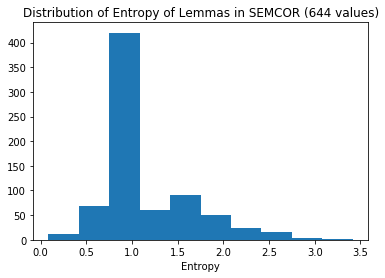

In [211]:
entropy_df = entropy_df[entropy_df['entropy'] != 0]
plt.hist(entropy_df['entropy'])
plt.title("Distribution of Entropy of Lemmas in SEMCOR (644 values)")
plt.xlabel("Entropy")

Merging the frequency & entropy dataframes.

In [212]:
sense_freqs = filtered_sense_freqs.groupby(['word', 'pos']).agg('count')
sense_freqs.drop('sense_num', axis = 1, inplace = True)
sense_freqs = sense_freqs.reset_index()
sense_totals = filtered_sense_freqs.groupby(['word', 'pos']).agg('sum')
sense_totals = sense_totals.reset_index()
entropy_df = entropy_df.merge(sense_freqs, on = ['word', 'pos']).rename({'freq': 'num_senses'}, axis = 1)
entropy_df = entropy_df.merge(sense_totals, on = ['word', 'pos'])
entropy_df.drop(['lemma'], inplace=True, axis = 1)

In [213]:
import nltk
from nltk.corpus import stopwords

In [214]:
entropy_df = entropy_df[~entropy_df['word'].isin(set(stopwords.words('english')))] #Remove stopwords
entropy_df

,word,pos,entropy,num_senses,freq
0,meet,v,3.416063,9,203
1,take,v,2.991901,21,639
2,give,v,2.989945,15,688
3,thing,n,2.911752,9,264
4,cover,v,2.882652,6,111
...,...,...,...,...,...
686,good,a,0.326969,2,167
687,desire,v,0.311274,1,22
688,hear,v,0.289079,3,291
689,equal,v,0.268878,1,13


Text(0.5, 1.0, 'Entropy vs. Log Frequency for 622 Highest-Entropy Words in SEMCOR')

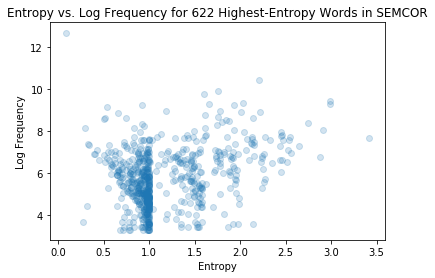

In [215]:
plt.scatter(entropy_df['entropy'], np.log2(entropy_df['freq']), alpha = 0.2)
plt.xlabel("Entropy")
plt.ylabel("Log Frequency")
plt.title("Entropy vs. Log Frequency for 622 Highest-Entropy Words in SEMCOR")

In [216]:
entropy_df.sort_values('entropy', ascending = False)[:10]

,word,pos,entropy,num_senses,freq
0,meet,v,3.416063,9,203
1,take,v,2.991901,21,639
2,give,v,2.989945,15,688
3,thing,n,2.911752,9,264
4,cover,v,2.882652,6,111
5,leave,v,2.748540,8,337
6,determine,v,2.650114,4,156
7,run,v,2.559574,5,126
8,reach,v,2.546207,6,213
9,continue,v,2.539021,3,191


In [217]:
entropy_df.to_csv('../data/semcor_entropy_revised_2.csv', index = False)